<h1>Intro to AI Project 1</h1>
<br>
The objective of this project is to employ a heuristic search algorithm to find an optimal path in a graph where certain nodes are blocked. There are two bonus objectives - 
1. Employ two heuristic algorithms to the same problem and analyse the results 
2. Use a second larger dataset to run the same algorithms with arbitrary start and end locations

In [468]:
# -------------------------------------------------------
# Project (include number)
# Written by (include your name and student id)
# For COMP 6721 Section (your lab section) – Fall 2019
#  -------------------------------------------------------


importing all dependencies

In [460]:
import timeit
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Polygon, Point
from geopandas.tools import overlay
from geopandas import GeoDataFrame
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from IPython import get_ipython
get_ipython().run_line_magic('matplotlib', 'inline')



reading shape file and getting the total bounds of the shape file

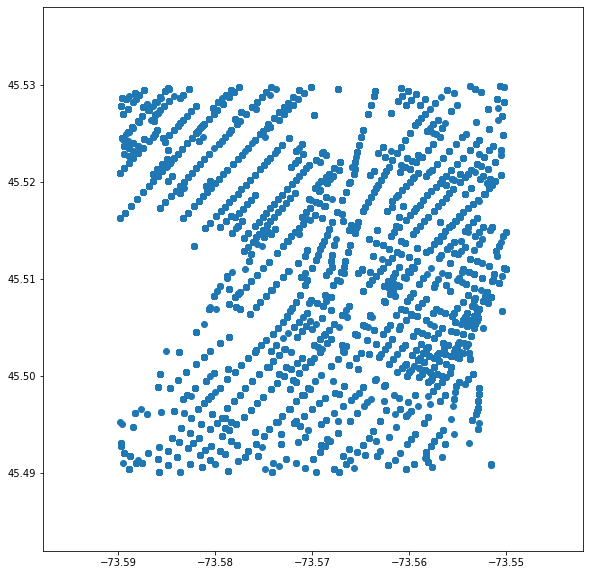

In [463]:
gdf = gpd.read_file('Shape/crime_dt.shp')
fig1,ax = plt.subplots(figsize = (10,10))
gdf.plot(ax = ax)

xmin,ymin,xmax,ymax =  gdf.total_bounds

Starting with width and height as 0.001 and calculating the number of rows and columns. crimeData list will store the number of points in each grid. polygon list will have all information of the geoseries of polygons or grids in order to be plotted

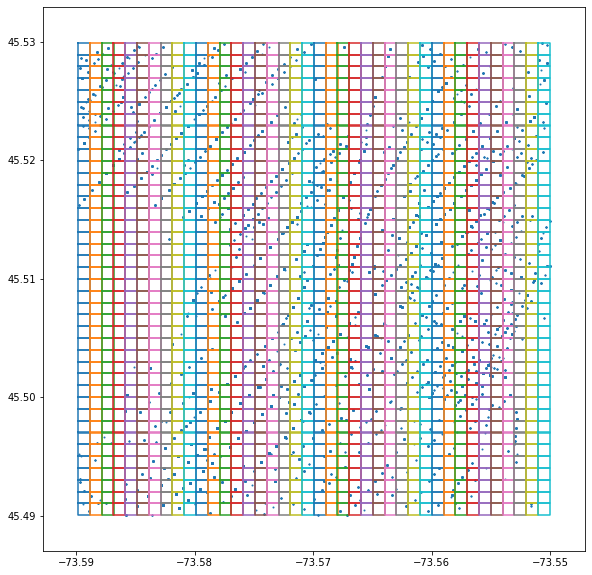

In [464]:
#function to return a dictionary of how many crime points are in each polygon grid
def generateCrimeData(xmin,xmax,ymin,ymax,width,height,gdf):
    rows = int(np.ceil((ymax-ymin) /  height))
    cols = int(np.ceil((xmax-xmin) / width))
    crimeData = []
    fig1,ax = plt.subplots(figsize = (10,10))
    gdf.plot(ax = ax, markersize = 1)
    for yCood in np.linspace(ymax,ymin+height,rows):
        for xCood in np.linspace(xmin,xmax-width,cols):
            p1 = Point(xCood,yCood)
            p2 = Point(xCood+width,yCood)
            p3 = Point(xCood+width,yCood-height)
            p4 = Point(xCood,yCood-height)
            pointList = [p1,p2,p3,p4]
            poly = Polygon([[p.x, p.y] for p in pointList])
            pts_in_this_poly = 0
            for pt in gdf.geometry :
                if pt.within(poly):
                    pts_in_this_poly += 1
            crimeData.append({"polygon" : poly, "points" : pts_in_this_poly})
            plt.plot(*poly.exterior.xy)
    return rows,cols,crimeData

width = 0.001
height = 0.001

rows, cols, crimeData = generateCrimeData(xmin,xmax,ymin,ymax,width,height,gdf)




The above algorithm is taking a long time. One alternative could be to sort the geodataframe from before so that while forming grids, we would need to search only a limited space of the search space instead of iterating throughout the series to find which points fall within this grid.

Calculating the mean, median and standard deviation of crime data

Mean :  12.0025  Median: 1.0  Standard deviation: 21.560815006627184


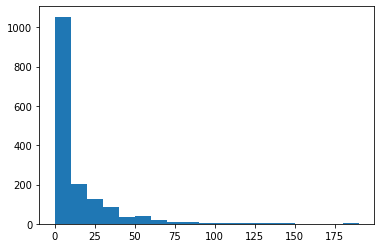

In [465]:
def generateStats(crimeData):
    dataset = [p.get("points") for p in crimeData]
    polygons = [p.get("polygon") for p in crimeData]
    mean = np.mean(dataset)
    median = np.median(dataset)
    std = np.std(dataset)
    print("Mean : ",mean," Median:",median," Standard deviation:",std)
    plt.hist(dataset, bins = np.arange(0,max(dataset),10))
    return mean,median,std,dataset,polygons
    
mean,median,std,dataset,polygons = generateStats(crimeData)


Plotting crime distribution across map

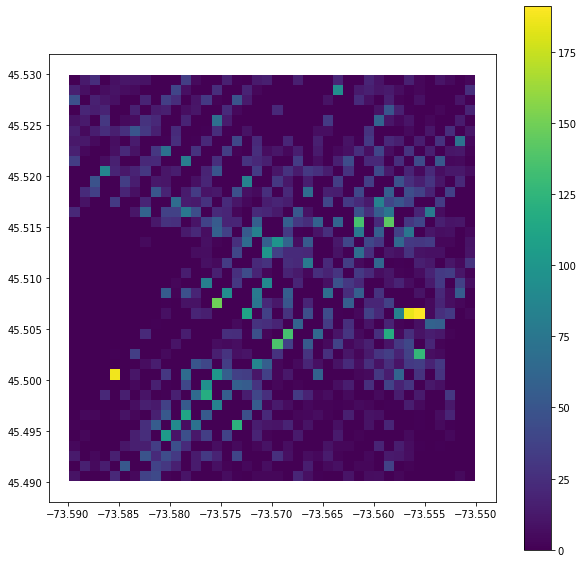

In [467]:
def plotCrimeDist(dataset, polygons):
    grid = gpd.GeoDataFrame({'crime points':dataset, 'geometry':polygons})
    fig,ax = plt.subplots(figsize = (10,10))
    grid.plot(column='crime points', ax = ax, legend = True)
    plt.show() 
    return grid
grid = plotCrimeDist(dataset,polygons)

In [283]:
thresh1 = median + (0.1 * (max(dataset) - median))
thresh2 = median + (0.2 * (max(dataset) - median))
thresh3 = median + (0.3 * (max(dataset) - median))
thresholds = [thresh1, thresh2, thresh3]
print("Thresholds : ",thresh1,thresh2,thresh3)

Thresholds :  20.0 39.0 58.0


Using three thresholds - 10% above median, 20% above the median, 30% above the median

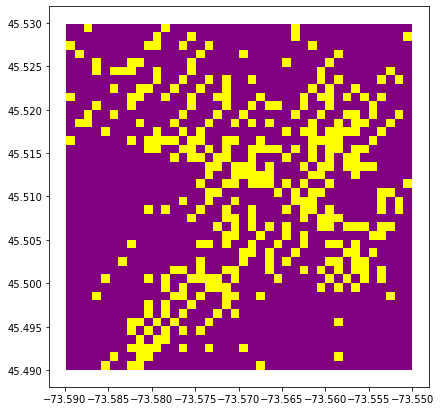

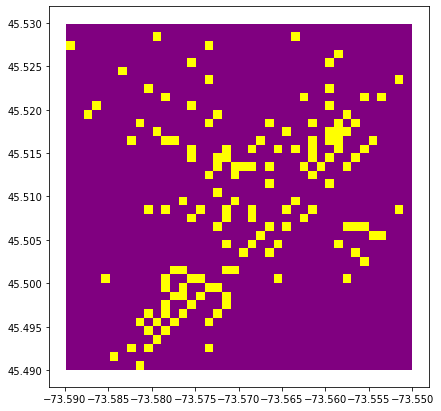

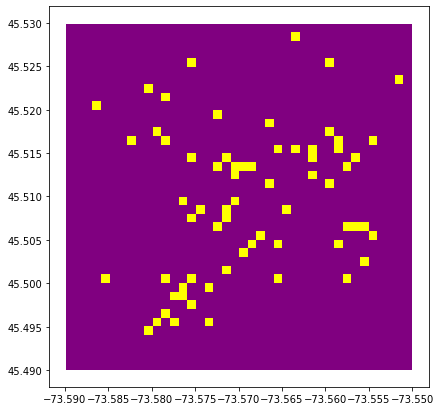

In [284]:
def generateGrids(grid,thresh1,thresh2,thresh3,rows,cols):
    grid['thresh1'] = np.zeros(len(grid))
    grid['thresh2'] = np.zeros(len(grid))
    grid['thresh3'] = np.zeros(len(grid))
    grid1 = np.zeros((rows,cols))
    grid2 = np.zeros((rows,cols))
    grid3 = np.zeros((rows,cols))
    for index,row in grid.iterrows():
        x = int(np.floor(index/cols))
        y = int(index - x*cols)
        if row['crime points'] >= thresh3 :
            grid.loc[index,'thresh3'] = 1.0
            grid3[x][y] = 1
        if row['crime points'] >= thresh2 :
            grid.loc[index,'thresh2'] = 1.0
            grid2[x][y] = 1
        if row['crime points'] >= thresh1 :
            grid.loc[index,'thresh1'] = 1.0
            grid1[x][y] = 1

    cmap = LinearSegmentedColormap.from_list('mycmap', [(0, 'purple'), (1, 'yellow')])
    fig2,ax = plt.subplots(figsize = (7,7))
    grid.plot(column='thresh1', ax = ax, cmap=cmap)
    fig3,ax = plt.subplots(figsize = (7,7))
    grid.plot(column = 'thresh2', ax = ax, cmap = cmap)
    fig4,ax = plt.subplots(figsize = (7,7))
    grid.plot(column = 'thresh3', ax = ax, cmap = cmap)
    return grid1,grid2,grid3

grid1,grid2,grid3 = generateGrids(grid,thresh1,thresh2,thresh3,rows,cols)

    

Heuristic 1 : 
Modified A* algorithm.
<br>
Theory : Since traversal is along the edges, we can refer to each intersection or corner of a cell as a node. The starting and destination nodes are the bottom left corner of the cell containing the starting and destination locations. Therefore, the map can be extended to include a layer of cells on top and on the right to designate the intersections at the edge. This can also be explained by simply referencing to each node as the bottom left corner of the cell containing that location (combination of latitude and longitude) since no two cells would share the same node. Starting from the source node, there are 8 maximum possible nodes to be traversed. Among these, the node with the minimum heuristic will be selected as the next node. The heuristic f(n) to be used for selecting the next node n can be a combination of the ditance from source node to the current node n (g(n)), estimated distance from current node n to destination (h(n)) and cost associated with path due to crime (i(n)). It must be noted that this algorithm does not guarantee the shortest path if h(n) is more than the actual cost to reach goal, i.e., the manhattan distance is more than the cost to traverse the actual path. This will almost never occur in this context because of the following two scenarios:
    1. There exists no high crime blocks between the current node n and destination and therefore, it is natural to cut diagonally through all the cells in between. In this case, h(n) is a 100% accurate estimation of the distance between n and goal. Therefore, A* will only follow best path, thereby making it very fast.
    2. There exists high crime blocks between the current node n and destination and therefore, the actual path covered will always be more than the manhattan distance since f(n) also constitutes i(n) which is a measure of cost due to crime. 
    

Reference - http://theory.stanford.edu/~amitp/GameProgramming/Heuristics.html

Steps involved - 
    1. Initialise two lists - open and closed lists for nodes visited but not traversed and for nodes in the path till now respectively
    2. Start with the source node and append this to open list as this is already visited
    3. Loop while the open list is not empty : 
        3.1. Pop the node with minimum f (let this be current node) from open list and find out its valid successors (adjacent nodes)
        3.2. Calculate f for each successor node
        3.3. If this successor node is the destination node - trace back path and break from loop
        3.4. If the same successor node exists on open list with lower f - skip this node
        3.5. If the same successor node exists on closed list with lower f - skip this node, otherwise add to open list
        3.6. Append the current node to closed list
        3.7. End while loop
    
    

In [295]:
#class Node for graph traversal
class Node1():
    def __init__(self, position, parent = None):
        self.parent = parent
        self.position = position
        self.g = self.h = self.i = 0
        
    #two nodes are equal if they are located at the same position
    def __eq__(self, other):
        return self.position[0] == other.position[0] and self.position[1] == other.position[1]


#function to return node with minimum f from open list
def minF(openList):
    currentNode = openList[0]
    currentIndex = 0
    for index,item in enumerate(openList):
        if item.f < currentNode.f:
            currentNode = item
            currentIndex = index
    return currentIndex


#function to check if a node is within the boundary of map or not
def checkOnMap(pos,rows,cols):
    if pos[0] >=-1 and pos[0]<rows and pos[1]>=0 and pos[1]<=cols:
        return True
    else:
        return False

#function to return possible positions
def findPositions(currentNode):
    positions = [(0,1,currentNode.position[0],currentNode.position[1],currentNode.position[0]+1,currentNode.position[1]),
                     (0,-1,currentNode.position[0],currentNode.position[1]-1,currentNode.position[0]+1,currentNode.position[1]-1),
                     (1,0,currentNode.position[0]+1,currentNode.position[1],currentNode.position[0]+1,currentNode.position[1]-1),
                     (-1,0,currentNode.position[0],currentNode.position[1],currentNode.position[0],currentNode.position[1]-1),
                     (1,1,currentNode.position[0]+1,currentNode.position[1],-10,-10),
                     (1,-1,currentNode.position[0]+1,currentNode.position[1]-1,-10,-10),
                     (-1,1,currentNode.position[0],currentNode.position[1],-10,-10),
                     (-1,-1,currentNode.position[0],currentNode.position[1]-1,-10,-10)]
    return positions

    
#function to return the path and associated cost
def astar(maze, start, end, crimeWeightage = 1):
    
    #initialise open and closed lists, start and end nodes
    openList = []
    closedList = []
    startNode = Node1(start)
    endNode = Node1(end)
    startNode.h = startNode.f = (startNode.position[0]-endNode.position[0])**2 + (startNode.position[1]-endNode.position[1])**2
    openList.append(startNode)
    print("initialisation done")
    
    #loop until open list is empty
    while len(openList)>0:
        #pop the node with minimum f from open list
        currentIndex = minF(openList)
        currentNode = openList.pop(currentIndex)
        print("current node: ",currentNode.position[0]," ",currentNode.position[1])
        #find valid successors
        children = []
        positions = findPositions(currentNode)
        for pos in positions:
            newNodePos = [currentNode.position[0]+pos[0], currentNode.position[1]+pos[1]]
            print("Possible new node at corner of:",newNodePos[0]," ",newNodePos[1])
            adjNodePos1 = [pos[2], pos[3]]
            adjNodePos2 = [pos[4], pos[5]]
            newNodeI = 0
            #skip if node does not exist on map
            if not checkOnMap(newNodePos,len(maze),len(maze[0])):
                print("out of boundary -- skipped")
                continue
            #make sure if node is obstacle or not (high crime area)
            if pos[4] == -10 and pos[5] == -10:
                #for diagonal path, the cell containing path is already verified as existing on map by previous if clause
                #therefore, simply check if this cell containing the path is obstacle or not
                #if no obstacle, designate i as 1.5
                print("diagonal path through ",pos[2]," ",pos[3])
                if not checkOnMap(adjNodePos1,len(maze),len(maze[0])):
                    print("            out of boundary -- skipped")
                    continue
                if maze[pos[2]][pos[3]] == 1:
                    print("            -- obstacle")
                    continue
                else:
                    print("            -- i : 1.5")
                    newNodeI = 1.5
            elif checkOnMap(adjNodePos1, len(maze), len(maze[0])) and checkOnMap(adjNodePos2, len(maze), len(maze[0])):
                #for non-diagonal paths, first check if the adjacent cells exist or not on map
                #if they exist, then designate i accordingly, otherwise skip
                temp = maze[pos[2]][pos[3]]+maze[pos[4]][pos[5]]
                print("straight path from corner of ",pos[2]," ",pos[3]," to corner of ",pos[4]," ",pos[5],)
                if temp == 0:#no obstacles on either cells
                    newNodeI = 1
                    print("            -- i : 1")
                elif temp == 1:#obstacle on one cell
                    newNodeI = 1.3
                    print("            -- i : 1.3")
                elif temp == 2:#obstacle on both cells
                    print("            -- obstacle")
                    continue
            else:
                #path is along edge if both adjacent cells don't exist on map
                print("straight path along edge from corner of ",pos[2]," ",pos[3]," to corner of ",pos[4]," ",pos[5],"-- skipping")
                continue
            #create new node and determine its g,h,i,f heuristics
            newNode = Node1(newNodePos,currentNode)
            newNode.g = currentNode.g + 1
            newNode.i = newNodeI * crimeWeightage
            newNode.h = (newNode.position[0]-endNode.position[0])**2 + (newNode.position[1]-endNode.position[1])**2
            newNode.f = newNode.g + newNode.h + newNode.i
            children.append(newNode)
        #iterate for each successor     
        for child in children:
            print("exploring child at ",child.position[0]," ",child.position[1])
            #if successor is the end node, then break and trace path
            if child==endNode:
                path = []
                cost = 0
                current = child
                while current is not None:
                    path.append(current.position)
                    cost = cost + current.i
                    current = current.parent
                print("goal found -- returning path")
                path.append(cost)
                return path[::-1] 
            #if successor is in open list with lower f, skip
            found = False
            for openNode in openList:
                if openNode==child and openNode.f<child.f :
                    found = True
                    break
            if found:
                print("child found in open list with lower f -- skipping")
                continue
            #if successor exists in closed list with lower f, then skip otherwise add to open list
            found = False
            for closedNode in closedList:
                if closedNode==child and closedNode.f<child.f :
                    found = True
                    break
            if found:
                print("child found in closed list with lower f -- skipping")
                continue
            else:
                print("child not found in any list -- adding to open list")
                openList.append(child)
        print("adding current node to closed list")
        closedList.append(currentNode)
    
    

In [296]:
start = [rows-1, cols-1]
end = [0, 0]
startTime = timeit.default_timer()
path1HighCrimeWeightage = astar(grid1, start, end, 20)
stopTime = timeit.default_timer()
path1HighCrimeTime = stopTime - startTime
startTime = timeit.default_timer()
path1LowCrimeWeightage = astar(grid1, start, end)
stopTime = timeit.default_timer()
path1LowCrimeTime = stopTime-startTime
startTime = timeit.default_timer()
path2 = astar(grid2, start, end)
stopTime = timeit.default_timer()
path2Time = stopTime - startTime
startTime = timeit.default_timer()
path3 = astar(grid3, start, end)
stopTime = timeit.default_timer()
path3Time = stopTime - startTime

initialisation done
current node:  39   39
Possible new node at corner of: 39   40
straight path along edge from corner of  39   39  to corner of  40   39 -- skipping
Possible new node at corner of: 39   38
straight path along edge from corner of  39   38  to corner of  40   38 -- skipping
Possible new node at corner of: 40   39
out of boundary -- skipped
Possible new node at corner of: 38   39
straight path from corner of  39   39  to corner of  39   38
            -- i : 1
Possible new node at corner of: 40   40
out of boundary -- skipped
Possible new node at corner of: 40   38
out of boundary -- skipped
Possible new node at corner of: 38   40
diagonal path through  39   39
            -- i : 1.5
Possible new node at corner of: 38   38
diagonal path through  39   38
            -- i : 1.5
exploring child at  38   39
child not found in any list -- adding to open list
exploring child at  38   40
child not found in any list -- adding to open list
exploring child at  38   38
child not fo

Possible new node at corner of: 19   21
diagonal path through  19   20
            -- i : 1.5
Possible new node at corner of: 19   19
diagonal path through  19   19
            -- i : 1.5
Possible new node at corner of: 17   21
diagonal path through  18   20
            -- i : 1.5
Possible new node at corner of: 17   19
diagonal path through  18   19
            -- obstacle
exploring child at  18   21
child found in open list with lower f -- skipping
exploring child at  18   19
child not found in any list -- adding to open list
exploring child at  19   20
child found in open list with lower f -- skipping
exploring child at  17   20
child not found in any list -- adding to open list
exploring child at  19   21
child found in closed list with lower f -- skipping
exploring child at  19   19
child not found in any list -- adding to open list
exploring child at  17   21
child not found in any list -- adding to open list
adding current node to closed list
current node:  18   19
Possible new 

child not found in any list -- adding to open list
exploring child at  5   5
child found in open list with lower f -- skipping
exploring child at  3   5
child not found in any list -- adding to open list
adding current node to closed list
current node:  3   4
Possible new node at corner of: 3   5
straight path from corner of  3   4  to corner of  4   4
            -- i : 1
Possible new node at corner of: 3   3
straight path from corner of  3   3  to corner of  4   3
            -- i : 1.3
Possible new node at corner of: 4   4
straight path from corner of  4   4  to corner of  4   3
            -- i : 1.3
Possible new node at corner of: 2   4
straight path from corner of  3   4  to corner of  3   3
            -- i : 1
Possible new node at corner of: 4   5
diagonal path through  4   4
            -- i : 1.5
Possible new node at corner of: 4   3
diagonal path through  4   3
            -- obstacle
Possible new node at corner of: 2   5
diagonal path through  3   4
            -- i : 1.5
P

Possible new node at corner of: 24   23
straight path from corner of  24   23  to corner of  24   22
            -- i : 1.3
Possible new node at corner of: 22   23
straight path from corner of  23   23  to corner of  23   22
            -- i : 1.3
Possible new node at corner of: 24   24
diagonal path through  24   23
            -- i : 1.5
Possible new node at corner of: 24   22
diagonal path through  24   22
            -- obstacle
Possible new node at corner of: 22   24
diagonal path through  23   23
            -- obstacle
Possible new node at corner of: 22   22
diagonal path through  23   22
            -- i : 1.5
exploring child at  23   24
child found in open list with lower f -- skipping
exploring child at  23   22
child not found in any list -- adding to open list
exploring child at  24   23
child found in closed list with lower f -- skipping
exploring child at  22   23
child not found in any list -- adding to open list
exploring child at  24   24
child found in open list with 

child found in open list with lower f -- skipping
exploring child at  6   2
child not found in any list -- adding to open list
exploring child at  7   3
child found in open list with lower f -- skipping
exploring child at  5   3
child not found in any list -- adding to open list
exploring child at  7   4
child found in closed list with lower f -- skipping
exploring child at  7   2
child not found in any list -- adding to open list
exploring child at  5   4
child not found in any list -- adding to open list
exploring child at  5   2
child not found in any list -- adding to open list
adding current node to closed list
current node:  5   2
Possible new node at corner of: 5   3
straight path from corner of  5   2  to corner of  6   2
            -- i : 1
Possible new node at corner of: 5   1
straight path from corner of  5   1  to corner of  6   1
            -- i : 1
Possible new node at corner of: 6   2
straight path from corner of  6   2  to corner of  6   1
            -- i : 1
Possibl

Possible new node at corner of: 20   17
diagonal path through  20   17
            -- i : 1.5
Possible new node at corner of: 18   19
diagonal path through  19   18
            -- i : 1.5
Possible new node at corner of: 18   17
diagonal path through  19   17
            -- obstacle
exploring child at  19   19
child found in open list with lower f -- skipping
exploring child at  19   17
child not found in any list -- adding to open list
exploring child at  20   18
child found in open list with lower f -- skipping
exploring child at  18   18
child not found in any list -- adding to open list
exploring child at  20   19
child found in closed list with lower f -- skipping
exploring child at  20   17
child not found in any list -- adding to open list
exploring child at  18   19
child not found in any list -- adding to open list
adding current node to closed list
current node:  18   18
Possible new node at corner of: 18   19
straight path from corner of  18   18  to corner of  19   18
      

child found in closed list with lower f -- skipping
exploring child at  0   1
child not found in any list -- adding to open list
exploring child at  2   2
child found in open list with lower f -- skipping
exploring child at  0   2
child not found in any list -- adding to open list
exploring child at  0   0
goal found -- returning path
initialisation done
current node:  39   39
Possible new node at corner of: 39   40
straight path along edge from corner of  39   39  to corner of  40   39 -- skipping
Possible new node at corner of: 39   38
straight path along edge from corner of  39   38  to corner of  40   38 -- skipping
Possible new node at corner of: 40   39
out of boundary -- skipped
Possible new node at corner of: 38   39
straight path from corner of  39   39  to corner of  39   38
            -- i : 1
Possible new node at corner of: 40   40
out of boundary -- skipped
Possible new node at corner of: 40   38
out of boundary -- skipped
Possible new node at corner of: 38   40
diagonal 

exploring child at  19   19
child not found in any list -- adding to open list
exploring child at  21   20
child found in open list with lower f -- skipping
exploring child at  19   18
child not found in any list -- adding to open list
adding current node to closed list
current node:  19   18
Possible new node at corner of: 19   19
straight path from corner of  19   18  to corner of  20   18
            -- i : 1
Possible new node at corner of: 19   17
straight path from corner of  19   17  to corner of  20   17
            -- i : 1
Possible new node at corner of: 20   18
straight path from corner of  20   18  to corner of  20   17
            -- i : 1
Possible new node at corner of: 18   18
straight path from corner of  19   18  to corner of  19   17
            -- i : 1
Possible new node at corner of: 20   19
diagonal path through  20   18
            -- i : 1.5
Possible new node at corner of: 20   17
diagonal path through  20   17
            -- i : 1.5
Possible new node at corner of

The crime weightage factor is not having much affect unless increased to a significant amount since the manhattan distance is far more than cost weightage which is of the order of 1 or 1.3 or 1.5 for each traversal. Therefore, we need to analyze the magnitudes of g and h throughtout the execution to get an idea of the suitable crime weightage. We can assume that in the beginning, h(n) plays a more siginficant role in the heuristic since it is a sum of two squares whereas g systematically increases by 1 with each traversal. Since the start and end nodes in this case are the two diagonally opposite corners of the grid, h(n) ranges from 1 to 98 and g(n) ranges roughly from 1 to 56.4. Hence, we can expermient with a crime weightage of 20 to see a visible difference. This analysis is worthwhile to be conducted only for the lowest threshold of crime rate since the other two thresholds indicate a clear optimal path betwen the start and destinaiton nodes.

In [297]:
print("Number of steps for high crime weightage : ",len(path1HighCrimeWeightage), ", Number of steps for low crime weightage :",len(path1Original))

Number of steps for high crime weightage :  54 , Number of steps for low crime weightage : 50


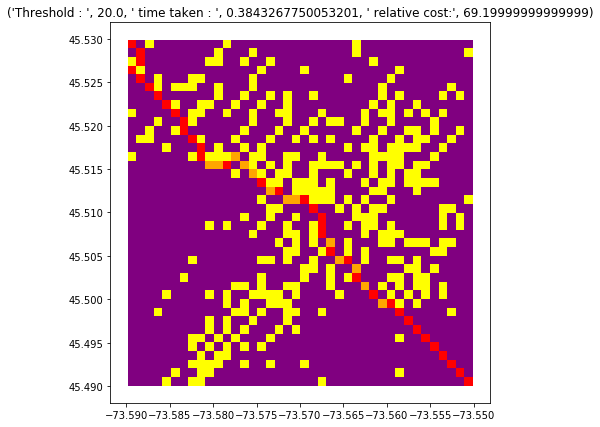

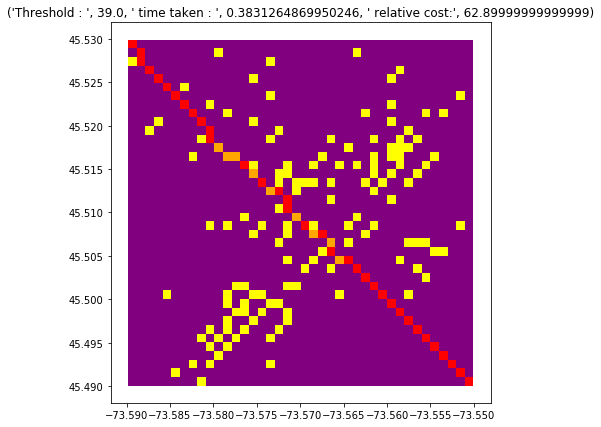

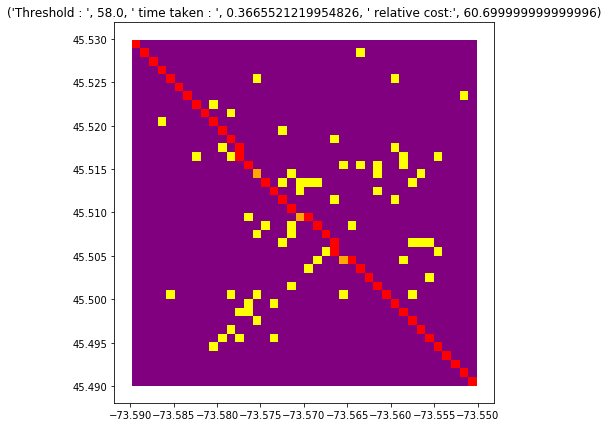

In [422]:
def plotPath(grid,path1Time,path2Time,path3Time,path1=[],path2=[],path3=[]):
    grid['path1'] = np.zeros(len(grid))
    grid['path2'] = np.zeros(len(grid))
    grid['path3'] = np.zeros(len(grid))
    for index,row in grid.iterrows():
        grid.loc[index,'path1'] = row['thresh1']
        grid.loc[index,'path2'] = row['thresh2']
        grid.loc[index,'path3'] = row['thresh3']
    for index,item in enumerate(path1[1:]):
        indexActual = item[0]*rows + item[1]
        if grid.loc[indexActual,'path1'] == 1:
            grid.loc[indexActual,'path1'] = 0.75
        else:
            grid.loc[indexActual,'path1'] = 0.25
    for index,item in enumerate(path2[1:]):
        indexActual = item[0]*rows + item[1]
        if grid.loc[indexActual,'path2'] == 1:
            grid.loc[indexActual,'path2'] = 0.75
        else:
            grid.loc[indexActual,'path2'] = 0.25
    for index,item in enumerate(path3[1:]):
        indexActual = item[0]*rows + item[1]
        if grid.loc[indexActual,'path3'] == 1:
            grid.loc[indexActual,'path3'] = 0.75
        else:
            grid.loc[indexActual,'path3'] = 0.25
    cmap = LinearSegmentedColormap.from_list('mycmap', [(0, 'purple'), (0.25, 'red'), (0.75, 'orange'), (1, 'yellow')])
    fig2,ax = plt.subplots(figsize = (7,7))
    ax.set_title(("Threshold : ",thresh1," time taken : ",path1Time, " relative cost:",path1[0]))
    grid.plot(column='path1', ax = ax, cmap=cmap)
    fig3,ax = plt.subplots(figsize = (7,7))
    ax.set_title(("Threshold : ",thresh2," time taken : ",path2Time, " relative cost:",path2[0]))
    grid.plot(column='path2', ax = ax, cmap=cmap)
    fig4,ax = plt.subplots(figsize = (7,7))
    ax.set_title(("Threshold : ",thresh3," time taken : ",path3Time, " relative cost:",path3[0]))
    grid.plot(column='path3', ax = ax, cmap=cmap)
    

plotPath(grid,path1LowCrimeTime,path2Time,path3Time,path1LowCrimeWeightage,path2,path3)



Heuristic 2 : Dijsktra's algorithm
Steps :
    1. Set current node as source node with heuristic as 0
    2. Maintain an open list for nodes that are visited but not traversed and a closed list for nodes that are traversed in the path. Add the source node to open list.
    3. Loop till open list is not empty
    4. Pop the current node from open list and push to closed list
    5. Find all valid neighbours (validity extends to obstacless) and assign their heuristic as cost from current node to this node. Assignment will only take place if this is the first assignment or the heuristic to be assigned is lower than existing heuristic of that node. All valid neighbours are added to open list. The heuristic is a measure of the distance from the current node + the existing distance of the current node from the source node.
    6. If a neighbour is found to be the goal : break and return path
    7. Select the neighbour with best heuristic and add to closed list. Make this the next current node and iterate

In [450]:
class Node2():
    def __init__(self,position,f=math.inf,parent=None):
        self.position = position
        self.f = f
        self.parent = parent
    def __eq__(self,other):
        return self.position == other.position
    

 
def findNeighbors(current, maze):
    neighbors = []
    x = current.position[0]
    y = current.position[1]
    n = [x-1,y,x,y-1,x,y]
    s = [x+1,y,x+1,y-1,x+1,y]
    e = [x,y+1,x,y,x+1,y]
    w = [x,y-1,x,y-1,x+1,y-1]
    ne = [x-1,y+1,x,y]
    nw = [x-1,y-1,x,y-1]
    se = [x+1,y+1,x+1,y]
    sw = [x+1,y-1,x+1,y-1]
    straight = [n,s,e,w]
    diagonal = [ne,nw,se,sw]
    for position in [n,s,e,w,ne,nw,se,sw]:
        if position[0]<-1 or position[0]>=len(maze) or position[1]<0 or position[1]>len(maze[0]):
            #out of boundary
            continue
        elif position in straight :
            if (position[0]==current.position[0] and (position[0]==-1 or position[0]==len(maze)-1)) or (position[1]==current.position[1] and (position[1]==0 or position[1]==len(maze[0]))):
                #edge route
                continue
            elif maze[position[2]][position[3]]==1 and maze[position[4]][position[5]]==1:
                #both adjacent cells are obstacles
                continue
            elif maze[position[2]][position[3]]==1 or maze[position[4]][position[5]]==1:
                #one of the adjacent cells is an obstacle
                neighbors.append([position[0],position[1],1.3])
            else:
                #both adjacent cells are free
                neighbors.append([position[0],position[1],1])
        elif position in diagonal :
            if maze[position[2]][position[3]]==1:
                #diagonal path through obstacl
                continue
            else:
                #diagonal path through free cell
                neighbors.append([position[0],position[1],1.5])
    return neighbors
 
  
 
def dijsktra(maze,start,end):
    startNode = Node2(start,0)
    endNode = Node2(end)
    unvisited = []
    visited = []
    unvisited.append(startNode)
    unvisited.append(endNode)
    print("initialisation done")
 
    while len(visited)!= (len(maze)*len(maze[0]) + len(maze) + len(maze[0])):
        #if no more unvisited nodes : no path found
        if len(unvisited) == 0:
            print("No path found")
            return -1
        #find current node with minimum heuristic
        current = unvisited[0]
        for node in unvisited:
            if node.f < current.f :
                current = node
        unvisited.remove(current)
        #if this node is end node :  retrace path
        if current == endNode:
            print("Goal found!")
            temp = current
            path = []
            while temp is not None:
                path.append(temp.position)
                temp = temp.parent
            path.append(current.f)
            return path[::-1]
        print("Current node : ",current.position," f:",current.f)
        
        neighbors = findNeighbors(current,maze)
        for node in neighbors:
            newNode = Node2([node[0],node[1]],current.f+node[2],current)
            print("new neighbouring node:",newNode.position,newNode.f)
            
            if newNode == endNode:
                print("Goal found!")
                temp = newNode
                path = []
                while temp is not None:
                    path.append(temp.position)
                    temp = temp.parent
                path.append(newNode.f)
                return path[::-1]
 
            elif newNode in visited:
                print("     -- but this node is visited")
                continue
 
            elif newNode in unvisited:
                index = unvisited.index(newNode)
                if unvisited[index].f > newNode.f:
                    print("   -- but this node had a higher heuristic before : modifying")
                    unvisited[index] = newNode
 
            else:
                print("     -- adding new node to unvisited list")
                unvisited.append(newNode)
        
        print("current is now visited")   
        visited.append(current)


In [321]:
end = [0,0]
start = [39,39]
startTime = timeit.default_timer()
path1b = dijsktra(grid1, start, end)
stopTime = timeit.default_timer()
path1bTime = stopTime - startTime
startTime = timeit.default_timer()
path2b = dijsktra(grid2,start,end)
stopTime = timeit.default_timer()
path2bTime = stopTime - startTime
startTime = timeit.default_timer()
path3b = dijsktra(grid3,start,end)
stopTime = timeit.default_timer()
path3bTime = stopTime - startTime

initialisation done
Current node :  [39, 39]  f: 0
new neighbouring node: [38, 39] 1
     -- adding new node to unvisited list
new neighbouring node: [38, 40] 1.5
     -- adding new node to unvisited list
new neighbouring node: [38, 38] 1.5
     -- adding new node to unvisited list
current is now visited
Current node :  [38, 39]  f: 1
new neighbouring node: [37, 39] 2
     -- adding new node to unvisited list
new neighbouring node: [39, 39] 2
     -- but this node is visited
new neighbouring node: [38, 40] 2
new neighbouring node: [38, 38] 2
new neighbouring node: [37, 40] 2.5
     -- adding new node to unvisited list
new neighbouring node: [37, 38] 2.5
     -- adding new node to unvisited list
new neighbouring node: [39, 40] 2.5
     -- adding new node to unvisited list
new neighbouring node: [39, 38] 2.5
     -- adding new node to unvisited list
current is now visited
Current node :  [38, 40]  f: 1.5
new neighbouring node: [38, 39] 2.5
     -- but this node is visited
new neighbourin

new neighbouring node: [32, 33] 12.0
     -- but this node is visited
new neighbouring node: [31, 34] 12.0
     -- but this node is visited
new neighbouring node: [31, 32] 12.0
new neighbouring node: [30, 34] 12.5
new neighbouring node: [30, 32] 12.5
     -- adding new node to unvisited list
new neighbouring node: [32, 34] 12.5
     -- but this node is visited
new neighbouring node: [32, 32] 12.5
     -- but this node is visited
current is now visited
Current node :  [30, 35]  f: 11.0
new neighbouring node: [29, 35] 12.0
new neighbouring node: [31, 35] 12.0
     -- but this node is visited
new neighbouring node: [30, 36] 12.0
     -- but this node is visited
new neighbouring node: [30, 34] 12.0
new neighbouring node: [29, 36] 12.5
new neighbouring node: [29, 34] 12.5
     -- adding new node to unvisited list
new neighbouring node: [31, 36] 12.5
     -- but this node is visited
new neighbouring node: [31, 34] 12.5
     -- but this node is visited
current is now visited
Current node :  [

new neighbouring node: [23, 39] 17.0
new neighbouring node: [23, 37] 17.0
     -- adding new node to unvisited list
new neighbouring node: [25, 39] 17.0
     -- but this node is visited
new neighbouring node: [25, 37] 17.0
     -- but this node is visited
current is now visited
Current node :  [36, 25]  f: 15.5
new neighbouring node: [35, 25] 16.5
new neighbouring node: [37, 25] 16.5
     -- but this node is visited
new neighbouring node: [36, 26] 16.5
     -- but this node is visited
new neighbouring node: [36, 24] 16.5
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [35, 26] 17.0
     -- but this node is visited
new neighbouring node: [35, 24] 17.0
     -- adding new node to unvisited list
new neighbouring node: [37, 26] 17.0
     -- but this node is visited
new neighbouring node: [37, 24] 17.0
current is now visited
Current node :  [26, 35]  f: 15.600000000000001
new neighbouring node: [25, 35] 16.900000000000002
new neighbouring node: [27, 35] 1

new neighbouring node: [23, 31] 20.900000000000002
     -- adding new node to unvisited list
new neighbouring node: [25, 33] 20.900000000000002
current is now visited
Current node :  [25, 33]  f: 19.400000000000002
new neighbouring node: [24, 33] 20.700000000000003
     -- but this node is visited
new neighbouring node: [25, 32] 20.700000000000003
     -- but this node is visited
new neighbouring node: [24, 32] 20.900000000000002
     -- but this node is visited
current is now visited
Current node :  [39, 22]  f: 19.400000000000002
new neighbouring node: [38, 22] 20.700000000000003
     -- but this node is visited
new neighbouring node: [38, 21] 20.900000000000002
     -- but this node is visited
current is now visited
Current node :  [25, 28]  f: 19.5
new neighbouring node: [24, 28] 20.8
new neighbouring node: [26, 28] 20.5
     -- but this node is visited
new neighbouring node: [25, 29] 20.5
     -- but this node is visited
new neighbouring node: [25, 27] 20.8
new neighbouring node: 

new neighbouring node: [33, 20] 24.0
     -- but this node is visited
new neighbouring node: [33, 18] 24.0
     -- adding new node to unvisited list
new neighbouring node: [35, 20] 24.0
     -- but this node is visited
new neighbouring node: [35, 18] 24.0
current is now visited
Current node :  [22, 28]  f: 22.5
new neighbouring node: [21, 28] 23.8
new neighbouring node: [23, 28] 23.5
     -- but this node is visited
new neighbouring node: [22, 29] 23.5
     -- but this node is visited
new neighbouring node: [22, 27] 23.8
new neighbouring node: [21, 29] 24.0
new neighbouring node: [23, 29] 24.0
     -- but this node is visited
new neighbouring node: [23, 27] 24.0
current is now visited
Current node :  [20, 33]  f: 22.6
new neighbouring node: [19, 33] 23.6
new neighbouring node: [21, 33] 23.6
     -- but this node is visited
new neighbouring node: [20, 34] 23.6
     -- but this node is visited
new neighbouring node: [20, 32] 23.6
new neighbouring node: [19, 34] 24.1
new neighbouring node

     -- but this node is visited
new neighbouring node: [39, 14] 26.6
     -- adding new node to unvisited list
current is now visited
Current node :  [22, 25]  f: 25.3
new neighbouring node: [21, 25] 26.3
new neighbouring node: [23, 25] 26.6
     -- but this node is visited
new neighbouring node: [22, 26] 26.6
     -- but this node is visited
new neighbouring node: [22, 24] 26.3
new neighbouring node: [21, 26] 26.8
     -- but this node is visited
new neighbouring node: [21, 24] 26.8
     -- adding new node to unvisited list
new neighbouring node: [23, 24] 26.8
     -- but this node is visited
current is now visited
Current node :  [15, 40]  f: 25.400000000000002
new neighbouring node: [15, 39] 26.400000000000002
     -- but this node is visited
new neighbouring node: [14, 39] 26.900000000000002
new neighbouring node: [16, 39] 26.900000000000002
     -- but this node is visited
current is now visited
Current node :  [21, 25]  f: 25.5
new neighbouring node: [20, 25] 26.8
     -- adding

current is now visited
Current node :  [18, 29]  f: 27.900000000000002
new neighbouring node: [17, 29] 28.900000000000002
new neighbouring node: [18, 30] 29.200000000000003
     -- but this node is visited
new neighbouring node: [18, 28] 29.200000000000003
     -- adding new node to unvisited list
new neighbouring node: [17, 30] 29.400000000000002
     -- but this node is visited
new neighbouring node: [17, 28] 29.400000000000002
     -- adding new node to unvisited list
current is now visited
Current node :  [24, 20]  f: 27.900000000000002
new neighbouring node: [23, 20] 29.200000000000003
new neighbouring node: [25, 20] 28.900000000000002
     -- but this node is visited
new neighbouring node: [24, 21] 28.900000000000002
     -- but this node is visited
new neighbouring node: [24, 19] 29.200000000000003
new neighbouring node: [23, 21] 29.400000000000002
     -- but this node is visited
new neighbouring node: [25, 21] 29.400000000000002
new neighbouring node: [25, 19] 29.4000000000000

     -- but this node is visited
new neighbouring node: [12, 33] 31.400000000000002
new neighbouring node: [11, 35] 31.6
new neighbouring node: [13, 35] 31.6
     -- but this node is visited
new neighbouring node: [13, 33] 31.6
current is now visited
Current node :  [34, 12]  f: 30.1
new neighbouring node: [33, 12] 31.400000000000002
new neighbouring node: [35, 12] 31.400000000000002
     -- but this node is visited
new neighbouring node: [34, 13] 31.400000000000002
     -- but this node is visited
new neighbouring node: [34, 11] 31.400000000000002
     -- adding new node to unvisited list
new neighbouring node: [33, 11] 31.6
     -- adding new node to unvisited list
new neighbouring node: [35, 13] 31.6
     -- but this node is visited
current is now visited
Current node :  [17, 24]  f: 30.1
new neighbouring node: [16, 24] 31.400000000000002
new neighbouring node: [18, 24] 31.400000000000002
     -- but this node is visited
new neighbouring node: [17, 25] 31.1
     -- but this node is 

new neighbouring node: [23, 15] 33.5
     -- but this node is visited
new neighbouring node: [22, 16] 33.5
     -- but this node is visited
new neighbouring node: [22, 14] 33.8
new neighbouring node: [21, 16] 34.0
new neighbouring node: [23, 16] 34.0
     -- but this node is visited
new neighbouring node: [23, 14] 34.0
current is now visited
Current node :  [24, 14]  f: 32.5
new neighbouring node: [23, 14] 33.5
new neighbouring node: [25, 14] 33.5
     -- but this node is visited
new neighbouring node: [24, 15] 33.5
     -- but this node is visited
new neighbouring node: [24, 13] 33.5
new neighbouring node: [23, 15] 34.0
     -- but this node is visited
new neighbouring node: [23, 13] 34.0
     -- adding new node to unvisited list
new neighbouring node: [25, 15] 34.0
     -- but this node is visited
new neighbouring node: [25, 13] 34.0
current is now visited
Current node :  [17, 20]  f: 32.5
new neighbouring node: [18, 20] 33.8
     -- but this node is visited
new neighbouring node: [1

new neighbouring node: [9, 35] 35.8
     -- but this node is visited
new neighbouring node: [8, 36] 35.8
     -- but this node is visited
new neighbouring node: [8, 34] 35.8
     -- but this node is visited
new neighbouring node: [7, 36] 36.0
new neighbouring node: [9, 34] 36.0
     -- but this node is visited
current is now visited
Current node :  [13, 28]  f: 34.599999999999994
new neighbouring node: [12, 28] 35.89999999999999
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [14, 28] 35.89999999999999
     -- but this node is visited
new neighbouring node: [13, 27] 35.599999999999994
     -- but this node is visited
new neighbouring node: [12, 27] 36.099999999999994
new neighbouring node: [14, 27] 36.099999999999994
     -- but this node is visited
current is now visited
Current node :  [27, 11]  f: 34.6
new neighbouring node: [26, 11] 35.6
new neighbouring node: [28, 11] 35.6
     -- but this node is visited
new neighbouring node: [27, 12] 35.6
  

current is now visited
Current node :  [16, 19]  f: 36.699999999999996
new neighbouring node: [15, 19] 37.99999999999999
new neighbouring node: [17, 19] 37.99999999999999
     -- but this node is visited
new neighbouring node: [16, 18] 37.699999999999996
     -- but this node is visited
new neighbouring node: [15, 18] 38.199999999999996
new neighbouring node: [17, 18] 38.199999999999996
     -- but this node is visited
current is now visited
Current node :  [16, 17]  f: 36.699999999999996
new neighbouring node: [17, 17] 37.99999999999999
     -- but this node is visited
new neighbouring node: [16, 18] 37.99999999999999
     -- but this node is visited
new neighbouring node: [17, 18] 38.199999999999996
     -- but this node is visited
current is now visited
Current node :  [17, 16]  f: 36.699999999999996
new neighbouring node: [16, 16] 37.99999999999999
     -- adding new node to unvisited list
new neighbouring node: [18, 16] 37.99999999999999
     -- but this node is visited
new neighb

new neighbouring node: [18, 14] 39.49999999999999
     -- but this node is visited
current is now visited
Current node :  [19, 11]  f: 38.0
new neighbouring node: [18, 11] 39.0
new neighbouring node: [20, 11] 39.0
     -- but this node is visited
new neighbouring node: [19, 12] 39.0
     -- but this node is visited
new neighbouring node: [19, 10] 39.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [18, 12] 39.5
new neighbouring node: [18, 10] 39.5
     -- adding new node to unvisited list
new neighbouring node: [20, 12] 39.5
     -- but this node is visited
new neighbouring node: [20, 10] 39.5
current is now visited
Current node :  [21, 10]  f: 38.0
new neighbouring node: [20, 10] 39.3
new neighbouring node: [22, 10] 39.0
     -- but this node is visited
new neighbouring node: [21, 11] 39.0
     -- but this node is visited
new neighbouring node: [21, 9] 39.3
new neighbouring node: [20, 11] 39.5
     -- but this node is visited
new neighbouring node

     -- but this node is visited
new neighbouring node: [13, 21] 40.699999999999996
new neighbouring node: [13, 19] 40.699999999999996
new neighbouring node: [15, 21] 40.699999999999996
new neighbouring node: [15, 19] 40.699999999999996
     -- but this node is visited
current is now visited
Current node :  [15, 15]  f: 39.199999999999996
new neighbouring node: [16, 15] 40.199999999999996
     -- but this node is visited
new neighbouring node: [15, 16] 40.49999999999999
new neighbouring node: [15, 14] 40.49999999999999
new neighbouring node: [16, 16] 40.699999999999996
     -- but this node is visited
new neighbouring node: [16, 14] 40.699999999999996
current is now visited
Current node :  [16, 14]  f: 39.199999999999996
new neighbouring node: [15, 14] 40.199999999999996
new neighbouring node: [17, 14] 40.199999999999996
     -- but this node is visited
new neighbouring node: [16, 15] 40.199999999999996
     -- but this node is visited
new neighbouring node: [16, 13] 40.199999999999996

     -- but this node is visited
new neighbouring node: [6, 31] 41.7
     -- but this node is visited
current is now visited
Current node :  [34, 4]  f: 40.29999999999999
new neighbouring node: [33, 4] 41.29999999999999
     -- but this node is visited
new neighbouring node: [35, 4] 41.29999999999999
     -- but this node is visited
new neighbouring node: [34, 5] 41.29999999999999
     -- but this node is visited
new neighbouring node: [34, 3] 41.29999999999999
new neighbouring node: [33, 5] 41.79999999999999
     -- but this node is visited
new neighbouring node: [33, 3] 41.79999999999999
new neighbouring node: [35, 5] 41.79999999999999
     -- but this node is visited
new neighbouring node: [35, 3] 41.79999999999999
current is now visited
Current node :  [13, 19]  f: 40.29999999999999
new neighbouring node: [14, 19] 41.59999999999999
     -- but this node is visited
new neighbouring node: [13, 20] 41.59999999999999
     -- but this node is visited
new neighbouring node: [14, 20] 41.7

     -- but this node is visited
current is now visited
Current node :  [27, 4]  f: 41.3
new neighbouring node: [26, 4] 42.3
new neighbouring node: [28, 4] 42.3
     -- but this node is visited
new neighbouring node: [27, 5] 42.3
     -- but this node is visited
new neighbouring node: [27, 3] 42.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [26, 5] 42.8
     -- but this node is visited
new neighbouring node: [26, 3] 42.8
     -- adding new node to unvisited list
new neighbouring node: [28, 5] 42.8
     -- but this node is visited
new neighbouring node: [28, 3] 42.8
current is now visited
Current node :  [39, 5]  f: 41.3
new neighbouring node: [38, 5] 42.599999999999994
     -- but this node is visited
new neighbouring node: [38, 6] 42.8
     -- but this node is visited
current is now visited
Current node :  [10, 20]  f: 41.3
new neighbouring node: [9, 20] 42.599999999999994
new neighbouring node: [11, 20] 42.599999999999994
     -- but this node

new neighbouring node: [3, 31] 43.5
     -- but this node is visited
new neighbouring node: [2, 32] 43.5
     -- but this node is visited
new neighbouring node: [2, 30] 43.2
new neighbouring node: [1, 32] 43.7
new neighbouring node: [1, 30] 43.7
     -- adding new node to unvisited list
new neighbouring node: [3, 30] 43.7
current is now visited
Current node :  [3, 30]  f: 42.2
new neighbouring node: [2, 30] 43.2
new neighbouring node: [4, 30] 43.5
     -- but this node is visited
new neighbouring node: [3, 31] 43.5
     -- but this node is visited
new neighbouring node: [3, 29] 43.2
new neighbouring node: [2, 31] 43.7
     -- but this node is visited
new neighbouring node: [2, 29] 43.7
     -- adding new node to unvisited list
new neighbouring node: [4, 29] 43.7
current is now visited
Current node :  [13, 18]  f: 42.29999999999999
new neighbouring node: [12, 18] 43.59999999999999
new neighbouring node: [14, 18] 43.59999999999999
     -- but this node is visited
new neighbouring node: [

new neighbouring node: [5, 22] 44.599999999999994
     -- adding new node to unvisited list
new neighbouring node: [7, 24] 44.599999999999994
     -- but this node is visited
new neighbouring node: [7, 22] 44.599999999999994
     -- but this node is visited
current is now visited
Current node :  [5, 25]  f: 43.099999999999994
new neighbouring node: [4, 25] 44.099999999999994
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [6, 25] 44.099999999999994
     -- but this node is visited
new neighbouring node: [5, 26] 44.099999999999994
     -- but this node is visited
new neighbouring node: [5, 24] 44.099999999999994
new neighbouring node: [4, 26] 44.599999999999994
new neighbouring node: [4, 24] 44.599999999999994
     -- adding new node to unvisited list
new neighbouring node: [6, 26] 44.599999999999994
     -- but this node is visited
new neighbouring node: [6, 24] 44.599999999999994
     -- but this node is visited
current is now visited
Current node 

new neighbouring node: [30, 1] 45.8
     -- but this node is visited
current is now visited
Current node :  [0, 30]  f: 44.400000000000006
new neighbouring node: [-1, 30] 45.400000000000006
new neighbouring node: [1, 30] 45.400000000000006
     -- but this node is visited
new neighbouring node: [0, 31] 45.400000000000006
     -- but this node is visited
new neighbouring node: [0, 29] 45.400000000000006
new neighbouring node: [-1, 31] 45.900000000000006
new neighbouring node: [-1, 29] 45.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [1, 31] 45.900000000000006
     -- but this node is visited
new neighbouring node: [1, 29] 45.900000000000006
     -- but this node is visited
current is now visited
Current node :  [-1, 32]  f: 44.400000000000006
new neighbouring node: [0, 32] 45.400000000000006
     -- but this node is visited
new neighbouring node: [0, 33] 45.900000000000006
     -- but this node is visited
new neighbouring node: [0, 31] 45.9000000000000

     -- but this node is visited
new neighbouring node: [10, 14] 46.99999999999998
new neighbouring node: [9, 16] 47.49999999999998
     -- but this node is visited
new neighbouring node: [9, 14] 47.49999999999998
     -- adding new node to unvisited list
new neighbouring node: [11, 16] 47.49999999999998
     -- but this node is visited
new neighbouring node: [11, 14] 47.49999999999998
     -- but this node is visited
current is now visited
Current node :  [15, 5]  f: 46.0
new neighbouring node: [14, 5] 47.0
new neighbouring node: [16, 5] 47.0
     -- but this node is visited
new neighbouring node: [15, 6] 47.0
     -- but this node is visited
new neighbouring node: [15, 4] 47.0
new neighbouring node: [14, 6] 47.5
     -- but this node is visited
new neighbouring node: [14, 4] 47.5
     -- adding new node to unvisited list
new neighbouring node: [16, 6] 47.5
     -- but this node is visited
new neighbouring node: [16, 4] 47.5
current is now visited
Current node :  [17, 4]  f: 46.0
new 

     -- but this node is visited
current is now visited
Current node :  [8, 15]  f: 47.3
new neighbouring node: [7, 15] 48.599999999999994
new neighbouring node: [9, 15] 48.599999999999994
     -- but this node is visited
new neighbouring node: [8, 16] 48.3
     -- but this node is visited
new neighbouring node: [7, 16] 48.8
     -- but this node is visited
new neighbouring node: [9, 16] 48.8
     -- but this node is visited
current is now visited
Current node :  [12, 7]  f: 47.3
new neighbouring node: [11, 7] 48.3
new neighbouring node: [13, 7] 48.599999999999994
     -- but this node is visited
new neighbouring node: [12, 8] 48.599999999999994
     -- but this node is visited
new neighbouring node: [12, 6] 48.3
new neighbouring node: [11, 8] 48.8
new neighbouring node: [11, 6] 48.8
     -- adding new node to unvisited list
new neighbouring node: [13, 6] 48.8
     -- but this node is visited
current is now visited
Current node :  [1, 25]  f: 47.39999999999999
new neighbouring node: [0

     -- but this node is visited
new neighbouring node: [10, 10] 49.69999999999999
     -- but this node is visited
new neighbouring node: [10, 8] 49.999999999999986
new neighbouring node: [9, 10] 50.19999999999999
     -- but this node is visited
new neighbouring node: [9, 8] 50.19999999999999
     -- adding new node to unvisited list
new neighbouring node: [11, 10] 50.19999999999999
     -- but this node is visited
current is now visited
Current node :  [8, 14]  f: 48.799999999999976
new neighbouring node: [7, 14] 50.09999999999997
new neighbouring node: [9, 14] 50.09999999999997
     -- but this node is visited
new neighbouring node: [8, 13] 49.799999999999976
     -- but this node is visited
new neighbouring node: [7, 13] 50.299999999999976
new neighbouring node: [9, 13] 50.299999999999976
     -- but this node is visited
current is now visited
Current node :  [8, 11]  f: 48.79999999999999
new neighbouring node: [7, 11] 50.09999999999999
     -- adding new node to unvisited list
ne

new neighbouring node: [10, 6] 51.89999999999999
     -- but this node is visited
new neighbouring node: [9, 7] 51.599999999999994
     -- but this node is visited
new neighbouring node: [9, 5] 51.89999999999999
new neighbouring node: [8, 7] 52.099999999999994
new neighbouring node: [8, 5] 52.099999999999994
     -- adding new node to unvisited list
new neighbouring node: [10, 7] 52.099999999999994
     -- but this node is visited
current is now visited
Current node :  [-1, 22]  f: 50.599999999999994
new neighbouring node: [0, 22] 51.599999999999994
     -- but this node is visited
new neighbouring node: [0, 23] 52.099999999999994
     -- but this node is visited
new neighbouring node: [0, 21] 52.099999999999994
     -- but this node is visited
current is now visited
Current node :  [8, 8]  f: 50.79999999999999
new neighbouring node: [9, 8] 52.09999999999999
     -- but this node is visited
new neighbouring node: [8, 9] 52.09999999999999
     -- but this node is visited
new neighbourin

     -- but this node is visited
new neighbouring node: [2, 11] 55.3
     -- adding new node to unvisited list
new neighbouring node: [4, 13] 55.3
     -- but this node is visited
new neighbouring node: [4, 11] 55.3
     -- but this node is visited
current is now visited
Current node :  [6, 6]  f: 53.89999999999999
new neighbouring node: [5, 6] 54.89999999999999
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [7, 6] 55.19999999999999
     -- but this node is visited
new neighbouring node: [6, 7] 54.89999999999999
     -- but this node is visited
new neighbouring node: [6, 5] 55.19999999999999
new neighbouring node: [5, 7] 55.39999999999999
new neighbouring node: [5, 5] 55.39999999999999
     -- adding new node to unvisited list
new neighbouring node: [7, 7] 55.39999999999999
     -- but this node is visited
current is now visited
Current node :  [7, 8]  f: 53.999999999999986
new neighbouring node: [6, 8] 55.29999999999998
new neighbouring node: [7, 

new neighbouring node: [2, 8] 58.899999999999984
     -- but this node is visited
new neighbouring node: [2, 6] 58.899999999999984
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [1, 8] 59.399999999999984
     -- but this node is visited
new neighbouring node: [1, 6] 59.399999999999984
     -- adding new node to unvisited list
new neighbouring node: [3, 8] 59.399999999999984
     -- but this node is visited
new neighbouring node: [3, 6] 59.399999999999984
current is now visited
Current node :  [3, 7]  f: 57.99999999999998
new neighbouring node: [2, 7] 58.99999999999998
     -- but this node is visited
new neighbouring node: [4, 7] 59.299999999999976
     -- adding new node to unvisited list
new neighbouring node: [3, 8] 59.299999999999976
     -- but this node is visited
new neighbouring node: [3, 6] 58.99999999999998
new neighbouring node: [2, 8] 59.49999999999998
     -- but this node is visited
new neighbouring node: [2, 6] 59.49999999999998
new 

new neighbouring node: [37, 34] 7.5
     -- but this node is visited
new neighbouring node: [36, 35] 7.5
     -- but this node is visited
new neighbouring node: [36, 33] 7.5
new neighbouring node: [35, 35] 8.0
     -- but this node is visited
new neighbouring node: [35, 33] 8.0
     -- adding new node to unvisited list
new neighbouring node: [37, 35] 8.0
     -- but this node is visited
new neighbouring node: [37, 33] 8.0
current is now visited
Current node :  [33, 40]  f: 6.5
new neighbouring node: [33, 39] 7.5
     -- but this node is visited
new neighbouring node: [32, 39] 8.0
new neighbouring node: [34, 39] 8.0
     -- but this node is visited
current is now visited
Current node :  [33, 38]  f: 6.5
new neighbouring node: [32, 38] 7.5
new neighbouring node: [34, 38] 7.5
     -- but this node is visited
new neighbouring node: [33, 39] 7.5
     -- but this node is visited
new neighbouring node: [33, 37] 7.5
new neighbouring node: [32, 39] 8.0
new neighbouring node: [32, 37] 8.0
     -

new neighbouring node: [32, 31] 14.5
     -- but this node is visited
new neighbouring node: [32, 29] 14.5
current is now visited
Current node :  [29, 33]  f: 13.0
new neighbouring node: [28, 33] 14.3
new neighbouring node: [30, 33] 14.0
     -- but this node is visited
new neighbouring node: [29, 34] 14.0
     -- but this node is visited
new neighbouring node: [29, 32] 14.3
new neighbouring node: [28, 34] 14.5
new neighbouring node: [30, 34] 14.5
     -- but this node is visited
new neighbouring node: [30, 32] 14.5
     -- but this node is visited
current is now visited
Current node :  [33, 29]  f: 13.0
new neighbouring node: [32, 29] 14.0
new neighbouring node: [34, 29] 14.0
     -- but this node is visited
new neighbouring node: [33, 30] 14.0
     -- but this node is visited
new neighbouring node: [33, 28] 14.0
new neighbouring node: [32, 30] 14.5
     -- but this node is visited
new neighbouring node: [32, 28] 14.5
     -- adding new node to unvisited list
new neighbouring node: [3

     -- but this node is visited
current is now visited
Current node :  [31, 26]  f: 17.0
new neighbouring node: [30, 26] 18.0
new neighbouring node: [32, 26] 18.0
     -- but this node is visited
new neighbouring node: [31, 27] 18.0
     -- but this node is visited
new neighbouring node: [31, 25] 18.0
new neighbouring node: [30, 27] 18.5
     -- but this node is visited
new neighbouring node: [30, 25] 18.5
     -- adding new node to unvisited list
new neighbouring node: [32, 27] 18.5
     -- but this node is visited
new neighbouring node: [32, 25] 18.5
current is now visited
Current node :  [33, 25]  f: 17.0
new neighbouring node: [32, 25] 18.0
new neighbouring node: [34, 25] 18.0
     -- but this node is visited
new neighbouring node: [33, 26] 18.0
     -- but this node is visited
new neighbouring node: [33, 24] 18.0
new neighbouring node: [32, 26] 18.5
     -- but this node is visited
new neighbouring node: [32, 24] 18.5
     -- adding new node to unvisited list
new neighbouring nod

new neighbouring node: [30, 23] 21.0
new neighbouring node: [32, 23] 21.0
     -- but this node is visited
new neighbouring node: [31, 24] 21.0
     -- but this node is visited
new neighbouring node: [31, 22] 21.0
new neighbouring node: [30, 24] 21.5
     -- but this node is visited
new neighbouring node: [30, 22] 21.5
     -- adding new node to unvisited list
new neighbouring node: [32, 24] 21.5
     -- but this node is visited
new neighbouring node: [32, 22] 21.5
current is now visited
Current node :  [33, 22]  f: 20.0
new neighbouring node: [32, 22] 21.0
new neighbouring node: [34, 22] 21.0
     -- but this node is visited
new neighbouring node: [33, 23] 21.0
     -- but this node is visited
new neighbouring node: [33, 21] 21.0
new neighbouring node: [32, 23] 21.5
     -- but this node is visited
new neighbouring node: [32, 21] 21.5
     -- adding new node to unvisited list
new neighbouring node: [34, 23] 21.5
     -- but this node is visited
new neighbouring node: [34, 21] 21.5
cur

     -- adding new node to unvisited list
new neighbouring node: [29, 23] 24.0
     -- but this node is visited
new neighbouring node: [29, 21] 24.0
current is now visited
Current node :  [21, 30]  f: 22.5
new neighbouring node: [20, 30] 23.5
new neighbouring node: [22, 30] 23.5
     -- but this node is visited
new neighbouring node: [21, 31] 23.5
     -- but this node is visited
new neighbouring node: [21, 29] 23.5
new neighbouring node: [20, 31] 24.0
new neighbouring node: [20, 29] 24.0
     -- adding new node to unvisited list
new neighbouring node: [22, 31] 24.0
     -- but this node is visited
new neighbouring node: [22, 29] 24.0
     -- but this node is visited
current is now visited
Current node :  [30, 21]  f: 22.5
new neighbouring node: [29, 21] 23.5
new neighbouring node: [31, 21] 23.5
     -- but this node is visited
new neighbouring node: [30, 22] 23.5
     -- but this node is visited
new neighbouring node: [30, 20] 23.5
new neighbouring node: [29, 22] 24.0
     -- but this

     -- adding new node to unvisited list
current is now visited
Current node :  [23, 23]  f: 24.8
new neighbouring node: [22, 23] 26.1
new neighbouring node: [24, 23] 26.1
     -- but this node is visited
new neighbouring node: [23, 24] 26.1
     -- but this node is visited
new neighbouring node: [23, 22] 26.1
     -- adding new node to unvisited list
new neighbouring node: [22, 22] 26.3
     -- adding new node to unvisited list
new neighbouring node: [24, 24] 26.3
     -- but this node is visited
current is now visited
Current node :  [24, 22]  f: 24.8
new neighbouring node: [23, 22] 26.1
new neighbouring node: [25, 22] 26.1
     -- but this node is visited
new neighbouring node: [24, 23] 26.1
     -- but this node is visited
new neighbouring node: [24, 21] 26.1
     -- adding new node to unvisited list
new neighbouring node: [23, 21] 26.3
     -- adding new node to unvisited list
new neighbouring node: [25, 23] 26.3
     -- but this node is visited
current is now visited
Current nod

new neighbouring node: [12, 37] 28.3
     -- adding new node to unvisited list
new neighbouring node: [14, 39] 28.3
     -- but this node is visited
new neighbouring node: [14, 37] 28.3
     -- but this node is visited
current is now visited
Current node :  [17, 30]  f: 26.8
new neighbouring node: [16, 30] 27.8
new neighbouring node: [18, 30] 28.1
     -- but this node is visited
new neighbouring node: [17, 31] 28.1
     -- but this node is visited
new neighbouring node: [17, 29] 27.8
new neighbouring node: [16, 31] 28.3
new neighbouring node: [16, 29] 28.3
     -- adding new node to unvisited list
new neighbouring node: [18, 29] 28.3
     -- but this node is visited
current is now visited
Current node :  [25, 19]  f: 27.0
new neighbouring node: [24, 19] 28.3
new neighbouring node: [26, 19] 28.0
     -- but this node is visited
new neighbouring node: [25, 20] 28.0
     -- but this node is visited
new neighbouring node: [25, 18] 28.3
new neighbouring node: [24, 20] 28.5
     -- but this

new neighbouring node: [20, 19] 30.3
     -- adding new node to unvisited list
new neighbouring node: [22, 21] 30.3
     -- but this node is visited
new neighbouring node: [22, 19] 30.3
current is now visited
Current node :  [22, 19]  f: 28.8
new neighbouring node: [21, 19] 30.1
new neighbouring node: [23, 19] 29.8
     -- but this node is visited
new neighbouring node: [22, 20] 29.8
     -- but this node is visited
new neighbouring node: [22, 18] 30.1
new neighbouring node: [21, 20] 30.3
     -- but this node is visited
new neighbouring node: [23, 20] 30.3
     -- but this node is visited
new neighbouring node: [23, 18] 30.3
current is now visited
Current node :  [11, 40]  f: 28.8
new neighbouring node: [11, 39] 29.8
     -- but this node is visited
new neighbouring node: [10, 39] 30.3
new neighbouring node: [12, 39] 30.3
     -- but this node is visited
current is now visited
Current node :  [11, 38]  f: 28.8
new neighbouring node: [10, 38] 29.8
new neighbouring node: [12, 38] 29.8
 

new neighbouring node: [35, 10] 31.8
new neighbouring node: [37, 10] 31.8
     -- but this node is visited
new neighbouring node: [36, 11] 31.8
     -- but this node is visited
new neighbouring node: [36, 9] 31.8
     -- adding new node to unvisited list
new neighbouring node: [35, 9] 32.0
     -- adding new node to unvisited list
new neighbouring node: [37, 11] 32.0
     -- but this node is visited
current is now visited
Current node :  [10, 36]  f: 30.5
new neighbouring node: [9, 36] 31.5
new neighbouring node: [11, 36] 31.5
     -- but this node is visited
new neighbouring node: [10, 37] 31.5
     -- but this node is visited
new neighbouring node: [10, 35] 31.5
new neighbouring node: [9, 37] 32.0
new neighbouring node: [9, 35] 32.0
     -- adding new node to unvisited list
new neighbouring node: [11, 37] 32.0
     -- but this node is visited
new neighbouring node: [11, 35] 32.0
     -- but this node is visited
current is now visited
Current node :  [11, 34]  f: 30.5
new neighbouring

     -- but this node is visited
new neighbouring node: [26, 12] 33.8
     -- adding new node to unvisited list
current is now visited
Current node :  [7, 39]  f: 32.3
new neighbouring node: [6, 39] 33.3
     -- adding new node to unvisited list
new neighbouring node: [8, 39] 33.3
     -- but this node is visited
new neighbouring node: [7, 40] 33.3
new neighbouring node: [7, 38] 33.3
new neighbouring node: [6, 40] 33.8
     -- adding new node to unvisited list
new neighbouring node: [6, 38] 33.8
     -- adding new node to unvisited list
new neighbouring node: [8, 40] 33.8
     -- but this node is visited
new neighbouring node: [8, 38] 33.8
     -- but this node is visited
current is now visited
Current node :  [13, 28]  f: 32.4
new neighbouring node: [12, 28] 33.699999999999996
new neighbouring node: [14, 28] 33.699999999999996
     -- but this node is visited
new neighbouring node: [13, 27] 33.4
new neighbouring node: [12, 27] 33.9
     -- adding new node to unvisited list
new neighbo

     -- but this node is visited
new neighbouring node: [12, 27] 34.8
     -- but this node is visited
new neighbouring node: [12, 25] 35.099999999999994
new neighbouring node: [11, 27] 35.3
new neighbouring node: [13, 27] 35.3
     -- but this node is visited
new neighbouring node: [13, 25] 35.3
     -- but this node is visited
current is now visited
Current node :  [14, 22]  f: 33.8
new neighbouring node: [13, 22] 35.099999999999994
new neighbouring node: [15, 22] 34.8
     -- but this node is visited
new neighbouring node: [14, 23] 34.8
     -- but this node is visited
new neighbouring node: [14, 21] 35.099999999999994
new neighbouring node: [13, 23] 35.3
new neighbouring node: [15, 23] 35.3
     -- but this node is visited
new neighbouring node: [15, 21] 35.3
current is now visited
Current node :  [30, 10]  f: 33.8
new neighbouring node: [29, 10] 34.8
new neighbouring node: [31, 10] 34.8
     -- but this node is visited
new neighbouring node: [30, 11] 34.8
     -- but this node is 

new neighbouring node: [6, 38] 36.8
     -- but this node is visited
new neighbouring node: [6, 36] 36.8
     -- but this node is visited
current is now visited
Current node :  [12, 23]  f: 35.3
new neighbouring node: [11, 23] 36.3
new neighbouring node: [13, 23] 36.599999999999994
     -- but this node is visited
new neighbouring node: [12, 24] 36.3
     -- but this node is visited
new neighbouring node: [12, 22] 36.599999999999994
new neighbouring node: [11, 24] 36.8
new neighbouring node: [11, 22] 36.8
     -- adding new node to unvisited list
new neighbouring node: [13, 24] 36.8
     -- but this node is visited
current is now visited
Current node :  [8, 31]  f: 35.3
new neighbouring node: [7, 31] 36.3
new neighbouring node: [9, 31] 36.599999999999994
     -- but this node is visited
new neighbouring node: [8, 32] 36.3
     -- but this node is visited
new neighbouring node: [8, 30] 36.599999999999994
     -- adding new node to unvisited list
new neighbouring node: [7, 32] 36.8
new n

new neighbouring node: [19, 12] 38.0
current is now visited
Current node :  [30, 7]  f: 36.5
new neighbouring node: [29, 7] 37.5
new neighbouring node: [31, 7] 37.5
     -- but this node is visited
new neighbouring node: [30, 8] 37.5
     -- but this node is visited
new neighbouring node: [30, 6] 37.5
new neighbouring node: [29, 8] 38.0
     -- but this node is visited
new neighbouring node: [29, 6] 38.0
     -- adding new node to unvisited list
new neighbouring node: [31, 8] 38.0
     -- but this node is visited
new neighbouring node: [31, 6] 38.0
current is now visited
Current node :  [34, 5]  f: 36.5
new neighbouring node: [33, 5] 37.5
new neighbouring node: [35, 5] 37.5
     -- but this node is visited
new neighbouring node: [34, 6] 37.5
     -- but this node is visited
new neighbouring node: [34, 4] 37.5
new neighbouring node: [33, 6] 38.0
     -- but this node is visited
new neighbouring node: [33, 4] 38.0
     -- adding new node to unvisited list
new neighbouring node: [35, 6] 3

new neighbouring node: [27, 8] 38.5
     -- but this node is visited
new neighbouring node: [26, 9] 38.5
     -- but this node is visited
new neighbouring node: [26, 7] 38.5
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [25, 9] 39.0
     -- but this node is visited
new neighbouring node: [25, 7] 39.0
     -- adding new node to unvisited list
new neighbouring node: [27, 9] 39.0
     -- but this node is visited
new neighbouring node: [27, 7] 39.0
current is now visited
Current node :  [37, 3]  f: 37.599999999999994
new neighbouring node: [36, 3] 38.599999999999994
new neighbouring node: [38, 3] 38.599999999999994
     -- but this node is visited
new neighbouring node: [37, 4] 38.599999999999994
     -- but this node is visited
new neighbouring node: [37, 2] 38.599999999999994
new neighbouring node: [36, 4] 39.099999999999994
     -- but this node is visited
new neighbouring node: [36, 2] 39.099999999999994
     -- adding new node to unvisited list
n

new neighbouring node: [38, 3] 40.099999999999994
     -- but this node is visited
new neighbouring node: [38, 1] 40.099999999999994
current is now visited
Current node :  [39, 2]  f: 38.599999999999994
new neighbouring node: [38, 2] 39.599999999999994
     -- but this node is visited
new neighbouring node: [38, 3] 40.099999999999994
     -- but this node is visited
new neighbouring node: [38, 1] 40.099999999999994
current is now visited
Current node :  [7, 27]  f: 38.599999999999994
new neighbouring node: [6, 27] 39.599999999999994
new neighbouring node: [8, 27] 39.89999999999999
     -- but this node is visited
new neighbouring node: [7, 28] 39.89999999999999
     -- but this node is visited
new neighbouring node: [7, 26] 39.599999999999994
new neighbouring node: [6, 28] 40.099999999999994
new neighbouring node: [6, 26] 40.099999999999994
     -- adding new node to unvisited list
new neighbouring node: [8, 26] 40.099999999999994
     -- but this node is visited
current is now visited

     -- but this node is visited
current is now visited
Current node :  [14, 13]  f: 39.8
new neighbouring node: [13, 13] 40.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [15, 13] 40.8
     -- but this node is visited
new neighbouring node: [14, 14] 40.8
     -- but this node is visited
new neighbouring node: [14, 12] 40.8
new neighbouring node: [13, 14] 41.3
new neighbouring node: [13, 12] 41.3
     -- adding new node to unvisited list
new neighbouring node: [15, 14] 41.3
     -- but this node is visited
new neighbouring node: [15, 12] 41.3
     -- but this node is visited
current is now visited
Current node :  [11, 17]  f: 39.8
new neighbouring node: [10, 17] 41.099999999999994
new neighbouring node: [12, 17] 40.8
     -- but this node is visited
new neighbouring node: [11, 18] 40.8
     -- but this node is visited
new neighbouring node: [11, 16] 41.099999999999994
new neighbouring node: [10, 18] 41.3
new neighbouring node: [12, 18] 41.3
     

new neighbouring node: [2, 31] 42.3
new neighbouring node: [2, 29] 42.3
     -- adding new node to unvisited list
new neighbouring node: [4, 29] 42.3
     -- but this node is visited
current is now visited
Current node :  [28, 4]  f: 40.8
new neighbouring node: [27, 4] 41.8
new neighbouring node: [29, 4] 42.099999999999994
     -- but this node is visited
new neighbouring node: [28, 5] 42.099999999999994
     -- but this node is visited
new neighbouring node: [28, 3] 41.8
new neighbouring node: [27, 5] 42.3
     -- but this node is visited
new neighbouring node: [27, 3] 42.3
     -- adding new node to unvisited list
new neighbouring node: [29, 3] 42.3
current is now visited
Current node :  [5, 26]  f: 40.8
new neighbouring node: [4, 26] 41.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [6, 26] 41.8
     -- but this node is visited
new neighbouring node: [5, 27] 41.8
     -- but this node is visited
new neighbouring node: [5, 25] 41.8
new neighbou

new neighbouring node: [5, 27] 43.3
     -- but this node is visited
new neighbouring node: [5, 25] 43.3
     -- but this node is visited
current is now visited
Current node :  [8, 17]  f: 42.0
new neighbouring node: [7, 17] 43.0
new neighbouring node: [9, 17] 43.0
     -- but this node is visited
new neighbouring node: [8, 18] 43.0
     -- but this node is visited
new neighbouring node: [8, 16] 43.0
new neighbouring node: [7, 18] 43.5
new neighbouring node: [7, 16] 43.5
     -- adding new node to unvisited list
new neighbouring node: [9, 18] 43.5
     -- but this node is visited
new neighbouring node: [9, 16] 43.5
     -- but this node is visited
current is now visited
Current node :  [19, 7]  f: 42.0
new neighbouring node: [18, 7] 43.0
new neighbouring node: [20, 7] 43.0
     -- but this node is visited
new neighbouring node: [19, 8] 43.0
     -- but this node is visited
new neighbouring node: [19, 6] 43.0
new neighbouring node: [18, 8] 43.5
     -- but this node is visited
new neigh

     -- but this node is visited
new neighbouring node: [19, 7] 44.0
     -- but this node is visited
new neighbouring node: [19, 5] 44.0
new neighbouring node: [18, 7] 44.5
     -- but this node is visited
new neighbouring node: [18, 5] 44.5
     -- adding new node to unvisited list
new neighbouring node: [20, 7] 44.5
     -- but this node is visited
new neighbouring node: [20, 5] 44.5
current is now visited
Current node :  [27, 2]  f: 43.0
new neighbouring node: [26, 2] 44.0
new neighbouring node: [28, 2] 44.0
     -- but this node is visited
new neighbouring node: [27, 3] 44.0
     -- but this node is visited
new neighbouring node: [27, 1] 44.0
new neighbouring node: [26, 3] 44.5
     -- but this node is visited
new neighbouring node: [26, 1] 44.5
     -- adding new node to unvisited list
new neighbouring node: [28, 3] 44.5
     -- but this node is visited
new neighbouring node: [28, 1] 44.5
current is now visited
Current node :  [21, 5]  f: 43.0
new neighbouring node: [20, 5] 44.0


new neighbouring node: [6, 16] 45.3
new neighbouring node: [5, 18] 45.5
new neighbouring node: [7, 18] 45.5
     -- but this node is visited
new neighbouring node: [7, 16] 45.5
     -- but this node is visited
current is now visited
Current node :  [9, 12]  f: 44.0
new neighbouring node: [8, 12] 45.0
new neighbouring node: [10, 12] 45.0
     -- but this node is visited
new neighbouring node: [9, 13] 45.0
     -- but this node is visited
new neighbouring node: [9, 11] 45.0
new neighbouring node: [8, 13] 45.5
new neighbouring node: [8, 11] 45.5
     -- adding new node to unvisited list
new neighbouring node: [10, 13] 45.5
     -- but this node is visited
new neighbouring node: [10, 11] 45.5
current is now visited
Current node :  [23, 3]  f: 44.0
new neighbouring node: [22, 3] 45.0
new neighbouring node: [24, 3] 45.0
     -- but this node is visited
new neighbouring node: [23, 4] 45.0
     -- but this node is visited
new neighbouring node: [23, 2] 45.0
new neighbouring node: [22, 4] 45.5


     -- but this node is visited
new neighbouring node: [12, 7] 47.0
current is now visited
Current node :  [18, 4]  f: 45.5
new neighbouring node: [17, 4] 46.5
new neighbouring node: [19, 4] 46.5
     -- but this node is visited
new neighbouring node: [18, 5] 46.5
     -- but this node is visited
new neighbouring node: [18, 3] 46.5
new neighbouring node: [17, 5] 47.0
     -- but this node is visited
new neighbouring node: [17, 3] 47.0
     -- adding new node to unvisited list
new neighbouring node: [19, 5] 47.0
     -- but this node is visited
new neighbouring node: [19, 3] 47.0
current is now visited
Current node :  [24, 1]  f: 45.5
new neighbouring node: [23, 1] 46.5
new neighbouring node: [25, 1] 46.5
     -- but this node is visited
new neighbouring node: [24, 2] 46.5
     -- but this node is visited
new neighbouring node: [24, 0] 46.5
new neighbouring node: [23, 2] 47.0
     -- but this node is visited
new neighbouring node: [23, 0] 47.0
     -- adding new node to unvisited list


     -- but this node is visited
new neighbouring node: [13, 6] 48.0
     -- but this node is visited
new neighbouring node: [13, 4] 48.0
new neighbouring node: [12, 6] 48.5
     -- but this node is visited
new neighbouring node: [12, 4] 48.5
     -- adding new node to unvisited list
new neighbouring node: [14, 6] 48.5
     -- but this node is visited
new neighbouring node: [14, 4] 48.5
current is now visited
Current node :  [10, 7]  f: 47.0
new neighbouring node: [9, 7] 48.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [11, 7] 48.0
     -- but this node is visited
new neighbouring node: [10, 8] 48.0
     -- but this node is visited
new neighbouring node: [10, 6] 48.0
new neighbouring node: [9, 8] 48.5
new neighbouring node: [9, 6] 48.5
     -- adding new node to unvisited list
new neighbouring node: [11, 8] 48.5
     -- but this node is visited
new neighbouring node: [11, 6] 48.5
current is now visited
Current node :  [17, 3]  f: 47.0
new neighb

new neighbouring node: [8, 8] 49.5
     -- but this node is visited
new neighbouring node: [8, 6] 49.5
     -- adding new node to unvisited list
new neighbouring node: [10, 8] 49.5
     -- but this node is visited
new neighbouring node: [10, 6] 49.5
     -- but this node is visited
current is now visited
Current node :  [-1, 23]  f: 48.3
new neighbouring node: [0, 23] 49.3
     -- but this node is visited
new neighbouring node: [0, 24] 49.8
     -- but this node is visited
new neighbouring node: [0, 22] 49.8
     -- but this node is visited
current is now visited
Current node :  [6, 10]  f: 48.3
new neighbouring node: [5, 10] 49.3
new neighbouring node: [7, 10] 49.599999999999994
     -- but this node is visited
new neighbouring node: [6, 11] 49.3
     -- but this node is visited
new neighbouring node: [6, 9] 49.599999999999994
new neighbouring node: [5, 11] 49.8
new neighbouring node: [5, 9] 49.8
     -- adding new node to unvisited list
new neighbouring node: [7, 11] 49.8
     -- but

     -- but this node is visited
new neighbouring node: [11, 4] 51.0
     -- but this node is visited
new neighbouring node: [11, 2] 51.0
new neighbouring node: [10, 4] 51.5
     -- but this node is visited
new neighbouring node: [10, 2] 51.5
     -- adding new node to unvisited list
new neighbouring node: [12, 4] 51.5
     -- but this node is visited
new neighbouring node: [12, 2] 51.5
current is now visited
Current node :  [8, 5]  f: 50.0
new neighbouring node: [7, 5] 51.0
new neighbouring node: [9, 5] 51.0
     -- but this node is visited
new neighbouring node: [8, 6] 51.0
     -- but this node is visited
new neighbouring node: [8, 4] 51.0
new neighbouring node: [7, 6] 51.5
new neighbouring node: [7, 4] 51.5
     -- adding new node to unvisited list
new neighbouring node: [9, 6] 51.5
     -- but this node is visited
new neighbouring node: [9, 4] 51.5
current is now visited
Current node :  [15, 1]  f: 50.0
new neighbouring node: [14, 1] 51.0
new neighbouring node: [16, 1] 51.0
     -

     -- but this node is visited
new neighbouring node: [8, 2] 52.8
new neighbouring node: [7, 4] 53.3
     -- but this node is visited
new neighbouring node: [7, 2] 53.3
     -- adding new node to unvisited list
new neighbouring node: [9, 2] 53.3
current is now visited
Current node :  [11, 1]  f: 52.0
new neighbouring node: [10, 1] 53.0
new neighbouring node: [12, 1] 53.0
     -- but this node is visited
new neighbouring node: [11, 2] 53.0
     -- but this node is visited
new neighbouring node: [11, 0] 53.0
new neighbouring node: [10, 2] 53.5
     -- but this node is visited
new neighbouring node: [10, 0] 53.5
     -- adding new node to unvisited list
new neighbouring node: [12, 2] 53.5
     -- but this node is visited
new neighbouring node: [12, 0] 53.5
current is now visited
Current node :  [7, 3]  f: 52.0
new neighbouring node: [6, 3] 53.0
new neighbouring node: [8, 3] 53.0
     -- but this node is visited
new neighbouring node: [7, 4] 53.0
     -- but this node is visited
new neig

new neighbouring node: [3, 6] 56.0
     -- but this node is visited
new neighbouring node: [3, 4] 56.0
     -- but this node is visited
current is now visited
Current node :  [6, 1]  f: 54.5
new neighbouring node: [5, 1] 55.5
new neighbouring node: [7, 1] 55.5
     -- but this node is visited
new neighbouring node: [6, 2] 55.5
     -- but this node is visited
new neighbouring node: [6, 0] 55.5
new neighbouring node: [5, 2] 56.0
     -- but this node is visited
new neighbouring node: [5, 0] 56.0
     -- adding new node to unvisited list
new neighbouring node: [7, 2] 56.0
     -- but this node is visited
new neighbouring node: [7, 0] 56.0
current is now visited
Current node :  [0, 8]  f: 54.8
new neighbouring node: [-1, 8] 55.8
new neighbouring node: [1, 8] 55.8
     -- but this node is visited
new neighbouring node: [0, 9] 55.8
     -- but this node is visited
new neighbouring node: [0, 7] 55.8
new neighbouring node: [-1, 9] 56.3
new neighbouring node: [-1, 7] 56.3
     -- adding new no

     -- but this node is visited
new neighbouring node: [38, 35] 7.5
     -- but this node is visited
new neighbouring node: [38, 33] 7.5
current is now visited
Current node :  [33, 39]  f: 6
new neighbouring node: [32, 39] 7
     -- adding new node to unvisited list
new neighbouring node: [34, 39] 7
     -- but this node is visited
new neighbouring node: [33, 40] 7
new neighbouring node: [33, 38] 7
new neighbouring node: [32, 40] 7.5
     -- adding new node to unvisited list
new neighbouring node: [32, 38] 7.5
     -- adding new node to unvisited list
new neighbouring node: [34, 40] 7.5
     -- but this node is visited
new neighbouring node: [34, 38] 7.5
     -- but this node is visited
current is now visited
Current node :  [34, 36]  f: 6.5
new neighbouring node: [33, 36] 7.5
new neighbouring node: [35, 36] 7.5
     -- but this node is visited
new neighbouring node: [34, 37] 7.5
     -- but this node is visited
new neighbouring node: [34, 35] 7.5
new neighbouring node: [33, 37] 8.0
n

new neighbouring node: [29, 35] 14.0
     -- but this node is visited
new neighbouring node: [28, 36] 14.0
     -- but this node is visited
new neighbouring node: [28, 34] 14.0
new neighbouring node: [27, 36] 14.5
new neighbouring node: [27, 34] 14.5
     -- adding new node to unvisited list
new neighbouring node: [29, 36] 14.5
     -- but this node is visited
new neighbouring node: [29, 34] 14.5
     -- but this node is visited
current is now visited
Current node :  [35, 28]  f: 13.0
new neighbouring node: [34, 28] 14.0
new neighbouring node: [36, 28] 14.0
     -- but this node is visited
new neighbouring node: [35, 29] 14.0
     -- but this node is visited
new neighbouring node: [35, 27] 14.0
new neighbouring node: [34, 29] 14.5
     -- but this node is visited
new neighbouring node: [34, 27] 14.5
     -- adding new node to unvisited list
new neighbouring node: [36, 29] 14.5
     -- but this node is visited
new neighbouring node: [36, 27] 14.5
current is now visited
Current node :  [

     -- but this node is visited
new neighbouring node: [38, 22] 18.5
current is now visited
Current node :  [39, 23]  f: 17.0
new neighbouring node: [38, 23] 18.0
     -- but this node is visited
new neighbouring node: [38, 24] 18.5
     -- but this node is visited
new neighbouring node: [38, 22] 18.5
current is now visited
Current node :  [25, 33]  f: 17.0
new neighbouring node: [24, 33] 18.0
new neighbouring node: [26, 33] 18.0
     -- but this node is visited
new neighbouring node: [25, 34] 18.0
     -- but this node is visited
new neighbouring node: [25, 32] 18.0
new neighbouring node: [24, 34] 18.5
new neighbouring node: [24, 32] 18.5
     -- adding new node to unvisited list
new neighbouring node: [26, 34] 18.5
     -- but this node is visited
new neighbouring node: [26, 32] 18.5
     -- but this node is visited
current is now visited
Current node :  [22, 39]  f: 17
new neighbouring node: [21, 39] 18
     -- adding new node to unvisited list
new neighbouring node: [23, 39] 18
  

Current node :  [22, 34]  f: 20.3
new neighbouring node: [21, 34] 21.3
new neighbouring node: [22, 35] 21.6
     -- but this node is visited
new neighbouring node: [22, 33] 21.6
     -- adding new node to unvisited list
new neighbouring node: [21, 35] 21.8
     -- but this node is visited
new neighbouring node: [21, 33] 21.8
     -- adding new node to unvisited list
current is now visited
Current node :  [25, 26]  f: 20.5
new neighbouring node: [24, 26] 21.5
new neighbouring node: [26, 26] 21.5
     -- but this node is visited
new neighbouring node: [25, 27] 21.5
     -- but this node is visited
new neighbouring node: [25, 25] 21.5
new neighbouring node: [24, 27] 22.0
new neighbouring node: [24, 25] 22.0
     -- adding new node to unvisited list
new neighbouring node: [26, 27] 22.0
     -- but this node is visited
new neighbouring node: [26, 25] 22.0
current is now visited
Current node :  [26, 25]  f: 20.5
new neighbouring node: [25, 25] 21.5
new neighbouring node: [27, 25] 21.5
     -

new neighbouring node: [37, 16] 24.0
     -- adding new node to unvisited list
new neighbouring node: [39, 18] 24.0
     -- but this node is visited
new neighbouring node: [39, 16] 24.0
     -- adding new node to unvisited list
current is now visited
Current node :  [20, 32]  f: 22.8
new neighbouring node: [19, 32] 23.8
new neighbouring node: [21, 32] 23.8
     -- but this node is visited
new neighbouring node: [20, 33] 23.8
     -- but this node is visited
new neighbouring node: [20, 31] 23.8
new neighbouring node: [19, 33] 24.3
new neighbouring node: [19, 31] 24.3
     -- adding new node to unvisited list
new neighbouring node: [21, 33] 24.3
     -- but this node is visited
new neighbouring node: [21, 31] 24.3
     -- but this node is visited
current is now visited
Current node :  [23, 25]  f: 23.0
new neighbouring node: [22, 25] 24.0
new neighbouring node: [24, 25] 24.0
     -- but this node is visited
new neighbouring node: [23, 26] 24.0
     -- but this node is visited
new neighbo

new neighbouring node: [21, 28] 26.5
     -- but this node is visited
new neighbouring node: [21, 26] 26.5
     -- but this node is visited
current is now visited
Current node :  [35, 16]  f: 25.0
new neighbouring node: [34, 16] 26.0
new neighbouring node: [36, 16] 26.0
     -- but this node is visited
new neighbouring node: [35, 17] 26.0
     -- but this node is visited
new neighbouring node: [35, 15] 26.0
new neighbouring node: [34, 17] 26.5
     -- but this node is visited
new neighbouring node: [34, 15] 26.5
     -- adding new node to unvisited list
new neighbouring node: [36, 17] 26.5
     -- but this node is visited
new neighbouring node: [36, 15] 26.5
current is now visited
Current node :  [25, 21]  f: 25.0
new neighbouring node: [24, 21] 26.3
new neighbouring node: [26, 21] 26.3
     -- but this node is visited
new neighbouring node: [25, 22] 26.3
     -- but this node is visited
new neighbouring node: [25, 20] 26.3
     -- adding new node to unvisited list
new neighbouring nod

     -- but this node is visited
new neighbouring node: [21, 20] 28.5
     -- adding new node to unvisited list
new neighbouring node: [23, 22] 28.5
     -- but this node is visited
new neighbouring node: [23, 20] 28.5
current is now visited
Current node :  [23, 20]  f: 27.0
new neighbouring node: [22, 20] 28.0
new neighbouring node: [24, 20] 28.0
     -- but this node is visited
new neighbouring node: [23, 21] 28.0
     -- but this node is visited
new neighbouring node: [23, 19] 28.0
new neighbouring node: [22, 21] 28.5
     -- but this node is visited
new neighbouring node: [22, 19] 28.5
     -- adding new node to unvisited list
new neighbouring node: [24, 21] 28.5
     -- but this node is visited
new neighbouring node: [24, 19] 28.5
current is now visited
Current node :  [12, 39]  f: 27
new neighbouring node: [11, 39] 28
     -- adding new node to unvisited list
new neighbouring node: [13, 39] 28
     -- but this node is visited
new neighbouring node: [12, 40] 28
new neighbouring no

Current node :  [35, 12]  f: 29.0
new neighbouring node: [34, 12] 30.0
new neighbouring node: [36, 12] 30.0
     -- but this node is visited
new neighbouring node: [35, 13] 30.0
     -- but this node is visited
new neighbouring node: [35, 11] 30.0
new neighbouring node: [34, 13] 30.5
     -- but this node is visited
new neighbouring node: [34, 11] 30.5
     -- adding new node to unvisited list
new neighbouring node: [36, 13] 30.5
     -- but this node is visited
new neighbouring node: [36, 11] 30.5
current is now visited
Current node :  [11, 37]  f: 29.0
new neighbouring node: [10, 37] 30.0
new neighbouring node: [12, 37] 30.0
     -- but this node is visited
new neighbouring node: [11, 38] 30.0
     -- but this node is visited
new neighbouring node: [11, 36] 30.0
new neighbouring node: [10, 38] 30.5
new neighbouring node: [10, 36] 30.5
     -- adding new node to unvisited list
new neighbouring node: [12, 38] 30.5
     -- but this node is visited
new neighbouring node: [12, 36] 30.5
  

new neighbouring node: [18, 21] 32.0
     -- but this node is visited
new neighbouring node: [17, 22] 32.0
     -- but this node is visited
new neighbouring node: [17, 20] 32.0
new neighbouring node: [16, 22] 32.5
new neighbouring node: [16, 20] 32.5
     -- adding new node to unvisited list
new neighbouring node: [18, 22] 32.5
     -- but this node is visited
new neighbouring node: [18, 20] 32.5
     -- but this node is visited
current is now visited
Current node :  [13, 29]  f: 31.0
new neighbouring node: [12, 29] 32.0
new neighbouring node: [14, 29] 32.3
     -- but this node is visited
new neighbouring node: [13, 30] 32.0
     -- but this node is visited
new neighbouring node: [13, 28] 32.3
     -- adding new node to unvisited list
new neighbouring node: [12, 30] 32.5
new neighbouring node: [12, 28] 32.5
     -- adding new node to unvisited list
new neighbouring node: [14, 30] 32.5
     -- but this node is visited
current is now visited
Current node :  [16, 23]  f: 31.0
new neighbo

new neighbouring node: [11, 29] 34.0
new neighbouring node: [11, 27] 34.0
     -- adding new node to unvisited list
new neighbouring node: [13, 29] 34.0
     -- but this node is visited
new neighbouring node: [13, 27] 34.0
     -- but this node is visited
current is now visited
Current node :  [15, 22]  f: 32.5
new neighbouring node: [14, 22] 33.5
new neighbouring node: [16, 22] 33.8
     -- but this node is visited
new neighbouring node: [15, 23] 33.5
     -- but this node is visited
new neighbouring node: [15, 21] 33.8
     -- adding new node to unvisited list
new neighbouring node: [14, 23] 34.0
new neighbouring node: [14, 21] 34.0
     -- adding new node to unvisited list
new neighbouring node: [16, 23] 34.0
     -- but this node is visited
current is now visited
Current node :  [30, 11]  f: 32.5
new neighbouring node: [29, 11] 33.5
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [31, 11] 33.5
     -- but this node is visited
new neighbouring no

     -- but this node is visited
new neighbouring node: [32, 10] 34.5
     -- but this node is visited
new neighbouring node: [32, 8] 34.5
new neighbouring node: [31, 10] 35.0
     -- but this node is visited
new neighbouring node: [31, 8] 35.0
     -- adding new node to unvisited list
new neighbouring node: [33, 10] 35.0
     -- but this node is visited
new neighbouring node: [33, 8] 35.0
current is now visited
Current node :  [38, 6]  f: 33.5
new neighbouring node: [37, 6] 34.5
new neighbouring node: [39, 6] 34.5
new neighbouring node: [38, 7] 34.5
     -- but this node is visited
new neighbouring node: [38, 5] 34.5
     -- adding new node to unvisited list
new neighbouring node: [37, 7] 35.0
     -- but this node is visited
new neighbouring node: [37, 5] 35.0
     -- adding new node to unvisited list
new neighbouring node: [39, 7] 35.0
     -- but this node is visited
new neighbouring node: [39, 5] 35.0
     -- adding new node to unvisited list
current is now visited
Current node : 

     -- adding new node to unvisited list
new neighbouring node: [11, 28] 36.5
     -- but this node is visited
new neighbouring node: [11, 26] 36.5
     -- but this node is visited
current is now visited
Current node :  [6, 35]  f: 35.0
new neighbouring node: [5, 35] 36.0
new neighbouring node: [7, 35] 36.0
     -- but this node is visited
new neighbouring node: [6, 36] 36.0
     -- but this node is visited
new neighbouring node: [6, 34] 36.0
new neighbouring node: [5, 36] 36.5
new neighbouring node: [5, 34] 36.5
     -- adding new node to unvisited list
new neighbouring node: [7, 36] 36.5
     -- but this node is visited
new neighbouring node: [7, 34] 36.5
     -- but this node is visited
current is now visited
Current node :  [8, 31]  f: 35.0
new neighbouring node: [7, 31] 36.0
new neighbouring node: [9, 31] 36.0
     -- but this node is visited
new neighbouring node: [8, 32] 36.0
     -- but this node is visited
new neighbouring node: [8, 30] 36.0
new neighbouring node: [7, 32] 36.

     -- but this node is visited
new neighbouring node: [36, 3] 37.5
     -- adding new node to unvisited list
new neighbouring node: [38, 5] 37.5
     -- but this node is visited
new neighbouring node: [38, 3] 37.5
current is now visited
Current node :  [39, 4]  f: 36.0
new neighbouring node: [38, 4] 37.0
     -- but this node is visited
new neighbouring node: [38, 5] 37.5
     -- but this node is visited
new neighbouring node: [38, 3] 37.5
current is now visited
Current node :  [10, 25]  f: 36.0
new neighbouring node: [9, 25] 37.0
new neighbouring node: [11, 25] 37.0
     -- but this node is visited
new neighbouring node: [10, 26] 37.0
     -- but this node is visited
new neighbouring node: [10, 24] 37.0
new neighbouring node: [9, 26] 37.5
new neighbouring node: [9, 24] 37.5
     -- adding new node to unvisited list
new neighbouring node: [11, 26] 37.5
     -- but this node is visited
new neighbouring node: [11, 24] 37.5
     -- but this node is visited
current is now visited
Current

     -- adding new node to unvisited list
new neighbouring node: [32, 7] 38.5
     -- but this node is visited
new neighbouring node: [32, 5] 38.5
current is now visited
Current node :  [8, 27]  f: 37.0
new neighbouring node: [7, 27] 38.0
new neighbouring node: [9, 27] 38.0
     -- but this node is visited
new neighbouring node: [8, 28] 38.0
     -- but this node is visited
new neighbouring node: [8, 26] 38.0
new neighbouring node: [7, 28] 38.5
new neighbouring node: [7, 26] 38.5
     -- adding new node to unvisited list
new neighbouring node: [9, 28] 38.5
     -- but this node is visited
new neighbouring node: [9, 26] 38.5
     -- but this node is visited
current is now visited
Current node :  [37, 3]  f: 37.0
new neighbouring node: [36, 3] 38.0
new neighbouring node: [38, 3] 38.0
     -- but this node is visited
new neighbouring node: [37, 4] 38.0
     -- but this node is visited
new neighbouring node: [37, 2] 38.0
new neighbouring node: [36, 4] 38.5
     -- but this node is visited


     -- but this node is visited
new neighbouring node: [25, 7] 39.0
new neighbouring node: [24, 9] 39.5
     -- but this node is visited
new neighbouring node: [24, 7] 39.5
     -- adding new node to unvisited list
new neighbouring node: [26, 9] 39.5
     -- but this node is visited
new neighbouring node: [26, 7] 39.5
current is now visited
Current node :  [13, 15]  f: 38.0
new neighbouring node: [12, 15] 39.0
new neighbouring node: [14, 15] 39.0
     -- but this node is visited
new neighbouring node: [13, 16] 39.0
     -- but this node is visited
new neighbouring node: [13, 14] 39.0
new neighbouring node: [12, 16] 39.5
new neighbouring node: [12, 14] 39.5
     -- adding new node to unvisited list
new neighbouring node: [14, 16] 39.5
     -- but this node is visited
new neighbouring node: [14, 14] 39.5
current is now visited
Current node :  [37, 2]  f: 38.0
new neighbouring node: [36, 2] 39.0
new neighbouring node: [38, 2] 39.0
     -- but this node is visited
new neighbouring node: [

new neighbouring node: [17, 12] 40.0
     -- but this node is visited
new neighbouring node: [17, 10] 40.0
new neighbouring node: [16, 12] 40.5
     -- but this node is visited
new neighbouring node: [16, 10] 40.5
     -- adding new node to unvisited list
new neighbouring node: [18, 12] 40.5
     -- but this node is visited
new neighbouring node: [18, 10] 40.5
current is now visited
Current node :  [37, 1]  f: 39.0
new neighbouring node: [36, 1] 40.0
new neighbouring node: [38, 1] 40.0
     -- but this node is visited
new neighbouring node: [37, 2] 40.0
     -- but this node is visited
new neighbouring node: [37, 0] 40.0
new neighbouring node: [36, 2] 40.5
     -- but this node is visited
new neighbouring node: [36, 0] 40.5
     -- adding new node to unvisited list
new neighbouring node: [38, 2] 40.5
     -- but this node is visited
new neighbouring node: [38, 0] 40.5
current is now visited
Current node :  [39, 1]  f: 39.0
new neighbouring node: [38, 1] 40.0
     -- but this node is vi

current is now visited
Current node :  [1, 35]  f: 40.0
new neighbouring node: [0, 35] 41.0
new neighbouring node: [2, 35] 41.0
     -- but this node is visited
new neighbouring node: [1, 36] 41.0
     -- but this node is visited
new neighbouring node: [1, 34] 41.0
new neighbouring node: [0, 36] 41.5
new neighbouring node: [0, 34] 41.5
     -- adding new node to unvisited list
new neighbouring node: [2, 36] 41.5
     -- but this node is visited
new neighbouring node: [2, 34] 41.5
     -- but this node is visited
current is now visited
Current node :  [17, 10]  f: 40.0
new neighbouring node: [16, 10] 41.0
new neighbouring node: [18, 10] 41.0
     -- but this node is visited
new neighbouring node: [17, 11] 41.0
     -- but this node is visited
new neighbouring node: [17, 9] 41.0
new neighbouring node: [16, 11] 41.5
     -- but this node is visited
new neighbouring node: [16, 9] 41.5
     -- adding new node to unvisited list
new neighbouring node: [18, 11] 41.5
     -- but this node is vi

     -- adding new node to unvisited list
new neighbouring node: [9, 20] 42.5
     -- but this node is visited
new neighbouring node: [9, 18] 42.5
     -- but this node is visited
current is now visited
Current node :  [23, 6]  f: 41.0
new neighbouring node: [22, 6] 42.0
new neighbouring node: [24, 6] 42.0
     -- but this node is visited
new neighbouring node: [23, 7] 42.0
     -- but this node is visited
new neighbouring node: [23, 5] 42.0
new neighbouring node: [22, 7] 42.5
     -- but this node is visited
new neighbouring node: [22, 5] 42.5
     -- adding new node to unvisited list
new neighbouring node: [24, 7] 42.5
     -- but this node is visited
new neighbouring node: [24, 5] 42.5
current is now visited
Current node :  [11, 13]  f: 41.0
new neighbouring node: [10, 13] 42.0
new neighbouring node: [12, 13] 42.0
     -- but this node is visited
new neighbouring node: [11, 14] 42.0
     -- but this node is visited
new neighbouring node: [11, 12] 42.0
new neighbouring node: [10, 14]

new neighbouring node: [10, 16] 43.5
     -- but this node is visited
new neighbouring node: [10, 14] 43.5
     -- but this node is visited
current is now visited
Current node :  [2, 29]  f: 42.0
new neighbouring node: [1, 29] 43.0
new neighbouring node: [3, 29] 43.0
     -- but this node is visited
new neighbouring node: [2, 30] 43.0
     -- but this node is visited
new neighbouring node: [2, 28] 43.0
new neighbouring node: [1, 30] 43.5
new neighbouring node: [1, 28] 43.5
     -- adding new node to unvisited list
new neighbouring node: [3, 30] 43.5
     -- but this node is visited
new neighbouring node: [3, 28] 43.5
     -- but this node is visited
current is now visited
Current node :  [27, 3]  f: 42.0
new neighbouring node: [26, 3] 43.0
new neighbouring node: [28, 3] 43.0
     -- but this node is visited
new neighbouring node: [27, 4] 43.0
     -- but this node is visited
new neighbouring node: [27, 2] 43.0
new neighbouring node: [26, 4] 43.5
     -- but this node is visited
new nei

new neighbouring node: [3, 23] 44.5
new neighbouring node: [2, 25] 45.0
new neighbouring node: [2, 23] 45.0
     -- adding new node to unvisited list
new neighbouring node: [4, 25] 45.0
     -- but this node is visited
new neighbouring node: [4, 23] 45.0
     -- but this node is visited
current is now visited
Current node :  [2, 26]  f: 43.5
new neighbouring node: [1, 26] 44.5
new neighbouring node: [3, 26] 44.5
     -- but this node is visited
new neighbouring node: [2, 27] 44.5
     -- but this node is visited
new neighbouring node: [2, 25] 44.5
new neighbouring node: [1, 27] 45.0
new neighbouring node: [1, 25] 45.0
     -- adding new node to unvisited list
new neighbouring node: [3, 27] 45.0
     -- but this node is visited
new neighbouring node: [3, 25] 45.0
     -- but this node is visited
current is now visited
Current node :  [16, 7]  f: 43.5
new neighbouring node: [15, 7] 44.5
new neighbouring node: [17, 7] 44.5
     -- but this node is visited
new neighbouring node: [16, 8] 44

new neighbouring node: [21, 4] 45.5
     -- but this node is visited
new neighbouring node: [20, 5] 45.5
     -- but this node is visited
new neighbouring node: [20, 3] 45.5
new neighbouring node: [19, 5] 46.0
     -- but this node is visited
new neighbouring node: [19, 3] 46.0
     -- adding new node to unvisited list
new neighbouring node: [21, 5] 46.0
     -- but this node is visited
new neighbouring node: [21, 3] 46.0
current is now visited
Current node :  [11, 9]  f: 44.5
new neighbouring node: [10, 9] 45.5
new neighbouring node: [12, 9] 45.5
     -- but this node is visited
new neighbouring node: [11, 10] 45.5
     -- but this node is visited
new neighbouring node: [11, 8] 45.5
new neighbouring node: [10, 10] 46.0
     -- but this node is visited
new neighbouring node: [10, 8] 46.0
     -- adding new node to unvisited list
new neighbouring node: [12, 10] 46.0
     -- but this node is visited
new neighbouring node: [12, 8] 46.0
     -- but this node is visited
current is now visit

new neighbouring node: [21, 1] 47.0
new neighbouring node: [20, 3] 47.5
     -- but this node is visited
new neighbouring node: [20, 1] 47.5
     -- adding new node to unvisited list
new neighbouring node: [22, 3] 47.5
     -- but this node is visited
new neighbouring node: [22, 1] 47.5
current is now visited
Current node :  [11, 7]  f: 46.0
new neighbouring node: [10, 7] 47.0
new neighbouring node: [12, 7] 47.0
     -- but this node is visited
new neighbouring node: [11, 8] 47.0
     -- but this node is visited
new neighbouring node: [11, 6] 47.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [10, 8] 47.5
new neighbouring node: [10, 6] 47.5
     -- adding new node to unvisited list
new neighbouring node: [12, 8] 47.5
     -- but this node is visited
new neighbouring node: [12, 6] 47.5
current is now visited
Current node :  [5, 15]  f: 46.0
new neighbouring node: [4, 15] 47.0
new neighbouring node: [6, 15] 47.0
     -- but this node is visited
new 

new neighbouring node: [4, 13] 49.0
new neighbouring node: [4, 11] 49.0
     -- adding new node to unvisited list
new neighbouring node: [6, 13] 49.0
     -- but this node is visited
new neighbouring node: [6, 11] 49.0
     -- but this node is visited
current is now visited
Current node :  [20, 1]  f: 47.5
new neighbouring node: [19, 1] 48.5
new neighbouring node: [21, 1] 48.5
     -- but this node is visited
new neighbouring node: [20, 2] 48.5
     -- but this node is visited
new neighbouring node: [20, 0] 48.5
new neighbouring node: [19, 2] 49.0
     -- but this node is visited
new neighbouring node: [19, 0] 49.0
     -- adding new node to unvisited list
new neighbouring node: [21, 2] 49.0
     -- but this node is visited
new neighbouring node: [21, 0] 49.0
current is now visited
Current node :  [10, 6]  f: 47.5
new neighbouring node: [9, 6] 48.5
new neighbouring node: [11, 6] 48.5
     -- but this node is visited
new neighbouring node: [10, 7] 48.5
     -- but this node is visited
n

     -- but this node is visited
new neighbouring node: [8, 7] 50.0
     -- but this node is visited
new neighbouring node: [8, 5] 50.0
new neighbouring node: [7, 7] 50.5
     -- but this node is visited
new neighbouring node: [7, 5] 50.5
     -- adding new node to unvisited list
new neighbouring node: [9, 7] 50.5
     -- but this node is visited
new neighbouring node: [9, 5] 50.5
     -- but this node is visited
current is now visited
Current node :  [0, 19]  f: 49.0
new neighbouring node: [-1, 19] 50.0
new neighbouring node: [1, 19] 50.0
     -- but this node is visited
new neighbouring node: [0, 20] 50.0
     -- but this node is visited
new neighbouring node: [0, 18] 50.0
new neighbouring node: [-1, 20] 50.5
new neighbouring node: [-1, 18] 50.5
     -- adding new node to unvisited list
new neighbouring node: [1, 20] 50.5
     -- but this node is visited
new neighbouring node: [1, 18] 50.5
     -- but this node is visited
current is now visited
Current node :  [11, 4]  f: 49.0
new ne

     -- but this node is visited
new neighbouring node: [10, 2] 52.5
current is now visited
Current node :  [3, 9]  f: 51.0
new neighbouring node: [2, 9] 52.0
new neighbouring node: [4, 9] 52.0
     -- but this node is visited
new neighbouring node: [3, 10] 52.0
     -- but this node is visited
new neighbouring node: [3, 8] 52.0
new neighbouring node: [2, 10] 52.5
new neighbouring node: [2, 8] 52.5
     -- adding new node to unvisited list
new neighbouring node: [4, 10] 52.5
     -- but this node is visited
new neighbouring node: [4, 8] 52.5
     -- but this node is visited
current is now visited
Current node :  [6, 5]  f: 51.0
new neighbouring node: [5, 5] 52.0
new neighbouring node: [7, 5] 52.0
     -- but this node is visited
new neighbouring node: [6, 6] 52.0
     -- but this node is visited
new neighbouring node: [6, 4] 52.0
new neighbouring node: [5, 6] 52.5
     -- but this node is visited
new neighbouring node: [5, 4] 52.5
     -- adding new node to unvisited list
new neighbour

new neighbouring node: [4, 4] 55.0
     -- but this node is visited
new neighbouring node: [4, 2] 55.0
     -- adding new node to unvisited list
new neighbouring node: [6, 4] 55.0
     -- but this node is visited
new neighbouring node: [6, 2] 55.0
     -- but this node is visited
current is now visited
Current node :  [8, 1]  f: 53.5
new neighbouring node: [7, 1] 54.5
new neighbouring node: [9, 1] 54.5
     -- but this node is visited
new neighbouring node: [8, 2] 54.5
     -- but this node is visited
new neighbouring node: [8, 0] 54.5
new neighbouring node: [7, 2] 55.0
     -- but this node is visited
new neighbouring node: [7, 0] 55.0
     -- adding new node to unvisited list
new neighbouring node: [9, 2] 55.0
     -- but this node is visited
new neighbouring node: [9, 0] 55.0
current is now visited
Current node :  [-1, 12]  f: 53.5
new neighbouring node: [0, 12] 54.5
     -- but this node is visited
new neighbouring node: [0, 13] 55.0
     -- but this node is visited
new neighbourin

Normal dijkstra's algorithm taking a long time since all the valid neighbouring nodes are being explored. Therefore it is imperative to add another weightage factor to the heuristic which indicates which nodes having equal shortest distance to the source node is closest to the destination node. This factor will filter the nodes that are close to the source node but farther away from the destination node. 

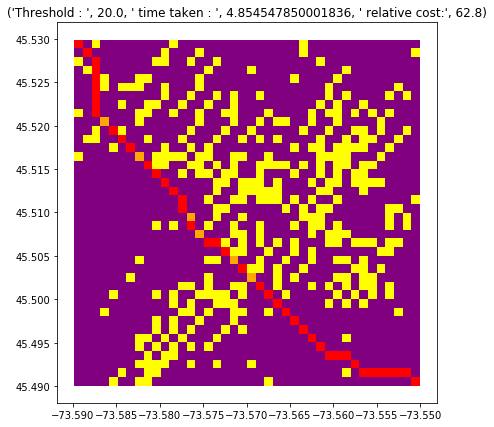

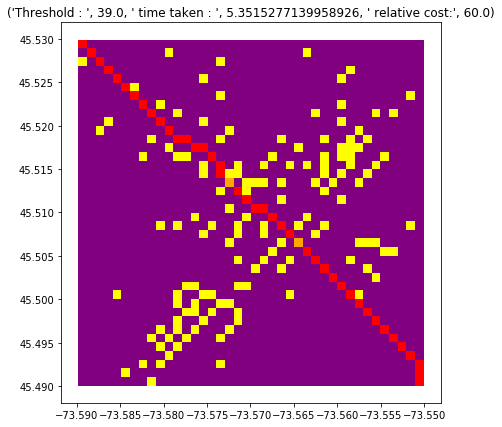

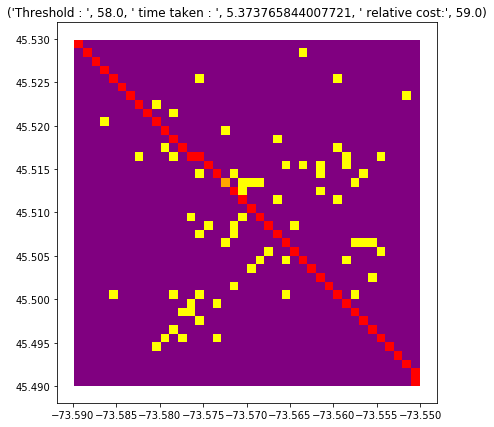

In [423]:
plotPath(grid,path1bTime,path2bTime,path3bTime,path1b,path2b,path3b)



Bonus folder : Data cleaning

In [324]:
bonusDF = pd.read_csv('mtl_crime.csv',encoding='ISO-8859-1')
bonusDF.head()

,CATEGORIE,DATE,QUART,PDQ,X,Y,LONGITUDE,LATITUDE
0,Vol de véhicule à moteur,2018-09-13,jour,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
1,Vol de véhicule à moteur,2018-04-30,jour,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
2,Vol de véhicule à moteur,2018-09-01,nuit,7.0,290274.565000,5.042150e+06,-73.685928,45.519122
3,Méfait,2017-07-21,jour,21.0,0.000000,0.000000e+00,1.000000,1.000000
4,Méfait,2017-07-29,jour,12.0,0.000000,0.000000e+00,1.000000,1.000000


Dropping irrelevant columns

In [325]:
to_drop = ['CATEGORIE','DATE','QUART','PDQ','X','Y']
bonusDF.drop(to_drop, inplace=True, axis=1)
bonusDF.head()

,LONGITUDE,LATITUDE
0,-73.626778,45.567780
1,-73.626778,45.567780
2,-73.685928,45.519122
3,1.000000,1.000000
4,1.000000,1.000000


Removing inconsistencies

In [326]:
indexNames = bonusDF[ (bonusDF['LONGITUDE'] == 1) & (bonusDF['LATITUDE'] == 1) ].index
bonusDF.drop(indexNames , inplace=True)
bonusDF.head()

,LONGITUDE,LATITUDE
0,-73.626778,45.567780
1,-73.626778,45.567780
2,-73.685928,45.519122
6,-73.591457,45.516776
8,-73.635117,45.602873


In [327]:
bonusGDF = GeoDataFrame(bonusDF, geometry=[Point(x, y) for x, y in zip(bonusDF.LONGITUDE, bonusDF.LATITUDE)])
bonusGDF.head()


,LONGITUDE,LATITUDE,geometry
0,-73.626778,45.567780,POINT (-73.6267780469 45.567779813)
1,-73.626778,45.567780,POINT (-73.6267780469 45.567779813)
2,-73.685928,45.519122,POINT (-73.6859284522 45.5191216465)
6,-73.591457,45.516776,POINT (-73.591457265 45.51677617359999)
8,-73.635117,45.602873,POINT (-73.6351174956 45.6028733349)


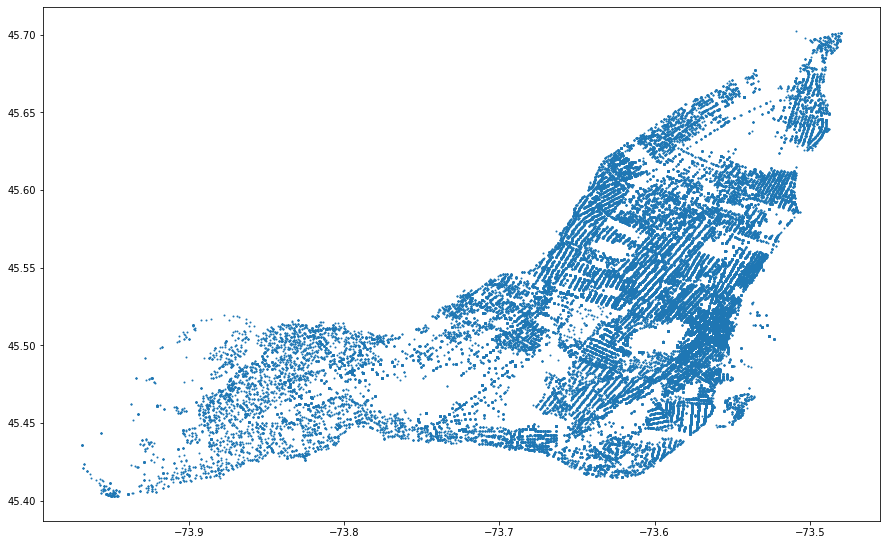

In [328]:
fig1,ax = plt.subplots(figsize = (15,15))
bonusGDF.plot(ax = ax, markersize = 1)
xmin,ymin,xmax,ymax =  bonusGDF.total_bounds

In [330]:
xmin,xmax,ymin,ymax

(-73.9689544469, -73.4801049847, 45.4026912475, 45.70235112100001)

Generating a 2D array where the number in each cell represents the number of crim points reported in the cell if a grid is superimposed over the map

In [413]:
width = 0.003
height = 0.003
#calculate number of rows and columns
rowsBonus = int(np.ceil((ymax-ymin) /  height))
colsBonus = int(np.ceil((xmax-xmin) / width))
crimeDataBonus = np.zeros((rowsBonus,colsBonus))
#plot original crime points
# fig1,ax = plt.subplots(figsize = (15,15))
# bonusGDF.plot(ax = ax, markersize = 1)
#plot the grid cells over it
polygonsBonus = []
for yCood in np.linspace(ymax,ymin+height,rowsBonus):
    for xCood in np.linspace(xmin,xmax-width,colsBonus):
        p1 = Point(xCood,yCood)
        p2 = Point(xCood+width,yCood)
        p3 = Point(xCood+width,yCood-height)
        p4 = Point(xCood,yCood-height)
        pointList = [p1,p2,p3,p4]
        poly = Polygon([[p.x, p.y] for p in pointList])
        polygonsBonus.append(poly)
#         plt.plot(*poly.exterior.xy)
#for each crime point, determine which cell contains it and then increase the count of crimeDataBonus in that respective index in crimepoints 2d array
for pt in bonusGDF.geometry:
    offsetY = ymax - pt.y
    offsetX = pt.x - xmin
    y = int(offsetY / width)
    x = int(offsetX / height)
    crimeDataBonus[y][x] = crimeDataBonus[y][x] + 1
print(crimeDataBonus)

[[ 0.  0.  0. ...  0. 14.  9.]
 [ 0.  0.  0. ... 13.  6. 22.]
 [ 0.  0.  0. ... 22.  7. 21.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]


The grid has not been superimposed over the map this time because of time inefficiency. Generating statistics for the dataset.

Mean :  7.235398773006135  Median: 0.0  Standard deviation: 22.00741059643316


(array([1.3568e+04, 8.7900e+02, 5.3900e+02, 4.0000e+02, 2.6200e+02,
        1.6600e+02, 1.3100e+02, 8.2000e+01, 5.5000e+01, 4.8000e+01,
        2.2000e+01, 2.6000e+01, 2.6000e+01, 2.4000e+01, 9.0000e+00,
        1.3000e+01, 7.0000e+00, 5.0000e+00, 6.0000e+00, 3.0000e+00,
        2.0000e+00, 2.0000e+00, 3.0000e+00, 1.0000e+00, 5.0000e+00,
        1.0000e+00, 2.0000e+00, 3.0000e+00, 0.0000e+00, 2.0000e+00,
        2.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 2.0000e+00,
        0.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.,
        110., 120., 130., 140., 150., 160., 170., 180., 190., 200., 210.,
        220., 230., 240., 250., 260., 270., 280., 290., 300., 310., 320.,
        330., 340., 350., 360., 370., 380., 390., 400., 410., 420., 430.,
        440., 450., 460., 470., 48

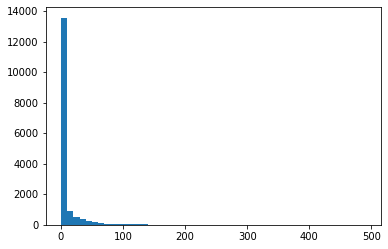

In [414]:
datasetBonus = crimeDataBonus.flatten()
meanBonus = np.mean(datasetBonus)
medianBonus = np.median(datasetBonus)
stdBonus = np.std(datasetBonus)
print("Mean : ",meanBonus," Median:",medianBonus," Standard deviation:",stdBonus)
plt.hist(datasetBonus, bins = np.arange(0,max(datasetBonus),10))

We observe, similar to the previous case, that if we increase the size of cells in the grid, higher number of crime points fall into a single cell and they are more evenly spaced across the cells which is indicated by the higher standard deviation. Also, with a lower cell size, there is significantly more number of grid cells that have similar number of crime points, thereby inferring that it would be difficult to set a threshold in order to attain a fair map with navigable paths. This is because there would be either too many obstacles or too less obstacles for a high and low threshold respectively even if the difference between the thresholds is not much. Such a map would not be desirable to evaluate the performance of a state-space search algorithm

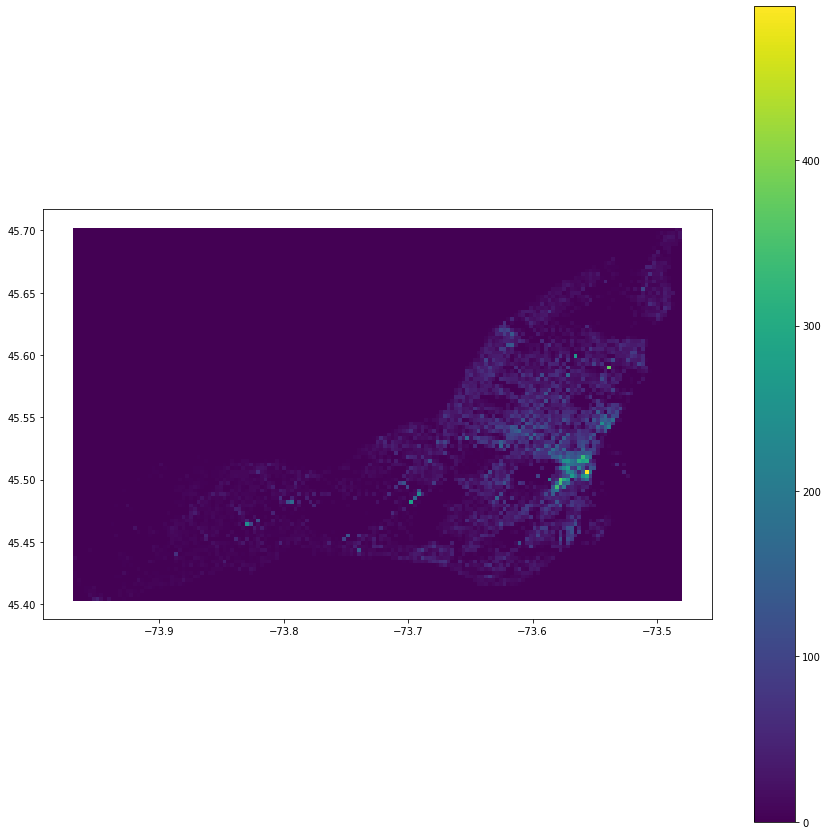

In [366]:

gridBonus = plotCrimeDist(datasetBonus,polygonsBonus)

In this case, contrary to the previous, it would not be a good idea to take the median since the median calculation has taken into account of the vast areas that have 0 crime, wherein reality the reason behind no crime in those areas may be largely due to the lack of population or unlivable terrain. Therefore, we may take three thresholds as - halfway of the standard deviation lower from the mean, mean and halfway of the standard deviation above the mean. It would almost be similar to taking three points in a Gaussian distribution (the peak, halfway up the peak and halfway down) if we consider only the cells containing crime points to be in the search space

In [375]:
thresh1b = 25
thresh2b = 50 
thresh3b = 75
print("Thresholds : ",thresh1b,thresh2b,thresh3b)

Thresholds :  25 50 75


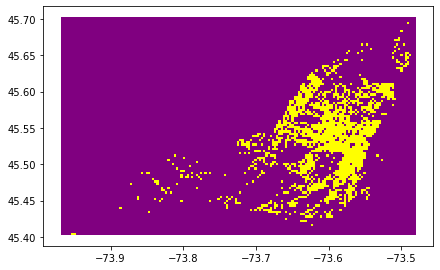

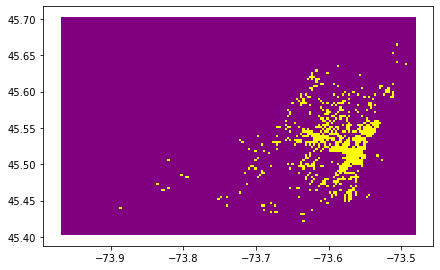

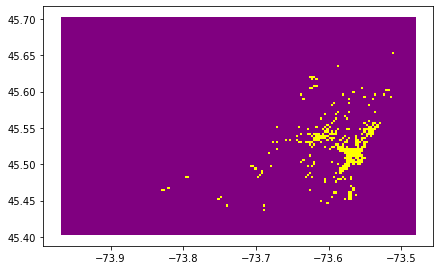

In [376]:
grid1b,grid2b,grid3b = generateGrids(gridBonus,thresh1b,thresh2b,thresh3b,rowsBonus,colsBonus)

After much experimentation with the thresholds, it was realized that the histogram plot is misleading and for good reason. The reason behind this is that all the grids including the vast number of the grids that have no crime points and therefore have no business in being accounted for while generating the statistics are responsible for giving the illusion that the average crime rate is low. We can see from the crime distribution plot (with the legend) that there are several places that have crime points well above 100 too.

In [436]:
#function to convert any latitude and longitude combination to (x,y) coordinates for the grid
def cood_to_xy(lat,long):
    offsetY = ymax - lat
    offsetX = long - xmin
    i = int(offsetY / width)
    j = int(offsetX / height)
    cood = [i,j]
    return cood

Attempting A* algorithm on this enlarged map with two arbitrary start and end locations

In [448]:
start = cood_to_xy(45.586635, -73.567552)
end = cood_to_xy(45.498342, -73.701500)
startTime = timeit.default_timer()
path1B = astar(grid1b, start, end)
stopTime = timeit.default_timer()
path1TimeB = stopTime - startTime
startTime = timeit.default_timer()
path2B = astar(grid2b, start, end)
stopTime = timeit.default_timer()
path2TimeB = stopTime - startTime
startTime = timeit.default_timer()
path3B = astar(grid3b, start, end)
stopTime = timeit.default_timer()
path3TimeB = stopTime - startTime

initialisation done
current node:  38   133
Possible new node at corner of: 38   134
straight path from corner of  38   133  to corner of  39   133
            -- i : 1.3
Possible new node at corner of: 38   132
straight path from corner of  38   132  to corner of  39   132
            -- i : 1.3
Possible new node at corner of: 39   133
straight path from corner of  39   133  to corner of  39   132
            -- i : 1.3
Possible new node at corner of: 37   133
straight path from corner of  38   133  to corner of  38   132
            -- i : 1.3
Possible new node at corner of: 39   134
diagonal path through  39   133
            -- i : 1.5
Possible new node at corner of: 39   132
diagonal path through  39   132
            -- obstacle
Possible new node at corner of: 37   134
diagonal path through  38   133
            -- obstacle
Possible new node at corner of: 37   132
diagonal path through  38   132
            -- i : 1.5
exploring child at  38   134
child not found in any list -- ad

Possible new node at corner of: 41   132
straight path from corner of  42   132  to corner of  42   131
            -- i : 1
Possible new node at corner of: 43   133
diagonal path through  43   132
            -- obstacle
Possible new node at corner of: 43   131
diagonal path through  43   131
            -- i : 1.5
Possible new node at corner of: 41   133
diagonal path through  42   132
            -- i : 1.5
Possible new node at corner of: 41   131
diagonal path through  42   131
            -- i : 1.5
exploring child at  42   133
child not found in any list -- adding to open list
exploring child at  42   131
child found in closed list with lower f -- skipping
exploring child at  43   132
child not found in any list -- adding to open list
exploring child at  41   132
child found in open list with lower f -- skipping
exploring child at  43   131
child found in closed list with lower f -- skipping
exploring child at  41   133
child not found in any list -- adding to open list
exploring

Possible new node at corner of: 42   133
diagonal path through  42   132
            -- i : 1.5
Possible new node at corner of: 42   131
diagonal path through  42   131
            -- i : 1.5
Possible new node at corner of: 40   133
diagonal path through  41   132
            -- obstacle
Possible new node at corner of: 40   131
diagonal path through  41   131
            -- i : 1.5
exploring child at  41   133
child not found in any list -- adding to open list
exploring child at  41   131
child found in closed list with lower f -- skipping
exploring child at  42   132
child not found in any list -- adding to open list
exploring child at  40   132
child found in closed list with lower f -- skipping
exploring child at  42   133
child not found in any list -- adding to open list
exploring child at  42   131
child found in closed list with lower f -- skipping
exploring child at  40   131
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  4

exploring child at  46   134
child found in closed list with lower f -- skipping
exploring child at  44   136
child not found in any list -- adding to open list
exploring child at  44   134
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  45   135
Possible new node at corner of: 45   136
straight path from corner of  45   135  to corner of  46   135
            -- i : 1
Possible new node at corner of: 45   134
straight path from corner of  45   134  to corner of  46   134
            -- i : 1
Possible new node at corner of: 46   135
straight path from corner of  46   135  to corner of  46   134
            -- i : 1
Possible new node at corner of: 44   135
straight path from corner of  45   135  to corner of  45   134
            -- i : 1
Possible new node at corner of: 46   136
diagonal path through  46   135
            -- i : 1.5
Possible new node at corner of: 46   134
diagonal path through  46   134
            -- i : 1.5
Possibl

straight path from corner of  49   135  to corner of  49   134
            -- i : 1.3
Possible new node at corner of: 50   136
diagonal path through  50   135
            -- obstacle
Possible new node at corner of: 50   134
diagonal path through  50   134
            -- i : 1.5
Possible new node at corner of: 48   136
diagonal path through  49   135
            -- i : 1.5
Possible new node at corner of: 48   134
diagonal path through  49   134
            -- obstacle
exploring child at  49   136
child found in open list with lower f -- skipping
exploring child at  49   134
child not found in any list -- adding to open list
exploring child at  50   135
child not found in any list -- adding to open list
exploring child at  48   135
child found in open list with lower f -- skipping
exploring child at  50   134
child not found in any list -- adding to open list
exploring child at  48   136
child found in closed list with lower f -- skipping
adding current node to closed list
current node: 

current node:  46   136
Possible new node at corner of: 46   137
straight path from corner of  46   136  to corner of  47   136
            -- i : 1
Possible new node at corner of: 46   135
straight path from corner of  46   135  to corner of  47   135
            -- i : 1
Possible new node at corner of: 47   136
straight path from corner of  47   136  to corner of  47   135
            -- i : 1
Possible new node at corner of: 45   136
straight path from corner of  46   136  to corner of  46   135
            -- i : 1
Possible new node at corner of: 47   137
diagonal path through  47   136
            -- i : 1.5
Possible new node at corner of: 47   135
diagonal path through  47   135
            -- i : 1.5
Possible new node at corner of: 45   137
diagonal path through  46   136
            -- i : 1.5
Possible new node at corner of: 45   135
diagonal path through  46   135
            -- i : 1.5
exploring child at  46   137
child found in open list with lower f -- skipping
exploring chi

Possible new node at corner of: 41   132
straight path from corner of  41   131  to corner of  42   131
            -- i : 1
Possible new node at corner of: 41   130
straight path from corner of  41   130  to corner of  42   130
            -- obstacle
Possible new node at corner of: 42   131
straight path from corner of  42   131  to corner of  42   130
            -- i : 1.3
Possible new node at corner of: 40   131
straight path from corner of  41   131  to corner of  41   130
            -- i : 1.3
Possible new node at corner of: 42   132
diagonal path through  42   131
            -- i : 1.5
Possible new node at corner of: 42   130
diagonal path through  42   130
            -- obstacle
Possible new node at corner of: 40   132
diagonal path through  41   131
            -- i : 1.5
Possible new node at corner of: 40   130
diagonal path through  41   130
            -- obstacle
exploring child at  41   132
child found in open list with lower f -- skipping
exploring child at  42   131

straight path from corner of  46   133  to corner of  47   133
            -- i : 1
Possible new node at corner of: 46   132
straight path from corner of  46   132  to corner of  47   132
            -- obstacle
Possible new node at corner of: 47   133
straight path from corner of  47   133  to corner of  47   132
            -- i : 1.3
Possible new node at corner of: 45   133
straight path from corner of  46   133  to corner of  46   132
            -- i : 1.3
Possible new node at corner of: 47   134
diagonal path through  47   133
            -- i : 1.5
Possible new node at corner of: 47   132
diagonal path through  47   132
            -- obstacle
Possible new node at corner of: 45   134
diagonal path through  46   133
            -- i : 1.5
Possible new node at corner of: 45   132
diagonal path through  46   132
            -- obstacle
exploring child at  46   134
child found in open list with lower f -- skipping
exploring child at  47   133
child not found in any list -- adding to

            -- i : 1.5
Possible new node at corner of: 41   133
diagonal path through  42   132
            -- i : 1.5
Possible new node at corner of: 41   131
diagonal path through  42   131
            -- i : 1.5
exploring child at  42   133
child found in open list with lower f -- skipping
exploring child at  42   131
child found in closed list with lower f -- skipping
exploring child at  43   132
child not found in any list -- adding to open list
exploring child at  41   132
child found in closed list with lower f -- skipping
exploring child at  43   131
child found in closed list with lower f -- skipping
exploring child at  41   133
child found in open list with lower f -- skipping
exploring child at  41   131
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  43   132
Possible new node at corner of: 43   133
straight path from corner of  43   132  to corner of  44   132
            -- i : 1.3
Possible new node at corner of: 43   

diagonal path through  46   135
            -- i : 1.5
Possible new node at corner of: 45   134
diagonal path through  46   134
            -- i : 1.5
exploring child at  46   136
child found in open list with lower f -- skipping
exploring child at  46   134
child found in closed list with lower f -- skipping
exploring child at  47   135
child found in closed list with lower f -- skipping
exploring child at  45   135
child found in open list with lower f -- skipping
exploring child at  47   136
child found in open list with lower f -- skipping
exploring child at  47   134
child found in closed list with lower f -- skipping
exploring child at  45   136
child found in open list with lower f -- skipping
exploring child at  45   134
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  42   133
Possible new node at corner of: 42   134
straight path from corner of  42   133  to corner of  43   133
            -- obstacle
Possible new node at c

diagonal path through  50   135
            -- obstacle
Possible new node at corner of: 48   137
diagonal path through  49   136
            -- obstacle
Possible new node at corner of: 48   135
diagonal path through  49   135
            -- i : 1.5
exploring child at  49   135
child found in closed list with lower f -- skipping
exploring child at  48   136
child found in closed list with lower f -- skipping
exploring child at  48   135
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  47   136
Possible new node at corner of: 47   137
straight path from corner of  47   136  to corner of  48   136
            -- i : 1
Possible new node at corner of: 47   135
straight path from corner of  47   135  to corner of  48   135
            -- i : 1.3
Possible new node at corner of: 48   136
straight path from corner of  48   136  to corner of  48   135
            -- i : 1.3
Possible new node at corner of: 46   136
straight path from corner of 

exploring child at  44   136
child found in open list with lower f -- skipping
exploring child at  46   137
child found in open list with lower f -- skipping
exploring child at  46   135
child found in closed list with lower f -- skipping
exploring child at  44   137
child not found in any list -- adding to open list
exploring child at  44   135
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  45   136
Possible new node at corner of: 45   137
straight path from corner of  45   136  to corner of  46   136
            -- i : 1
Possible new node at corner of: 45   135
straight path from corner of  45   135  to corner of  46   135
            -- i : 1
Possible new node at corner of: 46   136
straight path from corner of  46   136  to corner of  46   135
            -- i : 1
Possible new node at corner of: 44   136
straight path from corner of  45   136  to corner of  45   135
            -- i : 1
Possible new node at corner of: 46   137


straight path from corner of  44   135  to corner of  45   135
            -- i : 1.3
Possible new node at corner of: 45   136
straight path from corner of  45   136  to corner of  45   135
            -- i : 1
Possible new node at corner of: 43   136
straight path from corner of  44   136  to corner of  44   135
            -- i : 1.3
Possible new node at corner of: 45   137
diagonal path through  45   136
            -- i : 1.5
Possible new node at corner of: 45   135
diagonal path through  45   135
            -- i : 1.5
Possible new node at corner of: 43   137
diagonal path through  44   136
            -- i : 1.5
Possible new node at corner of: 43   135
diagonal path through  44   135
            -- obstacle
exploring child at  44   137
child found in open list with lower f -- skipping
exploring child at  44   135
child found in closed list with lower f -- skipping
exploring child at  45   136
child found in closed list with lower f -- skipping
exploring child at  43   136
child f

straight path from corner of  42   135  to corner of  42   134
            -- i : 1.3
Possible new node at corner of: 43   136
diagonal path through  43   135
            -- i : 1.5
Possible new node at corner of: 43   134
diagonal path through  43   134
            -- obstacle
Possible new node at corner of: 41   136
diagonal path through  42   135
            -- obstacle
Possible new node at corner of: 41   134
diagonal path through  42   134
            -- i : 1.5
exploring child at  42   136
child found in open list with lower f -- skipping
exploring child at  42   134
child not found in any list -- adding to open list
exploring child at  43   135
child found in closed list with lower f -- skipping
exploring child at  41   135
child not found in any list -- adding to open list
exploring child at  43   136
child found in open list with lower f -- skipping
exploring child at  41   134
child not found in any list -- adding to open list
adding current node to closed list
current node: 

Possible new node at corner of: 41   126
straight path from corner of  42   126  to corner of  42   125
            -- i : 1.3
Possible new node at corner of: 43   127
diagonal path through  43   126
            -- obstacle
Possible new node at corner of: 43   125
diagonal path through  43   125
            -- obstacle
Possible new node at corner of: 41   127
diagonal path through  42   126
            -- obstacle
Possible new node at corner of: 41   125
diagonal path through  42   125
            -- i : 1.5
exploring child at  42   125
child found in closed list with lower f -- skipping
exploring child at  41   126
child found in closed list with lower f -- skipping
exploring child at  41   125
child found in closed list with lower f -- skipping
adding current node to closed list
current node:  39   125
Possible new node at corner of: 39   126
straight path from corner of  39   125  to corner of  40   125
            -- i : 1.3
Possible new node at corner of: 39   124
straight path fr

diagonal path through  44   111
            -- obstacle
Possible new node at corner of: 42   113
diagonal path through  43   112
            -- obstacle
Possible new node at corner of: 42   111
diagonal path through  43   111
            -- i : 1.5
exploring child at  43   113
child not found in any list -- adding to open list
exploring child at  43   111
child found in closed list with lower f -- skipping
exploring child at  44   112
child not found in any list -- adding to open list
exploring child at  42   112
child found in closed list with lower f -- skipping
exploring child at  44   113
child not found in any list -- adding to open list
exploring child at  42   111
child found in open list with lower f -- skipping
adding current node to closed list
current node:  44   112
Possible new node at corner of: 44   113
straight path from corner of  44   112  to corner of  45   112
            -- i : 1
Possible new node at corner of: 44   111
straight path from corner of  44   111  to co

straight path from corner of  46   104  to corner of  47   104
            -- i : 1.3
Possible new node at corner of: 47   105
straight path from corner of  47   105  to corner of  47   104
            -- i : 1
Possible new node at corner of: 45   105
straight path from corner of  46   105  to corner of  46   104
            -- i : 1.3
Possible new node at corner of: 47   106
diagonal path through  47   105
            -- i : 1.5
Possible new node at corner of: 47   104
diagonal path through  47   104
            -- i : 1.5
Possible new node at corner of: 45   106
diagonal path through  46   105
            -- i : 1.5
Possible new node at corner of: 45   104
diagonal path through  46   104
            -- obstacle
exploring child at  46   106
child found in open list with lower f -- skipping
exploring child at  46   104
child not found in any list -- adding to open list
exploring child at  47   105
child found in closed list with lower f -- skipping
exploring child at  45   105
child no

straight path from corner of  45   103  to corner of  46   103
            -- i : 1.3
Possible new node at corner of: 45   102
straight path from corner of  45   102  to corner of  46   102
            -- obstacle
Possible new node at corner of: 46   103
straight path from corner of  46   103  to corner of  46   102
            -- i : 1.3
Possible new node at corner of: 44   103
straight path from corner of  45   103  to corner of  45   102
            -- obstacle
Possible new node at corner of: 46   104
diagonal path through  46   103
            -- i : 1.5
Possible new node at corner of: 46   102
diagonal path through  46   102
            -- obstacle
Possible new node at corner of: 44   104
diagonal path through  45   103
            -- obstacle
Possible new node at corner of: 44   102
diagonal path through  45   102
            -- obstacle
exploring child at  45   104
child found in open list with lower f -- skipping
exploring child at  46   103
child found in closed list with lowe

adding current node to closed list
current node:  46   108
Possible new node at corner of: 46   109
straight path from corner of  46   108  to corner of  47   108
            -- i : 1
Possible new node at corner of: 46   107
straight path from corner of  46   107  to corner of  47   107
            -- i : 1
Possible new node at corner of: 47   108
straight path from corner of  47   108  to corner of  47   107
            -- i : 1
Possible new node at corner of: 45   108
straight path from corner of  46   108  to corner of  46   107
            -- i : 1
Possible new node at corner of: 47   109
diagonal path through  47   108
            -- i : 1.5
Possible new node at corner of: 47   107
diagonal path through  47   107
            -- i : 1.5
Possible new node at corner of: 45   109
diagonal path through  46   108
            -- i : 1.5
Possible new node at corner of: 45   107
diagonal path through  46   107
            -- i : 1.5
exploring child at  46   109
child found in open list wit

child not found in any list -- adding to open list
exploring child at  47   108
child found in closed list with lower f -- skipping
exploring child at  45   108
child found in open list with lower f -- skipping
exploring child at  47   109
child found in closed list with lower f -- skipping
exploring child at  47   107
child found in closed list with lower f -- skipping
exploring child at  45   109
child found in open list with lower f -- skipping
exploring child at  45   107
child not found in any list -- adding to open list
adding current node to closed list
current node:  46   107
Possible new node at corner of: 46   108
straight path from corner of  46   107  to corner of  47   107
            -- i : 1
Possible new node at corner of: 46   106
straight path from corner of  46   106  to corner of  47   106
            -- obstacle
Possible new node at corner of: 47   107
straight path from corner of  47   107  to corner of  47   106
            -- i : 1.3
Possible new node at corner o

current node:  52   93
Possible new node at corner of: 52   94
straight path from corner of  52   93  to corner of  53   93
            -- i : 1.3
Possible new node at corner of: 52   92
straight path from corner of  52   92  to corner of  53   92
            -- i : 1
Possible new node at corner of: 53   93
straight path from corner of  53   93  to corner of  53   92
            -- i : 1.3
Possible new node at corner of: 51   93
straight path from corner of  52   93  to corner of  52   92
            -- i : 1
Possible new node at corner of: 53   94
diagonal path through  53   93
            -- obstacle
Possible new node at corner of: 53   92
diagonal path through  53   92
            -- i : 1.5
Possible new node at corner of: 51   94
diagonal path through  52   93
            -- i : 1.5
Possible new node at corner of: 51   92
diagonal path through  52   92
            -- i : 1.5
exploring child at  52   94
child found in open list with lower f -- skipping
exploring child at  52   92
ch

straight path from corner of  43   124  to corner of  44   124
            -- i : 1
Possible new node at corner of: 44   125
straight path from corner of  44   125  to corner of  44   124
            -- i : 1
Possible new node at corner of: 42   125
straight path from corner of  43   125  to corner of  43   124
            -- i : 1
Possible new node at corner of: 44   126
diagonal path through  44   125
            -- i : 1.5
Possible new node at corner of: 44   124
diagonal path through  44   124
            -- i : 1.5
Possible new node at corner of: 42   126
diagonal path through  43   125
            -- i : 1.5
Possible new node at corner of: 42   124
diagonal path through  43   124
            -- i : 1.5
exploring child at  43   126
child found in open list with lower f -- skipping
exploring child at  43   124
child not found in any list -- adding to open list
exploring child at  44   125
child not found in any list -- adding to open list
exploring child at  42   125
child found in

diagonal path through  58   101
            -- i : 1.5
exploring child at  58   103
child found in open list with lower f -- skipping
exploring child at  58   101
child not found in any list -- adding to open list
exploring child at  59   102
child not found in any list -- adding to open list
exploring child at  57   102
child found in open list with lower f -- skipping
exploring child at  59   103
child not found in any list -- adding to open list
exploring child at  59   101
child not found in any list -- adding to open list
exploring child at  57   103
child found in closed list with lower f -- skipping
exploring child at  57   101
child not found in any list -- adding to open list
adding current node to closed list
current node:  59   101
Possible new node at corner of: 59   102
straight path from corner of  59   101  to corner of  60   101
            -- i : 1
Possible new node at corner of: 59   100
straight path from corner of  59   100  to corner of  60   100
            -- i :

exploring child at  49   120
child not found in any list -- adding to open list
exploring child at  47   122
child found in closed list with lower f -- skipping
exploring child at  47   120
child not found in any list -- adding to open list
adding current node to closed list
current node:  49   120
Possible new node at corner of: 49   121
straight path from corner of  49   120  to corner of  50   120
            -- i : 1
Possible new node at corner of: 49   119
straight path from corner of  49   119  to corner of  50   119
            -- i : 1
Possible new node at corner of: 50   120
straight path from corner of  50   120  to corner of  50   119
            -- i : 1
Possible new node at corner of: 48   120
straight path from corner of  49   120  to corner of  49   119
            -- i : 1
Possible new node at corner of: 50   121
diagonal path through  50   120
            -- i : 1.5
Possible new node at corner of: 50   119
diagonal path through  50   119
            -- i : 1.5
Possible

Possible new node at corner of: 68   96
straight path from corner of  68   95  to corner of  69   95
            -- i : 1
Possible new node at corner of: 68   94
straight path from corner of  68   94  to corner of  69   94
            -- i : 1
Possible new node at corner of: 69   95
straight path from corner of  69   95  to corner of  69   94
            -- i : 1
Possible new node at corner of: 67   95
straight path from corner of  68   95  to corner of  68   94
            -- i : 1
Possible new node at corner of: 69   96
diagonal path through  69   95
            -- i : 1.5
Possible new node at corner of: 69   94
diagonal path through  69   94
            -- i : 1.5
Possible new node at corner of: 67   96
diagonal path through  68   95
            -- i : 1.5
Possible new node at corner of: 67   94
diagonal path through  68   94
            -- i : 1.5
exploring child at  68   96
child found in closed list with lower f -- skipping
exploring child at  68   94
child not found in any list 

Plotting the paths on the physical maps

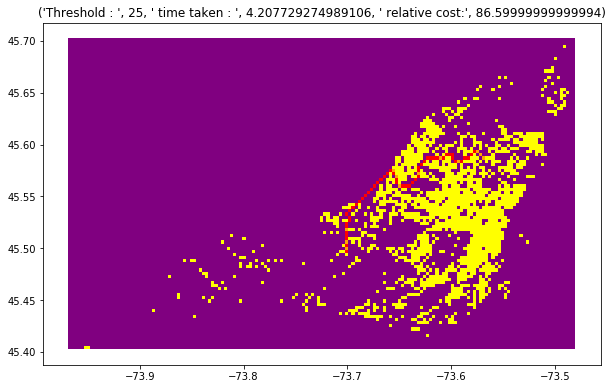

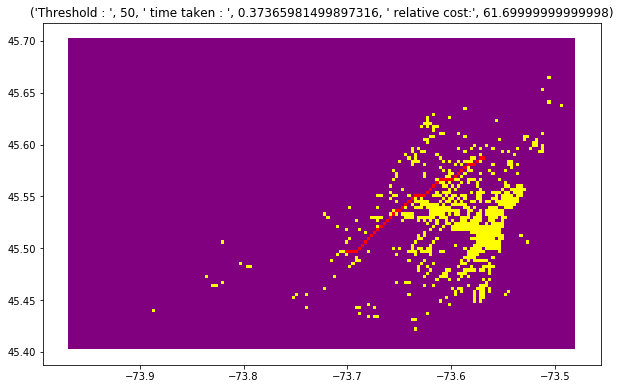

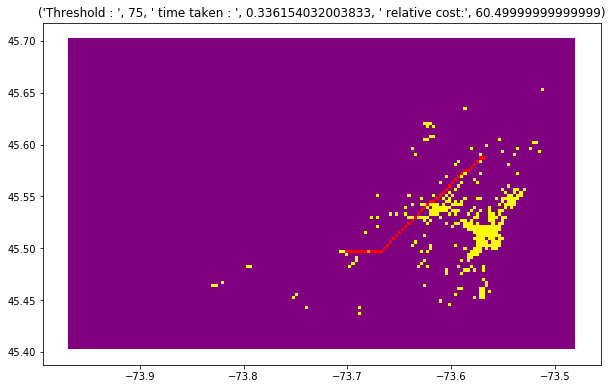

In [449]:
def plotPathBonus(path1B, path2B, path3B, path1TimeB, path2TimeB, path3TimeB):    
    gridBonus['path1'] = np.zeros(len(gridBonus))
    gridBonus['path2'] = np.zeros(len(gridBonus))
    gridBonus['path3'] = np.zeros(len(gridBonus))
    for index,row in gridBonus.iterrows():
        gridBonus.loc[index,'path1'] = row['thresh1']
        gridBonus.loc[index,'path2'] = row['thresh2']
        gridBonus.loc[index,'path3'] = row['thresh3']
    for index,item in enumerate(path1B[1:]):
        indexActual = item[0]*colsBonus + item[1]
        if gridBonus.loc[indexActual, 'path1'] == 1:
            gridBonus.loc[indexActual,'path1'] = 0.75
        else:
            gridBonus.loc[indexActual,'path1'] = 0.25
    for index,item in enumerate(path2B[1:]):
        indexActual = item[0]*colsBonus + item[1]
        if gridBonus.loc[indexActual, 'path2'] == 1:
            gridBonus.loc[indexActual,'path2'] = 0.75
        else:
            gridBonus.loc[indexActual,'path2'] = 0.25
    for index,item in enumerate(path3B[1:]):
        indexActual = item[0]*colsBonus + item[1]
        if gridBonus.loc[indexActual, 'path3'] == 1:
            gridBonus.loc[indexActual,'path3'] = 0.75
        else:
            gridBonus.loc[indexActual,'path3'] = 0.25
    cmap = LinearSegmentedColormap.from_list('mycmap', [(0, 'purple'), (0.25, 'red'), (0.75,'orange'), (1, 'yellow')])
    fig2,ax = plt.subplots(figsize = (10,10))
    ax.set_title(("Threshold : ",thresh1b," time taken : ",path1TimeB, " relative cost:",path1B[0]))
    gridBonus.plot(column='path1', ax = ax, cmap=cmap)
    fig3,ax = plt.subplots(figsize = (10,10))
    ax.set_title(("Threshold : ",thresh2b," time taken : ",path2TimeB, " relative cost:",path2B[0]))
    gridBonus.plot(column='path2', ax = ax, cmap=cmap)
    fig4,ax = plt.subplots(figsize = (10,10))
    ax.set_title(("Threshold : ",thresh3b," time taken : ",path3TimeB, " relative cost:",path3B[0]))
    gridBonus.plot(column='path3', ax = ax, cmap=cmap)

plotPathBonus(path1B, path2B, path3B, path1TimeB, path2TimeB, path3TimeB)

Attempting Djikstra's algorithm on this enlarged map with two arbitrary start and end locations

In [452]:
start = cood_to_xy(45.586635, -73.567552)
end = cood_to_xy(45.498342, -73.701500)
print("Start : ",start," End: ",end)
startTime = timeit.default_timer()
path1bB = dijsktra(grid1b, start, end)
stopTime = timeit.default_timer()
path1bTimeB = stopTime - startTime
startTime = timeit.default_timer()
path2bB = dijsktra(grid2b,start,end)
stopTime = timeit.default_timer()
path2bTimeB = stopTime - startTime
startTime = timeit.default_timer()
path3bB = dijsktra(grid3b,start,end)
stopTime = timeit.default_timer()
path3bTimeB = stopTime - startTime

Start :  [38, 133]  End:  [68, 89]
initialisation done
Current node :  [38, 133]  f: 0
new neighbouring node: [37, 133] 1.3
     -- adding new node to unvisited list
new neighbouring node: [39, 133] 1.3
     -- adding new node to unvisited list
new neighbouring node: [38, 134] 1.3
     -- adding new node to unvisited list
new neighbouring node: [38, 132] 1.3
     -- adding new node to unvisited list
new neighbouring node: [37, 132] 1.5
     -- adding new node to unvisited list
new neighbouring node: [39, 134] 1.5
     -- adding new node to unvisited list
current is now visited
Current node :  [37, 133]  f: 1.3
new neighbouring node: [36, 133] 2.6
     -- adding new node to unvisited list
new neighbouring node: [38, 133] 2.6
     -- but this node is visited
new neighbouring node: [37, 134] 2.6
     -- adding new node to unvisited list
new neighbouring node: [37, 132] 2.6
new neighbouring node: [36, 134] 2.8
     -- adding new node to unvisited list
new neighbouring node: [38, 132] 2.8
c

new neighbouring node: [35, 128] 9.4
new neighbouring node: [34, 129] 9.1
     -- but this node is visited
new neighbouring node: [34, 127] 9.4
     -- adding new node to unvisited list
new neighbouring node: [33, 129] 9.6
     -- but this node is visited
new neighbouring node: [33, 127] 9.6
     -- adding new node to unvisited list
new neighbouring node: [35, 129] 9.6
current is now visited
Current node :  [31, 134]  f: 8.1
new neighbouring node: [30, 134] 9.1
     -- adding new node to unvisited list
new neighbouring node: [32, 134] 9.1
     -- but this node is visited
new neighbouring node: [31, 135] 9.1
new neighbouring node: [31, 133] 9.1
new neighbouring node: [30, 135] 9.6
     -- adding new node to unvisited list
new neighbouring node: [30, 133] 9.6
     -- adding new node to unvisited list
new neighbouring node: [32, 135] 9.6
     -- but this node is visited
new neighbouring node: [32, 133] 9.6
     -- but this node is visited
current is now visited
Current node :  [44, 137]  

new neighbouring node: [43, 142] 12.400000000000002
new neighbouring node: [43, 140] 12.400000000000002
     -- but this node is visited
current is now visited
Current node :  [29, 132]  f: 11.0
new neighbouring node: [28, 132] 12.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [30, 132] 12.0
     -- but this node is visited
new neighbouring node: [29, 133] 12.0
     -- but this node is visited
new neighbouring node: [29, 131] 12.0
new neighbouring node: [28, 133] 12.5
new neighbouring node: [28, 131] 12.5
     -- adding new node to unvisited list
new neighbouring node: [30, 133] 12.5
     -- but this node is visited
new neighbouring node: [30, 131] 12.5
     -- but this node is visited
current is now visited
Current node :  [44, 141]  f: 11.0
new neighbouring node: [43, 141] 12.3
     -- but this node is visited
new neighbouring node: [45, 141] 12.0
new neighbouring node: [44, 142] 12.3
     -- adding new node to unvisited list
new neighbouring n

Current node :  [36, 122]  f: 13.6
new neighbouring node: [35, 122] 14.9
new neighbouring node: [37, 122] 14.6
     -- but this node is visited
new neighbouring node: [36, 123] 14.6
     -- but this node is visited
new neighbouring node: [36, 121] 14.9
new neighbouring node: [35, 123] 15.1
     -- but this node is visited
new neighbouring node: [37, 123] 15.1
     -- but this node is visited
new neighbouring node: [37, 121] 15.1
current is now visited
Current node :  [26, 135]  f: 13.6
new neighbouring node: [25, 135] 14.6
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [27, 135] 14.6
     -- but this node is visited
new neighbouring node: [26, 136] 14.6
new neighbouring node: [26, 134] 14.6
     -- but this node is visited
new neighbouring node: [25, 136] 15.1
     -- adding new node to unvisited list
new neighbouring node: [25, 134] 15.1
new neighbouring node: [27, 136] 15.1
     -- but this node is visited
new neighbouring node: [27, 134] 15.1
  

new neighbouring node: [44, 146] 17.3
new neighbouring node: [44, 144] 17.3
     -- but this node is visited
new neighbouring node: [46, 146] 17.3
     -- adding new node to unvisited list
new neighbouring node: [46, 144] 17.3
     -- but this node is visited
current is now visited
Current node :  [32, 123]  f: 15.9
new neighbouring node: [31, 123] 16.9
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [33, 123] 16.9
     -- but this node is visited
new neighbouring node: [32, 124] 16.9
     -- but this node is visited
new neighbouring node: [32, 122] 16.9
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [31, 124] 17.4
new neighbouring node: [31, 122] 17.4
     -- adding new node to unvisited list
new neighbouring node: [33, 124] 17.4
     -- but this node is visited
new neighbouring node: [33, 122] 17.4
current is now visited
Current node :  [34, 143]  f: 15.900000000000002
new neighbouring node: [33, 143] 16.90000

     -- adding new node to unvisited list
new neighbouring node: [41, 145] 19.000000000000004
new neighbouring node: [43, 147] 19.000000000000004
new neighbouring node: [43, 145] 19.000000000000004
     -- but this node is visited
current is now visited
Current node :  [39, 120]  f: 17.500000000000004
new neighbouring node: [38, 120] 18.800000000000004
     -- but this node is visited
new neighbouring node: [40, 120] 18.800000000000004
     -- adding new node to unvisited list
new neighbouring node: [39, 119] 18.500000000000004
new neighbouring node: [38, 119] 19.000000000000004
new neighbouring node: [40, 119] 19.000000000000004
     -- adding new node to unvisited list
current is now visited
Current node :  [38, 119]  f: 17.500000000000004
new neighbouring node: [37, 119] 18.800000000000004
     -- but this node is visited
new neighbouring node: [39, 119] 18.800000000000004
new neighbouring node: [38, 120] 18.800000000000004
     -- but this node is visited
new neighbouring node: [38

     -- but this node is visited
new neighbouring node: [32, 146] 20.200000000000003
     -- adding new node to unvisited list
current is now visited
Current node :  [24, 124]  f: 18.8
new neighbouring node: [23, 124] 20.1
     -- adding new node to unvisited list
new neighbouring node: [25, 124] 20.1
     -- but this node is visited
new neighbouring node: [24, 125] 20.1
     -- but this node is visited
new neighbouring node: [24, 123] 20.1
     -- adding new node to unvisited list
new neighbouring node: [23, 123] 20.3
     -- adding new node to unvisited list
new neighbouring node: [25, 125] 20.3
     -- but this node is visited
current is now visited
Current node :  [38, 118]  f: 18.8
new neighbouring node: [37, 118] 19.8
     -- but this node is visited
new neighbouring node: [38, 119] 20.1
     -- but this node is visited
new neighbouring node: [38, 117] 20.1
new neighbouring node: [37, 119] 20.3
     -- but this node is visited
new neighbouring node: [37, 117] 20.3
current is now 

     -- but this node is visited
current is now visited
Current node :  [28, 120]  f: 20.1
new neighbouring node: [27, 120] 21.400000000000002
new neighbouring node: [29, 120] 21.400000000000002
     -- but this node is visited
new neighbouring node: [28, 121] 21.400000000000002
     -- but this node is visited
new neighbouring node: [28, 119] 21.400000000000002
     -- adding new node to unvisited list
new neighbouring node: [27, 119] 21.6
     -- adding new node to unvisited list
new neighbouring node: [29, 121] 21.6
     -- but this node is visited
current is now visited
Current node :  [23, 124]  f: 20.1
new neighbouring node: [22, 124] 21.400000000000002
     -- adding new node to unvisited list
new neighbouring node: [24, 124] 21.400000000000002
     -- but this node is visited
new neighbouring node: [23, 125] 21.400000000000002
     -- adding new node to unvisited list
new neighbouring node: [23, 123] 21.400000000000002
new neighbouring node: [22, 125] 21.6
     -- adding new no

     -- but this node is visited
new neighbouring node: [26, 119] 23.1
current is now visited
Current node :  [39, 116]  f: 21.6
new neighbouring node: [38, 116] 22.900000000000002
     -- but this node is visited
new neighbouring node: [39, 117] 22.900000000000002
     -- but this node is visited
new neighbouring node: [38, 117] 23.1
     -- but this node is visited
current is now visited
Current node :  [19, 137]  f: 21.6
new neighbouring node: [18, 137] 22.6
new neighbouring node: [20, 137] 22.6
     -- but this node is visited
new neighbouring node: [19, 138] 22.6
new neighbouring node: [19, 136] 22.6
     -- but this node is visited
new neighbouring node: [18, 138] 23.1
     -- adding new node to unvisited list
new neighbouring node: [18, 136] 23.1
new neighbouring node: [20, 138] 23.1
     -- but this node is visited
new neighbouring node: [20, 136] 23.1
     -- but this node is visited
current is now visited
Current node :  [24, 144]  f: 21.6
new neighbouring node: [23, 144] 22.

     -- but this node is visited
new neighbouring node: [33, 116] 24.3
     -- but this node is visited
current is now visited
Current node :  [50, 148]  f: 22.8
new neighbouring node: [49, 148] 23.8
     -- but this node is visited
new neighbouring node: [51, 148] 23.8
     -- adding new node to unvisited list
new neighbouring node: [50, 149] 23.8
new neighbouring node: [50, 147] 23.8
new neighbouring node: [49, 149] 24.3
     -- but this node is visited
new neighbouring node: [49, 147] 24.3
     -- but this node is visited
new neighbouring node: [51, 149] 24.3
     -- adding new node to unvisited list
new neighbouring node: [51, 147] 24.3
     -- adding new node to unvisited list
current is now visited
Current node :  [45, 152]  f: 22.8
new neighbouring node: [44, 152] 23.8
new neighbouring node: [46, 152] 23.8
new neighbouring node: [45, 153] 23.8
     -- adding new node to unvisited list
new neighbouring node: [45, 151] 23.8
     -- but this node is visited
new neighbouring node: [

     -- but this node is visited
current is now visited
Current node :  [18, 128]  f: 24.0
new neighbouring node: [17, 128] 25.0
new neighbouring node: [19, 128] 25.3
     -- but this node is visited
new neighbouring node: [18, 129] 25.0
     -- but this node is visited
new neighbouring node: [18, 127] 25.3
new neighbouring node: [17, 129] 25.5
new neighbouring node: [17, 127] 25.5
     -- adding new node to unvisited list
new neighbouring node: [19, 129] 25.5
     -- but this node is visited
current is now visited
Current node :  [41, 152]  f: 24.000000000000004
new neighbouring node: [40, 152] 25.000000000000004
new neighbouring node: [42, 152] 25.000000000000004
     -- but this node is visited
new neighbouring node: [41, 153] 25.000000000000004
new neighbouring node: [41, 151] 25.000000000000004
     -- but this node is visited
new neighbouring node: [40, 153] 25.500000000000004
     -- adding new node to unvisited list
new neighbouring node: [40, 151] 25.500000000000004
     -- bu

new neighbouring node: [40, 152] 26.500000000000004
     -- but this node is visited
new neighbouring node: [42, 154] 26.500000000000004
new neighbouring node: [42, 152] 26.500000000000004
     -- but this node is visited
current is now visited
Current node :  [18, 142]  f: 25.1
new neighbouring node: [17, 142] 26.1
new neighbouring node: [19, 142] 26.1
     -- but this node is visited
new neighbouring node: [18, 143] 26.1
new neighbouring node: [18, 141] 26.1
     -- but this node is visited
new neighbouring node: [17, 143] 26.6
     -- adding new node to unvisited list
new neighbouring node: [17, 141] 26.6
new neighbouring node: [19, 143] 26.6
     -- but this node is visited
new neighbouring node: [19, 141] 26.6
     -- but this node is visited
current is now visited
Current node :  [22, 118]  f: 25.1
new neighbouring node: [21, 118] 26.1
new neighbouring node: [23, 118] 26.1
     -- but this node is visited
new neighbouring node: [22, 119] 26.1
     -- but this node is visited
new 

new neighbouring node: [37, 153] 27.200000000000006
     -- but this node is visited
new neighbouring node: [36, 155] 27.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [38, 155] 27.400000000000006
new neighbouring node: [38, 153] 27.400000000000006
     -- but this node is visited
current is now visited
Current node :  [16, 128]  f: 26.0
new neighbouring node: [15, 128] 27.0
new neighbouring node: [17, 128] 27.0
     -- but this node is visited
new neighbouring node: [16, 129] 27.0
     -- but this node is visited
new neighbouring node: [16, 127] 27.0
new neighbouring node: [15, 129] 27.5
new neighbouring node: [15, 127] 27.5
     -- adding new node to unvisited list
new neighbouring node: [17, 129] 27.5
     -- but this node is visited
new neighbouring node: [17, 127] 27.5
     -- but this node is visited
current is now visited
Current node :  [39, 154]  f: 26.000000000000004
new neighbouring node: [38, 154] 27.000000000000004
     -- but this node is

new neighbouring node: [15, 127] 28.200000000000003
new neighbouring node: [15, 125] 28.200000000000003
     -- adding new node to unvisited list
new neighbouring node: [17, 127] 28.200000000000003
     -- but this node is visited
new neighbouring node: [17, 125] 28.200000000000003
     -- but this node is visited
current is now visited
Current node :  [51, 153]  f: 26.8
new neighbouring node: [50, 153] 27.8
     -- but this node is visited
new neighbouring node: [52, 153] 27.8
new neighbouring node: [51, 154] 27.8
new neighbouring node: [51, 152] 27.8
     -- but this node is visited
new neighbouring node: [50, 154] 28.3
new neighbouring node: [50, 152] 28.3
     -- but this node is visited
new neighbouring node: [52, 154] 28.3
     -- adding new node to unvisited list
new neighbouring node: [52, 152] 28.3
current is now visited
Current node :  [52, 152]  f: 26.8
new neighbouring node: [51, 152] 27.8
     -- but this node is visited
new neighbouring node: [53, 152] 27.8
new neighbouri

Current node :  [42, 113]  f: 27.400000000000002
new neighbouring node: [41, 113] 28.700000000000003
     -- but this node is visited
new neighbouring node: [42, 112] 28.700000000000003
new neighbouring node: [41, 112] 28.900000000000002
     -- but this node is visited
current is now visited
Current node :  [16, 124]  f: 27.400000000000002
new neighbouring node: [15, 124] 28.400000000000002
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [17, 124] 28.400000000000002
     -- but this node is visited
new neighbouring node: [16, 125] 28.400000000000002
     -- but this node is visited
new neighbouring node: [16, 123] 28.400000000000002
new neighbouring node: [15, 125] 28.900000000000002
new neighbouring node: [15, 123] 28.900000000000002
     -- adding new node to unvisited list
new neighbouring node: [17, 125] 28.900000000000002
     -- but this node is visited
new neighbouring node: [17, 123] 28.900000000000002
     -- but this node is visited
curre

new neighbouring node: [14, 138] 29.1
     -- but this node is visited
new neighbouring node: [13, 139] 29.1
new neighbouring node: [13, 137] 29.1
     -- but this node is visited
new neighbouring node: [12, 139] 29.6
     -- adding new node to unvisited list
new neighbouring node: [12, 137] 29.6
new neighbouring node: [14, 139] 29.6
     -- but this node is visited
new neighbouring node: [14, 137] 29.6
     -- but this node is visited
current is now visited
Current node :  [23, 150]  f: 28.1
new neighbouring node: [22, 150] 29.1
new neighbouring node: [24, 150] 29.1
     -- but this node is visited
new neighbouring node: [23, 151] 29.1
new neighbouring node: [23, 149] 29.1
     -- but this node is visited
new neighbouring node: [22, 151] 29.6
     -- adding new node to unvisited list
new neighbouring node: [22, 149] 29.6
     -- but this node is visited
new neighbouring node: [24, 151] 29.6
new neighbouring node: [24, 149] 29.6
     -- but this node is visited
current is now visited
C

     -- but this node is visited
new neighbouring node: [52, 155] 29.8
new neighbouring node: [51, 156] 29.8
new neighbouring node: [51, 154] 29.8
     -- but this node is visited
new neighbouring node: [50, 156] 30.3
new neighbouring node: [50, 154] 30.3
     -- but this node is visited
new neighbouring node: [52, 156] 30.3
     -- adding new node to unvisited list
new neighbouring node: [52, 154] 30.3
     -- but this node is visited
current is now visited
Current node :  [54, 152]  f: 28.8
new neighbouring node: [53, 152] 29.8
     -- but this node is visited
new neighbouring node: [55, 152] 29.8
new neighbouring node: [54, 153] 29.8
new neighbouring node: [54, 151] 29.8
     -- but this node is visited
new neighbouring node: [53, 153] 30.3
     -- but this node is visited
new neighbouring node: [53, 151] 30.3
     -- but this node is visited
new neighbouring node: [55, 153] 30.3
     -- adding new node to unvisited list
new neighbouring node: [55, 151] 30.3
current is now visited
C

     -- adding new node to unvisited list
new neighbouring node: [57, 148] 30.8
current is now visited
Current node :  [44, 158]  f: 29.3
new neighbouring node: [43, 158] 30.3
new neighbouring node: [45, 158] 30.3
     -- but this node is visited
new neighbouring node: [44, 159] 30.3
new neighbouring node: [44, 157] 30.3
     -- but this node is visited
new neighbouring node: [43, 159] 30.8
     -- adding new node to unvisited list
new neighbouring node: [43, 157] 30.8
     -- but this node is visited
new neighbouring node: [45, 159] 30.8
new neighbouring node: [45, 157] 30.8
     -- but this node is visited
current is now visited
Current node :  [46, 158]  f: 29.3
new neighbouring node: [45, 158] 30.3
     -- but this node is visited
new neighbouring node: [47, 158] 30.3
new neighbouring node: [46, 159] 30.3
new neighbouring node: [46, 157] 30.3
     -- but this node is visited
new neighbouring node: [45, 159] 30.8
new neighbouring node: [45, 157] 30.8
     -- but this node is visited

     -- adding new node to unvisited list
current is now visited
Current node :  [45, 159]  f: 29.8
new neighbouring node: [44, 159] 30.8
new neighbouring node: [46, 159] 30.8
new neighbouring node: [45, 160] 30.8
     -- adding new node to unvisited list
new neighbouring node: [45, 158] 30.8
     -- but this node is visited
new neighbouring node: [44, 160] 31.3
     -- adding new node to unvisited list
new neighbouring node: [44, 158] 31.3
     -- but this node is visited
new neighbouring node: [46, 160] 31.3
     -- adding new node to unvisited list
new neighbouring node: [46, 158] 31.3
     -- but this node is visited
current is now visited
Current node :  [10, 133]  f: 29.9
new neighbouring node: [9, 133] 30.9
new neighbouring node: [11, 133] 30.9
     -- but this node is visited
new neighbouring node: [10, 134] 30.9
     -- but this node is visited
new neighbouring node: [10, 132] 30.9
new neighbouring node: [9, 134] 31.4
new neighbouring node: [9, 132] 31.4
     -- adding new nod

     -- adding new node to unvisited list
new neighbouring node: [10, 135] 31.9
     -- but this node is visited
new neighbouring node: [10, 133] 31.9
     -- but this node is visited
current is now visited
Current node :  [16, 118]  f: 30.400000000000002
new neighbouring node: [15, 118] 31.400000000000002
new neighbouring node: [17, 118] 31.400000000000002
     -- but this node is visited
new neighbouring node: [16, 119] 31.400000000000002
     -- but this node is visited
new neighbouring node: [16, 117] 31.400000000000002
new neighbouring node: [15, 119] 31.900000000000002
new neighbouring node: [15, 117] 31.900000000000002
     -- adding new node to unvisited list
new neighbouring node: [17, 119] 31.900000000000002
     -- but this node is visited
new neighbouring node: [17, 117] 31.900000000000002
current is now visited
Current node :  [55, 142]  f: 30.400000000000002
new neighbouring node: [54, 142] 31.400000000000002
     -- but this node is visited
new neighbouring node: [56, 14

new neighbouring node: [46, 160] 32.3
new neighbouring node: [46, 158] 32.3
     -- but this node is visited
new neighbouring node: [48, 160] 32.3
     -- adding new node to unvisited list
new neighbouring node: [48, 158] 32.3
     -- but this node is visited
current is now visited
Current node :  [10, 131]  f: 30.8
new neighbouring node: [9, 131] 31.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [11, 131] 31.8
     -- but this node is visited
new neighbouring node: [10, 132] 31.8
     -- but this node is visited
new neighbouring node: [10, 130] 31.8
new neighbouring node: [9, 132] 32.3
new neighbouring node: [9, 130] 32.3
     -- adding new node to unvisited list
new neighbouring node: [11, 132] 32.3
     -- but this node is visited
new neighbouring node: [11, 130] 32.3
     -- but this node is visited
current is now visited
Current node :  [58, 148]  f: 30.8
new neighbouring node: [57, 148] 31.8
     -- but this node is visited
new neighbouring

     -- but this node is visited
new neighbouring node: [57, 153] 32.3
new neighbouring node: [56, 154] 32.3
new neighbouring node: [56, 152] 32.3
     -- but this node is visited
new neighbouring node: [55, 154] 32.8
     -- but this node is visited
new neighbouring node: [55, 152] 32.8
     -- but this node is visited
new neighbouring node: [57, 154] 32.8
     -- adding new node to unvisited list
new neighbouring node: [57, 152] 32.8
current is now visited
Current node :  [50, 158]  f: 31.3
new neighbouring node: [49, 158] 32.3
     -- but this node is visited
new neighbouring node: [51, 158] 32.3
new neighbouring node: [50, 159] 32.3
new neighbouring node: [50, 157] 32.3
     -- but this node is visited
new neighbouring node: [49, 159] 32.8
new neighbouring node: [49, 157] 32.8
     -- but this node is visited
new neighbouring node: [51, 159] 32.8
     -- adding new node to unvisited list
new neighbouring node: [51, 157] 32.8
     -- but this node is visited
current is now visited
C

new neighbouring node: [21, 152] 32.6
     -- but this node is visited
new neighbouring node: [20, 153] 32.6
new neighbouring node: [20, 151] 32.6
     -- but this node is visited
new neighbouring node: [19, 153] 33.1
     -- adding new node to unvisited list
new neighbouring node: [19, 151] 33.1
     -- but this node is visited
new neighbouring node: [21, 153] 33.1
new neighbouring node: [21, 151] 33.1
     -- but this node is visited
current is now visited
Current node :  [10, 139]  f: 31.6
new neighbouring node: [9, 139] 32.6
new neighbouring node: [11, 139] 32.6
     -- but this node is visited
new neighbouring node: [10, 140] 32.6
new neighbouring node: [10, 138] 32.6
     -- but this node is visited
new neighbouring node: [9, 140] 33.1
     -- adding new node to unvisited list
new neighbouring node: [9, 138] 33.1
new neighbouring node: [11, 140] 33.1
     -- but this node is visited
new neighbouring node: [11, 138] 33.1
     -- but this node is visited
current is now visited
Curr

new neighbouring node: [39, 159] 33.0
     -- but this node is visited
new neighbouring node: [38, 161] 33.5
new neighbouring node: [38, 159] 33.5
     -- but this node is visited
new neighbouring node: [40, 161] 33.5
     -- adding new node to unvisited list
new neighbouring node: [40, 159] 33.5
     -- but this node is visited
current is now visited
Current node :  [41, 160]  f: 32.0
new neighbouring node: [40, 160] 33.0
new neighbouring node: [42, 160] 33.0
     -- but this node is visited
new neighbouring node: [41, 161] 33.0
new neighbouring node: [41, 159] 33.0
     -- but this node is visited
new neighbouring node: [40, 161] 33.5
new neighbouring node: [40, 159] 33.5
     -- but this node is visited
new neighbouring node: [42, 161] 33.5
new neighbouring node: [42, 159] 33.5
     -- but this node is visited
current is now visited
Current node :  [33, 152]  f: 32.00000000000001
new neighbouring node: [32, 152] 33.00000000000001
new neighbouring node: [33, 153] 33.300000000000004
 

     -- but this node is visited
new neighbouring node: [27, 110] 33.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [59, 146]  f: 32.400000000000006
new neighbouring node: [58, 146] 33.400000000000006
     -- but this node is visited
new neighbouring node: [60, 146] 33.400000000000006
new neighbouring node: [59, 147] 33.400000000000006
     -- but this node is visited
new neighbouring node: [59, 145] 33.400000000000006
new neighbouring node: [58, 147] 33.900000000000006
     -- but this node is visited
new neighbouring node: [58, 145] 33.900000000000006
     -- but this node is visited
new neighbouring node: [60, 147] 33.900000000000006
new neighbouring node: [60, 145] 33.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [43, 120]  f: 32.400000000000006
new neighbouring node: [42, 120] 33.400000000000006
     -- but this node is visited
new neighbouring node: [44, 120] 33.400000000000006
ne

     -- but this node is visited
new neighbouring node: [58, 155] 34.3
     -- adding new node to unvisited list
new neighbouring node: [58, 153] 34.3
current is now visited
Current node :  [51, 159]  f: 32.8
new neighbouring node: [50, 159] 33.8
     -- but this node is visited
new neighbouring node: [52, 159] 33.8
new neighbouring node: [51, 160] 33.8
new neighbouring node: [51, 158] 33.8
     -- but this node is visited
new neighbouring node: [50, 160] 34.3
new neighbouring node: [50, 158] 34.3
     -- but this node is visited
new neighbouring node: [52, 160] 34.3
     -- adding new node to unvisited list
new neighbouring node: [52, 158] 34.3
     -- but this node is visited
current is now visited
Current node :  [58, 152]  f: 32.8
new neighbouring node: [57, 152] 33.8
     -- but this node is visited
new neighbouring node: [59, 152] 33.8
new neighbouring node: [58, 153] 33.8
new neighbouring node: [58, 151] 33.8
     -- but this node is visited
new neighbouring node: [57, 153] 34.3

     -- but this node is visited
new neighbouring node: [8, 139] 34.1
new neighbouring node: [8, 137] 34.1
     -- but this node is visited
new neighbouring node: [7, 139] 34.6
     -- adding new node to unvisited list
new neighbouring node: [7, 137] 34.6
new neighbouring node: [9, 139] 34.6
     -- but this node is visited
new neighbouring node: [9, 137] 34.6
     -- but this node is visited
current is now visited
Current node :  [20, 111]  f: 33.1
new neighbouring node: [19, 111] 34.1
new neighbouring node: [21, 111] 34.1
     -- but this node is visited
new neighbouring node: [20, 112] 34.1
     -- but this node is visited
new neighbouring node: [20, 110] 34.1
new neighbouring node: [19, 112] 34.6
     -- but this node is visited
new neighbouring node: [19, 110] 34.6
     -- adding new node to unvisited list
new neighbouring node: [21, 112] 34.6
     -- but this node is visited
new neighbouring node: [21, 110] 34.6
current is now visited
Current node :  [23, 155]  f: 33.1
new neighb

     -- adding new node to unvisited list
new neighbouring node: [23, 110] 34.900000000000006
     -- but this node is visited
new neighbouring node: [23, 108] 34.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [25, 110] 34.900000000000006
     -- but this node is visited
new neighbouring node: [25, 108] 34.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [9, 127]  f: 33.5
new neighbouring node: [8, 127] 34.5
new neighbouring node: [10, 127] 34.5
     -- but this node is visited
new neighbouring node: [9, 128] 34.5
     -- but this node is visited
new neighbouring node: [9, 126] 34.5
new neighbouring node: [8, 128] 35.0
new neighbouring node: [8, 126] 35.0
     -- adding new node to unvisited list
new neighbouring node: [10, 128] 35.0
     -- but this node is visited
new neighbouring node: [10, 126] 35.0
     -- but this node is visited
current is now visited
Current node :  [40, 161]  f: 33.5
new neighbou

new neighbouring node: [48, 161] 35.3
     -- but this node is visited
current is now visited
Current node :  [7, 131]  f: 33.8
new neighbouring node: [6, 131] 34.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [8, 131] 34.8
     -- but this node is visited
new neighbouring node: [7, 132] 34.8
     -- but this node is visited
new neighbouring node: [7, 130] 34.8
new neighbouring node: [6, 132] 35.3
new neighbouring node: [6, 130] 35.3
     -- adding new node to unvisited list
new neighbouring node: [8, 132] 35.3
     -- but this node is visited
new neighbouring node: [8, 130] 35.3
     -- but this node is visited
current is now visited
Current node :  [61, 148]  f: 33.8
new neighbouring node: [60, 148] 34.8
     -- but this node is visited
new neighbouring node: [62, 148] 34.8
     -- adding new node to unvisited list
new neighbouring node: [61, 149] 34.8
new neighbouring node: [61, 147] 34.8
new neighbouring node: [60, 149] 35.3
     -- but this 

     -- but this node is visited
new neighbouring node: [21, 108] 35.6
     -- adding new node to unvisited list
new neighbouring node: [23, 110] 35.6
     -- but this node is visited
new neighbouring node: [23, 108] 35.6
current is now visited
Current node :  [25, 157]  f: 34.1
new neighbouring node: [24, 157] 35.1
new neighbouring node: [26, 157] 35.1
     -- but this node is visited
new neighbouring node: [25, 158] 35.1
new neighbouring node: [25, 156] 35.1
     -- but this node is visited
new neighbouring node: [24, 158] 35.6
     -- adding new node to unvisited list
new neighbouring node: [24, 156] 35.6
     -- but this node is visited
new neighbouring node: [26, 158] 35.6
new neighbouring node: [26, 156] 35.6
     -- but this node is visited
current is now visited
Current node :  [53, 140]  f: 34.1
new neighbouring node: [54, 140] 35.4
     -- but this node is visited
new neighbouring node: [53, 139] 35.4
new neighbouring node: [54, 139] 35.6
current is now visited
Current node :

Current node :  [24, 108]  f: 34.400000000000006
new neighbouring node: [23, 108] 35.400000000000006
new neighbouring node: [25, 108] 35.400000000000006
new neighbouring node: [24, 109] 35.400000000000006
     -- but this node is visited
new neighbouring node: [24, 107] 35.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [23, 109] 35.900000000000006
     -- but this node is visited
new neighbouring node: [23, 107] 35.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [25, 109] 35.900000000000006
     -- but this node is visited
new neighbouring node: [25, 107] 35.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [8, 127]  f: 34.5
new neighbouring node: [7, 127] 35.5
new neighbouring node: [9, 127] 35.5
     -- but this node is visited
new neighbouring node: [8, 128] 35.5
     -- but this node is visited
new neighbouring node: [8, 126] 35.5
new neighbouring node: [7, 128] 36.0
ne

new neighbouring node: [4, 134] 36.4
new neighbouring node: [4, 132] 36.4
     -- adding new node to unvisited list
new neighbouring node: [6, 134] 36.4
     -- but this node is visited
new neighbouring node: [6, 132] 36.4
     -- but this node is visited
current is now visited
Current node :  [13, 115]  f: 34.900000000000006
new neighbouring node: [12, 115] 35.900000000000006
new neighbouring node: [14, 115] 35.900000000000006
     -- but this node is visited
new neighbouring node: [13, 116] 35.900000000000006
     -- but this node is visited
new neighbouring node: [13, 114] 35.900000000000006
new neighbouring node: [12, 116] 36.400000000000006
new neighbouring node: [12, 114] 36.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [14, 116] 36.400000000000006
     -- but this node is visited
new neighbouring node: [14, 114] 36.400000000000006
current is now visited
Current node :  [12, 117]  f: 34.900000000000006
new neighbouring node: [11, 117] 35.9000000

new neighbouring node: [21, 155] 36.699999999999996
     -- but this node is visited
current is now visited
Current node :  [8, 125]  f: 35.2
new neighbouring node: [7, 125] 36.2
new neighbouring node: [9, 125] 36.2
     -- but this node is visited
new neighbouring node: [8, 126] 36.2
     -- but this node is visited
new neighbouring node: [8, 124] 36.2
new neighbouring node: [7, 126] 36.7
new neighbouring node: [7, 124] 36.7
     -- adding new node to unvisited list
new neighbouring node: [9, 126] 36.7
     -- but this node is visited
new neighbouring node: [9, 124] 36.7
     -- but this node is visited
current is now visited
Current node :  [46, 108]  f: 35.2
new neighbouring node: [45, 108] 36.2
     -- but this node is visited
new neighbouring node: [47, 108] 36.2
new neighbouring node: [46, 109] 36.2
     -- but this node is visited
new neighbouring node: [46, 107] 36.2
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [45, 109] 36.7
     -- but 

new neighbouring node: [9, 144] 36.6
     -- but this node is visited
new neighbouring node: [8, 146] 37.1
     -- adding new node to unvisited list
new neighbouring node: [8, 144] 37.1
new neighbouring node: [10, 146] 37.1
     -- but this node is visited
new neighbouring node: [10, 144] 37.1
     -- but this node is visited
current is now visited
Current node :  [17, 110]  f: 35.6
new neighbouring node: [16, 110] 36.6
new neighbouring node: [18, 110] 36.6
     -- but this node is visited
new neighbouring node: [17, 111] 36.6
     -- but this node is visited
new neighbouring node: [17, 109] 36.6
new neighbouring node: [16, 111] 37.1
     -- but this node is visited
new neighbouring node: [16, 109] 37.1
     -- adding new node to unvisited list
new neighbouring node: [18, 111] 37.1
     -- but this node is visited
new neighbouring node: [18, 109] 37.1
current is now visited
Current node :  [8, 143]  f: 35.6
new neighbouring node: [7, 143] 36.6
new neighbouring node: [9, 143] 36.6
     

     -- but this node is visited
new neighbouring node: [11, 118] 36.900000000000006
     -- but this node is visited
new neighbouring node: [11, 116] 36.900000000000006
new neighbouring node: [10, 118] 37.400000000000006
new neighbouring node: [10, 116] 37.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [12, 118] 37.400000000000006
     -- but this node is visited
new neighbouring node: [12, 116] 37.400000000000006
     -- but this node is visited
current is now visited
Current node :  [60, 141]  f: 35.900000000000006
new neighbouring node: [59, 141] 37.2
     -- but this node is visited
new neighbouring node: [61, 141] 36.900000000000006
new neighbouring node: [60, 142] 36.900000000000006
     -- but this node is visited
new neighbouring node: [60, 140] 37.2
     -- adding new node to unvisited list
new neighbouring node: [59, 142] 37.400000000000006
     -- but this node is visited
new neighbouring node: [61, 142] 37.400000000000006
new neighbouring 

     -- but this node is visited
new neighbouring node: [57, 161] 37.8
     -- adding new node to unvisited list
new neighbouring node: [57, 159] 37.8
     -- but this node is visited
current is now visited
Current node :  [59, 157]  f: 36.3
new neighbouring node: [58, 157] 37.3
     -- but this node is visited
new neighbouring node: [60, 157] 37.3
new neighbouring node: [59, 158] 37.3
new neighbouring node: [59, 156] 37.3
     -- but this node is visited
new neighbouring node: [58, 158] 37.8
     -- but this node is visited
new neighbouring node: [58, 156] 37.8
     -- but this node is visited
new neighbouring node: [60, 158] 37.8
     -- adding new node to unvisited list
new neighbouring node: [60, 156] 37.8
current is now visited
Current node :  [54, 161]  f: 36.3
new neighbouring node: [53, 161] 37.3
     -- but this node is visited
new neighbouring node: [55, 161] 37.3
new neighbouring node: [54, 162] 37.3
new neighbouring node: [54, 160] 37.3
     -- but this node is visited
new 

     -- but this node is visited
new neighbouring node: [19, 109] 37.6
     -- but this node is visited
new neighbouring node: [19, 107] 37.6
new neighbouring node: [18, 109] 38.1
     -- but this node is visited
new neighbouring node: [18, 107] 38.1
     -- adding new node to unvisited list
new neighbouring node: [20, 109] 38.1
     -- but this node is visited
new neighbouring node: [20, 107] 38.1
current is now visited
Current node :  [7, 143]  f: 36.6
new neighbouring node: [6, 143] 37.6
new neighbouring node: [8, 143] 37.6
     -- but this node is visited
new neighbouring node: [7, 144] 37.6
new neighbouring node: [7, 142] 37.6
     -- but this node is visited
new neighbouring node: [6, 144] 38.1
     -- adding new node to unvisited list
new neighbouring node: [6, 142] 38.1
new neighbouring node: [8, 144] 38.1
     -- but this node is visited
new neighbouring node: [8, 142] 38.1
     -- but this node is visited
current is now visited
Current node :  [9, 147]  f: 36.6
new neighbouri

new neighbouring node: [4, 129] 38.5
new neighbouring node: [4, 127] 38.5
     -- adding new node to unvisited list
new neighbouring node: [6, 129] 38.5
     -- but this node is visited
new neighbouring node: [6, 127] 38.5
     -- but this node is visited
current is now visited
Current node :  [48, 108]  f: 37.0
new neighbouring node: [49, 108] 38.0
new neighbouring node: [48, 109] 38.3
     -- but this node is visited
new neighbouring node: [48, 107] 38.3
new neighbouring node: [49, 109] 38.5
     -- but this node is visited
new neighbouring node: [49, 107] 38.5
     -- adding new node to unvisited list
current is now visited
Current node :  [10, 150]  f: 37.1
new neighbouring node: [9, 150] 38.1
new neighbouring node: [11, 150] 38.1
     -- but this node is visited
new neighbouring node: [10, 151] 38.1
new neighbouring node: [10, 149] 38.1
     -- but this node is visited
new neighbouring node: [9, 151] 38.6
     -- adding new node to unvisited list
new neighbouring node: [9, 149] 38

     -- but this node is visited
new neighbouring node: [4, 131] 38.9
     -- but this node is visited
current is now visited
Current node :  [2, 134]  f: 37.4
new neighbouring node: [1, 134] 38.4
     -- adding new node to unvisited list
new neighbouring node: [3, 134] 38.4
     -- but this node is visited
new neighbouring node: [2, 135] 38.4
new neighbouring node: [2, 133] 38.4
new neighbouring node: [1, 135] 38.9
     -- adding new node to unvisited list
new neighbouring node: [1, 133] 38.9
     -- adding new node to unvisited list
new neighbouring node: [3, 135] 38.9
     -- but this node is visited
new neighbouring node: [3, 133] 38.9
     -- but this node is visited
current is now visited
Current node :  [11, 114]  f: 37.400000000000006
new neighbouring node: [10, 114] 38.400000000000006
new neighbouring node: [12, 114] 38.400000000000006
     -- but this node is visited
new neighbouring node: [11, 115] 38.400000000000006
     -- but this node is visited
new neighbouring node: [1

Current node :  [7, 145]  f: 37.6
new neighbouring node: [6, 145] 38.6
new neighbouring node: [8, 145] 38.6
     -- but this node is visited
new neighbouring node: [7, 146] 38.6
new neighbouring node: [7, 144] 38.6
     -- but this node is visited
new neighbouring node: [6, 146] 39.1
     -- adding new node to unvisited list
new neighbouring node: [6, 144] 39.1
new neighbouring node: [8, 146] 39.1
     -- but this node is visited
new neighbouring node: [8, 144] 39.1
     -- but this node is visited
current is now visited
Current node :  [3, 137]  f: 37.6
new neighbouring node: [2, 137] 38.6
new neighbouring node: [4, 137] 38.6
     -- but this node is visited
new neighbouring node: [3, 138] 38.6
new neighbouring node: [3, 136] 38.6
     -- but this node is visited
new neighbouring node: [2, 138] 39.1
     -- adding new node to unvisited list
new neighbouring node: [2, 136] 39.1
new neighbouring node: [4, 138] 39.1
     -- but this node is visited
new neighbouring node: [4, 136] 39.1
  

     -- adding new node to unvisited list
new neighbouring node: [7, 124] 39.400000000000006
     -- but this node is visited
new neighbouring node: [7, 122] 39.400000000000006
     -- but this node is visited
current is now visited
Current node :  [25, 105]  f: 37.900000000000006
new neighbouring node: [24, 105] 38.900000000000006
     -- but this node is visited
new neighbouring node: [26, 105] 38.900000000000006
new neighbouring node: [25, 106] 38.900000000000006
     -- but this node is visited
new neighbouring node: [25, 104] 38.900000000000006
new neighbouring node: [24, 106] 39.400000000000006
     -- but this node is visited
new neighbouring node: [24, 104] 39.400000000000006
new neighbouring node: [26, 106] 39.400000000000006
     -- but this node is visited
new neighbouring node: [26, 104] 39.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [4, 128]  f: 38.0
new neighbouring node: [3, 128] 39.0
new neighbouring node: [5, 128] 39

new neighbouring node: [60, 156] 39.8
     -- but this node is visited
new neighbouring node: [62, 158] 39.8
     -- adding new node to unvisited list
new neighbouring node: [62, 156] 39.8
current is now visited
Current node :  [54, 163]  f: 38.3
new neighbouring node: [54, 162] 39.3
     -- but this node is visited
new neighbouring node: [53, 162] 39.8
     -- but this node is visited
new neighbouring node: [55, 162] 39.8
     -- but this node is visited
current is now visited
Current node :  [62, 155]  f: 38.3
new neighbouring node: [61, 155] 39.3
     -- but this node is visited
new neighbouring node: [63, 155] 39.3
new neighbouring node: [62, 156] 39.3
new neighbouring node: [62, 154] 39.3
     -- but this node is visited
new neighbouring node: [61, 156] 39.8
     -- but this node is visited
new neighbouring node: [61, 154] 39.8
     -- but this node is visited
new neighbouring node: [63, 156] 39.8
     -- adding new node to unvisited list
new neighbouring node: [63, 154] 39.8
curr

new neighbouring node: [6, 144] 40.1
     -- but this node is visited
new neighbouring node: [6, 142] 40.1
     -- but this node is visited
current is now visited
Current node :  [12, 111]  f: 38.6
new neighbouring node: [11, 111] 39.6
new neighbouring node: [13, 111] 39.6
     -- but this node is visited
new neighbouring node: [12, 112] 39.6
     -- but this node is visited
new neighbouring node: [12, 110] 39.6
new neighbouring node: [11, 112] 40.1
new neighbouring node: [11, 110] 40.1
     -- adding new node to unvisited list
new neighbouring node: [13, 112] 40.1
     -- but this node is visited
new neighbouring node: [13, 110] 40.1
     -- but this node is visited
current is now visited
Current node :  [18, 158]  f: 38.6
new neighbouring node: [17, 158] 39.9
new neighbouring node: [19, 158] 39.9
     -- but this node is visited
new neighbouring node: [18, 157] 39.6
     -- but this node is visited
new neighbouring node: [17, 157] 40.1
     -- but this node is visited
new neighbourin

new neighbouring node: [32, 107] 39.900000000000006
new neighbouring node: [31, 109] 40.400000000000006
     -- but this node is visited
new neighbouring node: [31, 107] 40.400000000000006
     -- but this node is visited
new neighbouring node: [33, 109] 40.400000000000006
new neighbouring node: [33, 107] 40.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 143]  f: 38.900000000000006
new neighbouring node: [63, 143] 39.900000000000006
     -- but this node is visited
new neighbouring node: [65, 143] 39.900000000000006
new neighbouring node: [64, 144] 39.900000000000006
     -- but this node is visited
new neighbouring node: [64, 142] 39.900000000000006
new neighbouring node: [63, 144] 40.400000000000006
     -- but this node is visited
new neighbouring node: [63, 142] 40.400000000000006
     -- but this node is visited
new neighbouring node: [65, 144] 40.400000000000006
new neighbouring node: [65, 142] 40.400000000000006
     -- addi

     -- but this node is visited
new neighbouring node: [62, 159] 40.3
new neighbouring node: [61, 160] 40.3
new neighbouring node: [61, 158] 40.3
     -- but this node is visited
new neighbouring node: [60, 160] 40.8
     -- but this node is visited
new neighbouring node: [60, 158] 40.8
     -- but this node is visited
new neighbouring node: [62, 160] 40.8
     -- adding new node to unvisited list
new neighbouring node: [62, 158] 40.8
current is now visited
Current node :  [56, 163]  f: 39.3
new neighbouring node: [56, 162] 40.3
     -- but this node is visited
new neighbouring node: [55, 162] 40.8
     -- but this node is visited
new neighbouring node: [57, 162] 40.8
     -- but this node is visited
current is now visited
Current node :  [62, 157]  f: 39.3
new neighbouring node: [61, 157] 40.3
     -- but this node is visited
new neighbouring node: [63, 157] 40.3
new neighbouring node: [62, 158] 40.3
new neighbouring node: [62, 156] 40.3
     -- but this node is visited
new neighbour

     -- but this node is visited
new neighbouring node: [15, 106] 40.6
new neighbouring node: [14, 108] 41.1
     -- but this node is visited
new neighbouring node: [14, 106] 41.1
     -- adding new node to unvisited list
new neighbouring node: [16, 108] 41.1
     -- but this node is visited
new neighbouring node: [16, 106] 41.1
current is now visited
Current node :  [12, 109]  f: 39.6
new neighbouring node: [11, 109] 40.6
new neighbouring node: [13, 109] 40.6
     -- but this node is visited
new neighbouring node: [12, 110] 40.6
     -- but this node is visited
new neighbouring node: [12, 108] 40.6
new neighbouring node: [11, 110] 41.1
new neighbouring node: [11, 108] 41.1
     -- adding new node to unvisited list
new neighbouring node: [13, 110] 41.1
     -- but this node is visited
new neighbouring node: [13, 108] 41.1
     -- but this node is visited
current is now visited
Current node :  [14, 157]  f: 39.6
new neighbouring node: [13, 157] 40.6
new neighbouring node: [15, 157] 40.6

new neighbouring node: [3, 123] 40.900000000000006
new neighbouring node: [5, 123] 40.900000000000006
     -- but this node is visited
new neighbouring node: [4, 124] 40.900000000000006
     -- but this node is visited
new neighbouring node: [4, 122] 40.900000000000006
new neighbouring node: [3, 124] 41.400000000000006
new neighbouring node: [3, 122] 41.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [5, 124] 41.400000000000006
     -- but this node is visited
new neighbouring node: [5, 122] 41.400000000000006
     -- but this node is visited
current is now visited
Current node :  [33, 108]  f: 39.900000000000006
new neighbouring node: [32, 108] 40.900000000000006
     -- but this node is visited
new neighbouring node: [34, 108] 40.900000000000006
new neighbouring node: [33, 109] 40.900000000000006
     -- but this node is visited
new neighbouring node: [33, 107] 40.900000000000006
new neighbouring node: [32, 109] 41.400000000000006
     -- but this nod

Current node :  [67, 149]  f: 40.3
new neighbouring node: [66, 149] 41.3
     -- but this node is visited
new neighbouring node: [68, 149] 41.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [67, 150] 41.3
new neighbouring node: [67, 148] 41.3
     -- but this node is visited
new neighbouring node: [66, 150] 41.8
     -- but this node is visited
new neighbouring node: [66, 148] 41.8
     -- but this node is visited
new neighbouring node: [68, 150] 41.8
     -- adding new node to unvisited list
new neighbouring node: [68, 148] 41.8
current is now visited
Current node :  [0, 132]  f: 40.4
new neighbouring node: [-1, 132] 41.4
new neighbouring node: [1, 132] 41.4
     -- but this node is visited
new neighbouring node: [0, 133] 41.4
     -- but this node is visited
new neighbouring node: [0, 131] 41.4
new neighbouring node: [-1, 133] 41.9
new neighbouring node: [-1, 131] 41.9
     -- adding new node to unvisited list
new neighbouring node: [1, 133] 41.

new neighbouring node: [23, 162] 41.6
     -- but this node is visited
new neighbouring node: [22, 163] 41.6
new neighbouring node: [22, 161] 41.6
     -- but this node is visited
new neighbouring node: [21, 163] 42.1
     -- adding new node to unvisited list
new neighbouring node: [21, 161] 42.1
     -- but this node is visited
new neighbouring node: [23, 163] 42.1
new neighbouring node: [23, 161] 42.1
     -- but this node is visited
current is now visited
Current node :  [0, 137]  f: 40.6
new neighbouring node: [-1, 137] 41.6
new neighbouring node: [1, 137] 41.6
     -- but this node is visited
new neighbouring node: [0, 138] 41.6
new neighbouring node: [0, 136] 41.6
     -- but this node is visited
new neighbouring node: [-1, 138] 42.1
     -- adding new node to unvisited list
new neighbouring node: [-1, 136] 42.1
new neighbouring node: [1, 138] 42.1
     -- but this node is visited
new neighbouring node: [1, 136] 42.1
     -- but this node is visited
current is now visited
Current

new neighbouring node: [1, 142] 42.1
new neighbouring node: [3, 142] 42.1
     -- but this node is visited
new neighbouring node: [2, 143] 42.1
new neighbouring node: [2, 141] 42.1
     -- but this node is visited
new neighbouring node: [1, 143] 42.6
     -- adding new node to unvisited list
new neighbouring node: [1, 141] 42.6
new neighbouring node: [3, 143] 42.6
     -- but this node is visited
new neighbouring node: [3, 141] 42.6
     -- but this node is visited
current is now visited
Current node :  [16, 105]  f: 41.1
new neighbouring node: [15, 105] 42.1
new neighbouring node: [17, 105] 42.1
     -- but this node is visited
new neighbouring node: [16, 106] 42.1
     -- but this node is visited
new neighbouring node: [16, 104] 42.1
new neighbouring node: [15, 106] 42.6
     -- but this node is visited
new neighbouring node: [15, 104] 42.6
     -- adding new node to unvisited list
new neighbouring node: [17, 106] 42.6
     -- but this node is visited
new neighbouring node: [17, 104]

new neighbouring node: [35, 108] 42.900000000000006
new neighbouring node: [35, 106] 42.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 142]  f: 41.400000000000006
new neighbouring node: [65, 142] 42.400000000000006
     -- but this node is visited
new neighbouring node: [67, 142] 42.400000000000006
new neighbouring node: [66, 143] 42.400000000000006
     -- but this node is visited
new neighbouring node: [66, 141] 42.400000000000006
new neighbouring node: [65, 143] 42.900000000000006
     -- but this node is visited
new neighbouring node: [65, 141] 42.900000000000006
     -- but this node is visited
new neighbouring node: [67, 143] 42.900000000000006
new neighbouring node: [67, 141] 42.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [26, 102]  f: 41.400000000000006
new neighbouring node: [25, 102] 42.400000000000006
     -- but this node is visited
new neighbouring node: [27, 102] 42

new neighbouring node: [65, 155] 42.8
     -- but this node is visited
new neighbouring node: [64, 157] 43.3
     -- but this node is visited
new neighbouring node: [64, 155] 43.3
     -- but this node is visited
new neighbouring node: [66, 157] 43.3
     -- adding new node to unvisited list
new neighbouring node: [66, 155] 43.3
current is now visited
Current node :  [66, 154]  f: 41.8
new neighbouring node: [65, 154] 42.8
     -- but this node is visited
new neighbouring node: [67, 154] 42.8
new neighbouring node: [66, 155] 42.8
new neighbouring node: [66, 153] 42.8
     -- but this node is visited
new neighbouring node: [65, 155] 43.3
     -- but this node is visited
new neighbouring node: [65, 153] 43.3
     -- but this node is visited
new neighbouring node: [67, 155] 43.3
     -- adding new node to unvisited list
new neighbouring node: [67, 153] 43.3
current is now visited
Current node :  [67, 152]  f: 41.8
new neighbouring node: [66, 152] 42.8
     -- but this node is visited
new 

     -- but this node is visited
current is now visited
Current node :  [18, 103]  f: 42.1
new neighbouring node: [17, 103] 43.1
new neighbouring node: [19, 103] 43.1
     -- but this node is visited
new neighbouring node: [18, 104] 43.1
     -- but this node is visited
new neighbouring node: [18, 102] 43.1
new neighbouring node: [17, 104] 43.6
     -- but this node is visited
new neighbouring node: [17, 102] 43.6
     -- adding new node to unvisited list
new neighbouring node: [19, 104] 43.6
     -- but this node is visited
new neighbouring node: [19, 102] 43.6
current is now visited
Current node :  [21, 163]  f: 42.1
new neighbouring node: [21, 162] 43.1
     -- but this node is visited
new neighbouring node: [20, 162] 43.6
     -- but this node is visited
new neighbouring node: [22, 162] 43.6
     -- but this node is visited
current is now visited
Current node :  [-1, 138]  f: 42.1
new neighbouring node: [0, 138] 43.1
     -- but this node is visited
new neighbouring node: [0, 139] 

new neighbouring node: [0, 124] 43.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [2, 124] 43.400000000000006
     -- but this node is visited
new neighbouring node: [1, 125] 43.400000000000006
     -- but this node is visited
new neighbouring node: [1, 123] 43.400000000000006
new neighbouring node: [0, 125] 43.900000000000006
new neighbouring node: [0, 123] 43.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [2, 125] 43.900000000000006
     -- but this node is visited
new neighbouring node: [2, 123] 43.900000000000006
     -- but this node is visited
current is now visited
Current node :  [69, 146]  f: 42.400000000000006
new neighbouring node: [68, 146] 43.400000000000006
     -- but this node is visited
new neighbouring node: [70, 146] 43.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [69, 147] 43.400000000000006
     -- but this node is visited


new neighbouring node: [32, 103] 44.400000000000006
new neighbouring node: [34, 105] 44.400000000000006
     -- but this node is visited
new neighbouring node: [34, 103] 44.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 139]  f: 42.900000000000006
new neighbouring node: [65, 139] 44.2
     -- but this node is visited
new neighbouring node: [67, 139] 44.2
new neighbouring node: [66, 140] 43.900000000000006
     -- but this node is visited
new neighbouring node: [65, 140] 44.400000000000006
     -- but this node is visited
new neighbouring node: [67, 140] 44.400000000000006
current is now visited
Current node :  [4, 117]  f: 42.900000000000006
new neighbouring node: [3, 117] 43.900000000000006
new neighbouring node: [5, 117] 43.900000000000006
     -- but this node is visited
new neighbouring node: [4, 118] 43.900000000000006
     -- but this node is visited
new neighbouring node: [4, 116] 43.900000000000006
new neighbouring node: [3

     -- but this node is visited
new neighbouring node: [19, 100] 44.6
     -- adding new node to unvisited list
new neighbouring node: [21, 102] 44.6
     -- but this node is visited
new neighbouring node: [21, 100] 44.6
current is now visited
Current node :  [13, 160]  f: 43.1
new neighbouring node: [12, 160] 44.1
new neighbouring node: [14, 160] 44.1
     -- but this node is visited
new neighbouring node: [13, 161] 44.1
new neighbouring node: [13, 159] 44.1
     -- but this node is visited
new neighbouring node: [12, 161] 44.6
     -- adding new node to unvisited list
new neighbouring node: [12, 159] 44.6
     -- but this node is visited
new neighbouring node: [14, 161] 44.6
new neighbouring node: [14, 159] 44.6
     -- but this node is visited
current is now visited
Current node :  [22, 100]  f: 43.1
new neighbouring node: [21, 100] 44.1
new neighbouring node: [23, 100] 44.1
     -- but this node is visited
new neighbouring node: [22, 101] 44.1
     -- but this node is visited
new 

new neighbouring node: [-1, 123] 44.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [1, 125] 44.900000000000006
     -- but this node is visited
new neighbouring node: [1, 123] 44.900000000000006
     -- but this node is visited
current is now visited
Current node :  [70, 146]  f: 43.400000000000006
new neighbouring node: [69, 146] 44.400000000000006
     -- but this node is visited
new neighbouring node: [71, 146] 44.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [70, 147] 44.400000000000006
     -- but this node is visited
new neighbouring node: [70, 145] 44.400000000000006
new neighbouring node: [69, 147] 44.900000000000006
     -- but this node is visited
new neighbouring node: [69, 145] 44.900000000000006
     -- but this node is visited
new neighbouring node: [71, 147] 44.900000000000006
new neighbouring node: [71, 145] 44.900000000000006
     -- adding new node to unvisited list
current is now

current is now visited
Current node :  [68, 154]  f: 43.8
new neighbouring node: [67, 154] 44.8
     -- but this node is visited
new neighbouring node: [69, 154] 44.8
new neighbouring node: [68, 155] 44.8
new neighbouring node: [68, 153] 44.8
     -- but this node is visited
new neighbouring node: [67, 155] 45.3
     -- but this node is visited
new neighbouring node: [67, 153] 45.3
     -- but this node is visited
new neighbouring node: [69, 155] 45.3
     -- adding new node to unvisited list
new neighbouring node: [69, 153] 45.3
current is now visited
Current node :  [69, 152]  f: 43.8
new neighbouring node: [68, 152] 44.8
     -- but this node is visited
new neighbouring node: [70, 152] 44.8
new neighbouring node: [69, 153] 44.8
new neighbouring node: [69, 151] 44.8
     -- but this node is visited
new neighbouring node: [68, 153] 45.3
     -- but this node is visited
new neighbouring node: [68, 151] 45.3
     -- but this node is visited
new neighbouring node: [70, 153] 45.3
     -- 

     -- but this node is visited
new neighbouring node: [0, 143] 45.6
     -- but this node is visited
new neighbouring node: [0, 141] 45.6
     -- but this node is visited
current is now visited
Current node :  [16, 102]  f: 44.1
new neighbouring node: [15, 102] 45.1
new neighbouring node: [17, 102] 45.1
     -- but this node is visited
new neighbouring node: [16, 103] 45.1
     -- but this node is visited
new neighbouring node: [16, 101] 45.1
new neighbouring node: [15, 103] 45.6
     -- but this node is visited
new neighbouring node: [15, 101] 45.6
     -- adding new node to unvisited list
new neighbouring node: [17, 103] 45.6
     -- but this node is visited
new neighbouring node: [17, 101] 45.6
current is now visited
Current node :  [18, 101]  f: 44.1
new neighbouring node: [17, 101] 45.1
new neighbouring node: [19, 101] 45.1
     -- but this node is visited
new neighbouring node: [18, 102] 45.1
     -- but this node is visited
new neighbouring node: [18, 100] 45.1
new neighbourin

new neighbouring node: [4, 116] 45.400000000000006
     -- but this node is visited
new neighbouring node: [3, 117] 45.400000000000006
     -- but this node is visited
new neighbouring node: [3, 115] 45.400000000000006
new neighbouring node: [2, 117] 45.900000000000006
new neighbouring node: [2, 115] 45.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [4, 117] 45.900000000000006
     -- but this node is visited
new neighbouring node: [4, 115] 45.900000000000006
     -- but this node is visited
current is now visited
Current node :  [32, 102]  f: 44.400000000000006
new neighbouring node: [31, 102] 45.400000000000006
     -- but this node is visited
new neighbouring node: [33, 102] 45.400000000000006
new neighbouring node: [32, 103] 45.400000000000006
     -- but this node is visited
new neighbouring node: [32, 101] 45.400000000000006
new neighbouring node: [31, 103] 45.900000000000006
     -- but this node is visited
new neighbouring node: [31, 101] 45.90

new neighbouring node: [13, 162] 45.6
new neighbouring node: [15, 162] 45.6
new neighbouring node: [14, 163] 45.6
     -- adding new node to unvisited list
new neighbouring node: [14, 161] 45.6
     -- but this node is visited
new neighbouring node: [13, 163] 46.1
     -- adding new node to unvisited list
new neighbouring node: [13, 161] 46.1
     -- but this node is visited
new neighbouring node: [15, 163] 46.1
new neighbouring node: [15, 161] 46.1
     -- but this node is visited
current is now visited
Current node :  [42, 105]  f: 44.69999999999999
new neighbouring node: [43, 105] 45.999999999999986
     -- but this node is visited
new neighbouring node: [42, 104] 45.999999999999986
new neighbouring node: [43, 104] 46.19999999999999
     -- but this node is visited
current is now visited
Current node :  [15, 162]  f: 44.699999999999996
new neighbouring node: [14, 162] 45.699999999999996
     -- but this node is visited
new neighbouring node: [16, 162] 45.699999999999996
     -- but 

Current node :  [10, 104]  f: 45.1
new neighbouring node: [9, 104] 46.1
new neighbouring node: [11, 104] 46.1
     -- but this node is visited
new neighbouring node: [10, 105] 46.1
     -- but this node is visited
new neighbouring node: [10, 103] 46.1
new neighbouring node: [9, 105] 46.6
     -- but this node is visited
new neighbouring node: [9, 103] 46.6
     -- adding new node to unvisited list
new neighbouring node: [11, 105] 46.6
     -- but this node is visited
new neighbouring node: [11, 103] 46.6
current is now visited
Current node :  [0, 146]  f: 45.1
new neighbouring node: [-1, 146] 46.1
new neighbouring node: [1, 146] 46.1
     -- but this node is visited
new neighbouring node: [0, 147] 46.1
new neighbouring node: [0, 145] 46.1
     -- but this node is visited
new neighbouring node: [-1, 147] 46.6
     -- adding new node to unvisited list
new neighbouring node: [-1, 145] 46.6
new neighbouring node: [1, 147] 46.6
     -- but this node is visited
new neighbouring node: [1, 145

     -- adding new node to unvisited list
new neighbouring node: [1, 121] 46.900000000000006
     -- but this node is visited
new neighbouring node: [1, 119] 46.900000000000006
     -- but this node is visited
current is now visited
Current node :  [70, 142]  f: 45.400000000000006
new neighbouring node: [69, 142] 46.400000000000006
     -- but this node is visited
new neighbouring node: [71, 142] 46.400000000000006
new neighbouring node: [70, 143] 46.400000000000006
     -- but this node is visited
new neighbouring node: [70, 141] 46.400000000000006
new neighbouring node: [69, 143] 46.900000000000006
     -- but this node is visited
new neighbouring node: [69, 141] 46.900000000000006
     -- but this node is visited
new neighbouring node: [71, 143] 46.900000000000006
new neighbouring node: [71, 141] 46.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [37, 105]  f: 45.400000000000006
new neighbouring node: [36, 105] 46.400000000000006
    

Current node :  [72, 150]  f: 45.8
new neighbouring node: [71, 150] 46.8
     -- but this node is visited
new neighbouring node: [73, 150] 46.8
new neighbouring node: [72, 151] 46.8
new neighbouring node: [72, 149] 46.8
     -- but this node is visited
new neighbouring node: [71, 151] 47.3
     -- but this node is visited
new neighbouring node: [71, 149] 47.3
     -- but this node is visited
new neighbouring node: [73, 151] 47.3
     -- adding new node to unvisited list
new neighbouring node: [73, 149] 47.3
current is now visited
Current node :  [6, 158]  f: 45.9
new neighbouring node: [5, 158] 46.9
new neighbouring node: [7, 158] 46.9
     -- but this node is visited
new neighbouring node: [6, 159] 46.9
new neighbouring node: [6, 157] 46.9
     -- but this node is visited
new neighbouring node: [5, 159] 47.4
     -- adding new node to unvisited list
new neighbouring node: [5, 157] 47.4
new neighbouring node: [7, 159] 47.4
     -- but this node is visited
new neighbouring node: [7, 157

new neighbouring node: [72, 149] 47.3
     -- but this node is visited
new neighbouring node: [74, 149] 47.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [73, 150] 47.3
new neighbouring node: [73, 148] 47.3
     -- but this node is visited
new neighbouring node: [72, 150] 47.8
     -- but this node is visited
new neighbouring node: [72, 148] 47.8
     -- but this node is visited
new neighbouring node: [74, 150] 47.8
     -- adding new node to unvisited list
new neighbouring node: [74, 148] 47.8
current is now visited
Current node :  [41, 103]  f: 46.39999999999999
new neighbouring node: [40, 103] 47.39999999999999
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [42, 103] 47.39999999999999
     -- but this node is visited
new neighbouring node: [41, 104] 47.39999999999999
     -- but this node is visited
new neighbouring node: [41, 102] 47.39999999999999
   -- but this node had a higher heuristic before : modif

new neighbouring node: [11, 161] 48.1
     -- but this node is visited
current is now visited
Current node :  [0, 149]  f: 46.6
new neighbouring node: [-1, 149] 47.6
new neighbouring node: [1, 149] 47.6
     -- but this node is visited
new neighbouring node: [0, 150] 47.6
new neighbouring node: [0, 148] 47.6
     -- but this node is visited
new neighbouring node: [-1, 150] 48.1
     -- adding new node to unvisited list
new neighbouring node: [-1, 148] 48.1
new neighbouring node: [1, 150] 48.1
     -- but this node is visited
new neighbouring node: [1, 148] 48.1
     -- but this node is visited
current is now visited
Current node :  [7, 105]  f: 46.6
new neighbouring node: [6, 105] 47.6
new neighbouring node: [8, 105] 47.6
     -- but this node is visited
new neighbouring node: [7, 106] 47.6
     -- but this node is visited
new neighbouring node: [7, 104] 47.6
new neighbouring node: [6, 106] 48.1
new neighbouring node: [6, 104] 48.1
     -- adding new node to unvisited list
new neighbou

Current node :  [72, 143]  f: 46.900000000000006
new neighbouring node: [71, 143] 47.900000000000006
     -- but this node is visited
new neighbouring node: [73, 143] 47.900000000000006
new neighbouring node: [72, 144] 47.900000000000006
     -- but this node is visited
new neighbouring node: [72, 142] 47.900000000000006
new neighbouring node: [71, 144] 48.400000000000006
     -- but this node is visited
new neighbouring node: [71, 142] 48.400000000000006
     -- but this node is visited
new neighbouring node: [73, 144] 48.400000000000006
new neighbouring node: [73, 142] 48.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [27, 97]  f: 46.900000000000006
new neighbouring node: [26, 97] 47.900000000000006
     -- but this node is visited
new neighbouring node: [28, 97] 47.900000000000006
new neighbouring node: [27, 98] 47.900000000000006
     -- but this node is visited
new neighbouring node: [27, 96] 47.900000000000006
new neighbouring nod

Current node :  [1, 114]  f: 47.400000000000006
new neighbouring node: [0, 114] 48.400000000000006
new neighbouring node: [2, 114] 48.400000000000006
     -- but this node is visited
new neighbouring node: [1, 115] 48.400000000000006
     -- but this node is visited
new neighbouring node: [1, 113] 48.400000000000006
new neighbouring node: [0, 115] 48.900000000000006
new neighbouring node: [0, 113] 48.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [2, 115] 48.900000000000006
     -- but this node is visited
new neighbouring node: [2, 113] 48.900000000000006
     -- but this node is visited
current is now visited
Current node :  [34, 100]  f: 47.400000000000006
new neighbouring node: [33, 100] 48.400000000000006
     -- but this node is visited
new neighbouring node: [35, 100] 48.400000000000006
new neighbouring node: [34, 101] 48.400000000000006
     -- but this node is visited
new neighbouring node: [34, 99] 48.400000000000006
new neighbouring node: [3

new neighbouring node: [44, 102] 48.69999999999999
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [43, 103] 48.69999999999999
     -- but this node is visited
new neighbouring node: [43, 101] 48.69999999999999
new neighbouring node: [42, 103] 49.19999999999999
     -- but this node is visited
new neighbouring node: [42, 101] 49.19999999999999
new neighbouring node: [44, 103] 49.19999999999999
new neighbouring node: [44, 101] 49.19999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [69, 137]  f: 47.7
new neighbouring node: [70, 137] 49.0
new neighbouring node: [69, 138] 49.0
     -- but this node is visited
new neighbouring node: [70, 138] 49.2
     -- but this node is visited
current is now visited
Current node :  [68, 162]  f: 47.8
new neighbouring node: [67, 162] 48.8
     -- but this node is visited
new neighbouring node: [69, 162] 48.8
new neighbouring node: [68, 163] 48.8
new neighbouring node: [68, 16

new neighbouring node: [38, 105] 49.3
     -- but this node is visited
new neighbouring node: [40, 105] 49.3
new neighbouring node: [39, 104] 49.0
     -- but this node is visited
new neighbouring node: [38, 104] 49.5
     -- but this node is visited
new neighbouring node: [40, 104] 49.5
     -- but this node is visited
current is now visited
Current node :  [75, 148]  f: 48.099999999999994
new neighbouring node: [74, 148] 49.099999999999994
     -- but this node is visited
new neighbouring node: [76, 148] 49.099999999999994
     -- adding new node to unvisited list
new neighbouring node: [75, 149] 49.099999999999994
new neighbouring node: [75, 147] 49.099999999999994
new neighbouring node: [74, 149] 49.599999999999994
     -- but this node is visited
new neighbouring node: [74, 147] 49.599999999999994
     -- but this node is visited
new neighbouring node: [76, 149] 49.599999999999994
     -- adding new node to unvisited list
new neighbouring node: [76, 147] 49.599999999999994
     --

new neighbouring node: [31, 96] 49.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 142]  f: 48.400000000000006
new neighbouring node: [72, 142] 49.400000000000006
     -- but this node is visited
new neighbouring node: [74, 142] 49.400000000000006
new neighbouring node: [73, 143] 49.400000000000006
     -- but this node is visited
new neighbouring node: [73, 141] 49.400000000000006
new neighbouring node: [72, 143] 49.900000000000006
     -- but this node is visited
new neighbouring node: [72, 141] 49.900000000000006
     -- but this node is visited
new neighbouring node: [74, 143] 49.900000000000006
new neighbouring node: [74, 141] 49.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [28, 96]  f: 48.400000000000006
new neighbouring node: [27, 96] 49.400000000000006
     -- but this node is visited
new neighbouring node: [29, 96] 49.400000000000006
new neighbouring node: [28, 97] 49.4000

     -- but this node is visited
new neighbouring node: [75, 152] 49.8
new neighbouring node: [74, 153] 49.8
new neighbouring node: [74, 151] 49.8
     -- but this node is visited
new neighbouring node: [73, 153] 50.3
     -- but this node is visited
new neighbouring node: [73, 151] 50.3
     -- but this node is visited
new neighbouring node: [75, 153] 50.3
     -- adding new node to unvisited list
new neighbouring node: [75, 151] 50.3
current is now visited
Current node :  [75, 150]  f: 48.8
new neighbouring node: [74, 150] 49.8
     -- but this node is visited
new neighbouring node: [76, 150] 49.8
new neighbouring node: [75, 151] 49.8
new neighbouring node: [75, 149] 49.8
     -- but this node is visited
new neighbouring node: [74, 151] 50.3
     -- but this node is visited
new neighbouring node: [74, 149] 50.3
     -- but this node is visited
new neighbouring node: [76, 151] 50.3
     -- adding new node to unvisited list
new neighbouring node: [76, 149] 50.3
current is now visited
C

new neighbouring node: [11, 99] 50.6
current is now visited
Current node :  [12, 99]  f: 49.1
new neighbouring node: [11, 99] 50.1
new neighbouring node: [13, 99] 50.1
     -- but this node is visited
new neighbouring node: [12, 100] 50.1
     -- but this node is visited
new neighbouring node: [12, 98] 50.1
new neighbouring node: [11, 100] 50.6
     -- but this node is visited
new neighbouring node: [11, 98] 50.6
     -- adding new node to unvisited list
new neighbouring node: [13, 100] 50.6
     -- but this node is visited
new neighbouring node: [13, 98] 50.6
current is now visited
Current node :  [7, 163]  f: 49.1
new neighbouring node: [7, 162] 50.1
     -- but this node is visited
new neighbouring node: [6, 162] 50.6
     -- but this node is visited
new neighbouring node: [8, 162] 50.6
     -- but this node is visited
current is now visited
Current node :  [14, 98]  f: 49.1
new neighbouring node: [13, 98] 50.1
new neighbouring node: [15, 98] 50.1
     -- but this node is visited
ne

new neighbouring node: [75, 146] 50.400000000000006
     -- but this node is visited
new neighbouring node: [77, 146] 50.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [76, 147] 50.400000000000006
     -- but this node is visited
new neighbouring node: [76, 145] 50.400000000000006
new neighbouring node: [75, 147] 50.900000000000006
     -- but this node is visited
new neighbouring node: [75, 145] 50.900000000000006
     -- but this node is visited
new neighbouring node: [77, 147] 50.900000000000006
new neighbouring node: [77, 145] 50.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [24, 93]  f: 49.400000000000006
new neighbouring node: [23, 93] 50.400000000000006
new neighbouring node: [25, 93] 50.400000000000006
new neighbouring node: [24, 94] 50.400000000000006
     -- but this node is visited
new neighbouring node: [24, 92] 50.400000000000006
     -- adding new node to unvisited lis

Current node :  [31, 96]  f: 49.900000000000006
new neighbouring node: [30, 96] 50.900000000000006
     -- but this node is visited
new neighbouring node: [32, 96] 50.900000000000006
new neighbouring node: [31, 97] 50.900000000000006
     -- but this node is visited
new neighbouring node: [31, 95] 50.900000000000006
new neighbouring node: [30, 97] 51.400000000000006
     -- but this node is visited
new neighbouring node: [30, 95] 51.400000000000006
new neighbouring node: [32, 97] 51.400000000000006
     -- but this node is visited
new neighbouring node: [32, 95] 51.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [74, 141]  f: 49.900000000000006
new neighbouring node: [73, 141] 50.900000000000006
     -- but this node is visited
new neighbouring node: [75, 141] 50.900000000000006
new neighbouring node: [74, 142] 50.900000000000006
     -- but this node is visited
new neighbouring node: [74, 140] 50.900000000000006
new neighbouring node: [

new neighbouring node: [77, 147] 51.400000000000006
     -- but this node is visited
new neighbouring node: [77, 145] 51.400000000000006
new neighbouring node: [76, 147] 51.900000000000006
     -- but this node is visited
new neighbouring node: [76, 145] 51.900000000000006
     -- but this node is visited
new neighbouring node: [78, 147] 51.900000000000006
new neighbouring node: [78, 145] 51.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [24, 92]  f: 50.400000000000006
new neighbouring node: [23, 92] 51.400000000000006
new neighbouring node: [25, 92] 51.400000000000006
new neighbouring node: [24, 93] 51.400000000000006
     -- but this node is visited
new neighbouring node: [24, 91] 51.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [23, 93] 51.900000000000006
     -- but this node is visited
new neighbouring node: [23, 91] 51.900000000000006
     -- adding new node to unvisited list
new neighbouring nod

     -- but this node is visited
new neighbouring node: [24, 91] 52.400000000000006
new neighbouring node: [26, 93] 52.400000000000006
     -- but this node is visited
new neighbouring node: [26, 91] 52.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 138]  f: 51.0
new neighbouring node: [72, 138] 52.3
     -- but this node is visited
new neighbouring node: [74, 138] 52.3
new neighbouring node: [73, 139] 52.3
     -- but this node is visited
new neighbouring node: [73, 137] 52.3
new neighbouring node: [72, 137] 52.5
     -- but this node is visited
new neighbouring node: [74, 139] 52.5
     -- but this node is visited
current is now visited
Current node :  [78, 148]  f: 51.099999999999994
new neighbouring node: [77, 148] 52.099999999999994
     -- but this node is visited
new neighbouring node: [79, 148] 52.099999999999994
     -- adding new node to unvisited list
new neighbouring node: [78, 149] 52.099999999999994
new neighbouring n

new neighbouring node: [79, 147] 52.900000000000006
new neighbouring node: [79, 145] 52.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [24, 91]  f: 51.400000000000006
new neighbouring node: [23, 91] 52.400000000000006
new neighbouring node: [25, 91] 52.400000000000006
new neighbouring node: [24, 92] 52.400000000000006
     -- but this node is visited
new neighbouring node: [24, 90] 52.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [23, 92] 52.900000000000006
     -- but this node is visited
new neighbouring node: [23, 90] 52.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [25, 92] 52.900000000000006
     -- but this node is visited
new neighbouring node: [25, 90] 52.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [0, 159]  f: 51.6
new neighbouring node: [-1, 159] 52.6
new neighbouring node: [1, 159] 52.6
     -- but this n

Current node :  [0, 160]  f: 52.1
new neighbouring node: [-1, 160] 53.1
new neighbouring node: [1, 160] 53.1
     -- but this node is visited
new neighbouring node: [0, 161] 53.1
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [0, 159] 53.1
     -- but this node is visited
new neighbouring node: [-1, 161] 53.6
     -- adding new node to unvisited list
new neighbouring node: [-1, 159] 53.6
new neighbouring node: [1, 161] 53.6
new neighbouring node: [1, 159] 53.6
     -- but this node is visited
current is now visited
Current node :  [4, 100]  f: 52.1
new neighbouring node: [3, 100] 53.1
new neighbouring node: [5, 100] 53.1
     -- but this node is visited
new neighbouring node: [4, 101] 53.1
     -- but this node is visited
new neighbouring node: [4, 99] 53.1
new neighbouring node: [3, 101] 53.6
new neighbouring node: [3, 99] 53.6
     -- adding new node to unvisited list
new neighbouring node: [5, 101] 53.6
     -- but this node is visited
new neigh

new neighbouring node: [33, 95] 53.900000000000006
     -- but this node is visited
new neighbouring node: [33, 93] 53.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [76, 140]  f: 52.400000000000006
new neighbouring node: [75, 140] 53.400000000000006
     -- but this node is visited
new neighbouring node: [77, 140] 53.400000000000006
new neighbouring node: [76, 141] 53.400000000000006
     -- but this node is visited
new neighbouring node: [76, 139] 53.400000000000006
new neighbouring node: [75, 141] 53.900000000000006
     -- but this node is visited
new neighbouring node: [75, 139] 53.900000000000006
     -- but this node is visited
new neighbouring node: [77, 141] 53.900000000000006
new neighbouring node: [77, 139] 53.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [30, 93]  f: 52.400000000000006
new neighbouring node: [29, 93] 53.400000000000006
     -- but this node is visited
new ne

new neighbouring node: [2, 103] 54.1
     -- but this node is visited
new neighbouring node: [2, 101] 54.1
new neighbouring node: [1, 103] 54.6
     -- but this node is visited
new neighbouring node: [1, 101] 54.6
     -- adding new node to unvisited list
new neighbouring node: [3, 103] 54.6
     -- but this node is visited
new neighbouring node: [3, 101] 54.6
     -- but this node is visited
current is now visited
Current node :  [8, 97]  f: 53.1
new neighbouring node: [7, 97] 54.1
new neighbouring node: [9, 97] 54.1
     -- but this node is visited
new neighbouring node: [8, 98] 54.1
     -- but this node is visited
new neighbouring node: [8, 96] 54.1
new neighbouring node: [7, 98] 54.6
     -- but this node is visited
new neighbouring node: [7, 96] 54.6
     -- adding new node to unvisited list
new neighbouring node: [9, 98] 54.6
     -- but this node is visited
new neighbouring node: [9, 96] 54.6
current is now visited
Current node :  [10, 96]  f: 53.1
new neighbouring node: [9, 96

new neighbouring node: [8, 96] 55.1
current is now visited
Current node :  [9, 96]  f: 53.6
new neighbouring node: [8, 96] 54.6
new neighbouring node: [10, 96] 54.6
     -- but this node is visited
new neighbouring node: [9, 97] 54.6
     -- but this node is visited
new neighbouring node: [9, 95] 54.6
new neighbouring node: [8, 97] 55.1
     -- but this node is visited
new neighbouring node: [8, 95] 55.1
     -- adding new node to unvisited list
new neighbouring node: [10, 97] 55.1
     -- but this node is visited
new neighbouring node: [10, 95] 55.1
current is now visited
Current node :  [11, 95]  f: 53.6
new neighbouring node: [10, 95] 54.6
new neighbouring node: [12, 95] 54.6
     -- but this node is visited
new neighbouring node: [11, 96] 54.6
     -- but this node is visited
new neighbouring node: [11, 94] 54.6
new neighbouring node: [10, 96] 55.1
     -- but this node is visited
new neighbouring node: [10, 94] 55.1
     -- adding new node to unvisited list
new neighbouring node: 

new neighbouring node: [29, 90] 54.900000000000006
new neighbouring node: [28, 92] 55.400000000000006
     -- but this node is visited
new neighbouring node: [28, 90] 55.400000000000006
new neighbouring node: [30, 92] 55.400000000000006
     -- but this node is visited
new neighbouring node: [30, 90] 55.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [79, 143]  f: 53.900000000000006
new neighbouring node: [78, 143] 54.900000000000006
     -- but this node is visited
new neighbouring node: [80, 143] 54.900000000000006
new neighbouring node: [79, 144] 54.900000000000006
     -- but this node is visited
new neighbouring node: [79, 142] 54.900000000000006
new neighbouring node: [78, 144] 55.400000000000006
     -- but this node is visited
new neighbouring node: [78, 142] 55.400000000000006
     -- but this node is visited
new neighbouring node: [80, 144] 55.400000000000006
new neighbouring node: [80, 142] 55.400000000000006
     -- adding ne

new neighbouring node: [26, 90] 55.400000000000006
     -- but this node is visited
new neighbouring node: [26, 88] 55.400000000000006
new neighbouring node: [25, 90] 55.900000000000006
     -- but this node is visited
new neighbouring node: [25, 88] 55.900000000000006
new neighbouring node: [27, 90] 55.900000000000006
     -- but this node is visited
new neighbouring node: [27, 88] 55.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [81, 146]  f: 54.400000000000006
new neighbouring node: [80, 146] 55.400000000000006
     -- but this node is visited
new neighbouring node: [82, 146] 55.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [81, 147] 55.400000000000006
     -- but this node is visited
new neighbouring node: [81, 145] 55.400000000000006
new neighbouring node: [80, 147] 55.900000000000006
     -- but this node is visited
new neighbouring node: [80, 145] 55.900000000000006
     -- 

new neighbouring node: [28, 89] 55.900000000000006
new neighbouring node: [27, 90] 55.900000000000006
     -- but this node is visited
new neighbouring node: [27, 88] 55.900000000000006
new neighbouring node: [26, 90] 56.400000000000006
     -- but this node is visited
new neighbouring node: [26, 88] 56.400000000000006
new neighbouring node: [28, 90] 56.400000000000006
     -- but this node is visited
new neighbouring node: [28, 88] 56.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [81, 145]  f: 54.900000000000006
new neighbouring node: [80, 145] 55.900000000000006
     -- but this node is visited
new neighbouring node: [82, 145] 55.900000000000006
new neighbouring node: [81, 146] 55.900000000000006
     -- but this node is visited
new neighbouring node: [81, 144] 55.900000000000006
new neighbouring node: [80, 146] 56.400000000000006
     -- but this node is visited
new neighbouring node: [80, 144] 56.400000000000006
     -- but this no

     -- but this node is visited
new neighbouring node: [79, 138] 56.7
     -- adding new node to unvisited list
new neighbouring node: [78, 139] 56.7
     -- but this node is visited
new neighbouring node: [78, 137] 56.400000000000006
new neighbouring node: [77, 139] 56.900000000000006
     -- but this node is visited
new neighbouring node: [77, 137] 56.900000000000006
     -- but this node is visited
new neighbouring node: [79, 137] 56.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [32, 91]  f: 55.400000000000006
new neighbouring node: [31, 91] 56.400000000000006
     -- but this node is visited
new neighbouring node: [33, 91] 56.400000000000006
new neighbouring node: [32, 92] 56.400000000000006
     -- but this node is visited
new neighbouring node: [32, 90] 56.400000000000006
new neighbouring node: [31, 92] 56.900000000000006
     -- but this node is visited
new neighbouring node: [31, 90] 56.900000000000006
new neighbouring node: [

Current node :  [37, 93]  f: 55.900000000000006
new neighbouring node: [36, 93] 56.900000000000006
     -- but this node is visited
new neighbouring node: [38, 93] 56.900000000000006
new neighbouring node: [37, 94] 56.900000000000006
     -- but this node is visited
new neighbouring node: [37, 92] 56.900000000000006
new neighbouring node: [36, 94] 57.400000000000006
     -- but this node is visited
new neighbouring node: [36, 92] 57.400000000000006
new neighbouring node: [38, 94] 57.400000000000006
     -- but this node is visited
new neighbouring node: [38, 92] 57.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [35, 92]  f: 55.900000000000006
new neighbouring node: [34, 92] 56.900000000000006
     -- but this node is visited
new neighbouring node: [36, 92] 56.900000000000006
new neighbouring node: [35, 93] 56.900000000000006
     -- but this node is visited
new neighbouring node: [35, 91] 56.900000000000006
new neighbouring node: [34, 9

new neighbouring node: [80, 154] 57.3
     -- but this node is visited
new neighbouring node: [79, 156] 57.8
     -- but this node is visited
new neighbouring node: [79, 154] 57.8
     -- but this node is visited
new neighbouring node: [81, 156] 57.8
     -- adding new node to unvisited list
new neighbouring node: [81, 154] 57.8
current is now visited
Current node :  [81, 153]  f: 56.3
new neighbouring node: [80, 153] 57.3
     -- but this node is visited
new neighbouring node: [82, 153] 57.3
new neighbouring node: [81, 154] 57.3
new neighbouring node: [81, 152] 57.3
     -- but this node is visited
new neighbouring node: [80, 154] 57.8
     -- but this node is visited
new neighbouring node: [80, 152] 57.8
     -- but this node is visited
new neighbouring node: [82, 154] 57.8
     -- adding new node to unvisited list
new neighbouring node: [82, 152] 57.8
current is now visited
Current node :  [82, 151]  f: 56.3
new neighbouring node: [81, 151] 57.3
     -- but this node is visited
new 

new neighbouring node: [22, 87] 57.6
     -- but this node is visited
new neighbouring node: [21, 88] 57.6
     -- but this node is visited
new neighbouring node: [21, 86] 57.6
new neighbouring node: [20, 88] 58.1
     -- but this node is visited
new neighbouring node: [20, 86] 58.1
     -- adding new node to unvisited list
new neighbouring node: [22, 88] 58.1
     -- but this node is visited
new neighbouring node: [22, 86] 58.1
current is now visited
Current node :  [23, 86]  f: 56.6
new neighbouring node: [22, 86] 57.6
new neighbouring node: [24, 86] 57.6
     -- but this node is visited
new neighbouring node: [23, 87] 57.6
     -- but this node is visited
new neighbouring node: [23, 85] 57.6
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [22, 87] 58.1
     -- but this node is visited
new neighbouring node: [22, 85] 58.1
     -- adding new node to unvisited list
new neighbouring node: [24, 87] 58.1
     -- but this node is visited
new neighbourin

new neighbouring node: [85, 147] 58.599999999999994
     -- adding new node to unvisited list
current is now visited
Current node :  [0, 98]  f: 57.1
new neighbouring node: [-1, 98] 58.1
new neighbouring node: [1, 98] 58.1
     -- but this node is visited
new neighbouring node: [0, 99] 58.1
     -- but this node is visited
new neighbouring node: [0, 97] 58.1
new neighbouring node: [-1, 99] 58.6
new neighbouring node: [-1, 97] 58.6
     -- adding new node to unvisited list
new neighbouring node: [1, 99] 58.6
     -- but this node is visited
new neighbouring node: [1, 97] 58.6
     -- but this node is visited
current is now visited
Current node :  [2, 96]  f: 57.1
new neighbouring node: [1, 96] 58.1
new neighbouring node: [3, 96] 58.1
     -- but this node is visited
new neighbouring node: [2, 97] 58.1
     -- but this node is visited
new neighbouring node: [2, 95] 58.1
new neighbouring node: [1, 97] 58.6
     -- but this node is visited
new neighbouring node: [1, 95] 58.6
     -- adding

Current node :  [83, 144]  f: 57.400000000000006
new neighbouring node: [82, 144] 58.400000000000006
     -- but this node is visited
new neighbouring node: [84, 144] 58.400000000000006
new neighbouring node: [83, 145] 58.400000000000006
     -- but this node is visited
new neighbouring node: [83, 143] 58.400000000000006
new neighbouring node: [82, 145] 58.900000000000006
     -- but this node is visited
new neighbouring node: [82, 143] 58.900000000000006
     -- but this node is visited
new neighbouring node: [84, 145] 58.900000000000006
new neighbouring node: [84, 143] 58.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [26, 86]  f: 57.400000000000006
new neighbouring node: [25, 86] 58.400000000000006
     -- but this node is visited
new neighbouring node: [27, 86] 58.400000000000006
new neighbouring node: [26, 87] 58.400000000000006
     -- but this node is visited
new neighbouring node: [26, 85] 58.400000000000006
new neighbouring nod

new neighbouring node: [85, 151] 59.3
     -- adding new node to unvisited list
new neighbouring node: [85, 149] 59.3
current is now visited
Current node :  [40, 92]  f: 57.89999999999999
new neighbouring node: [39, 92] 58.89999999999999
new neighbouring node: [41, 92] 58.89999999999999
     -- but this node is visited
new neighbouring node: [40, 93] 58.89999999999999
     -- but this node is visited
new neighbouring node: [40, 91] 58.89999999999999
new neighbouring node: [39, 93] 59.39999999999999
     -- but this node is visited
new neighbouring node: [39, 91] 59.39999999999999
new neighbouring node: [41, 93] 59.39999999999999
     -- but this node is visited
new neighbouring node: [41, 91] 59.39999999999999
current is now visited
Current node :  [39, 92]  f: 57.900000000000006
new neighbouring node: [38, 92] 58.900000000000006
     -- but this node is visited
new neighbouring node: [40, 92] 58.900000000000006
     -- but this node is visited
new neighbouring node: [39, 93] 58.900000

Current node :  [42, 91]  f: 58.19999999999999
new neighbouring node: [41, 91] 59.19999999999999
new neighbouring node: [43, 91] 59.19999999999999
new neighbouring node: [42, 92] 59.19999999999999
     -- but this node is visited
new neighbouring node: [42, 90] 59.19999999999999
     -- adding new node to unvisited list
new neighbouring node: [41, 92] 59.69999999999999
     -- but this node is visited
new neighbouring node: [41, 90] 59.69999999999999
     -- adding new node to unvisited list
new neighbouring node: [43, 92] 59.69999999999999
     -- but this node is visited
new neighbouring node: [43, 90] 59.69999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [75, 133]  f: 58.2
new neighbouring node: [74, 133] 59.2
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [76, 133] 59.5
     -- but this node is visited
new neighbouring node: [75, 134] 59.2
     -- but this node is visited
new neighbouring node: [75, 

Current node :  [24, 84]  f: 58.400000000000006
new neighbouring node: [23, 84] 59.400000000000006
new neighbouring node: [25, 84] 59.400000000000006
new neighbouring node: [24, 85] 59.400000000000006
     -- but this node is visited
new neighbouring node: [24, 83] 59.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [23, 85] 59.900000000000006
     -- but this node is visited
new neighbouring node: [23, 83] 59.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [25, 85] 59.900000000000006
     -- but this node is visited
new neighbouring node: [25, 83] 59.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [-1, 97]  f: 58.6
new neighbouring node: [0, 97] 59.6
     -- but this node is visited
new neighbouring node: [0, 98] 60.1
     -- but this node is visited
new neighbouring node: [0, 96] 60.1
     -- but this node is visited
current is now visited
Current node :  [1, 95]  f: 58.6

new neighbouring node: [83, 144] 60.400000000000006
     -- but this node is visited
new neighbouring node: [83, 142] 60.400000000000006
     -- but this node is visited
new neighbouring node: [85, 144] 60.400000000000006
new neighbouring node: [85, 142] 60.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [27, 85]  f: 58.900000000000006
new neighbouring node: [26, 85] 59.900000000000006
     -- but this node is visited
new neighbouring node: [28, 85] 59.900000000000006
new neighbouring node: [27, 86] 59.900000000000006
     -- but this node is visited
new neighbouring node: [27, 84] 59.900000000000006
new neighbouring node: [26, 86] 60.400000000000006
     -- but this node is visited
new neighbouring node: [26, 84] 60.400000000000006
new neighbouring node: [28, 86] 60.400000000000006
     -- but this node is visited
new neighbouring node: [28, 84] 60.400000000000006
     -- adding new node to unvisited list
current is now visited
Current 

new neighbouring node: [51, 97] 60.79999999999998
     -- but this node is visited
new neighbouring node: [53, 99] 60.79999999999998
     -- adding new node to unvisited list
new neighbouring node: [53, 97] 60.79999999999998
current is now visited
Current node :  [79, 163]  f: 59.3
new neighbouring node: [79, 162] 60.3
     -- but this node is visited
new neighbouring node: [78, 162] 60.8
     -- but this node is visited
new neighbouring node: [80, 162] 60.8
current is now visited
Current node :  [80, 161]  f: 59.3
new neighbouring node: [79, 161] 60.3
     -- but this node is visited
new neighbouring node: [81, 161] 60.3
new neighbouring node: [80, 162] 60.3
new neighbouring node: [80, 160] 60.3
     -- but this node is visited
new neighbouring node: [79, 162] 60.8
     -- but this node is visited
new neighbouring node: [79, 160] 60.8
     -- but this node is visited
new neighbouring node: [81, 162] 60.8
     -- adding new node to unvisited list
new neighbouring node: [81, 160] 60.8
c

new neighbouring node: [82, 161] 61.3
     -- adding new node to unvisited list
new neighbouring node: [82, 159] 61.3
current is now visited
Current node :  [82, 158]  f: 59.8
new neighbouring node: [81, 158] 60.8
     -- but this node is visited
new neighbouring node: [83, 158] 60.8
new neighbouring node: [82, 159] 60.8
new neighbouring node: [82, 157] 60.8
     -- but this node is visited
new neighbouring node: [81, 159] 61.3
     -- but this node is visited
new neighbouring node: [81, 157] 61.3
     -- but this node is visited
new neighbouring node: [83, 159] 61.3
     -- adding new node to unvisited list
new neighbouring node: [83, 157] 61.3
current is now visited
Current node :  [83, 156]  f: 59.8
new neighbouring node: [82, 156] 60.8
     -- but this node is visited
new neighbouring node: [84, 156] 60.8
new neighbouring node: [83, 157] 60.8
new neighbouring node: [83, 155] 60.8
     -- but this node is visited
new neighbouring node: [82, 157] 61.3
     -- but this node is visited

     -- but this node is visited
new neighbouring node: [80, 162] 61.8
     -- but this node is visited
new neighbouring node: [80, 160] 61.8
     -- but this node is visited
new neighbouring node: [82, 162] 61.8
     -- adding new node to unvisited list
new neighbouring node: [82, 160] 61.8
current is now visited
Current node :  [82, 159]  f: 60.3
new neighbouring node: [81, 159] 61.3
     -- but this node is visited
new neighbouring node: [83, 159] 61.3
new neighbouring node: [82, 160] 61.3
new neighbouring node: [82, 158] 61.3
     -- but this node is visited
new neighbouring node: [81, 160] 61.8
     -- but this node is visited
new neighbouring node: [81, 158] 61.8
     -- but this node is visited
new neighbouring node: [83, 160] 61.8
     -- adding new node to unvisited list
new neighbouring node: [83, 158] 61.8
current is now visited
Current node :  [83, 157]  f: 60.3
new neighbouring node: [82, 157] 61.3
     -- but this node is visited
new neighbouring node: [84, 157] 61.3
new 

Current node :  [19, 84]  f: 60.6
new neighbouring node: [18, 84] 61.6
new neighbouring node: [20, 84] 61.6
     -- but this node is visited
new neighbouring node: [19, 85] 61.6
     -- but this node is visited
new neighbouring node: [19, 83] 61.6
new neighbouring node: [18, 85] 62.1
     -- but this node is visited
new neighbouring node: [18, 83] 62.1
     -- adding new node to unvisited list
new neighbouring node: [20, 85] 62.1
     -- but this node is visited
new neighbouring node: [20, 83] 62.1
current is now visited
Current node :  [21, 83]  f: 60.6
new neighbouring node: [20, 83] 61.6
new neighbouring node: [22, 83] 61.6
     -- but this node is visited
new neighbouring node: [21, 84] 61.6
     -- but this node is visited
new neighbouring node: [21, 82] 61.6
new neighbouring node: [20, 84] 62.1
     -- but this node is visited
new neighbouring node: [20, 82] 62.1
     -- adding new node to unvisited list
new neighbouring node: [22, 84] 62.1
     -- but this node is visited
new ne

Current node :  [83, 137]  f: 60.900000000000006
new neighbouring node: [82, 137] 61.900000000000006
     -- but this node is visited
new neighbouring node: [84, 137] 61.900000000000006
new neighbouring node: [83, 138] 61.900000000000006
     -- but this node is visited
new neighbouring node: [83, 136] 61.900000000000006
new neighbouring node: [82, 138] 62.400000000000006
     -- but this node is visited
new neighbouring node: [82, 136] 62.400000000000006
     -- but this node is visited
new neighbouring node: [84, 138] 62.400000000000006
new neighbouring node: [84, 136] 62.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [84, 139]  f: 60.900000000000006
new neighbouring node: [83, 139] 61.900000000000006
     -- but this node is visited
new neighbouring node: [85, 139] 61.900000000000006
new neighbouring node: [84, 140] 61.900000000000006
     -- but this node is visited
new neighbouring node: [84, 138] 61.900000000000006
new neighbourin

new neighbouring node: [37, 86] 62.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [34, 86]  f: 61.400000000000006
new neighbouring node: [33, 86] 62.400000000000006
     -- but this node is visited
new neighbouring node: [35, 86] 62.400000000000006
new neighbouring node: [34, 87] 62.400000000000006
     -- but this node is visited
new neighbouring node: [34, 85] 62.400000000000006
new neighbouring node: [33, 87] 62.900000000000006
     -- but this node is visited
new neighbouring node: [33, 85] 62.900000000000006
new neighbouring node: [35, 87] 62.900000000000006
     -- but this node is visited
new neighbouring node: [35, 85] 62.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [32, 85]  f: 61.400000000000006
new neighbouring node: [31, 85] 62.400000000000006
     -- but this node is visited
new neighbouring node: [33, 85] 62.400000000000006
new neighbouring node: [32, 86] 62.4000000000000

Current node :  [84, 158]  f: 61.8
new neighbouring node: [83, 158] 62.8
     -- but this node is visited
new neighbouring node: [85, 158] 62.8
new neighbouring node: [84, 159] 62.8
new neighbouring node: [84, 157] 62.8
     -- but this node is visited
new neighbouring node: [83, 159] 63.3
     -- but this node is visited
new neighbouring node: [83, 157] 63.3
     -- but this node is visited
new neighbouring node: [85, 159] 63.3
     -- adding new node to unvisited list
new neighbouring node: [85, 157] 63.3
current is now visited
Current node :  [85, 156]  f: 61.8
new neighbouring node: [84, 156] 62.8
     -- but this node is visited
new neighbouring node: [86, 156] 62.8
new neighbouring node: [85, 157] 62.8
new neighbouring node: [85, 155] 62.8
     -- but this node is visited
new neighbouring node: [84, 157] 63.3
     -- but this node is visited
new neighbouring node: [84, 155] 63.3
     -- but this node is visited
new neighbouring node: [86, 157] 63.3
     -- adding new node to unvi

new neighbouring node: [23, 82] 63.6
     -- but this node is visited
new neighbouring node: [23, 80] 63.6
current is now visited
Current node :  [52, 92]  f: 62.19999999999999
new neighbouring node: [51, 92] 63.19999999999999
     -- but this node is visited
new neighbouring node: [53, 92] 63.499999999999986
new neighbouring node: [52, 93] 63.19999999999999
     -- but this node is visited
new neighbouring node: [52, 91] 63.499999999999986
new neighbouring node: [51, 93] 63.69999999999999
     -- but this node is visited
new neighbouring node: [51, 91] 63.69999999999999
new neighbouring node: [53, 93] 63.69999999999999
current is now visited
Current node :  [50, 91]  f: 62.19999999999999
new neighbouring node: [49, 91] 63.19999999999999
     -- but this node is visited
new neighbouring node: [51, 91] 63.19999999999999
new neighbouring node: [50, 92] 63.19999999999999
     -- but this node is visited
new neighbouring node: [50, 90] 63.19999999999999
new neighbouring node: [49, 92] 63.6

new neighbouring node: [72, 134] 63.8
     -- adding new node to unvisited list
new neighbouring node: [72, 132] 63.8
     -- but this node is visited
new neighbouring node: [71, 134] 64.0
     -- adding new node to unvisited list
new neighbouring node: [73, 132] 64.0
     -- but this node is visited
current is now visited
Current node :  [-1, 92]  f: 62.6
new neighbouring node: [0, 92] 63.6
     -- but this node is visited
new neighbouring node: [0, 93] 64.1
     -- but this node is visited
new neighbouring node: [0, 91] 64.1
current is now visited
Current node :  [1, 91]  f: 62.6
new neighbouring node: [0, 91] 63.6
new neighbouring node: [2, 91] 63.6
     -- but this node is visited
new neighbouring node: [1, 92] 63.6
     -- but this node is visited
new neighbouring node: [1, 90] 63.6
new neighbouring node: [0, 92] 64.1
     -- but this node is visited
new neighbouring node: [0, 90] 64.1
     -- adding new node to unvisited list
new neighbouring node: [2, 92] 64.1
     -- but this n

new neighbouring node: [30, 81] 64.4
     -- adding new node to unvisited list
current is now visited
Current node :  [88, 143]  f: 62.900000000000006
new neighbouring node: [87, 143] 63.900000000000006
     -- but this node is visited
new neighbouring node: [89, 143] 63.900000000000006
new neighbouring node: [88, 144] 63.900000000000006
     -- but this node is visited
new neighbouring node: [88, 142] 63.900000000000006
new neighbouring node: [87, 144] 64.4
     -- but this node is visited
new neighbouring node: [87, 142] 64.4
     -- but this node is visited
new neighbouring node: [89, 144] 64.4
new neighbouring node: [89, 142] 64.4
     -- adding new node to unvisited list
current is now visited
Current node :  [27, 81]  f: 62.900000000000006
new neighbouring node: [26, 81] 63.900000000000006
     -- but this node is visited
new neighbouring node: [28, 81] 63.900000000000006
new neighbouring node: [27, 82] 63.900000000000006
     -- but this node is visited
new neighbouring node: [2

new neighbouring node: [83, 162] 64.8
     -- but this node is visited
new neighbouring node: [83, 160] 64.8
     -- but this node is visited
new neighbouring node: [85, 162] 64.8
     -- adding new node to unvisited list
new neighbouring node: [85, 160] 64.8
current is now visited
Current node :  [85, 159]  f: 63.3
new neighbouring node: [84, 159] 64.3
     -- but this node is visited
new neighbouring node: [86, 159] 64.3
new neighbouring node: [85, 160] 64.3
new neighbouring node: [85, 158] 64.3
     -- but this node is visited
new neighbouring node: [84, 160] 64.8
     -- but this node is visited
new neighbouring node: [84, 158] 64.8
     -- but this node is visited
new neighbouring node: [86, 160] 64.8
     -- adding new node to unvisited list
new neighbouring node: [86, 158] 64.8
current is now visited
Current node :  [86, 157]  f: 63.3
new neighbouring node: [85, 157] 64.3
     -- but this node is visited
new neighbouring node: [87, 157] 64.3
new neighbouring node: [86, 158] 64.3

     -- but this node is visited
new neighbouring node: [0, 90] 65.1
current is now visited
Current node :  [1, 90]  f: 63.6
new neighbouring node: [0, 90] 64.6
new neighbouring node: [2, 90] 64.6
     -- but this node is visited
new neighbouring node: [1, 91] 64.6
     -- but this node is visited
new neighbouring node: [1, 89] 64.6
new neighbouring node: [0, 91] 65.1
     -- but this node is visited
new neighbouring node: [0, 89] 65.1
     -- adding new node to unvisited list
new neighbouring node: [2, 91] 65.1
     -- but this node is visited
new neighbouring node: [2, 89] 65.1
current is now visited
Current node :  [3, 89]  f: 63.6
new neighbouring node: [2, 89] 64.6
new neighbouring node: [4, 89] 64.6
     -- but this node is visited
new neighbouring node: [3, 90] 64.6
     -- but this node is visited
new neighbouring node: [3, 88] 64.6
new neighbouring node: [2, 90] 65.1
     -- but this node is visited
new neighbouring node: [2, 88] 65.1
     -- adding new node to unvisited list


new neighbouring node: [91, 145] 64.9
new neighbouring node: [90, 146] 64.9
     -- but this node is visited
new neighbouring node: [90, 144] 64.9
new neighbouring node: [89, 146] 65.4
     -- but this node is visited
new neighbouring node: [89, 144] 65.4
     -- but this node is visited
new neighbouring node: [91, 146] 65.4
new neighbouring node: [91, 144] 65.4
     -- adding new node to unvisited list
current is now visited
Current node :  [25, 79]  f: 63.900000000000006
new neighbouring node: [24, 79] 64.9
     -- but this node is visited
new neighbouring node: [26, 79] 64.9
new neighbouring node: [25, 80] 64.9
     -- but this node is visited
new neighbouring node: [25, 78] 64.9
new neighbouring node: [24, 80] 65.4
     -- but this node is visited
new neighbouring node: [24, 78] 65.4
new neighbouring node: [26, 80] 65.4
     -- but this node is visited
new neighbouring node: [26, 78] 65.4
     -- adding new node to unvisited list
current is now visited
Current node :  [56, 96]  f: 

new neighbouring node: [28, 81] 65.4
     -- but this node is visited
new neighbouring node: [28, 79] 65.4
new neighbouring node: [27, 81] 65.9
     -- but this node is visited
new neighbouring node: [27, 79] 65.9
new neighbouring node: [29, 81] 65.9
     -- but this node is visited
new neighbouring node: [29, 79] 65.9
     -- adding new node to unvisited list
current is now visited
Current node :  [86, 136]  f: 64.4
new neighbouring node: [85, 136] 65.4
     -- but this node is visited
new neighbouring node: [87, 136] 65.4
new neighbouring node: [86, 137] 65.4
     -- but this node is visited
new neighbouring node: [86, 135] 65.4
new neighbouring node: [85, 137] 65.9
     -- but this node is visited
new neighbouring node: [85, 135] 65.9
     -- but this node is visited
new neighbouring node: [87, 137] 65.9
new neighbouring node: [87, 135] 65.9
     -- adding new node to unvisited list
current is now visited
Current node :  [85, 134]  f: 64.4
new neighbouring node: [84, 134] 65.4
     

new neighbouring node: [86, 161] 66.3
current is now visited
Current node :  [86, 160]  f: 64.8
new neighbouring node: [85, 160] 65.8
     -- but this node is visited
new neighbouring node: [87, 160] 65.8
new neighbouring node: [86, 161] 65.8
new neighbouring node: [86, 159] 65.8
     -- but this node is visited
new neighbouring node: [85, 161] 66.3
     -- but this node is visited
new neighbouring node: [85, 159] 66.3
     -- but this node is visited
new neighbouring node: [87, 161] 66.3
     -- adding new node to unvisited list
new neighbouring node: [87, 159] 66.3
current is now visited
Current node :  [87, 158]  f: 64.8
new neighbouring node: [86, 158] 65.8
     -- but this node is visited
new neighbouring node: [88, 158] 65.8
new neighbouring node: [87, 159] 65.8
new neighbouring node: [87, 157] 65.8
     -- but this node is visited
new neighbouring node: [86, 159] 66.3
     -- but this node is visited
new neighbouring node: [86, 157] 66.3
     -- but this node is visited
new neig

new neighbouring node: [15, 81] 66.1
new neighbouring node: [17, 81] 66.1
     -- but this node is visited
new neighbouring node: [16, 82] 66.1
     -- but this node is visited
new neighbouring node: [16, 80] 66.1
new neighbouring node: [15, 82] 66.6
     -- but this node is visited
new neighbouring node: [15, 80] 66.6
     -- adding new node to unvisited list
new neighbouring node: [17, 82] 66.6
     -- but this node is visited
new neighbouring node: [17, 80] 66.6
current is now visited
Current node :  [18, 80]  f: 65.1
new neighbouring node: [17, 80] 66.1
new neighbouring node: [19, 80] 66.1
     -- but this node is visited
new neighbouring node: [18, 81] 66.1
     -- but this node is visited
new neighbouring node: [18, 79] 66.1
new neighbouring node: [17, 81] 66.6
     -- but this node is visited
new neighbouring node: [17, 79] 66.6
     -- adding new node to unvisited list
new neighbouring node: [19, 81] 66.6
     -- but this node is visited
new neighbouring node: [19, 79] 66.6
cur

Current node :  [92, 146]  f: 65.4
new neighbouring node: [91, 146] 66.4
     -- but this node is visited
new neighbouring node: [93, 146] 66.4
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [92, 147] 66.4
     -- but this node is visited
new neighbouring node: [92, 145] 66.4
new neighbouring node: [91, 147] 66.9
     -- but this node is visited
new neighbouring node: [91, 145] 66.9
     -- but this node is visited
new neighbouring node: [93, 147] 66.9
new neighbouring node: [93, 145] 66.9
     -- adding new node to unvisited list
current is now visited
Current node :  [24, 77]  f: 65.4
new neighbouring node: [23, 77] 66.4
new neighbouring node: [25, 77] 66.4
new neighbouring node: [24, 78] 66.4
     -- but this node is visited
new neighbouring node: [24, 76] 66.4
     -- adding new node to unvisited list
new neighbouring node: [23, 78] 66.9
     -- but this node is visited
new neighbouring node: [23, 76] 66.9
     -- adding new node to unvisited l

new neighbouring node: [88, 156] 66.8
     -- but this node is visited
new neighbouring node: [90, 156] 66.8
new neighbouring node: [89, 157] 66.8
new neighbouring node: [89, 155] 66.8
     -- but this node is visited
new neighbouring node: [88, 157] 67.3
     -- but this node is visited
new neighbouring node: [88, 155] 67.3
     -- but this node is visited
new neighbouring node: [90, 157] 67.3
     -- adding new node to unvisited list
new neighbouring node: [90, 155] 67.3
current is now visited
Current node :  [90, 154]  f: 65.8
new neighbouring node: [89, 154] 66.8
     -- but this node is visited
new neighbouring node: [91, 154] 66.8
new neighbouring node: [90, 155] 66.8
new neighbouring node: [90, 153] 66.8
     -- but this node is visited
new neighbouring node: [89, 155] 67.3
     -- but this node is visited
new neighbouring node: [89, 153] 67.3
     -- but this node is visited
new neighbouring node: [91, 155] 67.3
     -- adding new node to unvisited list
new neighbouring node: [

     -- but this node is visited
new neighbouring node: [45, 84] 67.69999999999999
new neighbouring node: [47, 86] 67.69999999999999
     -- but this node is visited
new neighbouring node: [47, 84] 67.69999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [57, 93]  f: 66.19999999999999
new neighbouring node: [56, 93] 67.19999999999999
     -- but this node is visited
new neighbouring node: [58, 93] 67.49999999999999
new neighbouring node: [57, 94] 67.19999999999999
     -- but this node is visited
new neighbouring node: [57, 92] 67.49999999999999
new neighbouring node: [56, 94] 67.69999999999999
     -- but this node is visited
new neighbouring node: [56, 92] 67.69999999999999
     -- but this node is visited
new neighbouring node: [58, 94] 67.69999999999999
current is now visited
Current node :  [44, 84]  f: 66.19999999999999
new neighbouring node: [43, 84] 67.19999999999999
     -- but this node is visited
new neighbouring node: [45, 84] 67.19

new neighbouring node: [91, 145] 67.9
     -- but this node is visited
new neighbouring node: [91, 143] 67.9
     -- but this node is visited
new neighbouring node: [93, 145] 67.9
new neighbouring node: [93, 143] 67.9
     -- adding new node to unvisited list
current is now visited
Current node :  [26, 77]  f: 66.4
new neighbouring node: [25, 77] 67.4
     -- but this node is visited
new neighbouring node: [27, 77] 67.4
new neighbouring node: [26, 78] 67.4
     -- but this node is visited
new neighbouring node: [26, 76] 67.4
new neighbouring node: [25, 78] 67.9
     -- but this node is visited
new neighbouring node: [25, 76] 67.9
new neighbouring node: [27, 78] 67.9
     -- but this node is visited
new neighbouring node: [27, 76] 67.9
     -- adding new node to unvisited list
current is now visited
Current node :  [85, 131]  f: 66.4
new neighbouring node: [84, 131] 67.7
     -- but this node is visited
new neighbouring node: [86, 131] 67.7
new neighbouring node: [85, 132] 67.4
     -- 

new neighbouring node: [58, 93] 67.69999999999999
new neighbouring node: [57, 95] 68.19999999999999
     -- but this node is visited
new neighbouring node: [57, 93] 68.19999999999999
     -- but this node is visited
new neighbouring node: [59, 95] 68.19999999999999
new neighbouring node: [59, 93] 68.19999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [55, 89]  f: 66.69999999999999
new neighbouring node: [54, 89] 67.69999999999999
new neighbouring node: [56, 89] 67.69999999999999
new neighbouring node: [55, 90] 67.69999999999999
     -- but this node is visited
new neighbouring node: [55, 88] 67.69999999999999
     -- adding new node to unvisited list
new neighbouring node: [54, 90] 68.19999999999999
     -- but this node is visited
new neighbouring node: [54, 88] 68.19999999999999
new neighbouring node: [56, 90] 68.19999999999999
     -- but this node is visited
new neighbouring node: [56, 88] 68.19999999999999
     -- adding new node to unvi

new neighbouring node: [3, 85] 68.6
current is now visited
Current node :  [4, 85]  f: 67.1
new neighbouring node: [3, 85] 68.1
new neighbouring node: [5, 85] 68.1
     -- but this node is visited
new neighbouring node: [4, 86] 68.1
     -- but this node is visited
new neighbouring node: [4, 84] 68.1
new neighbouring node: [3, 86] 68.6
     -- but this node is visited
new neighbouring node: [3, 84] 68.6
     -- adding new node to unvisited list
new neighbouring node: [5, 86] 68.6
     -- but this node is visited
new neighbouring node: [5, 84] 68.6
current is now visited
Current node :  [6, 84]  f: 67.1
new neighbouring node: [5, 84] 68.1
new neighbouring node: [7, 84] 68.1
     -- but this node is visited
new neighbouring node: [6, 85] 68.1
     -- but this node is visited
new neighbouring node: [6, 83] 68.1
new neighbouring node: [5, 85] 68.6
     -- but this node is visited
new neighbouring node: [5, 83] 68.6
     -- adding new node to unvisited list
new neighbouring node: [7, 85] 68

new neighbouring node: [92, 154] 68.3
new neighbouring node: [92, 152] 68.3
     -- but this node is visited
new neighbouring node: [91, 154] 68.8
     -- but this node is visited
new neighbouring node: [91, 152] 68.8
     -- but this node is visited
new neighbouring node: [93, 154] 68.8
     -- adding new node to unvisited list
new neighbouring node: [93, 152] 68.8
current is now visited
Current node :  [93, 151]  f: 67.3
new neighbouring node: [92, 151] 68.3
     -- but this node is visited
new neighbouring node: [94, 151] 68.3
new neighbouring node: [93, 152] 68.3
new neighbouring node: [93, 150] 68.3
     -- but this node is visited
new neighbouring node: [92, 152] 68.8
     -- but this node is visited
new neighbouring node: [92, 150] 68.8
     -- but this node is visited
new neighbouring node: [94, 152] 68.8
     -- adding new node to unvisited list
new neighbouring node: [94, 150] 68.8
current is now visited
Current node :  [78, 126]  f: 67.3
new neighbouring node: [77, 126] 68.6

new neighbouring node: [10, 81] 69.1
current is now visited
Current node :  [11, 81]  f: 67.6
new neighbouring node: [10, 81] 68.6
new neighbouring node: [12, 81] 68.6
     -- but this node is visited
new neighbouring node: [11, 82] 68.6
     -- but this node is visited
new neighbouring node: [11, 80] 68.6
new neighbouring node: [10, 82] 69.1
     -- but this node is visited
new neighbouring node: [10, 80] 69.1
     -- adding new node to unvisited list
new neighbouring node: [12, 82] 69.1
     -- but this node is visited
new neighbouring node: [12, 80] 69.1
current is now visited
Current node :  [13, 80]  f: 67.6
new neighbouring node: [12, 80] 68.6
new neighbouring node: [14, 80] 68.6
     -- but this node is visited
new neighbouring node: [13, 81] 68.6
     -- but this node is visited
new neighbouring node: [13, 79] 68.6
new neighbouring node: [12, 81] 69.1
     -- but this node is visited
new neighbouring node: [12, 79] 69.1
     -- adding new node to unvisited list
new neighbouring

     -- but this node is visited
new neighbouring node: [59, 97] 69.19999999999997
     -- but this node is visited
new neighbouring node: [58, 97] 69.39999999999998
     -- but this node is visited
current is now visited
Current node :  [40, 82]  f: 67.89999999999999
new neighbouring node: [39, 82] 68.89999999999999
new neighbouring node: [41, 82] 68.89999999999999
     -- but this node is visited
new neighbouring node: [40, 83] 68.89999999999999
     -- but this node is visited
new neighbouring node: [40, 81] 68.89999999999999
new neighbouring node: [39, 83] 69.39999999999999
     -- but this node is visited
new neighbouring node: [39, 81] 69.39999999999999
new neighbouring node: [41, 83] 69.39999999999999
     -- but this node is visited
new neighbouring node: [41, 81] 69.39999999999999
current is now visited
Current node :  [39, 82]  f: 67.9
new neighbouring node: [38, 82] 68.9
     -- but this node is visited
new neighbouring node: [40, 82] 68.9
     -- but this node is visited
ne

Current node :  [10, 81]  f: 68.1
new neighbouring node: [9, 81] 69.1
new neighbouring node: [11, 81] 69.1
     -- but this node is visited
new neighbouring node: [10, 82] 69.1
     -- but this node is visited
new neighbouring node: [10, 80] 69.1
new neighbouring node: [9, 82] 69.6
     -- but this node is visited
new neighbouring node: [9, 80] 69.6
     -- adding new node to unvisited list
new neighbouring node: [11, 82] 69.6
     -- but this node is visited
new neighbouring node: [11, 80] 69.6
current is now visited
Current node :  [12, 80]  f: 68.1
new neighbouring node: [11, 80] 69.1
new neighbouring node: [13, 80] 69.1
     -- but this node is visited
new neighbouring node: [12, 81] 69.1
     -- but this node is visited
new neighbouring node: [12, 79] 69.1
new neighbouring node: [11, 81] 69.6
     -- but this node is visited
new neighbouring node: [11, 79] 69.6
     -- adding new node to unvisited list
new neighbouring node: [13, 81] 69.6
     -- but this node is visited
new neigh

new neighbouring node: [38, 82] 69.4
     -- but this node is visited
new neighbouring node: [38, 80] 69.4
new neighbouring node: [37, 82] 69.9
     -- but this node is visited
new neighbouring node: [37, 80] 69.9
new neighbouring node: [39, 82] 69.9
     -- but this node is visited
new neighbouring node: [39, 80] 69.9
     -- adding new node to unvisited list
current is now visited
Current node :  [36, 80]  f: 68.4
new neighbouring node: [35, 80] 69.4
     -- but this node is visited
new neighbouring node: [37, 80] 69.4
new neighbouring node: [36, 81] 69.4
     -- but this node is visited
new neighbouring node: [36, 79] 69.4
new neighbouring node: [35, 81] 69.9
     -- but this node is visited
new neighbouring node: [35, 79] 69.9
new neighbouring node: [37, 81] 69.9
     -- but this node is visited
new neighbouring node: [37, 79] 69.9
     -- adding new node to unvisited list
current is now visited
Current node :  [90, 136]  f: 68.4
new neighbouring node: [89, 136] 69.4
     -- but th

new neighbouring node: [16, 77] 70.1
current is now visited
Current node :  [17, 77]  f: 68.6
new neighbouring node: [16, 77] 69.6
new neighbouring node: [18, 77] 69.6
     -- but this node is visited
new neighbouring node: [17, 78] 69.6
     -- but this node is visited
new neighbouring node: [17, 76] 69.6
new neighbouring node: [16, 78] 70.1
     -- but this node is visited
new neighbouring node: [16, 76] 70.1
     -- adding new node to unvisited list
new neighbouring node: [18, 78] 70.1
     -- but this node is visited
new neighbouring node: [18, 76] 70.1
current is now visited
Current node :  [19, 76]  f: 68.6
new neighbouring node: [18, 76] 69.6
new neighbouring node: [20, 76] 69.6
     -- but this node is visited
new neighbouring node: [19, 77] 69.6
     -- but this node is visited
new neighbouring node: [19, 75] 69.6
new neighbouring node: [18, 77] 70.1
     -- but this node is visited
new neighbouring node: [18, 75] 70.1
     -- adding new node to unvisited list
new neighbouring

Current node :  [33, 78]  f: 68.9
new neighbouring node: [32, 78] 69.9
     -- but this node is visited
new neighbouring node: [34, 78] 69.9
new neighbouring node: [33, 79] 69.9
     -- but this node is visited
new neighbouring node: [33, 77] 69.9
new neighbouring node: [32, 79] 70.4
     -- but this node is visited
new neighbouring node: [32, 77] 70.4
new neighbouring node: [34, 79] 70.4
     -- but this node is visited
new neighbouring node: [34, 77] 70.4
     -- adding new node to unvisited list
current is now visited
Current node :  [92, 139]  f: 68.9
new neighbouring node: [91, 139] 69.9
     -- but this node is visited
new neighbouring node: [93, 139] 69.9
new neighbouring node: [92, 140] 69.9
     -- but this node is visited
new neighbouring node: [92, 138] 69.9
new neighbouring node: [91, 140] 70.4
     -- but this node is visited
new neighbouring node: [91, 138] 70.4
     -- but this node is visited
new neighbouring node: [93, 140] 70.4
new neighbouring node: [93, 138] 70.4
  

new neighbouring node: [47, 83] 70.19999999999999
     -- but this node is visited
new neighbouring node: [49, 83] 70.19999999999999
new neighbouring node: [48, 84] 70.19999999999999
     -- but this node is visited
new neighbouring node: [48, 82] 70.19999999999999
new neighbouring node: [47, 84] 70.69999999999999
     -- but this node is visited
new neighbouring node: [47, 82] 70.69999999999999
new neighbouring node: [49, 84] 70.69999999999999
     -- but this node is visited
new neighbouring node: [49, 82] 70.69999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [46, 82]  f: 69.19999999999999
new neighbouring node: [45, 82] 70.19999999999999
     -- but this node is visited
new neighbouring node: [47, 82] 70.19999999999999
new neighbouring node: [46, 83] 70.19999999999999
     -- but this node is visited
new neighbouring node: [46, 81] 70.19999999999999
new neighbouring node: [45, 83] 70.69999999999999
     -- but this node is visited
new nei

new neighbouring node: [93, 141] 70.9
     -- but this node is visited
new neighbouring node: [95, 143] 70.9
new neighbouring node: [95, 141] 70.9
     -- adding new node to unvisited list
current is now visited
Current node :  [28, 75]  f: 69.4
new neighbouring node: [27, 75] 70.4
     -- but this node is visited
new neighbouring node: [29, 75] 70.4
new neighbouring node: [28, 76] 70.4
     -- but this node is visited
new neighbouring node: [28, 74] 70.4
new neighbouring node: [27, 76] 70.9
     -- but this node is visited
new neighbouring node: [27, 74] 70.9
new neighbouring node: [29, 76] 70.9
     -- but this node is visited
new neighbouring node: [29, 74] 70.9
     -- adding new node to unvisited list
current is now visited
Current node :  [95, 144]  f: 69.4
new neighbouring node: [94, 144] 70.4
     -- but this node is visited
new neighbouring node: [96, 144] 70.4
new neighbouring node: [95, 145] 70.4
     -- but this node is visited
new neighbouring node: [95, 143] 70.4
new neig

new neighbouring node: [57, 102] 71.19999999999997
     -- but this node is visited
new neighbouring node: [59, 102] 71.19999999999997
current is now visited
Current node :  [58, 101]  f: 69.69999999999997
new neighbouring node: [57, 101] 70.69999999999997
     -- but this node is visited
new neighbouring node: [59, 101] 70.69999999999997
new neighbouring node: [58, 102] 70.69999999999997
     -- but this node is visited
new neighbouring node: [58, 100] 70.69999999999997
new neighbouring node: [57, 102] 71.19999999999997
     -- but this node is visited
new neighbouring node: [57, 100] 71.19999999999997
new neighbouring node: [59, 102] 71.19999999999997
new neighbouring node: [59, 100] 71.19999999999997
     -- adding new node to unvisited list
current is now visited
Current node :  [61, 97]  f: 69.69999999999997
new neighbouring node: [60, 97] 70.69999999999997
     -- but this node is visited
new neighbouring node: [62, 97] 70.69999999999997
   -- but this node had a higher heuristic

Current node :  [95, 143]  f: 69.9
new neighbouring node: [94, 143] 70.9
     -- but this node is visited
new neighbouring node: [96, 143] 70.9
new neighbouring node: [95, 144] 70.9
     -- but this node is visited
new neighbouring node: [95, 142] 70.9
new neighbouring node: [94, 144] 71.4
     -- but this node is visited
new neighbouring node: [94, 142] 71.4
     -- but this node is visited
new neighbouring node: [96, 144] 71.4
new neighbouring node: [96, 142] 71.4
     -- adding new node to unvisited list
current is now visited
Current node :  [27, 74]  f: 69.9
new neighbouring node: [26, 74] 70.9
     -- but this node is visited
new neighbouring node: [28, 74] 70.9
new neighbouring node: [27, 75] 70.9
     -- but this node is visited
new neighbouring node: [27, 73] 70.9
new neighbouring node: [26, 75] 71.4
     -- but this node is visited
new neighbouring node: [26, 73] 71.4
new neighbouring node: [28, 75] 71.4
     -- but this node is visited
new neighbouring node: [28, 73] 71.4
  

new neighbouring node: [90, 161] 71.3
     -- but this node is visited
new neighbouring node: [92, 161] 71.3
new neighbouring node: [91, 162] 71.3
new neighbouring node: [91, 160] 71.3
     -- but this node is visited
new neighbouring node: [90, 162] 71.8
     -- but this node is visited
new neighbouring node: [90, 160] 71.8
     -- but this node is visited
new neighbouring node: [92, 162] 71.8
     -- adding new node to unvisited list
new neighbouring node: [92, 160] 71.8
current is now visited
Current node :  [92, 159]  f: 70.3
new neighbouring node: [91, 159] 71.3
     -- but this node is visited
new neighbouring node: [93, 159] 71.3
new neighbouring node: [92, 160] 71.3
new neighbouring node: [92, 158] 71.3
     -- but this node is visited
new neighbouring node: [91, 160] 71.8
     -- but this node is visited
new neighbouring node: [91, 158] 71.8
     -- but this node is visited
new neighbouring node: [93, 160] 71.8
     -- adding new node to unvisited list
new neighbouring node: [

new neighbouring node: [8, 81] 72.1
     -- but this node is visited
new neighbouring node: [8, 79] 72.1
current is now visited
Current node :  [9, 79]  f: 70.6
new neighbouring node: [8, 79] 71.6
new neighbouring node: [10, 79] 71.6
     -- but this node is visited
new neighbouring node: [9, 80] 71.6
     -- but this node is visited
new neighbouring node: [9, 78] 71.6
new neighbouring node: [8, 80] 72.1
     -- but this node is visited
new neighbouring node: [8, 78] 72.1
     -- adding new node to unvisited list
new neighbouring node: [10, 80] 72.1
     -- but this node is visited
new neighbouring node: [10, 78] 72.1
current is now visited
Current node :  [11, 78]  f: 70.6
new neighbouring node: [10, 78] 71.6
new neighbouring node: [12, 78] 71.6
     -- but this node is visited
new neighbouring node: [11, 79] 71.6
     -- but this node is visited
new neighbouring node: [11, 77] 71.6
new neighbouring node: [10, 79] 72.1
     -- but this node is visited
new neighbouring node: [10, 77] 7

new neighbouring node: [61, 97] 72.39999999999998
     -- but this node is visited
new neighbouring node: [63, 95] 72.39999999999998
     -- adding new node to unvisited list
current is now visited
Current node :  [40, 79]  f: 70.89999999999999
new neighbouring node: [39, 79] 71.89999999999999
new neighbouring node: [41, 79] 71.89999999999999
     -- but this node is visited
new neighbouring node: [40, 80] 71.89999999999999
     -- but this node is visited
new neighbouring node: [40, 78] 71.89999999999999
new neighbouring node: [39, 80] 72.39999999999999
     -- but this node is visited
new neighbouring node: [39, 78] 72.39999999999999
new neighbouring node: [41, 80] 72.39999999999999
     -- but this node is visited
new neighbouring node: [41, 78] 72.39999999999999
current is now visited
Current node :  [78, 123]  f: 70.89999999999999
new neighbouring node: [77, 123] 71.89999999999999
new neighbouring node: [79, 123] 72.19999999999999
     -- adding new node to unvisited list
new neig

     -- adding new node to unvisited list
new neighbouring node: [17, 76] 72.6
     -- but this node is visited
new neighbouring node: [17, 74] 72.6
current is now visited
Current node :  [18, 74]  f: 71.1
new neighbouring node: [17, 74] 72.1
new neighbouring node: [19, 74] 72.1
     -- but this node is visited
new neighbouring node: [18, 75] 72.1
     -- but this node is visited
new neighbouring node: [18, 73] 72.1
new neighbouring node: [17, 75] 72.6
     -- but this node is visited
new neighbouring node: [17, 73] 72.6
     -- adding new node to unvisited list
new neighbouring node: [19, 75] 72.6
     -- but this node is visited
new neighbouring node: [19, 73] 72.6
current is now visited
Current node :  [20, 73]  f: 71.1
new neighbouring node: [19, 73] 72.1
new neighbouring node: [21, 73] 72.1
     -- but this node is visited
new neighbouring node: [20, 74] 72.1
     -- but this node is visited
new neighbouring node: [20, 72] 72.1
new neighbouring node: [19, 74] 72.6
     -- but this

     -- but this node is visited
new neighbouring node: [95, 154] 72.8
     -- but this node is visited
new neighbouring node: [95, 152] 72.8
     -- but this node is visited
new neighbouring node: [97, 154] 72.8
     -- adding new node to unvisited list
new neighbouring node: [97, 152] 72.8
current is now visited
Current node :  [97, 151]  f: 71.3
new neighbouring node: [96, 151] 72.3
     -- but this node is visited
new neighbouring node: [98, 151] 72.3
new neighbouring node: [97, 152] 72.3
new neighbouring node: [97, 150] 72.3
     -- but this node is visited
new neighbouring node: [96, 152] 72.8
     -- but this node is visited
new neighbouring node: [96, 150] 72.8
     -- but this node is visited
new neighbouring node: [98, 152] 72.8
     -- adding new node to unvisited list
new neighbouring node: [98, 150] 72.8
current is now visited
Current node :  [84, 127]  f: 71.3
new neighbouring node: [83, 127] 72.3
     -- but this node is visited
new neighbouring node: [85, 127] 72.3
new 

     -- adding new node to unvisited list
new neighbouring node: [6, 81] 73.1
     -- but this node is visited
new neighbouring node: [6, 79] 73.1
current is now visited
Current node :  [7, 79]  f: 71.6
new neighbouring node: [6, 79] 72.6
new neighbouring node: [8, 79] 72.6
     -- but this node is visited
new neighbouring node: [7, 80] 72.6
     -- but this node is visited
new neighbouring node: [7, 78] 72.6
new neighbouring node: [6, 80] 73.1
     -- but this node is visited
new neighbouring node: [6, 78] 73.1
     -- adding new node to unvisited list
new neighbouring node: [8, 80] 73.1
     -- but this node is visited
new neighbouring node: [8, 78] 73.1
current is now visited
Current node :  [9, 78]  f: 71.6
new neighbouring node: [8, 78] 72.6
new neighbouring node: [10, 78] 72.6
     -- but this node is visited
new neighbouring node: [9, 79] 72.6
     -- but this node is visited
new neighbouring node: [9, 77] 72.6
new neighbouring node: [8, 79] 73.1
     -- but this node is visited

new neighbouring node: [91, 162] 72.8
     -- but this node is visited
new neighbouring node: [93, 162] 72.8
new neighbouring node: [92, 163] 72.8
new neighbouring node: [92, 161] 72.8
     -- but this node is visited
new neighbouring node: [91, 163] 73.3
     -- but this node is visited
new neighbouring node: [91, 161] 73.3
     -- but this node is visited
new neighbouring node: [93, 163] 73.3
     -- adding new node to unvisited list
new neighbouring node: [93, 161] 73.3
current is now visited
Current node :  [93, 160]  f: 71.8
new neighbouring node: [92, 160] 72.8
     -- but this node is visited
new neighbouring node: [94, 160] 72.8
new neighbouring node: [93, 161] 72.8
new neighbouring node: [93, 159] 72.8
     -- but this node is visited
new neighbouring node: [92, 161] 73.3
     -- but this node is visited
new neighbouring node: [92, 159] 73.3
     -- but this node is visited
new neighbouring node: [94, 161] 73.3
     -- adding new node to unvisited list
new neighbouring node: [

     -- but this node is visited
new neighbouring node: [8, 77] 73.1
new neighbouring node: [7, 79] 73.6
     -- but this node is visited
new neighbouring node: [7, 77] 73.6
     -- adding new node to unvisited list
new neighbouring node: [9, 79] 73.6
     -- but this node is visited
new neighbouring node: [9, 77] 73.6
current is now visited
Current node :  [10, 77]  f: 72.1
new neighbouring node: [9, 77] 73.1
new neighbouring node: [11, 77] 73.1
     -- but this node is visited
new neighbouring node: [10, 78] 73.1
     -- but this node is visited
new neighbouring node: [10, 76] 73.1
new neighbouring node: [9, 78] 73.6
     -- but this node is visited
new neighbouring node: [9, 76] 73.6
     -- adding new node to unvisited list
new neighbouring node: [11, 78] 73.6
     -- but this node is visited
new neighbouring node: [11, 76] 73.6
current is now visited
Current node :  [12, 76]  f: 72.1
new neighbouring node: [11, 76] 73.1
new neighbouring node: [13, 76] 73.1
     -- but this node is

new neighbouring node: [94, 156] 73.8
     -- but this node is visited
new neighbouring node: [96, 158] 73.8
     -- adding new node to unvisited list
new neighbouring node: [96, 156] 73.8
current is now visited
Current node :  [96, 155]  f: 72.3
new neighbouring node: [95, 155] 73.3
     -- but this node is visited
new neighbouring node: [97, 155] 73.3
new neighbouring node: [96, 156] 73.3
new neighbouring node: [96, 154] 73.3
     -- but this node is visited
new neighbouring node: [95, 156] 73.8
     -- but this node is visited
new neighbouring node: [95, 154] 73.8
     -- but this node is visited
new neighbouring node: [97, 156] 73.8
     -- adding new node to unvisited list
new neighbouring node: [97, 154] 73.8
current is now visited
Current node :  [97, 153]  f: 72.3
new neighbouring node: [96, 153] 73.3
     -- but this node is visited
new neighbouring node: [98, 153] 73.3
new neighbouring node: [97, 154] 73.3
new neighbouring node: [97, 152] 73.3
     -- but this node is visited

new neighbouring node: [0, 82] 74.1
     -- but this node is visited
new neighbouring node: [0, 80] 74.1
     -- adding new node to unvisited list
new neighbouring node: [2, 82] 74.1
     -- but this node is visited
new neighbouring node: [2, 80] 74.1
current is now visited
Current node :  [3, 80]  f: 72.6
new neighbouring node: [2, 80] 73.6
new neighbouring node: [4, 80] 73.6
     -- but this node is visited
new neighbouring node: [3, 81] 73.6
     -- but this node is visited
new neighbouring node: [3, 79] 73.6
new neighbouring node: [2, 81] 74.1
     -- but this node is visited
new neighbouring node: [2, 79] 74.1
     -- adding new node to unvisited list
new neighbouring node: [4, 81] 74.1
     -- but this node is visited
new neighbouring node: [4, 79] 74.1
current is now visited
Current node :  [5, 79]  f: 72.6
new neighbouring node: [4, 79] 73.6
new neighbouring node: [6, 79] 73.6
     -- but this node is visited
new neighbouring node: [5, 80] 73.6
     -- but this node is visited


new neighbouring node: [93, 161] 73.8
     -- but this node is visited
new neighbouring node: [92, 163] 74.3
     -- but this node is visited
new neighbouring node: [92, 161] 74.3
     -- but this node is visited
new neighbouring node: [94, 163] 74.3
     -- adding new node to unvisited list
new neighbouring node: [94, 161] 74.3
current is now visited
Current node :  [94, 160]  f: 72.8
new neighbouring node: [93, 160] 73.8
     -- but this node is visited
new neighbouring node: [95, 160] 73.8
new neighbouring node: [94, 161] 73.8
new neighbouring node: [94, 159] 73.8
     -- but this node is visited
new neighbouring node: [93, 161] 74.3
     -- but this node is visited
new neighbouring node: [93, 159] 74.3
     -- but this node is visited
new neighbouring node: [95, 161] 74.3
     -- adding new node to unvisited list
new neighbouring node: [95, 159] 74.3
current is now visited
Current node :  [95, 158]  f: 72.8
new neighbouring node: [94, 158] 73.8
     -- but this node is visited
new 

     -- adding new node to unvisited list
new neighbouring node: [60, 104] 74.49999999999997
     -- but this node is visited
current is now visited
Current node :  [57, 106]  f: 73.09999999999997
new neighbouring node: [56, 106] 74.09999999999997
     -- but this node is visited
new neighbouring node: [58, 106] 74.09999999999997
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [57, 107] 74.09999999999997
new neighbouring node: [57, 105] 74.09999999999997
new neighbouring node: [56, 107] 74.59999999999997
     -- but this node is visited
new neighbouring node: [56, 105] 74.59999999999997
new neighbouring node: [58, 107] 74.59999999999997
     -- adding new node to unvisited list
new neighbouring node: [58, 105] 74.59999999999997
current is now visited
Current node :  [0, 81]  f: 73.1
new neighbouring node: [-1, 81] 74.1
new neighbouring node: [1, 81] 74.1
     -- but this node is visited
new neighbouring node: [0, 82] 74.1
     -- but this node is vi

     -- but this node is visited
new neighbouring node: [40, 75] 74.89999999999999
     -- adding new node to unvisited list
new neighbouring node: [42, 77] 74.89999999999999
     -- but this node is visited
new neighbouring node: [42, 75] 74.89999999999999
current is now visited
Current node :  [93, 132]  f: 73.4
new neighbouring node: [92, 132] 74.4
     -- but this node is visited
new neighbouring node: [94, 132] 74.4
new neighbouring node: [93, 133] 74.4
     -- but this node is visited
new neighbouring node: [93, 131] 74.4
new neighbouring node: [92, 133] 74.9
     -- but this node is visited
new neighbouring node: [92, 131] 74.9
     -- but this node is visited
new neighbouring node: [94, 133] 74.9
new neighbouring node: [94, 131] 74.9
     -- adding new node to unvisited list
current is now visited
Current node :  [38, 76]  f: 73.4
new neighbouring node: [37, 76] 74.4
     -- but this node is visited
new neighbouring node: [39, 76] 74.4
new neighbouring node: [38, 77] 74.4
     

new neighbouring node: [8, 76] 74.6
new neighbouring node: [10, 76] 74.6
     -- but this node is visited
new neighbouring node: [9, 77] 74.6
     -- but this node is visited
new neighbouring node: [9, 75] 74.6
new neighbouring node: [8, 77] 75.1
     -- but this node is visited
new neighbouring node: [8, 75] 75.1
     -- adding new node to unvisited list
new neighbouring node: [10, 77] 75.1
     -- but this node is visited
new neighbouring node: [10, 75] 75.1
current is now visited
Current node :  [11, 75]  f: 73.6
new neighbouring node: [10, 75] 74.6
new neighbouring node: [12, 75] 74.6
     -- but this node is visited
new neighbouring node: [11, 76] 74.6
     -- but this node is visited
new neighbouring node: [11, 74] 74.6
new neighbouring node: [10, 76] 75.1
     -- but this node is visited
new neighbouring node: [10, 74] 75.1
     -- adding new node to unvisited list
new neighbouring node: [12, 76] 75.1
     -- but this node is visited
new neighbouring node: [12, 74] 75.1
current 

     -- but this node is visited
new neighbouring node: [98, 151] 75.3
     -- but this node is visited
current is now visited
Current node :  [84, 124]  f: 73.8
new neighbouring node: [83, 124] 74.8
new neighbouring node: [85, 124] 74.8
new neighbouring node: [84, 125] 74.8
     -- but this node is visited
new neighbouring node: [84, 123] 74.8
     -- adding new node to unvisited list
new neighbouring node: [83, 125] 75.3
     -- but this node is visited
new neighbouring node: [83, 123] 75.3
     -- adding new node to unvisited list
new neighbouring node: [85, 125] 75.3
     -- but this node is visited
new neighbouring node: [85, 123] 75.3
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 94]  f: 73.89999999999998
new neighbouring node: [63, 94] 75.19999999999997
     -- but this node is visited
new neighbouring node: [65, 94] 75.19999999999997
new neighbouring node: [64, 95] 74.89999999999998
     -- but this node is visited
new neighbouring node: 

     -- but this node is visited
new neighbouring node: [8, 75] 75.1
new neighbouring node: [7, 77] 75.6
     -- but this node is visited
new neighbouring node: [7, 75] 75.6
     -- adding new node to unvisited list
new neighbouring node: [9, 77] 75.6
     -- but this node is visited
new neighbouring node: [9, 75] 75.6
current is now visited
Current node :  [10, 75]  f: 74.1
new neighbouring node: [9, 75] 75.1
new neighbouring node: [11, 75] 75.1
     -- but this node is visited
new neighbouring node: [10, 76] 75.1
     -- but this node is visited
new neighbouring node: [10, 74] 75.1
new neighbouring node: [9, 76] 75.6
     -- but this node is visited
new neighbouring node: [9, 74] 75.6
     -- adding new node to unvisited list
new neighbouring node: [11, 76] 75.6
     -- but this node is visited
new neighbouring node: [11, 74] 75.6
current is now visited
Current node :  [12, 74]  f: 74.1
new neighbouring node: [11, 74] 75.1
new neighbouring node: [13, 74] 75.1
     -- but this node is

     -- but this node is visited
new neighbouring node: [98, 152] 75.8
     -- but this node is visited
current is now visited
Current node :  [85, 124]  f: 74.3
new neighbouring node: [84, 124] 75.3
     -- but this node is visited
new neighbouring node: [86, 124] 75.3
     -- but this node is visited
new neighbouring node: [85, 125] 75.3
     -- but this node is visited
new neighbouring node: [85, 123] 75.3
new neighbouring node: [84, 125] 75.8
     -- but this node is visited
new neighbouring node: [84, 123] 75.8
new neighbouring node: [86, 125] 75.8
     -- but this node is visited
new neighbouring node: [86, 123] 75.8
current is now visited
Current node :  [65, 95]  f: 74.39999999999998
new neighbouring node: [64, 95] 75.39999999999998
     -- but this node is visited
new neighbouring node: [66, 95] 75.39999999999998
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [65, 96] 75.39999999999998
     -- but this node is visited
new neighbouring node

new neighbouring node: [4, 78] 76.1
     -- but this node is visited
new neighbouring node: [4, 76] 76.1
     -- adding new node to unvisited list
new neighbouring node: [6, 78] 76.1
     -- but this node is visited
new neighbouring node: [6, 76] 76.1
current is now visited
Current node :  [7, 76]  f: 74.6
new neighbouring node: [6, 76] 75.6
new neighbouring node: [8, 76] 75.6
     -- but this node is visited
new neighbouring node: [7, 77] 75.6
     -- but this node is visited
new neighbouring node: [7, 75] 75.6
new neighbouring node: [6, 77] 76.1
     -- but this node is visited
new neighbouring node: [6, 75] 76.1
     -- adding new node to unvisited list
new neighbouring node: [8, 77] 76.1
     -- but this node is visited
new neighbouring node: [8, 75] 76.1
current is now visited
Current node :  [9, 75]  f: 74.6
new neighbouring node: [8, 75] 75.6
new neighbouring node: [10, 75] 75.6
     -- but this node is visited
new neighbouring node: [9, 76] 75.6
     -- but this node is visited

new neighbouring node: [92, 126] 75.9
new neighbouring node: [91, 128] 76.4
     -- but this node is visited
new neighbouring node: [91, 126] 76.4
     -- but this node is visited
new neighbouring node: [93, 128] 76.4
new neighbouring node: [93, 126] 76.4
     -- adding new node to unvisited list
current is now visited
Current node :  [97, 137]  f: 74.9
new neighbouring node: [96, 137] 75.9
     -- but this node is visited
new neighbouring node: [98, 137] 75.9
new neighbouring node: [97, 138] 75.9
     -- but this node is visited
new neighbouring node: [97, 136] 75.9
new neighbouring node: [96, 138] 76.4
     -- but this node is visited
new neighbouring node: [96, 136] 76.4
     -- but this node is visited
new neighbouring node: [98, 138] 76.4
new neighbouring node: [98, 136] 76.4
     -- adding new node to unvisited list
current is now visited
Current node :  [33, 72]  f: 74.9
new neighbouring node: [32, 72] 75.9
     -- but this node is visited
new neighbouring node: [34, 72] 75.9
ne

new neighbouring node: [63, 105] 76.19999999999997
new neighbouring node: [63, 103] 76.19999999999997
     -- but this node is visited
new neighbouring node: [62, 105] 76.69999999999997
     -- but this node is visited
new neighbouring node: [62, 103] 76.69999999999997
     -- but this node is visited
new neighbouring node: [64, 105] 76.69999999999997
     -- adding new node to unvisited list
new neighbouring node: [64, 103] 76.69999999999997
current is now visited
Current node :  [60, 107]  f: 75.19999999999997
new neighbouring node: [59, 107] 76.19999999999997
     -- but this node is visited
new neighbouring node: [61, 107] 76.19999999999997
new neighbouring node: [60, 108] 76.19999999999997
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [60, 106] 76.19999999999997
     -- but this node is visited
new neighbouring node: [59, 108] 76.69999999999997
new neighbouring node: [59, 106] 76.69999999999997
     -- but this node is visited
new neighbourin

new neighbouring node: [35, 73] 76.4
     -- but this node is visited
new neighbouring node: [37, 73] 76.4
new neighbouring node: [36, 74] 76.4
     -- but this node is visited
new neighbouring node: [36, 72] 76.4
new neighbouring node: [35, 74] 76.9
     -- but this node is visited
new neighbouring node: [35, 72] 76.9
new neighbouring node: [37, 74] 76.9
     -- but this node is visited
new neighbouring node: [37, 72] 76.9
     -- adding new node to unvisited list
current is now visited
Current node :  [92, 126]  f: 75.4
new neighbouring node: [91, 126] 76.4
     -- but this node is visited
new neighbouring node: [93, 126] 76.4
new neighbouring node: [92, 127] 76.4
     -- but this node is visited
new neighbouring node: [92, 125] 76.4
new neighbouring node: [91, 127] 76.9
     -- but this node is visited
new neighbouring node: [91, 125] 76.9
new neighbouring node: [93, 127] 76.9
new neighbouring node: [93, 125] 76.9
     -- adding new node to unvisited list
current is now visited
Curr

new neighbouring node: [51, 79] 76.69999999999999
     -- but this node is visited
new neighbouring node: [51, 77] 76.69999999999999
new neighbouring node: [50, 79] 77.19999999999999
     -- but this node is visited
new neighbouring node: [50, 77] 77.19999999999999
new neighbouring node: [52, 79] 77.19999999999999
     -- but this node is visited
new neighbouring node: [52, 77] 77.19999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [49, 77]  f: 75.69999999999999
new neighbouring node: [48, 77] 76.69999999999999
     -- but this node is visited
new neighbouring node: [50, 77] 76.69999999999999
new neighbouring node: [49, 78] 76.69999999999999
     -- but this node is visited
new neighbouring node: [49, 76] 76.69999999999999
new neighbouring node: [48, 78] 77.19999999999999
     -- but this node is visited
new neighbouring node: [48, 76] 77.19999999999999
new neighbouring node: [50, 78] 77.19999999999999
     -- but this node is visited
new nei

Current node :  [90, 124]  f: 75.9
new neighbouring node: [89, 124] 77.2
     -- but this node is visited
new neighbouring node: [90, 125] 77.2
     -- but this node is visited
new neighbouring node: [89, 125] 77.4
     -- but this node is visited
current is now visited
Current node :  [25, 67]  f: 75.9
new neighbouring node: [24, 67] 76.9
     -- but this node is visited
new neighbouring node: [26, 67] 76.9
new neighbouring node: [25, 68] 76.9
     -- but this node is visited
new neighbouring node: [25, 66] 76.9
new neighbouring node: [24, 68] 77.4
     -- but this node is visited
new neighbouring node: [24, 66] 77.4
new neighbouring node: [26, 68] 77.4
     -- but this node is visited
new neighbouring node: [26, 66] 77.4
     -- adding new node to unvisited list
current is now visited
Current node :  [59, 108]  f: 75.99999999999997
new neighbouring node: [58, 108] 76.99999999999997
     -- but this node is visited
new neighbouring node: [60, 108] 76.99999999999997
new neighbouring no

new neighbouring node: [61, 107] 77.69999999999997
     -- but this node is visited
current is now visited
Current node :  [66, 100]  f: 76.19999999999997
new neighbouring node: [65, 100] 77.19999999999997
     -- but this node is visited
new neighbouring node: [67, 100] 77.49999999999997
     -- adding new node to unvisited list
new neighbouring node: [66, 101] 77.19999999999997
new neighbouring node: [66, 99] 77.49999999999997
new neighbouring node: [65, 101] 77.69999999999997
     -- but this node is visited
new neighbouring node: [65, 99] 77.69999999999997
     -- but this node is visited
new neighbouring node: [67, 101] 77.69999999999997
     -- adding new node to unvisited list
current is now visited
Current node :  [56, 80]  f: 76.19999999999999
new neighbouring node: [55, 80] 77.19999999999999
     -- but this node is visited
new neighbouring node: [57, 80] 77.19999999999999
new neighbouring node: [56, 81] 77.19999999999999
     -- but this node is visited
new neighbouring node

new neighbouring node: [80, 119] 77.89999999999999
     -- but this node is visited
new neighbouring node: [80, 117] 77.89999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [95, 130]  f: 76.4
new neighbouring node: [94, 130] 77.4
     -- but this node is visited
new neighbouring node: [96, 130] 77.4
new neighbouring node: [95, 131] 77.4
     -- but this node is visited
new neighbouring node: [95, 129] 77.4
new neighbouring node: [94, 131] 77.9
     -- but this node is visited
new neighbouring node: [94, 129] 77.9
     -- but this node is visited
new neighbouring node: [96, 131] 77.9
new neighbouring node: [96, 129] 77.9
     -- adding new node to unvisited list
current is now visited
Current node :  [96, 132]  f: 76.4
new neighbouring node: [95, 132] 77.4
     -- but this node is visited
new neighbouring node: [97, 132] 77.4
new neighbouring node: [96, 133] 77.4
     -- but this node is visited
new neighbouring node: [96, 131] 77.4
new neighbo

Current node :  [17, 69]  f: 76.6
new neighbouring node: [16, 69] 77.6
new neighbouring node: [18, 69] 77.6
     -- but this node is visited
new neighbouring node: [17, 70] 77.6
     -- but this node is visited
new neighbouring node: [17, 68] 77.6
new neighbouring node: [16, 70] 78.1
     -- but this node is visited
new neighbouring node: [16, 68] 78.1
     -- adding new node to unvisited list
new neighbouring node: [18, 70] 78.1
     -- but this node is visited
new neighbouring node: [18, 68] 78.1
current is now visited
Current node :  [19, 68]  f: 76.6
new neighbouring node: [18, 68] 77.6
new neighbouring node: [20, 68] 77.6
     -- but this node is visited
new neighbouring node: [19, 69] 77.6
     -- but this node is visited
new neighbouring node: [19, 67] 77.6
new neighbouring node: [18, 69] 78.1
     -- but this node is visited
new neighbouring node: [18, 67] 78.1
     -- adding new node to unvisited list
new neighbouring node: [20, 69] 78.1
     -- but this node is visited
new ne

new neighbouring node: [59, 84] 77.79999999999998
     -- but this node is visited
new neighbouring node: [58, 85] 78.09999999999998
     -- but this node is visited
new neighbouring node: [58, 83] 78.09999999999998
new neighbouring node: [59, 85] 78.29999999999998
     -- but this node is visited
new neighbouring node: [59, 83] 78.29999999999998
current is now visited
Current node :  [78, 118]  f: 76.79999999999998
new neighbouring node: [79, 118] 78.09999999999998
     -- but this node is visited
new neighbouring node: [78, 119] 78.09999999999998
     -- but this node is visited
new neighbouring node: [79, 119] 78.29999999999998
     -- but this node is visited
current is now visited
Current node :  [62, 84]  f: 76.79999999999998
new neighbouring node: [61, 84] 78.09999999999998
     -- but this node is visited
new neighbouring node: [63, 84] 77.79999999999998
new neighbouring node: [62, 85] 78.09999999999998
     -- but this node is visited
new neighbouring node: [62, 83] 77.7999999

new neighbouring node: [17, 67] 78.6
     -- adding new node to unvisited list
new neighbouring node: [19, 69] 78.6
     -- but this node is visited
new neighbouring node: [19, 67] 78.6
current is now visited
Current node :  [20, 67]  f: 77.1
new neighbouring node: [19, 67] 78.1
new neighbouring node: [21, 67] 78.1
     -- but this node is visited
new neighbouring node: [20, 68] 78.1
     -- but this node is visited
new neighbouring node: [20, 66] 78.1
new neighbouring node: [19, 68] 78.6
     -- but this node is visited
new neighbouring node: [19, 66] 78.6
     -- adding new node to unvisited list
new neighbouring node: [21, 68] 78.6
     -- but this node is visited
new neighbouring node: [21, 66] 78.6
current is now visited
Current node :  [22, 66]  f: 77.1
new neighbouring node: [21, 66] 78.1
new neighbouring node: [23, 66] 78.1
     -- but this node is visited
new neighbouring node: [22, 67] 78.1
     -- but this node is visited
new neighbouring node: [22, 65] 78.1
new neighbouring

     -- adding new node to unvisited list
current is now visited
Current node :  [65, 87]  f: 77.19999999999999
new neighbouring node: [64, 87] 78.19999999999999
     -- but this node is visited
new neighbouring node: [66, 87] 78.19999999999999
new neighbouring node: [65, 88] 78.19999999999999
     -- but this node is visited
new neighbouring node: [65, 86] 78.19999999999999
new neighbouring node: [64, 88] 78.69999999999999
     -- but this node is visited
new neighbouring node: [64, 86] 78.69999999999999
     -- but this node is visited
new neighbouring node: [66, 88] 78.69999999999999
new neighbouring node: [66, 86] 78.69999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [83, 121]  f: 77.19999999999999
new neighbouring node: [82, 121] 78.49999999999999
     -- but this node is visited
new neighbouring node: [84, 121] 78.49999999999999
new neighbouring node: [83, 120] 78.19999999999999
new neighbouring node: [82, 120] 78.69999999999999
     -

Current node :  [93, 124]  f: 77.4
new neighbouring node: [92, 124] 78.4
     -- but this node is visited
new neighbouring node: [94, 124] 78.4
new neighbouring node: [93, 125] 78.4
     -- but this node is visited
new neighbouring node: [93, 123] 78.4
new neighbouring node: [92, 125] 78.9
     -- but this node is visited
new neighbouring node: [92, 123] 78.9
new neighbouring node: [94, 125] 78.9
new neighbouring node: [94, 123] 78.9
     -- adding new node to unvisited list
current is now visited
Current node :  [98, 134]  f: 77.4
new neighbouring node: [97, 134] 78.4
     -- but this node is visited
new neighbouring node: [99, 134] 78.4
new neighbouring node: [98, 135] 78.4
     -- but this node is visited
new neighbouring node: [98, 133] 78.4
new neighbouring node: [97, 135] 78.9
     -- but this node is visited
new neighbouring node: [97, 133] 78.9
     -- but this node is visited
new neighbouring node: [99, 135] 78.9
new neighbouring node: [99, 133] 78.9
     -- adding new node to

     -- adding new node to unvisited list
new neighbouring node: [8, 74] 79.1
     -- but this node is visited
new neighbouring node: [8, 72] 79.1
current is now visited
Current node :  [9, 72]  f: 77.6
new neighbouring node: [8, 72] 78.6
new neighbouring node: [10, 72] 78.6
     -- but this node is visited
new neighbouring node: [9, 73] 78.6
     -- but this node is visited
new neighbouring node: [9, 71] 78.6
new neighbouring node: [8, 73] 79.1
     -- but this node is visited
new neighbouring node: [8, 71] 79.1
     -- adding new node to unvisited list
new neighbouring node: [10, 73] 79.1
     -- but this node is visited
new neighbouring node: [10, 71] 79.1
current is now visited
Current node :  [11, 71]  f: 77.6
new neighbouring node: [10, 71] 78.6
new neighbouring node: [12, 71] 78.6
     -- but this node is visited
new neighbouring node: [11, 72] 78.6
     -- but this node is visited
new neighbouring node: [11, 70] 78.6
new neighbouring node: [10, 72] 79.1
     -- but this node is

Current node :  [43, 72]  f: 77.69999999999999
new neighbouring node: [42, 72] 78.69999999999999
     -- but this node is visited
new neighbouring node: [44, 72] 78.69999999999999
new neighbouring node: [43, 73] 78.69999999999999
     -- but this node is visited
new neighbouring node: [43, 71] 78.69999999999999
new neighbouring node: [42, 73] 79.19999999999999
     -- but this node is visited
new neighbouring node: [42, 71] 79.19999999999999
new neighbouring node: [44, 73] 79.19999999999999
     -- but this node is visited
new neighbouring node: [44, 71] 79.19999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 128]  f: 77.69999999999999
new neighbouring node: [72, 128] 78.99999999999999
new neighbouring node: [73, 127] 78.99999999999999
     -- but this node is visited
new neighbouring node: [72, 127] 79.19999999999999
     -- but this node is visited
current is now visited
Current node :  [79, 117]  f: 77.69999999999999
new neighbouring n

Current node :  [66, 92]  f: 77.99999999999999
new neighbouring node: [65, 92] 78.99999999999999
     -- but this node is visited
new neighbouring node: [67, 92] 78.99999999999999
new neighbouring node: [66, 93] 78.99999999999999
     -- but this node is visited
new neighbouring node: [66, 91] 78.99999999999999
     -- but this node is visited
new neighbouring node: [65, 93] 79.49999999999999
new neighbouring node: [65, 91] 79.49999999999999
     -- but this node is visited
new neighbouring node: [67, 93] 79.49999999999999
     -- but this node is visited
new neighbouring node: [67, 91] 79.49999999999999
current is now visited
Current node :  [64, 84]  f: 77.99999999999999
new neighbouring node: [63, 84] 78.99999999999999
     -- but this node is visited
new neighbouring node: [65, 84] 78.99999999999999
new neighbouring node: [64, 85] 78.99999999999999
     -- but this node is visited
new neighbouring node: [64, 83] 78.99999999999999
new neighbouring node: [63, 85] 79.49999999999999
  

new neighbouring node: [47, 73] 79.19999999999999
new neighbouring node: [46, 74] 79.19999999999999
     -- but this node is visited
new neighbouring node: [46, 72] 79.19999999999999
new neighbouring node: [45, 74] 79.69999999999999
     -- but this node is visited
new neighbouring node: [45, 72] 79.69999999999999
new neighbouring node: [47, 74] 79.69999999999999
     -- but this node is visited
new neighbouring node: [47, 72] 79.69999999999999
     -- adding new node to unvisited list
current is now visited
Current node :  [65, 85]  f: 78.19999999999999
new neighbouring node: [64, 85] 79.19999999999999
     -- but this node is visited
new neighbouring node: [66, 85] 79.19999999999999
new neighbouring node: [65, 86] 79.19999999999999
     -- but this node is visited
new neighbouring node: [65, 84] 79.19999999999999
new neighbouring node: [64, 86] 79.69999999999999
     -- but this node is visited
new neighbouring node: [64, 84] 79.69999999999999
     -- but this node is visited
new nei

new neighbouring node: [65, 92] 79.49999999999997
     -- but this node is visited
new neighbouring node: [64, 92] 79.99999999999997
new neighbouring node: [66, 92] 79.99999999999997
     -- but this node is visited
current is now visited
Current node :  [68, 100]  f: 78.49999999999997
new neighbouring node: [67, 100] 79.49999999999997
     -- but this node is visited
new neighbouring node: [69, 100] 79.49999999999997
     -- adding new node to unvisited list
new neighbouring node: [68, 101] 79.49999999999997
new neighbouring node: [68, 99] 79.49999999999997
new neighbouring node: [67, 101] 79.99999999999997
     -- but this node is visited
new neighbouring node: [67, 99] 79.99999999999997
     -- but this node is visited
new neighbouring node: [69, 101] 79.99999999999997
     -- adding new node to unvisited list
new neighbouring node: [69, 99] 79.99999999999997
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 83]  f: 78.49999999999999
new neighbour

     -- adding new node to unvisited list
new neighbouring node: [35, 136] 6.5
     -- but this node is visited
new neighbouring node: [37, 138] 6.5
new neighbouring node: [37, 136] 6.5
     -- but this node is visited
current is now visited
Current node :  [34, 135]  f: 5.0
new neighbouring node: [33, 135] 6.3
     -- adding new node to unvisited list
new neighbouring node: [35, 135] 6.0
     -- but this node is visited
new neighbouring node: [34, 136] 6.0
new neighbouring node: [34, 134] 6.3
     -- but this node is visited
new neighbouring node: [33, 136] 6.5
     -- adding new node to unvisited list
new neighbouring node: [35, 136] 6.5
     -- but this node is visited
new neighbouring node: [35, 134] 6.5
     -- but this node is visited
current is now visited
Current node :  [42, 135]  f: 5.0
new neighbouring node: [41, 135] 6.3
     -- but this node is visited
new neighbouring node: [43, 135] 6.0
new neighbouring node: [42, 136] 6.3
new neighbouring node: [42, 134] 6.0
     -- but

new neighbouring node: [33, 139] 9.0
new neighbouring node: [35, 139] 9.0
     -- but this node is visited
new neighbouring node: [34, 140] 9.0
new neighbouring node: [34, 138] 9.0
     -- but this node is visited
new neighbouring node: [33, 140] 9.5
     -- adding new node to unvisited list
new neighbouring node: [33, 138] 9.5
new neighbouring node: [35, 140] 9.5
new neighbouring node: [35, 138] 9.5
     -- but this node is visited
current is now visited
Current node :  [32, 137]  f: 8.0
new neighbouring node: [31, 137] 9.0
new neighbouring node: [33, 137] 9.0
     -- but this node is visited
new neighbouring node: [32, 138] 9.0
new neighbouring node: [32, 136] 9.0
     -- but this node is visited
new neighbouring node: [31, 138] 9.5
     -- adding new node to unvisited list
new neighbouring node: [31, 136] 9.5
new neighbouring node: [33, 138] 9.5
new neighbouring node: [33, 136] 9.5
     -- but this node is visited
current is now visited
Current node :  [44, 137]  f: 8.0
new neighbou

     -- but this node is visited
new neighbouring node: [47, 132] 11.2
new neighbouring node: [46, 134] 11.399999999999999
     -- but this node is visited
new neighbouring node: [46, 132] 11.399999999999999
     -- but this node is visited
new neighbouring node: [48, 134] 11.399999999999999
current is now visited
Current node :  [46, 131]  f: 9.9
new neighbouring node: [45, 131] 11.200000000000001
     -- but this node is visited
new neighbouring node: [47, 131] 11.200000000000001
     -- adding new node to unvisited list
new neighbouring node: [46, 130] 10.9
new neighbouring node: [45, 130] 11.4
new neighbouring node: [47, 130] 11.4
     -- adding new node to unvisited list
current is now visited
Current node :  [45, 130]  f: 9.9
new neighbouring node: [46, 130] 10.9
new neighbouring node: [45, 131] 11.200000000000001
     -- but this node is visited
new neighbouring node: [45, 129] 11.200000000000001
     -- adding new node to unvisited list
new neighbouring node: [46, 131] 11.4
   

     -- but this node is visited
new neighbouring node: [47, 129] 12.900000000000002
new neighbouring node: [47, 127] 12.900000000000002
     -- adding new node to unvisited list
current is now visited
Current node :  [31, 141]  f: 11.5
new neighbouring node: [30, 141] 12.5
new neighbouring node: [32, 141] 12.5
     -- but this node is visited
new neighbouring node: [31, 142] 12.5
new neighbouring node: [31, 140] 12.5
     -- but this node is visited
new neighbouring node: [30, 142] 13.0
     -- adding new node to unvisited list
new neighbouring node: [30, 140] 13.0
new neighbouring node: [32, 142] 13.0
new neighbouring node: [32, 140] 13.0
     -- but this node is visited
current is now visited
Current node :  [45, 141]  f: 11.5
new neighbouring node: [44, 141] 12.5
     -- but this node is visited
new neighbouring node: [46, 141] 12.8
     -- adding new node to unvisited list
new neighbouring node: [45, 142] 12.5
new neighbouring node: [45, 140] 12.8
     -- but this node is visited


     -- but this node is visited
new neighbouring node: [46, 126] 14.100000000000001
     -- but this node is visited
new neighbouring node: [48, 128] 14.100000000000001
new neighbouring node: [48, 126] 14.100000000000001
     -- adding new node to unvisited list
current is now visited
Current node :  [38, 145]  f: 12.600000000000001
new neighbouring node: [37, 145] 13.600000000000001
new neighbouring node: [39, 145] 13.600000000000001
new neighbouring node: [38, 146] 13.600000000000001
     -- adding new node to unvisited list
new neighbouring node: [38, 144] 13.600000000000001
     -- but this node is visited
new neighbouring node: [37, 146] 14.100000000000001
     -- adding new node to unvisited list
new neighbouring node: [37, 144] 14.100000000000001
     -- but this node is visited
new neighbouring node: [39, 146] 14.100000000000001
     -- adding new node to unvisited list
new neighbouring node: [39, 144] 14.100000000000001
     -- but this node is visited
current is now visited


     -- but this node is visited
new neighbouring node: [29, 144] 15.5
     -- adding new node to unvisited list
new neighbouring node: [29, 142] 15.5
new neighbouring node: [31, 144] 15.5
new neighbouring node: [31, 142] 15.5
     -- but this node is visited
current is now visited
Current node :  [28, 141]  f: 14.0
new neighbouring node: [27, 141] 15.0
new neighbouring node: [29, 141] 15.0
     -- but this node is visited
new neighbouring node: [28, 142] 15.0
new neighbouring node: [28, 140] 15.0
     -- but this node is visited
new neighbouring node: [27, 142] 15.5
     -- adding new node to unvisited list
new neighbouring node: [27, 140] 15.5
new neighbouring node: [29, 142] 15.5
new neighbouring node: [29, 140] 15.5
     -- but this node is visited
current is now visited
Current node :  [48, 141]  f: 14.0
new neighbouring node: [47, 141] 15.0
     -- but this node is visited
new neighbouring node: [48, 142] 15.3
new neighbouring node: [48, 140] 15.3
     -- but this node is visited

new neighbouring node: [45, 145] 16.5
new neighbouring node: [45, 143] 16.5
     -- but this node is visited
new neighbouring node: [47, 143] 16.5
     -- but this node is visited
current is now visited
Current node :  [44, 145]  f: 15.0
new neighbouring node: [43, 145] 16.0
     -- but this node is visited
new neighbouring node: [45, 145] 16.0
new neighbouring node: [44, 146] 16.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [44, 144] 16.0
     -- but this node is visited
new neighbouring node: [43, 146] 16.5
new neighbouring node: [43, 144] 16.5
     -- but this node is visited
new neighbouring node: [45, 146] 16.5
     -- adding new node to unvisited list
new neighbouring node: [45, 144] 16.5
     -- but this node is visited
current is now visited
Current node :  [27, 141]  f: 15.0
new neighbouring node: [26, 141] 16.0
new neighbouring node: [28, 141] 16.0
     -- but this node is visited
new neighbouring node: [27, 142] 16.0
new neighbouring 

new neighbouring node: [42, 122] 17.4
     -- but this node is visited
new neighbouring node: [42, 120] 17.4
new neighbouring node: [44, 120] 17.4
     -- adding new node to unvisited list
current is now visited
Current node :  [28, 144]  f: 16.0
new neighbouring node: [27, 144] 17.0
new neighbouring node: [29, 144] 17.0
     -- but this node is visited
new neighbouring node: [28, 145] 17.0
new neighbouring node: [28, 143] 17.0
     -- but this node is visited
new neighbouring node: [27, 145] 17.5
     -- adding new node to unvisited list
new neighbouring node: [27, 143] 17.5
new neighbouring node: [29, 145] 17.5
new neighbouring node: [29, 143] 17.5
     -- but this node is visited
current is now visited
Current node :  [28, 122]  f: 16.0
new neighbouring node: [27, 122] 17.0
new neighbouring node: [29, 122] 17.0
     -- but this node is visited
new neighbouring node: [28, 123] 17.0
     -- but this node is visited
new neighbouring node: [28, 121] 17.0
new neighbouring node: [27, 123]

new neighbouring node: [36, 119] 18.3
     -- but this node is visited
new neighbouring node: [36, 117] 18.3
current is now visited
Current node :  [22, 134]  f: 16.8
new neighbouring node: [21, 134] 17.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [23, 134] 17.8
     -- but this node is visited
new neighbouring node: [22, 135] 17.8
new neighbouring node: [22, 133] 17.8
     -- but this node is visited
new neighbouring node: [21, 135] 18.3
     -- adding new node to unvisited list
new neighbouring node: [21, 133] 18.3
new neighbouring node: [23, 135] 18.3
     -- but this node is visited
new neighbouring node: [23, 133] 18.3
     -- but this node is visited
current is now visited
Current node :  [41, 148]  f: 16.8
new neighbouring node: [40, 148] 17.8
     -- but this node is visited
new neighbouring node: [42, 148] 17.8
new neighbouring node: [41, 149] 17.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [41

new neighbouring node: [37, 118] 18.7
     -- but this node is visited
new neighbouring node: [37, 116] 18.7
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [36, 118] 19.2
     -- but this node is visited
new neighbouring node: [36, 116] 19.2
new neighbouring node: [38, 118] 19.2
     -- but this node is visited
new neighbouring node: [38, 116] 19.2
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 126]  f: 17.700000000000003
new neighbouring node: [50, 126] 19.000000000000004
     -- but this node is visited
new neighbouring node: [52, 126] 19.000000000000004
     -- adding new node to unvisited list
new neighbouring node: [51, 127] 19.000000000000004
     -- but this node is visited
new neighbouring node: [51, 125] 19.000000000000004
new neighbouring node: [50, 127] 19.200000000000003
new neighbouring node: [52, 125] 19.200000000000003
     -- adding new node to unvisited list
current is now visited
Current node

new neighbouring node: [30, 119] 20.0
     -- but this node is visited
new neighbouring node: [32, 119] 20.0
     -- but this node is visited
new neighbouring node: [32, 117] 20.0
current is now visited
Current node :  [22, 138]  f: 18.5
new neighbouring node: [21, 138] 19.5
new neighbouring node: [23, 138] 19.5
     -- but this node is visited
new neighbouring node: [22, 139] 19.5
new neighbouring node: [22, 137] 19.5
     -- but this node is visited
new neighbouring node: [21, 139] 20.0
     -- adding new node to unvisited list
new neighbouring node: [21, 137] 20.0
new neighbouring node: [23, 139] 20.0
     -- but this node is visited
new neighbouring node: [23, 137] 20.0
     -- but this node is visited
current is now visited
Current node :  [31, 148]  f: 18.5
new neighbouring node: [30, 148] 19.8
new neighbouring node: [32, 148] 19.5
     -- but this node is visited
new neighbouring node: [31, 149] 19.5
new neighbouring node: [31, 147] 19.8
     -- but this node is visited
new neig

     -- but this node is visited
new neighbouring node: [42, 116] 20.9
new neighbouring node: [44, 118] 20.9
     -- but this node is visited
new neighbouring node: [44, 116] 20.9
     -- adding new node to unvisited list
current is now visited
Current node :  [48, 120]  f: 19.400000000000002
new neighbouring node: [47, 120] 20.400000000000002
     -- but this node is visited
new neighbouring node: [49, 120] 20.700000000000003
     -- adding new node to unvisited list
new neighbouring node: [48, 121] 20.700000000000003
     -- but this node is visited
new neighbouring node: [48, 119] 20.400000000000002
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [47, 121] 20.900000000000002
     -- but this node is visited
new neighbouring node: [47, 119] 20.900000000000002
new neighbouring node: [49, 119] 20.900000000000002
     -- adding new node to unvisited list
current is now visited
Current node :  [52, 124]  f: 19.400000000000002
new neighbouring node: [5

new neighbouring node: [20, 136] 21.0
     -- but this node is visited
new neighbouring node: [19, 138] 21.5
     -- adding new node to unvisited list
new neighbouring node: [19, 136] 21.5
new neighbouring node: [21, 138] 21.5
     -- but this node is visited
new neighbouring node: [21, 136] 21.5
     -- but this node is visited
current is now visited
Current node :  [46, 119]  f: 20.0
new neighbouring node: [45, 119] 21.3
     -- but this node is visited
new neighbouring node: [47, 119] 21.0
new neighbouring node: [46, 120] 21.3
new neighbouring node: [46, 118] 21.0
new neighbouring node: [45, 118] 21.5
new neighbouring node: [47, 120] 21.5
     -- but this node is visited
new neighbouring node: [47, 118] 21.5
     -- adding new node to unvisited list
current is now visited
Current node :  [45, 118]  f: 20.0
new neighbouring node: [44, 118] 21.3
     -- but this node is visited
new neighbouring node: [46, 118] 21.0
new neighbouring node: [45, 119] 21.3
     -- but this node is visited

new neighbouring node: [38, 153] 21.8
     -- but this node is visited
new neighbouring node: [37, 154] 21.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [37, 152] 21.8
     -- but this node is visited
new neighbouring node: [36, 154] 22.3
     -- adding new node to unvisited list
new neighbouring node: [36, 152] 22.3
     -- but this node is visited
new neighbouring node: [38, 154] 22.3
new neighbouring node: [38, 152] 22.3
     -- but this node is visited
current is now visited
Current node :  [49, 147]  f: 20.8
new neighbouring node: [48, 147] 21.8
     -- but this node is visited
new neighbouring node: [50, 147] 21.8
     -- adding new node to unvisited list
new neighbouring node: [49, 148] 21.8
new neighbouring node: [49, 146] 21.8
new neighbouring node: [48, 148] 22.3
     -- but this node is visited
new neighbouring node: [48, 146] 22.3
new neighbouring node: [50, 148] 22.3
     -- adding new node to unvisited list
new neighbouring node: [

     -- but this node is visited
new neighbouring node: [23, 143] 23.0
     -- but this node is visited
current is now visited
Current node :  [22, 122]  f: 21.5
new neighbouring node: [21, 122] 22.5
new neighbouring node: [23, 122] 22.5
     -- but this node is visited
new neighbouring node: [22, 123] 22.5
     -- but this node is visited
new neighbouring node: [22, 121] 22.5
new neighbouring node: [21, 123] 23.0
new neighbouring node: [21, 121] 23.0
     -- adding new node to unvisited list
new neighbouring node: [23, 123] 23.0
     -- but this node is visited
new neighbouring node: [23, 121] 23.0
     -- but this node is visited
current is now visited
Current node :  [21, 124]  f: 21.5
new neighbouring node: [20, 124] 22.5
new neighbouring node: [22, 124] 22.5
     -- but this node is visited
new neighbouring node: [21, 125] 22.5
     -- but this node is visited
new neighbouring node: [21, 123] 22.5
new neighbouring node: [20, 125] 23.0
new neighbouring node: [20, 123] 23.0
     -- 

     -- but this node is visited
current is now visited
Current node :  [41, 114]  f: 22.0
new neighbouring node: [40, 114] 23.0
     -- but this node is visited
new neighbouring node: [42, 114] 23.0
new neighbouring node: [41, 115] 23.0
     -- but this node is visited
new neighbouring node: [41, 113] 23.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [40, 115] 23.5
     -- but this node is visited
new neighbouring node: [40, 113] 23.5
new neighbouring node: [42, 115] 23.5
     -- but this node is visited
new neighbouring node: [42, 113] 23.5
     -- adding new node to unvisited list
current is now visited
Current node :  [18, 137]  f: 22.0
new neighbouring node: [17, 137] 23.0
new neighbouring node: [19, 137] 23.0
     -- but this node is visited
new neighbouring node: [18, 138] 23.0
new neighbouring node: [18, 136] 23.0
     -- but this node is visited
new neighbouring node: [17, 138] 23.5
     -- adding new node to unvisited list
new neighbour

new neighbouring node: [50, 118] 24.200000000000003
new neighbouring node: [52, 118] 24.200000000000003
     -- adding new node to unvisited list
current is now visited
Current node :  [43, 153]  f: 22.8
new neighbouring node: [42, 153] 23.8
     -- but this node is visited
new neighbouring node: [44, 153] 23.8
new neighbouring node: [43, 154] 23.8
new neighbouring node: [43, 152] 23.8
     -- but this node is visited
new neighbouring node: [42, 154] 24.3
new neighbouring node: [42, 152] 24.3
     -- but this node is visited
new neighbouring node: [44, 154] 24.3
     -- adding new node to unvisited list
new neighbouring node: [44, 152] 24.3
     -- but this node is visited
current is now visited
Current node :  [33, 113]  f: 22.8
new neighbouring node: [32, 113] 23.8
new neighbouring node: [34, 113] 23.8
     -- but this node is visited
new neighbouring node: [33, 114] 23.8
     -- but this node is visited
new neighbouring node: [33, 112] 23.8
new neighbouring node: [32, 114] 24.3
    

     -- but this node is visited
new neighbouring node: [59, 132] 24.500000000000004
new neighbouring node: [58, 134] 24.700000000000003
     -- but this node is visited
new neighbouring node: [58, 132] 24.700000000000003
current is now visited
Current node :  [22, 119]  f: 23.3
new neighbouring node: [21, 119] 24.3
new neighbouring node: [23, 119] 24.3
     -- but this node is visited
new neighbouring node: [22, 120] 24.3
     -- but this node is visited
new neighbouring node: [22, 118] 24.3
new neighbouring node: [21, 120] 24.8
new neighbouring node: [21, 118] 24.8
     -- adding new node to unvisited list
new neighbouring node: [23, 120] 24.8
     -- but this node is visited
new neighbouring node: [23, 118] 24.8
     -- but this node is visited
current is now visited
Current node :  [32, 153]  f: 23.3
new neighbouring node: [31, 153] 24.3
new neighbouring node: [33, 153] 24.3
     -- but this node is visited
new neighbouring node: [32, 154] 24.3
   -- but this node had a higher heur

current is now visited
Current node :  [41, 155]  f: 23.8
new neighbouring node: [40, 155] 24.8
     -- but this node is visited
new neighbouring node: [42, 155] 24.8
new neighbouring node: [41, 156] 24.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [41, 154] 24.8
     -- but this node is visited
new neighbouring node: [40, 156] 25.3
new neighbouring node: [40, 154] 25.3
     -- but this node is visited
new neighbouring node: [42, 156] 25.3
     -- adding new node to unvisited list
new neighbouring node: [42, 154] 25.3
     -- but this node is visited
current is now visited
Current node :  [34, 154]  f: 23.8
new neighbouring node: [33, 154] 24.8
new neighbouring node: [35, 154] 24.8
     -- but this node is visited
new neighbouring node: [34, 155] 24.8
new neighbouring node: [34, 153] 24.8
new neighbouring node: [33, 155] 25.3
     -- adding new node to unvisited list
new neighbouring node: [33, 153] 25.3
     -- but this node is visited
new neig

     -- but this node is visited
new neighbouring node: [14, 136] 25.8
     -- adding new node to unvisited list
new neighbouring node: [14, 134] 25.8
new neighbouring node: [16, 136] 25.8
     -- but this node is visited
new neighbouring node: [16, 134] 25.8
     -- but this node is visited
current is now visited
Current node :  [36, 156]  f: 24.3
new neighbouring node: [35, 156] 25.3
new neighbouring node: [37, 156] 25.3
     -- but this node is visited
new neighbouring node: [36, 157] 25.3
new neighbouring node: [36, 155] 25.3
     -- but this node is visited
new neighbouring node: [35, 157] 25.8
     -- adding new node to unvisited list
new neighbouring node: [35, 155] 25.8
     -- but this node is visited
new neighbouring node: [37, 157] 25.8
new neighbouring node: [37, 155] 25.8
     -- but this node is visited
current is now visited
Current node :  [30, 153]  f: 24.3
new neighbouring node: [29, 153] 25.6
new neighbouring node: [31, 153] 25.3
     -- but this node is visited
new 

new neighbouring node: [14, 131] 26.3
new neighbouring node: [14, 129] 26.3
     -- adding new node to unvisited list
new neighbouring node: [16, 131] 26.3
     -- but this node is visited
new neighbouring node: [16, 129] 26.3
     -- but this node is visited
current is now visited
Current node :  [29, 153]  f: 24.8
new neighbouring node: [28, 153] 25.8
new neighbouring node: [30, 153] 26.1
     -- but this node is visited
new neighbouring node: [29, 154] 25.8
new neighbouring node: [29, 152] 26.1
     -- but this node is visited
new neighbouring node: [28, 154] 26.3
     -- adding new node to unvisited list
new neighbouring node: [28, 152] 26.3
     -- but this node is visited
new neighbouring node: [30, 154] 26.3
current is now visited
Current node :  [41, 156]  f: 24.8
new neighbouring node: [40, 156] 25.8
     -- but this node is visited
new neighbouring node: [42, 156] 25.8
new neighbouring node: [41, 157] 25.8
   -- but this node had a higher heuristic before : modifying
new neig

new neighbouring node: [30, 153] 26.3
     -- but this node is visited
new neighbouring node: [29, 155] 26.8
     -- adding new node to unvisited list
new neighbouring node: [29, 153] 26.8
     -- but this node is visited
new neighbouring node: [31, 155] 26.8
new neighbouring node: [31, 153] 26.8
     -- but this node is visited
current is now visited
Current node :  [56, 144]  f: 25.3
new neighbouring node: [55, 144] 26.3
     -- but this node is visited
new neighbouring node: [57, 144] 26.3
new neighbouring node: [56, 145] 26.3
new neighbouring node: [56, 143] 26.3
     -- but this node is visited
new neighbouring node: [55, 145] 26.8
new neighbouring node: [55, 143] 26.8
     -- but this node is visited
new neighbouring node: [57, 145] 26.8
     -- adding new node to unvisited list
new neighbouring node: [57, 143] 26.8
     -- but this node is visited
current is now visited
Current node :  [53, 146]  f: 25.3
new neighbouring node: [52, 146] 26.3
     -- but this node is visited
new 

new neighbouring node: [56, 143] 27.3
     -- but this node is visited
new neighbouring node: [58, 145] 27.3
     -- adding new node to unvisited list
new neighbouring node: [58, 143] 27.3
     -- but this node is visited
current is now visited
Current node :  [35, 157]  f: 25.8
new neighbouring node: [34, 157] 26.8
new neighbouring node: [36, 157] 26.8
     -- but this node is visited
new neighbouring node: [35, 158] 26.8
new neighbouring node: [35, 156] 26.8
     -- but this node is visited
new neighbouring node: [34, 158] 27.3
     -- adding new node to unvisited list
new neighbouring node: [34, 156] 27.3
     -- but this node is visited
new neighbouring node: [36, 158] 27.3
new neighbouring node: [36, 156] 27.3
     -- but this node is visited
current is now visited
Current node :  [29, 154]  f: 25.8
new neighbouring node: [28, 154] 26.8
new neighbouring node: [30, 154] 26.8
     -- but this node is visited
new neighbouring node: [29, 155] 26.8
new neighbouring node: [29, 153] 26.8

     -- adding new node to unvisited list
new neighbouring node: [15, 130] 27.5
     -- but this node is visited
new neighbouring node: [15, 128] 27.5
     -- but this node is visited
current is now visited
Current node :  [28, 154]  f: 26.0
new neighbouring node: [27, 154] 27.0
new neighbouring node: [29, 154] 27.0
     -- but this node is visited
new neighbouring node: [28, 155] 27.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [28, 153] 27.0
     -- but this node is visited
new neighbouring node: [27, 155] 27.5
     -- adding new node to unvisited list
new neighbouring node: [27, 153] 27.5
     -- but this node is visited
new neighbouring node: [29, 155] 27.5
new neighbouring node: [29, 153] 27.5
     -- but this node is visited
current is now visited
Current node :  [41, 110]  f: 26.0
new neighbouring node: [40, 110] 27.0
new neighbouring node: [42, 110] 27.0
new neighbouring node: [41, 111] 27.0
     -- but this node is visited
new neighbour

Current node :  [53, 151]  f: 26.5
new neighbouring node: [52, 151] 27.5
     -- but this node is visited
new neighbouring node: [54, 151] 27.5
new neighbouring node: [53, 152] 27.5
new neighbouring node: [53, 150] 27.5
     -- but this node is visited
new neighbouring node: [52, 152] 28.0
     -- but this node is visited
new neighbouring node: [52, 150] 28.0
     -- but this node is visited
new neighbouring node: [54, 152] 28.0
     -- adding new node to unvisited list
new neighbouring node: [54, 150] 28.0
current is now visited
Current node :  [14, 138]  f: 26.5
new neighbouring node: [13, 138] 27.5
new neighbouring node: [15, 138] 27.5
     -- but this node is visited
new neighbouring node: [14, 139] 27.5
new neighbouring node: [14, 137] 27.5
     -- but this node is visited
new neighbouring node: [13, 139] 28.0
     -- adding new node to unvisited list
new neighbouring node: [13, 137] 28.0
new neighbouring node: [15, 139] 28.0
     -- but this node is visited
new neighbouring node:

     -- but this node is visited
new neighbouring node: [17, 122] 28.5
     -- but this node is visited
current is now visited
Current node :  [15, 141]  f: 27.0
new neighbouring node: [14, 141] 28.0
new neighbouring node: [16, 141] 28.0
     -- but this node is visited
new neighbouring node: [15, 142] 28.0
new neighbouring node: [15, 140] 28.0
     -- but this node is visited
new neighbouring node: [14, 142] 28.5
     -- adding new node to unvisited list
new neighbouring node: [14, 140] 28.5
new neighbouring node: [16, 142] 28.5
     -- but this node is visited
new neighbouring node: [16, 140] 28.5
     -- but this node is visited
current is now visited
Current node :  [24, 153]  f: 27.0
new neighbouring node: [23, 153] 28.0
new neighbouring node: [25, 153] 28.0
     -- but this node is visited
new neighbouring node: [24, 154] 28.0
new neighbouring node: [24, 152] 28.0
     -- but this node is visited
new neighbouring node: [23, 154] 28.5
     -- adding new node to unvisited list
new 

     -- but this node is visited
new neighbouring node: [25, 112] 28.8
current is now visited
Current node :  [54, 128]  f: 27.300000000000004
new neighbouring node: [55, 128] 28.600000000000005
new neighbouring node: [54, 127] 28.600000000000005
     -- but this node is visited
new neighbouring node: [55, 127] 28.800000000000004
     -- but this node is visited
current is now visited
Current node :  [49, 112]  f: 27.4
new neighbouring node: [48, 112] 28.4
     -- but this node is visited
new neighbouring node: [50, 112] 28.4
new neighbouring node: [49, 113] 28.4
     -- but this node is visited
new neighbouring node: [49, 111] 28.4
new neighbouring node: [48, 113] 28.9
     -- but this node is visited
new neighbouring node: [48, 111] 28.9
new neighbouring node: [50, 113] 28.9
     -- but this node is visited
new neighbouring node: [50, 111] 28.9
     -- adding new node to unvisited list
current is now visited
Current node :  [47, 111]  f: 27.4
new neighbouring node: [46, 111] 28.4
   

new neighbouring node: [30, 155] 29.3
     -- but this node is visited
current is now visited
Current node :  [59, 145]  f: 27.8
new neighbouring node: [58, 145] 28.8
     -- but this node is visited
new neighbouring node: [60, 145] 28.8
new neighbouring node: [59, 146] 28.8
new neighbouring node: [59, 144] 28.8
     -- but this node is visited
new neighbouring node: [58, 146] 29.3
new neighbouring node: [58, 144] 29.3
     -- but this node is visited
new neighbouring node: [60, 146] 29.3
     -- adding new node to unvisited list
new neighbouring node: [60, 144] 29.3
current is now visited
Current node :  [33, 158]  f: 27.8
new neighbouring node: [32, 158] 28.8
new neighbouring node: [34, 158] 28.8
     -- but this node is visited
new neighbouring node: [33, 159] 28.8
new neighbouring node: [33, 157] 28.8
     -- but this node is visited
new neighbouring node: [32, 159] 29.3
     -- adding new node to unvisited list
new neighbouring node: [32, 157] 29.3
     -- but this node is visited

     -- but this node is visited
new neighbouring node: [30, 110] 29.0
     -- but this node is visited
new neighbouring node: [30, 108] 29.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [29, 110] 29.5
     -- but this node is visited
new neighbouring node: [29, 108] 29.5
     -- adding new node to unvisited list
new neighbouring node: [31, 110] 29.5
     -- but this node is visited
new neighbouring node: [31, 108] 29.5
current is now visited
Current node :  [44, 158]  f: 28.0
new neighbouring node: [43, 158] 29.0
     -- but this node is visited
new neighbouring node: [45, 158] 29.0
new neighbouring node: [44, 159] 29.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [44, 157] 29.0
     -- but this node is visited
new neighbouring node: [43, 159] 29.5
new neighbouring node: [43, 157] 29.5
     -- but this node is visited
new neighbouring node: [45, 159] 29.5
     -- adding new node to unvisited list
new neigh

     -- adding new node to unvisited list
new neighbouring node: [50, 155] 30.0
     -- but this node is visited
current is now visited
Current node :  [14, 124]  f: 28.5
new neighbouring node: [13, 124] 29.5
new neighbouring node: [15, 124] 29.5
     -- but this node is visited
new neighbouring node: [14, 125] 29.5
     -- but this node is visited
new neighbouring node: [14, 123] 29.5
new neighbouring node: [13, 125] 30.0
new neighbouring node: [13, 123] 30.0
     -- adding new node to unvisited list
new neighbouring node: [15, 125] 30.0
     -- but this node is visited
new neighbouring node: [15, 123] 30.0
     -- but this node is visited
current is now visited
Current node :  [54, 153]  f: 28.5
new neighbouring node: [53, 153] 29.5
     -- but this node is visited
new neighbouring node: [55, 153] 29.5
new neighbouring node: [54, 154] 29.5
new neighbouring node: [54, 152] 29.5
     -- but this node is visited
new neighbouring node: [53, 154] 30.0
     -- but this node is visited
new 

     -- adding new node to unvisited list
current is now visited
Current node :  [46, 109]  f: 28.9
new neighbouring node: [45, 109] 29.9
     -- but this node is visited
new neighbouring node: [47, 109] 29.9
new neighbouring node: [46, 110] 29.9
     -- but this node is visited
new neighbouring node: [46, 108] 29.9
new neighbouring node: [45, 110] 30.4
     -- but this node is visited
new neighbouring node: [45, 108] 30.4
new neighbouring node: [47, 110] 30.4
     -- but this node is visited
new neighbouring node: [47, 108] 30.4
     -- adding new node to unvisited list
current is now visited
Current node :  [60, 139]  f: 28.900000000000002
new neighbouring node: [61, 139] 30.200000000000003
new neighbouring node: [60, 140] 30.200000000000003
     -- but this node is visited
new neighbouring node: [61, 140] 30.400000000000002
     -- but this node is visited
current is now visited
Current node :  [34, 107]  f: 28.900000000000002
new neighbouring node: [33, 107] 29.900000000000002
    

new neighbouring node: [39, 162] 30.1
new neighbouring node: [39, 160] 30.1
     -- but this node is visited
new neighbouring node: [38, 162] 30.6
new neighbouring node: [38, 160] 30.6
     -- but this node is visited
new neighbouring node: [40, 162] 30.6
     -- adding new node to unvisited list
new neighbouring node: [40, 160] 30.6
     -- but this node is visited
current is now visited
Current node :  [40, 107]  f: 29.1
new neighbouring node: [39, 107] 30.1
new neighbouring node: [41, 107] 30.1
     -- but this node is visited
new neighbouring node: [40, 108] 30.1
     -- but this node is visited
new neighbouring node: [40, 106] 30.1
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [39, 108] 30.6
     -- but this node is visited
new neighbouring node: [39, 106] 30.6
     -- adding new node to unvisited list
new neighbouring node: [41, 108] 30.6
     -- but this node is visited
new neighbouring node: [41, 106] 30.6
current is now visited
Current no

new neighbouring node: [11, 126] 30.5
new neighbouring node: [13, 126] 30.5
     -- but this node is visited
new neighbouring node: [12, 127] 30.5
     -- but this node is visited
new neighbouring node: [12, 125] 30.5
new neighbouring node: [11, 127] 31.0
new neighbouring node: [11, 125] 31.0
     -- adding new node to unvisited list
new neighbouring node: [13, 127] 31.0
     -- but this node is visited
new neighbouring node: [13, 125] 31.0
     -- but this node is visited
current is now visited
Current node :  [56, 151]  f: 29.5
new neighbouring node: [55, 151] 30.5
     -- but this node is visited
new neighbouring node: [57, 151] 30.5
new neighbouring node: [56, 152] 30.5
new neighbouring node: [56, 150] 30.5
     -- but this node is visited
new neighbouring node: [55, 152] 31.0
     -- but this node is visited
new neighbouring node: [55, 150] 31.0
     -- but this node is visited
new neighbouring node: [57, 152] 31.0
     -- adding new node to unvisited list
new neighbouring node: [

     -- but this node is visited
new neighbouring node: [20, 111] 31.0
new neighbouring node: [19, 113] 31.5
new neighbouring node: [19, 111] 31.5
     -- adding new node to unvisited list
new neighbouring node: [21, 113] 31.5
     -- but this node is visited
new neighbouring node: [21, 111] 31.5
current is now visited
Current node :  [16, 149]  f: 30.0
new neighbouring node: [15, 149] 31.0
new neighbouring node: [17, 149] 31.0
     -- but this node is visited
new neighbouring node: [16, 150] 31.0
new neighbouring node: [16, 148] 31.0
     -- but this node is visited
new neighbouring node: [15, 150] 31.5
     -- adding new node to unvisited list
new neighbouring node: [15, 148] 31.5
new neighbouring node: [17, 150] 31.5
     -- but this node is visited
new neighbouring node: [17, 148] 31.5
     -- but this node is visited
current is now visited
Current node :  [16, 117]  f: 30.0
new neighbouring node: [15, 117] 31.0
new neighbouring node: [17, 117] 31.0
     -- but this node is visited

new neighbouring node: [36, 107] 31.1
     -- but this node is visited
new neighbouring node: [36, 105] 31.1
     -- adding new node to unvisited list
new neighbouring node: [35, 107] 31.6
     -- but this node is visited
new neighbouring node: [35, 105] 31.6
new neighbouring node: [37, 107] 31.6
     -- but this node is visited
new neighbouring node: [37, 105] 31.6
     -- adding new node to unvisited list
current is now visited
Current node :  [63, 141]  f: 30.1
new neighbouring node: [62, 141] 31.1
     -- but this node is visited
new neighbouring node: [64, 141] 31.1
     -- adding new node to unvisited list
new neighbouring node: [63, 142] 31.1
new neighbouring node: [63, 140] 31.1
new neighbouring node: [62, 142] 31.6
     -- but this node is visited
new neighbouring node: [62, 140] 31.6
     -- but this node is visited
new neighbouring node: [64, 142] 31.6
     -- adding new node to unvisited list
new neighbouring node: [64, 140] 31.6
     -- adding new node to unvisited list
cu

     -- but this node is visited
current is now visited
Current node :  [12, 142]  f: 30.5
new neighbouring node: [11, 142] 31.5
new neighbouring node: [13, 142] 31.5
     -- but this node is visited
new neighbouring node: [12, 143] 31.5
new neighbouring node: [12, 141] 31.5
     -- but this node is visited
new neighbouring node: [11, 143] 32.0
     -- adding new node to unvisited list
new neighbouring node: [11, 141] 32.0
new neighbouring node: [13, 143] 32.0
     -- but this node is visited
new neighbouring node: [13, 141] 32.0
     -- but this node is visited
current is now visited
Current node :  [23, 110]  f: 30.5
new neighbouring node: [22, 110] 31.5
new neighbouring node: [24, 110] 31.5
     -- but this node is visited
new neighbouring node: [23, 111] 31.5
     -- but this node is visited
new neighbouring node: [23, 109] 31.5
new neighbouring node: [22, 111] 32.0
     -- but this node is visited
new neighbouring node: [22, 109] 32.0
     -- adding new node to unvisited list
new 

     -- but this node is visited
new neighbouring node: [49, 108] 31.9
new neighbouring node: [48, 109] 31.9
     -- but this node is visited
new neighbouring node: [48, 107] 32.199999999999996
     -- adding new node to unvisited list
new neighbouring node: [47, 109] 32.4
     -- but this node is visited
new neighbouring node: [49, 109] 32.4
     -- but this node is visited
new neighbouring node: [49, 107] 32.4
     -- adding new node to unvisited list
current is now visited
Current node :  [46, 107]  f: 30.9
new neighbouring node: [45, 107] 31.9
     -- but this node is visited
new neighbouring node: [47, 107] 31.9
new neighbouring node: [46, 108] 31.9
     -- but this node is visited
new neighbouring node: [46, 106] 31.9
new neighbouring node: [45, 108] 32.4
     -- but this node is visited
new neighbouring node: [45, 106] 32.4
new neighbouring node: [47, 108] 32.4
     -- but this node is visited
new neighbouring node: [47, 106] 32.4
     -- adding new node to unvisited list
curren

new neighbouring node: [8, 131] 32.1
new neighbouring node: [7, 133] 32.6
new neighbouring node: [7, 131] 32.6
     -- adding new node to unvisited list
new neighbouring node: [9, 133] 32.6
     -- but this node is visited
new neighbouring node: [9, 131] 32.6
     -- but this node is visited
current is now visited
Current node :  [39, 163]  f: 31.1
new neighbouring node: [39, 162] 32.1
     -- but this node is visited
new neighbouring node: [38, 162] 32.6
     -- but this node is visited
new neighbouring node: [40, 162] 32.6
     -- but this node is visited
current is now visited
Current node :  [40, 105]  f: 31.1
new neighbouring node: [39, 105] 32.1
new neighbouring node: [41, 105] 32.1
     -- but this node is visited
new neighbouring node: [40, 106] 32.1
     -- but this node is visited
new neighbouring node: [40, 104] 32.1
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [39, 106] 32.6
     -- but this node is visited
new neighbouring node: [39,

new neighbouring node: [19, 113] 33.0
     -- but this node is visited
new neighbouring node: [19, 111] 33.0
     -- but this node is visited
current is now visited
Current node :  [27, 107]  f: 31.5
new neighbouring node: [26, 107] 32.5
new neighbouring node: [28, 107] 32.5
     -- but this node is visited
new neighbouring node: [27, 108] 32.5
     -- but this node is visited
new neighbouring node: [27, 106] 32.5
new neighbouring node: [26, 108] 33.0
     -- but this node is visited
new neighbouring node: [26, 106] 33.0
     -- adding new node to unvisited list
new neighbouring node: [28, 108] 33.0
     -- but this node is visited
new neighbouring node: [28, 106] 33.0
current is now visited
Current node :  [47, 160]  f: 31.5
new neighbouring node: [46, 160] 32.5
     -- but this node is visited
new neighbouring node: [48, 160] 32.5
new neighbouring node: [47, 161] 32.5
new neighbouring node: [47, 159] 32.5
     -- but this node is visited
new neighbouring node: [46, 161] 33.0
new neig

new neighbouring node: [50, 109] 32.9
     -- but this node is visited
new neighbouring node: [50, 107] 32.9
new neighbouring node: [49, 109] 33.4
     -- but this node is visited
new neighbouring node: [49, 107] 33.4
new neighbouring node: [51, 109] 33.4
     -- but this node is visited
new neighbouring node: [51, 107] 33.4
     -- adding new node to unvisited list
current is now visited
Current node :  [46, 106]  f: 31.9
new neighbouring node: [45, 106] 32.9
     -- but this node is visited
new neighbouring node: [47, 106] 32.9
new neighbouring node: [46, 107] 32.9
     -- but this node is visited
new neighbouring node: [46, 105] 32.9
new neighbouring node: [45, 107] 33.4
     -- but this node is visited
new neighbouring node: [45, 105] 33.4
new neighbouring node: [47, 107] 33.4
     -- but this node is visited
new neighbouring node: [47, 105] 33.4
     -- adding new node to unvisited list
current is now visited
Current node :  [34, 104]  f: 31.900000000000002
new neighbouring node: 

     -- but this node is visited
new neighbouring node: [28, 107] 33.0
     -- but this node is visited
new neighbouring node: [28, 105] 33.0
new neighbouring node: [27, 107] 33.5
     -- but this node is visited
new neighbouring node: [27, 105] 33.5
     -- adding new node to unvisited list
new neighbouring node: [29, 107] 33.5
     -- but this node is visited
new neighbouring node: [29, 105] 33.5
current is now visited
Current node :  [9, 127]  f: 32.0
new neighbouring node: [8, 127] 33.0
new neighbouring node: [10, 127] 33.0
     -- but this node is visited
new neighbouring node: [9, 128] 33.0
     -- but this node is visited
new neighbouring node: [9, 126] 33.0
new neighbouring node: [8, 128] 33.5
new neighbouring node: [8, 126] 33.5
     -- adding new node to unvisited list
new neighbouring node: [10, 128] 33.5
     -- but this node is visited
new neighbouring node: [10, 126] 33.5
     -- but this node is visited
current is now visited
Current node :  [59, 150]  f: 32.0
new neighb

new neighbouring node: [14, 149] 34.0
     -- but this node is visited
new neighbouring node: [14, 147] 34.0
     -- but this node is visited
current is now visited
Current node :  [13, 118]  f: 32.5
new neighbouring node: [12, 118] 33.5
new neighbouring node: [14, 118] 33.5
     -- but this node is visited
new neighbouring node: [13, 119] 33.5
     -- but this node is visited
new neighbouring node: [13, 117] 33.5
new neighbouring node: [12, 119] 34.0
new neighbouring node: [12, 117] 34.0
     -- adding new node to unvisited list
new neighbouring node: [14, 119] 34.0
     -- but this node is visited
new neighbouring node: [14, 117] 34.0
     -- but this node is visited
current is now visited
Current node :  [55, 157]  f: 32.5
new neighbouring node: [54, 157] 33.5
     -- but this node is visited
new neighbouring node: [56, 157] 33.5
new neighbouring node: [55, 158] 33.5
new neighbouring node: [55, 156] 33.5
     -- but this node is visited
new neighbouring node: [54, 158] 34.0
new neig

     -- adding new node to unvisited list
new neighbouring node: [53, 111] 33.99999999999999
new neighbouring node: [53, 109] 33.699999999999996
new neighbouring node: [52, 109] 34.199999999999996
     -- but this node is visited
new neighbouring node: [54, 111] 34.199999999999996
     -- adding new node to unvisited list
new neighbouring node: [54, 109] 34.199999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [29, 161]  f: 32.8
new neighbouring node: [28, 161] 33.8
new neighbouring node: [30, 161] 33.8
     -- but this node is visited
new neighbouring node: [29, 162] 33.8
new neighbouring node: [29, 160] 33.8
     -- but this node is visited
new neighbouring node: [28, 162] 34.3
     -- adding new node to unvisited list
new neighbouring node: [28, 160] 34.3
     -- but this node is visited
new neighbouring node: [30, 162] 34.3
new neighbouring node: [30, 160] 34.3
     -- but this node is visited
current is now visited
Current node :  [31, 16

     -- but this node is visited
new neighbouring node: [11, 142] 34.5
     -- but this node is visited
current is now visited
Current node :  [50, 160]  f: 33.0
new neighbouring node: [49, 160] 34.0
     -- but this node is visited
new neighbouring node: [51, 160] 34.0
new neighbouring node: [50, 161] 34.0
new neighbouring node: [50, 159] 34.0
     -- but this node is visited
new neighbouring node: [49, 161] 34.5
new neighbouring node: [49, 159] 34.5
     -- but this node is visited
new neighbouring node: [51, 161] 34.5
     -- adding new node to unvisited list
new neighbouring node: [51, 159] 34.5
     -- but this node is visited
current is now visited
Current node :  [10, 123]  f: 33.0
new neighbouring node: [9, 123] 34.0
new neighbouring node: [11, 123] 34.0
     -- but this node is visited
new neighbouring node: [10, 124] 34.0
     -- but this node is visited
new neighbouring node: [10, 122] 34.0
new neighbouring node: [9, 124] 34.5
new neighbouring node: [9, 122] 34.5
     -- add

     -- but this node is visited
new neighbouring node: [36, 102] 34.8
current is now visited
Current node :  [15, 153]  f: 33.3
new neighbouring node: [14, 153] 34.3
new neighbouring node: [16, 153] 34.599999999999994
     -- but this node is visited
new neighbouring node: [15, 154] 34.3
new neighbouring node: [15, 152] 34.599999999999994
     -- but this node is visited
new neighbouring node: [14, 154] 34.8
     -- adding new node to unvisited list
new neighbouring node: [14, 152] 34.8
new neighbouring node: [16, 154] 34.8
     -- but this node is visited
current is now visited
Current node :  [6, 131]  f: 33.3
new neighbouring node: [5, 131] 34.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [7, 131] 34.3
     -- but this node is visited
new neighbouring node: [6, 132] 34.3
     -- but this node is visited
new neighbouring node: [6, 130] 34.3
new neighbouring node: [5, 132] 34.8
new neighbouring node: [5, 130] 34.8
     -- adding new node to un

new neighbouring node: [23, 158] 34.5
     -- but this node is visited
new neighbouring node: [22, 160] 35.0
     -- adding new node to unvisited list
new neighbouring node: [22, 158] 35.0
     -- but this node is visited
new neighbouring node: [24, 160] 35.0
new neighbouring node: [24, 158] 35.0
     -- but this node is visited
current is now visited
Current node :  [59, 153]  f: 33.5
new neighbouring node: [58, 153] 34.5
     -- but this node is visited
new neighbouring node: [60, 153] 34.5
new neighbouring node: [59, 154] 34.5
new neighbouring node: [59, 152] 34.5
     -- but this node is visited
new neighbouring node: [58, 154] 35.0
     -- but this node is visited
new neighbouring node: [58, 152] 35.0
     -- but this node is visited
new neighbouring node: [60, 154] 35.0
     -- adding new node to unvisited list
new neighbouring node: [60, 152] 35.0
current is now visited
Current node :  [8, 140]  f: 33.5
new neighbouring node: [7, 140] 34.5
new neighbouring node: [9, 140] 34.5
  

new neighbouring node: [15, 155] 35.5
new neighbouring node: [17, 157] 35.5
new neighbouring node: [17, 155] 35.5
     -- but this node is visited
current is now visited
Current node :  [14, 153]  f: 34.0
new neighbouring node: [13, 153] 35.0
new neighbouring node: [15, 153] 35.0
     -- but this node is visited
new neighbouring node: [14, 154] 35.0
new neighbouring node: [14, 152] 35.0
     -- but this node is visited
new neighbouring node: [13, 154] 35.5
     -- adding new node to unvisited list
new neighbouring node: [13, 152] 35.5
new neighbouring node: [15, 154] 35.5
     -- but this node is visited
new neighbouring node: [15, 152] 35.5
     -- but this node is visited
current is now visited
Current node :  [14, 113]  f: 34.0
new neighbouring node: [13, 113] 35.0
new neighbouring node: [15, 113] 35.0
     -- but this node is visited
new neighbouring node: [14, 114] 35.0
     -- but this node is visited
new neighbouring node: [14, 112] 35.0
new neighbouring node: [13, 114] 35.5
new

new neighbouring node: [66, 140] 35.1
     -- but this node is visited
new neighbouring node: [65, 140] 35.6
     -- but this node is visited
new neighbouring node: [67, 140] 35.6
current is now visited
Current node :  [5, 132]  f: 34.1
new neighbouring node: [4, 132] 35.1
new neighbouring node: [6, 132] 35.1
     -- but this node is visited
new neighbouring node: [5, 133] 35.1
     -- but this node is visited
new neighbouring node: [5, 131] 35.1
new neighbouring node: [4, 133] 35.6
new neighbouring node: [4, 131] 35.6
     -- adding new node to unvisited list
new neighbouring node: [6, 133] 35.6
     -- but this node is visited
new neighbouring node: [6, 131] 35.6
     -- but this node is visited
current is now visited
Current node :  [40, 102]  f: 34.1
new neighbouring node: [39, 102] 35.1
new neighbouring node: [41, 102] 35.1
new neighbouring node: [40, 103] 35.1
     -- but this node is visited
new neighbouring node: [40, 101] 35.1
     -- adding new node to unvisited list
new neig

new neighbouring node: [9, 121] 35.5
new neighbouring node: [8, 123] 36.0
new neighbouring node: [8, 121] 36.0
     -- adding new node to unvisited list
new neighbouring node: [10, 123] 36.0
     -- but this node is visited
new neighbouring node: [10, 121] 36.0
     -- but this node is visited
current is now visited
Current node :  [59, 155]  f: 34.5
new neighbouring node: [58, 155] 35.5
     -- but this node is visited
new neighbouring node: [60, 155] 35.5
new neighbouring node: [59, 156] 35.5
new neighbouring node: [59, 154] 35.5
     -- but this node is visited
new neighbouring node: [58, 156] 36.0
     -- but this node is visited
new neighbouring node: [58, 154] 36.0
     -- but this node is visited
new neighbouring node: [60, 156] 36.0
     -- adding new node to unvisited list
new neighbouring node: [60, 154] 36.0
current is now visited
Current node :  [23, 106]  f: 34.5
new neighbouring node: [22, 106] 35.5
new neighbouring node: [24, 106] 35.5
     -- but this node is visited
ne

     -- but this node is visited
new neighbouring node: [31, 103] 35.8
     -- but this node is visited
new neighbouring node: [31, 101] 35.8
new neighbouring node: [30, 103] 36.3
     -- but this node is visited
new neighbouring node: [30, 101] 36.3
     -- adding new node to unvisited list
new neighbouring node: [32, 103] 36.3
     -- but this node is visited
new neighbouring node: [32, 101] 36.3
current is now visited
Current node :  [5, 130]  f: 34.8
new neighbouring node: [4, 130] 35.8
new neighbouring node: [6, 130] 35.8
     -- but this node is visited
new neighbouring node: [5, 131] 35.8
     -- but this node is visited
new neighbouring node: [5, 129] 35.8
new neighbouring node: [4, 131] 36.3
new neighbouring node: [4, 129] 36.3
     -- adding new node to unvisited list
new neighbouring node: [6, 131] 36.3
     -- but this node is visited
new neighbouring node: [6, 129] 36.3
     -- but this node is visited
current is now visited
Current node :  [42, 102]  f: 34.8
new neighbour

new neighbouring node: [7, 126] 36.0
     -- but this node is visited
new neighbouring node: [7, 124] 36.0
new neighbouring node: [6, 126] 36.5
new neighbouring node: [6, 124] 36.5
     -- adding new node to unvisited list
new neighbouring node: [8, 126] 36.5
     -- but this node is visited
new neighbouring node: [8, 124] 36.5
     -- but this node is visited
current is now visited
Current node :  [61, 152]  f: 35.0
new neighbouring node: [60, 152] 36.0
     -- but this node is visited
new neighbouring node: [62, 152] 36.0
new neighbouring node: [61, 153] 36.0
new neighbouring node: [61, 151] 36.0
     -- but this node is visited
new neighbouring node: [60, 153] 36.5
     -- but this node is visited
new neighbouring node: [60, 151] 36.5
     -- but this node is visited
new neighbouring node: [62, 153] 36.5
     -- adding new node to unvisited list
new neighbouring node: [62, 151] 36.5
current is now visited
Current node :  [6, 139]  f: 35.0
new neighbouring node: [5, 139] 36.0
new nei

     -- adding new node to unvisited list
new neighbouring node: [48, 105] 36.9
     -- but this node is visited
new neighbouring node: [50, 103] 36.9
     -- adding new node to unvisited list
current is now visited
Current node :  [53, 106]  f: 35.4
new neighbouring node: [52, 106] 36.4
     -- but this node is visited
new neighbouring node: [54, 106] 36.4
new neighbouring node: [53, 107] 36.4
     -- but this node is visited
new neighbouring node: [53, 105] 36.4
new neighbouring node: [52, 107] 36.9
     -- but this node is visited
new neighbouring node: [52, 105] 36.9
new neighbouring node: [54, 107] 36.9
     -- but this node is visited
new neighbouring node: [54, 105] 36.9
     -- adding new node to unvisited list
current is now visited
Current node :  [15, 157]  f: 35.5
new neighbouring node: [14, 157] 36.5
new neighbouring node: [16, 157] 36.5
     -- but this node is visited
new neighbouring node: [15, 158] 36.5
new neighbouring node: [15, 156] 36.5
     -- but this node is vis

new neighbouring node: [36, 101] 36.6
     -- but this node is visited
new neighbouring node: [38, 101] 36.6
new neighbouring node: [37, 102] 36.6
     -- but this node is visited
new neighbouring node: [37, 100] 36.6
new neighbouring node: [36, 102] 37.1
     -- but this node is visited
new neighbouring node: [36, 100] 37.1
new neighbouring node: [38, 102] 37.1
     -- but this node is visited
new neighbouring node: [38, 100] 37.1
current is now visited
Current node :  [68, 140]  f: 35.6
new neighbouring node: [67, 140] 36.6
     -- but this node is visited
new neighbouring node: [69, 140] 36.6
new neighbouring node: [68, 141] 36.6
     -- but this node is visited
new neighbouring node: [68, 139] 36.6
new neighbouring node: [67, 141] 37.1
     -- but this node is visited
new neighbouring node: [67, 139] 37.1
     -- but this node is visited
new neighbouring node: [69, 141] 37.1
new neighbouring node: [69, 139] 37.1
     -- adding new node to unvisited list
current is now visited
Curre

     -- but this node is visited
new neighbouring node: [15, 109] 37.5
current is now visited
Current node :  [20, 160]  f: 36.0
new neighbouring node: [19, 160] 37.0
new neighbouring node: [21, 160] 37.0
     -- but this node is visited
new neighbouring node: [20, 161] 37.0
new neighbouring node: [20, 159] 37.0
     -- but this node is visited
new neighbouring node: [19, 161] 37.5
     -- adding new node to unvisited list
new neighbouring node: [19, 159] 37.5
     -- but this node is visited
new neighbouring node: [21, 161] 37.5
new neighbouring node: [21, 159] 37.5
     -- but this node is visited
current is now visited
Current node :  [10, 149]  f: 36.0
new neighbouring node: [9, 149] 37.0
new neighbouring node: [11, 149] 37.0
     -- but this node is visited
new neighbouring node: [10, 150] 37.0
new neighbouring node: [10, 148] 37.0
     -- but this node is visited
new neighbouring node: [9, 150] 37.5
     -- adding new node to unvisited list
new neighbouring node: [9, 148] 37.5
ne

     -- but this node is visited
new neighbouring node: [36, 99] 37.1
     -- adding new node to unvisited list
new neighbouring node: [35, 101] 37.6
     -- but this node is visited
new neighbouring node: [35, 99] 37.6
new neighbouring node: [37, 101] 37.6
     -- but this node is visited
new neighbouring node: [37, 99] 37.6
     -- adding new node to unvisited list
current is now visited
Current node :  [69, 141]  f: 36.1
new neighbouring node: [68, 141] 37.1
     -- but this node is visited
new neighbouring node: [70, 141] 37.1
     -- adding new node to unvisited list
new neighbouring node: [69, 142] 37.1
new neighbouring node: [69, 140] 37.1
new neighbouring node: [68, 142] 37.6
     -- but this node is visited
new neighbouring node: [68, 140] 37.6
     -- but this node is visited
new neighbouring node: [70, 142] 37.6
     -- adding new node to unvisited list
new neighbouring node: [70, 140] 37.6
     -- adding new node to unvisited list
current is now visited
Current node :  [62,

Current node :  [9, 118]  f: 36.5
new neighbouring node: [8, 118] 37.5
new neighbouring node: [10, 118] 37.5
     -- but this node is visited
new neighbouring node: [9, 119] 37.5
     -- but this node is visited
new neighbouring node: [9, 117] 37.5
new neighbouring node: [8, 119] 38.0
new neighbouring node: [8, 117] 38.0
     -- adding new node to unvisited list
new neighbouring node: [10, 119] 38.0
     -- but this node is visited
new neighbouring node: [10, 117] 38.0
     -- but this node is visited
current is now visited
Current node :  [8, 146]  f: 36.5
new neighbouring node: [7, 146] 37.5
new neighbouring node: [9, 146] 37.5
     -- but this node is visited
new neighbouring node: [8, 147] 37.5
new neighbouring node: [8, 145] 37.5
     -- but this node is visited
new neighbouring node: [7, 147] 38.0
     -- adding new node to unvisited list
new neighbouring node: [7, 145] 38.0
new neighbouring node: [9, 147] 38.0
     -- but this node is visited
new neighbouring node: [9, 145] 38.0

new neighbouring node: [12, 109] 38.3
     -- adding new node to unvisited list
new neighbouring node: [14, 111] 38.3
     -- but this node is visited
new neighbouring node: [14, 109] 38.3
     -- but this node is visited
current is now visited
Current node :  [65, 151]  f: 36.8
new neighbouring node: [64, 151] 37.8
     -- but this node is visited
new neighbouring node: [66, 151] 37.8
new neighbouring node: [65, 152] 37.8
new neighbouring node: [65, 150] 37.8
     -- but this node is visited
new neighbouring node: [64, 152] 38.3
new neighbouring node: [64, 150] 38.3
     -- but this node is visited
new neighbouring node: [66, 152] 38.3
     -- adding new node to unvisited list
new neighbouring node: [66, 150] 38.3
current is now visited
Current node :  [63, 152]  f: 36.8
new neighbouring node: [62, 152] 37.8
     -- but this node is visited
new neighbouring node: [64, 152] 37.8
new neighbouring node: [63, 153] 37.8
new neighbouring node: [63, 151] 37.8
     -- but this node is visited

Current node :  [24, 103]  f: 37.0
new neighbouring node: [23, 103] 38.0
new neighbouring node: [25, 103] 38.0
     -- but this node is visited
new neighbouring node: [24, 104] 38.0
     -- but this node is visited
new neighbouring node: [24, 102] 38.0
new neighbouring node: [23, 104] 38.5
     -- but this node is visited
new neighbouring node: [23, 102] 38.5
     -- adding new node to unvisited list
new neighbouring node: [25, 104] 38.5
     -- but this node is visited
new neighbouring node: [25, 102] 38.5
current is now visited
Current node :  [22, 162]  f: 37.0
new neighbouring node: [21, 162] 38.0
new neighbouring node: [23, 162] 38.0
     -- but this node is visited
new neighbouring node: [22, 163] 38.0
new neighbouring node: [22, 161] 38.0
     -- but this node is visited
new neighbouring node: [21, 163] 38.5
     -- adding new node to unvisited list
new neighbouring node: [21, 161] 38.5
     -- but this node is visited
new neighbouring node: [23, 163] 38.5
new neighbouring node:

new neighbouring node: [36, 99] 38.3
     -- but this node is visited
new neighbouring node: [35, 100] 38.3
     -- but this node is visited
new neighbouring node: [35, 98] 38.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [34, 100] 38.8
     -- but this node is visited
new neighbouring node: [34, 98] 38.8
new neighbouring node: [36, 100] 38.8
     -- but this node is visited
new neighbouring node: [36, 98] 38.8
current is now visited
Current node :  [61, 125]  f: 37.3
new neighbouring node: [62, 125] 38.3
     -- but this node is visited
new neighbouring node: [61, 126] 38.599999999999994
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [61, 124] 38.599999999999994
     -- but this node is visited
new neighbouring node: [62, 126] 38.8
new neighbouring node: [62, 124] 38.8
     -- but this node is visited
current is now visited
Current node :  [57, 121]  f: 37.3
new neighbouring node: [58, 121] 38.5999999999999

new neighbouring node: [24, 103] 38.5
     -- but this node is visited
new neighbouring node: [23, 104] 38.5
     -- but this node is visited
new neighbouring node: [23, 102] 38.5
new neighbouring node: [22, 104] 39.0
     -- but this node is visited
new neighbouring node: [22, 102] 39.0
     -- adding new node to unvisited list
new neighbouring node: [24, 104] 39.0
     -- but this node is visited
new neighbouring node: [24, 102] 39.0
current is now visited
Current node :  [21, 162]  f: 37.5
new neighbouring node: [20, 162] 38.5
new neighbouring node: [22, 162] 38.5
     -- but this node is visited
new neighbouring node: [21, 163] 38.5
new neighbouring node: [21, 161] 38.5
     -- but this node is visited
new neighbouring node: [20, 163] 39.0
     -- adding new node to unvisited list
new neighbouring node: [20, 161] 39.0
     -- but this node is visited
new neighbouring node: [22, 163] 39.0
new neighbouring node: [22, 161] 39.0
     -- but this node is visited
current is now visited
C

     -- but this node is visited
new neighbouring node: [63, 122] 39.2
     -- but this node is visited
new neighbouring node: [65, 124] 39.2
     -- adding new node to unvisited list
new neighbouring node: [65, 122] 39.2
current is now visited
Current node :  [12, 110]  f: 37.8
new neighbouring node: [11, 110] 38.8
new neighbouring node: [13, 110] 38.8
     -- but this node is visited
new neighbouring node: [12, 111] 38.8
     -- but this node is visited
new neighbouring node: [12, 109] 38.8
new neighbouring node: [11, 111] 39.3
new neighbouring node: [11, 109] 39.3
     -- adding new node to unvisited list
new neighbouring node: [13, 111] 39.3
     -- but this node is visited
new neighbouring node: [13, 109] 39.3
     -- but this node is visited
current is now visited
Current node :  [66, 151]  f: 37.8
new neighbouring node: [65, 151] 38.8
     -- but this node is visited
new neighbouring node: [67, 151] 38.8
new neighbouring node: [66, 152] 38.8
new neighbouring node: [66, 150] 38.8

     -- but this node is visited
new neighbouring node: [57, 163] 39.5
     -- adding new node to unvisited list
new neighbouring node: [57, 161] 39.5
     -- but this node is visited
current is now visited
Current node :  [8, 117]  f: 38.0
new neighbouring node: [7, 117] 39.0
new neighbouring node: [9, 117] 39.0
     -- but this node is visited
new neighbouring node: [8, 118] 39.0
     -- but this node is visited
new neighbouring node: [8, 116] 39.0
new neighbouring node: [7, 118] 39.5
new neighbouring node: [7, 116] 39.5
     -- adding new node to unvisited list
new neighbouring node: [9, 118] 39.5
     -- but this node is visited
new neighbouring node: [9, 116] 39.5
     -- but this node is visited
current is now visited
Current node :  [7, 147]  f: 38.0
new neighbouring node: [6, 147] 39.0
new neighbouring node: [8, 147] 39.0
     -- but this node is visited
new neighbouring node: [7, 148] 39.0
new neighbouring node: [7, 146] 39.0
     -- but this node is visited
new neighbouring n

     -- but this node is visited
new neighbouring node: [71, 144] 39.3
new neighbouring node: [70, 145] 39.3
new neighbouring node: [70, 143] 39.3
     -- but this node is visited
new neighbouring node: [69, 145] 39.8
     -- but this node is visited
new neighbouring node: [69, 143] 39.8
     -- but this node is visited
new neighbouring node: [71, 145] 39.8
     -- adding new node to unvisited list
new neighbouring node: [71, 143] 39.8
current is now visited
Current node :  [67, 150]  f: 38.3
new neighbouring node: [66, 150] 39.3
     -- but this node is visited
new neighbouring node: [68, 150] 39.3
new neighbouring node: [67, 151] 39.3
new neighbouring node: [67, 149] 39.3
     -- but this node is visited
new neighbouring node: [66, 151] 39.8
     -- but this node is visited
new neighbouring node: [66, 149] 39.8
     -- but this node is visited
new neighbouring node: [68, 151] 39.8
     -- adding new node to unvisited list
new neighbouring node: [68, 149] 39.8
current is now visited
C

new neighbouring node: [16, 161] 39.5
new neighbouring node: [18, 161] 39.5
     -- but this node is visited
new neighbouring node: [17, 162] 39.5
new neighbouring node: [17, 160] 39.5
     -- but this node is visited
new neighbouring node: [16, 162] 40.0
     -- adding new node to unvisited list
new neighbouring node: [16, 160] 40.0
     -- but this node is visited
new neighbouring node: [18, 162] 40.0
new neighbouring node: [18, 160] 40.0
     -- but this node is visited
current is now visited
Current node :  [55, 163]  f: 38.5
new neighbouring node: [55, 162] 39.5
     -- but this node is visited
new neighbouring node: [54, 162] 40.0
     -- but this node is visited
new neighbouring node: [56, 162] 40.0
     -- but this node is visited
current is now visited
Current node :  [7, 118]  f: 38.5
new neighbouring node: [6, 118] 39.5
new neighbouring node: [8, 118] 39.5
     -- but this node is visited
new neighbouring node: [7, 119] 39.5
     -- but this node is visited
new neighbouring 

new neighbouring node: [30, 98] 39.8
new neighbouring node: [32, 98] 39.8
     -- but this node is visited
new neighbouring node: [31, 99] 39.8
     -- but this node is visited
new neighbouring node: [31, 97] 39.8
new neighbouring node: [30, 99] 40.3
     -- but this node is visited
new neighbouring node: [30, 97] 40.3
     -- adding new node to unvisited list
new neighbouring node: [32, 99] 40.3
     -- but this node is visited
new neighbouring node: [32, 97] 40.3
current is now visited
Current node :  [1, 130]  f: 38.8
new neighbouring node: [0, 130] 39.8
new neighbouring node: [2, 130] 39.8
     -- but this node is visited
new neighbouring node: [1, 131] 39.8
     -- but this node is visited
new neighbouring node: [1, 129] 39.8
new neighbouring node: [0, 131] 40.3
new neighbouring node: [0, 129] 40.3
     -- adding new node to unvisited list
new neighbouring node: [2, 131] 40.3
     -- but this node is visited
new neighbouring node: [2, 129] 40.3
     -- but this node is visited
cur

     -- adding new node to unvisited list
new neighbouring node: [62, 159] 40.5
current is now visited
Current node :  [6, 147]  f: 39.0
new neighbouring node: [5, 147] 40.0
new neighbouring node: [7, 147] 40.0
     -- but this node is visited
new neighbouring node: [6, 148] 40.0
new neighbouring node: [6, 146] 40.0
     -- but this node is visited
new neighbouring node: [5, 148] 40.5
     -- adding new node to unvisited list
new neighbouring node: [5, 146] 40.5
new neighbouring node: [7, 148] 40.5
     -- but this node is visited
new neighbouring node: [7, 146] 40.5
     -- but this node is visited
current is now visited
Current node :  [6, 119]  f: 39.0
new neighbouring node: [5, 119] 40.0
new neighbouring node: [7, 119] 40.0
     -- but this node is visited
new neighbouring node: [6, 120] 40.0
     -- but this node is visited
new neighbouring node: [6, 118] 40.0
new neighbouring node: [5, 120] 40.5
new neighbouring node: [5, 118] 40.5
     -- adding new node to unvisited list
new ne

new neighbouring node: [39, 99] 40.6
     -- but this node is visited
new neighbouring node: [39, 97] 40.6
current is now visited
Current node :  [71, 139]  f: 39.1
new neighbouring node: [70, 139] 40.1
     -- but this node is visited
new neighbouring node: [72, 139] 40.1
new neighbouring node: [71, 140] 40.1
     -- but this node is visited
new neighbouring node: [71, 138] 40.1
new neighbouring node: [70, 140] 40.6
     -- but this node is visited
new neighbouring node: [70, 138] 40.6
     -- but this node is visited
new neighbouring node: [72, 140] 40.6
new neighbouring node: [72, 138] 40.6
     -- adding new node to unvisited list
current is now visited
Current node :  [0, 132]  f: 39.1
new neighbouring node: [-1, 132] 40.1
new neighbouring node: [1, 132] 40.1
     -- but this node is visited
new neighbouring node: [0, 133] 40.1
     -- but this node is visited
new neighbouring node: [0, 131] 40.1
new neighbouring node: [-1, 133] 40.6
new neighbouring node: [-1, 131] 40.6
     -- a

new neighbouring node: [12, 108] 40.5
     -- but this node is visited
new neighbouring node: [12, 106] 40.5
new neighbouring node: [11, 108] 41.0
new neighbouring node: [11, 106] 41.0
     -- adding new node to unvisited list
new neighbouring node: [13, 108] 41.0
     -- but this node is visited
new neighbouring node: [13, 106] 41.0
     -- but this node is visited
current is now visited
Current node :  [10, 110]  f: 39.5
new neighbouring node: [9, 110] 40.5
new neighbouring node: [11, 110] 40.5
     -- but this node is visited
new neighbouring node: [10, 111] 40.5
     -- but this node is visited
new neighbouring node: [10, 109] 40.5
new neighbouring node: [9, 111] 41.0
new neighbouring node: [9, 109] 41.0
     -- adding new node to unvisited list
new neighbouring node: [11, 111] 41.0
     -- but this node is visited
new neighbouring node: [11, 109] 41.0
     -- but this node is visited
current is now visited
Current node :  [9, 112]  f: 39.5
new neighbouring node: [8, 112] 40.5
new 

new neighbouring node: [55, 115] 40.599999999999994
     -- but this node is visited
new neighbouring node: [54, 115] 41.099999999999994
     -- but this node is visited
new neighbouring node: [56, 115] 41.099999999999994
     -- but this node is visited
current is now visited
Current node :  [71, 138]  f: 39.6
new neighbouring node: [70, 138] 40.6
     -- but this node is visited
new neighbouring node: [72, 138] 40.6
new neighbouring node: [71, 139] 40.6
     -- but this node is visited
new neighbouring node: [71, 137] 40.6
new neighbouring node: [70, 139] 41.1
     -- but this node is visited
new neighbouring node: [70, 137] 41.1
     -- but this node is visited
new neighbouring node: [72, 139] 41.1
new neighbouring node: [72, 137] 41.1
     -- adding new node to unvisited list
current is now visited
Current node :  [39, 97]  f: 39.6
new neighbouring node: [38, 97] 40.6
new neighbouring node: [40, 97] 40.6
     -- but this node is visited
new neighbouring node: [39, 98] 40.6
     -- 

new neighbouring node: [56, 105] 41.4
     -- but this node is visited
new neighbouring node: [56, 103] 41.4
new neighbouring node: [58, 105] 41.4
     -- but this node is visited
new neighbouring node: [58, 103] 41.4
     -- adding new node to unvisited list
current is now visited
Current node :  [34, 96]  f: 39.900000000000006
new neighbouring node: [33, 96] 40.900000000000006
     -- but this node is visited
new neighbouring node: [35, 96] 40.900000000000006
new neighbouring node: [34, 97] 40.900000000000006
     -- but this node is visited
new neighbouring node: [34, 95] 40.900000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [33, 97] 41.400000000000006
     -- but this node is visited
new neighbouring node: [33, 95] 41.400000000000006
new neighbouring node: [35, 97] 41.400000000000006
     -- but this node is visited
new neighbouring node: [35, 95] 41.400000000000006
     -- adding new node to unvisited list
current is now visited
Cu

new neighbouring node: [3, 125] 41.0
     -- but this node is visited
new neighbouring node: [2, 126] 41.0
     -- but this node is visited
new neighbouring node: [2, 124] 41.0
new neighbouring node: [1, 126] 41.5
new neighbouring node: [1, 124] 41.5
     -- adding new node to unvisited list
new neighbouring node: [3, 126] 41.5
     -- but this node is visited
new neighbouring node: [3, 124] 41.5
     -- but this node is visited
current is now visited
Current node :  [1, 139]  f: 40.0
new neighbouring node: [0, 139] 41.0
new neighbouring node: [2, 139] 41.0
     -- but this node is visited
new neighbouring node: [1, 140] 41.0
new neighbouring node: [1, 138] 41.0
     -- but this node is visited
new neighbouring node: [0, 140] 41.5
     -- adding new node to unvisited list
new neighbouring node: [0, 138] 41.5
new neighbouring node: [2, 140] 41.5
     -- but this node is visited
new neighbouring node: [2, 138] 41.5
     -- but this node is visited
current is now visited
Current node :  [

new neighbouring node: [67, 135] 41.4
new neighbouring node: [69, 135] 41.4
new neighbouring node: [68, 136] 41.4
     -- but this node is visited
new neighbouring node: [68, 134] 41.4
     -- adding new node to unvisited list
new neighbouring node: [67, 136] 41.9
     -- but this node is visited
new neighbouring node: [67, 134] 41.9
     -- adding new node to unvisited list
new neighbouring node: [69, 136] 41.9
     -- but this node is visited
new neighbouring node: [69, 134] 41.9
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 118]  f: 40.400000000000006
new neighbouring node: [63, 118] 41.7
     -- but this node is visited
new neighbouring node: [65, 118] 41.7
new neighbouring node: [64, 119] 41.7
     -- but this node is visited
new neighbouring node: [64, 117] 41.7
new neighbouring node: [63, 117] 41.900000000000006
     -- but this node is visited
new neighbouring node: [65, 119] 41.900000000000006
     -- but this node is visited
current is 

Current node :  [13, 161]  f: 40.5
new neighbouring node: [12, 161] 41.5
new neighbouring node: [14, 161] 41.5
     -- but this node is visited
new neighbouring node: [13, 162] 41.5
new neighbouring node: [13, 160] 41.5
     -- but this node is visited
new neighbouring node: [12, 162] 42.0
     -- adding new node to unvisited list
new neighbouring node: [12, 160] 42.0
     -- but this node is visited
new neighbouring node: [14, 162] 42.0
new neighbouring node: [14, 160] 42.0
     -- but this node is visited
current is now visited
Current node :  [1, 140]  f: 40.5
new neighbouring node: [0, 140] 41.5
new neighbouring node: [2, 140] 41.5
     -- but this node is visited
new neighbouring node: [1, 141] 41.5
new neighbouring node: [1, 139] 41.5
     -- but this node is visited
new neighbouring node: [0, 141] 42.0
     -- adding new node to unvisited list
new neighbouring node: [0, 139] 42.0
new neighbouring node: [2, 141] 42.0
     -- but this node is visited
new neighbouring node: [2, 139

new neighbouring node: [56, 101] 41.9
new neighbouring node: [55, 103] 42.4
     -- but this node is visited
new neighbouring node: [55, 101] 42.4
new neighbouring node: [57, 103] 42.4
     -- but this node is visited
new neighbouring node: [57, 101] 42.4
     -- adding new node to unvisited list
current is now visited
Current node :  [54, 101]  f: 40.9
new neighbouring node: [53, 101] 41.9
     -- but this node is visited
new neighbouring node: [55, 101] 41.9
new neighbouring node: [54, 102] 41.9
     -- but this node is visited
new neighbouring node: [54, 100] 41.9
new neighbouring node: [53, 102] 42.4
     -- but this node is visited
new neighbouring node: [53, 100] 42.4
new neighbouring node: [55, 102] 42.4
     -- but this node is visited
new neighbouring node: [55, 100] 42.4
     -- adding new node to unvisited list
current is now visited
Current node :  [52, 100]  f: 40.9
new neighbouring node: [51, 100] 41.9
     -- but this node is visited
new neighbouring node: [53, 100] 41.9

new neighbouring node: [2, 122] 42.5
new neighbouring node: [2, 120] 42.5
     -- adding new node to unvisited list
new neighbouring node: [4, 122] 42.5
     -- but this node is visited
new neighbouring node: [4, 120] 42.5
     -- but this node is visited
current is now visited
Current node :  [65, 156]  f: 41.0
new neighbouring node: [64, 156] 42.0
     -- but this node is visited
new neighbouring node: [66, 156] 42.0
new neighbouring node: [65, 157] 42.0
new neighbouring node: [65, 155] 42.0
     -- but this node is visited
new neighbouring node: [64, 157] 42.5
     -- but this node is visited
new neighbouring node: [64, 155] 42.5
     -- but this node is visited
new neighbouring node: [66, 157] 42.5
     -- adding new node to unvisited list
new neighbouring node: [66, 155] 42.5
current is now visited
Current node :  [2, 143]  f: 41.0
new neighbouring node: [1, 143] 42.0
new neighbouring node: [3, 143] 42.0
     -- but this node is visited
new neighbouring node: [2, 144] 42.0
new nei

Current node :  [58, 103]  f: 41.4
new neighbouring node: [57, 103] 42.4
     -- but this node is visited
new neighbouring node: [59, 103] 42.4
new neighbouring node: [58, 104] 42.4
     -- but this node is visited
new neighbouring node: [58, 102] 42.4
new neighbouring node: [57, 104] 42.9
     -- but this node is visited
new neighbouring node: [57, 102] 42.9
new neighbouring node: [59, 104] 42.9
     -- but this node is visited
new neighbouring node: [59, 102] 42.9
     -- adding new node to unvisited list
current is now visited
Current node :  [57, 102]  f: 41.4
new neighbouring node: [56, 102] 42.4
     -- but this node is visited
new neighbouring node: [58, 102] 42.4
new neighbouring node: [57, 103] 42.4
     -- but this node is visited
new neighbouring node: [57, 101] 42.4
new neighbouring node: [56, 103] 42.9
     -- but this node is visited
new neighbouring node: [56, 101] 42.9
new neighbouring node: [58, 103] 42.9
     -- but this node is visited
new neighbouring node: [58, 101

new neighbouring node: [15, 104] 42.5
     -- but this node is visited
new neighbouring node: [15, 102] 42.5
new neighbouring node: [14, 104] 43.0
     -- but this node is visited
new neighbouring node: [14, 102] 43.0
     -- adding new node to unvisited list
new neighbouring node: [16, 104] 43.0
     -- but this node is visited
new neighbouring node: [16, 102] 43.0
current is now visited
Current node :  [23, 99]  f: 41.5
new neighbouring node: [22, 99] 42.5
new neighbouring node: [24, 99] 42.5
     -- but this node is visited
new neighbouring node: [23, 100] 42.5
     -- but this node is visited
new neighbouring node: [23, 98] 42.5
new neighbouring node: [22, 100] 43.0
     -- but this node is visited
new neighbouring node: [22, 98] 43.0
     -- adding new node to unvisited list
new neighbouring node: [24, 100] 43.0
     -- but this node is visited
new neighbouring node: [24, 98] 43.0
current is now visited
Current node :  [2, 122]  f: 41.5
new neighbouring node: [1, 122] 42.5
new nei

Current node :  [50, 98]  f: 41.9
new neighbouring node: [49, 98] 42.9
     -- but this node is visited
new neighbouring node: [51, 98] 42.9
new neighbouring node: [50, 99] 42.9
     -- but this node is visited
new neighbouring node: [50, 97] 42.9
new neighbouring node: [49, 99] 43.4
     -- but this node is visited
new neighbouring node: [49, 97] 43.4
new neighbouring node: [51, 99] 43.4
     -- but this node is visited
new neighbouring node: [51, 97] 43.4
     -- adding new node to unvisited list
current is now visited
Current node :  [54, 100]  f: 41.9
new neighbouring node: [53, 100] 43.199999999999996
     -- but this node is visited
new neighbouring node: [55, 100] 42.9
new neighbouring node: [54, 101] 42.9
     -- but this node is visited
new neighbouring node: [54, 99] 43.199999999999996
     -- adding new node to unvisited list
new neighbouring node: [53, 101] 43.4
     -- but this node is visited
new neighbouring node: [55, 101] 43.4
     -- but this node is visited
new neigh

new neighbouring node: [24, 99] 43.0
     -- but this node is visited
new neighbouring node: [24, 97] 43.0
new neighbouring node: [23, 99] 43.5
     -- but this node is visited
new neighbouring node: [23, 97] 43.5
     -- adding new node to unvisited list
new neighbouring node: [25, 99] 43.5
     -- but this node is visited
new neighbouring node: [25, 97] 43.5
current is now visited
Current node :  [1, 123]  f: 42.0
new neighbouring node: [0, 123] 43.0
new neighbouring node: [2, 123] 43.0
     -- but this node is visited
new neighbouring node: [1, 124] 43.0
     -- but this node is visited
new neighbouring node: [1, 122] 43.0
new neighbouring node: [0, 124] 43.5
new neighbouring node: [0, 122] 43.5
     -- adding new node to unvisited list
new neighbouring node: [2, 124] 43.5
     -- but this node is visited
new neighbouring node: [2, 122] 43.5
     -- but this node is visited
current is now visited
Current node :  [12, 162]  f: 42.0
new neighbouring node: [11, 162] 43.0
new neighbouri

Current node :  [32, 94]  f: 42.3
new neighbouring node: [31, 94] 43.3
new neighbouring node: [33, 94] 43.3
     -- but this node is visited
new neighbouring node: [32, 95] 43.3
     -- but this node is visited
new neighbouring node: [32, 93] 43.3
new neighbouring node: [31, 95] 43.8
     -- but this node is visited
new neighbouring node: [31, 93] 43.8
     -- adding new node to unvisited list
new neighbouring node: [33, 95] 43.8
     -- but this node is visited
new neighbouring node: [33, 93] 43.8
current is now visited
Current node :  [35, 94]  f: 42.3
new neighbouring node: [34, 94] 43.3
     -- but this node is visited
new neighbouring node: [36, 94] 43.3
     -- but this node is visited
new neighbouring node: [35, 95] 43.3
     -- but this node is visited
new neighbouring node: [35, 93] 43.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [34, 95] 43.8
     -- but this node is visited
new neighbouring node: [34, 93] 43.8
new neighbouring node: 

new neighbouring node: [20, 100] 43.5
     -- but this node is visited
new neighbouring node: [19, 101] 43.5
     -- but this node is visited
new neighbouring node: [19, 99] 43.5
new neighbouring node: [18, 101] 44.0
     -- but this node is visited
new neighbouring node: [18, 99] 44.0
     -- adding new node to unvisited list
new neighbouring node: [20, 101] 44.0
     -- but this node is visited
new neighbouring node: [20, 99] 44.0
current is now visited
Current node :  [3, 118]  f: 42.5
new neighbouring node: [2, 118] 43.5
new neighbouring node: [4, 118] 43.5
     -- but this node is visited
new neighbouring node: [3, 119] 43.5
     -- but this node is visited
new neighbouring node: [3, 117] 43.5
new neighbouring node: [2, 119] 44.0
new neighbouring node: [2, 117] 44.0
     -- adding new node to unvisited list
new neighbouring node: [4, 119] 44.0
     -- but this node is visited
new neighbouring node: [4, 117] 44.0
     -- but this node is visited
current is now visited
Current node 

new neighbouring node: [68, 127] 43.7
new neighbouring node: [67, 128] 44.0
new neighbouring node: [67, 126] 43.7
     -- but this node is visited
new neighbouring node: [66, 126] 44.2
     -- but this node is visited
new neighbouring node: [68, 128] 44.2
     -- adding new node to unvisited list
new neighbouring node: [68, 126] 44.2
current is now visited
Current node :  [65, 129]  f: 42.7
new neighbouring node: [64, 129] 43.7
     -- but this node is visited
new neighbouring node: [66, 129] 43.7
new neighbouring node: [65, 130] 43.7
new neighbouring node: [65, 128] 43.7
     -- but this node is visited
new neighbouring node: [64, 130] 44.2
new neighbouring node: [64, 128] 44.2
     -- but this node is visited
new neighbouring node: [66, 130] 44.2
     -- adding new node to unvisited list
new neighbouring node: [66, 128] 44.2
     -- but this node is visited
current is now visited
Current node :  [68, 125]  f: 42.7
new neighbouring node: [67, 125] 43.7
     -- but this node is visited

new neighbouring node: [63, 162] 44.0
     -- but this node is visited
new neighbouring node: [65, 162] 44.0
new neighbouring node: [64, 163] 44.0
new neighbouring node: [64, 161] 44.0
     -- but this node is visited
new neighbouring node: [63, 163] 44.5
     -- but this node is visited
new neighbouring node: [63, 161] 44.5
     -- but this node is visited
new neighbouring node: [65, 163] 44.5
     -- adding new node to unvisited list
new neighbouring node: [65, 161] 44.5
current is now visited
Current node :  [3, 149]  f: 43.0
new neighbouring node: [2, 149] 44.0
new neighbouring node: [4, 149] 44.0
     -- but this node is visited
new neighbouring node: [3, 150] 44.0
new neighbouring node: [3, 148] 44.0
     -- but this node is visited
new neighbouring node: [2, 150] 44.5
     -- adding new node to unvisited list
new neighbouring node: [2, 148] 44.5
new neighbouring node: [4, 150] 44.5
     -- but this node is visited
new neighbouring node: [4, 148] 44.5
     -- but this node is vis

new neighbouring node: [46, 94] 44.199999999999996
new neighbouring node: [45, 96] 44.699999999999996
     -- but this node is visited
new neighbouring node: [45, 94] 44.699999999999996
new neighbouring node: [47, 96] 44.699999999999996
     -- but this node is visited
new neighbouring node: [47, 94] 44.699999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [54, 99]  f: 43.199999999999996
new neighbouring node: [53, 99] 44.49999999999999
     -- but this node is visited
new neighbouring node: [55, 99] 44.199999999999996
new neighbouring node: [54, 100] 44.49999999999999
     -- but this node is visited
new neighbouring node: [54, 98] 44.199999999999996
new neighbouring node: [53, 98] 44.699999999999996
new neighbouring node: [55, 100] 44.699999999999996
     -- but this node is visited
new neighbouring node: [55, 98] 44.699999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [72, 135]  f: 43.199999999999

Current node :  [3, 116]  f: 43.5
new neighbouring node: [2, 116] 44.5
new neighbouring node: [4, 116] 44.5
     -- but this node is visited
new neighbouring node: [3, 117] 44.5
     -- but this node is visited
new neighbouring node: [3, 115] 44.5
new neighbouring node: [2, 117] 45.0
new neighbouring node: [2, 115] 45.0
     -- adding new node to unvisited list
new neighbouring node: [4, 117] 45.0
     -- but this node is visited
new neighbouring node: [4, 115] 45.0
     -- but this node is visited
current is now visited
Current node :  [65, 161]  f: 43.5
new neighbouring node: [64, 161] 44.5
     -- but this node is visited
new neighbouring node: [66, 161] 44.5
new neighbouring node: [65, 162] 44.5
new neighbouring node: [65, 160] 44.5
     -- but this node is visited
new neighbouring node: [64, 162] 45.0
     -- but this node is visited
new neighbouring node: [64, 160] 45.0
     -- but this node is visited
new neighbouring node: [66, 162] 45.0
     -- adding new node to unvisited lis

     -- adding new node to unvisited list
new neighbouring node: [66, 116] 44.900000000000006
     -- but this node is visited
new neighbouring node: [66, 114] 44.60000000000001
new neighbouring node: [65, 116] 45.10000000000001
     -- but this node is visited
new neighbouring node: [65, 114] 45.10000000000001
new neighbouring node: [67, 114] 45.10000000000001
     -- adding new node to unvisited list
current is now visited
Current node :  [68, 118]  f: 43.60000000000001
new neighbouring node: [67, 118] 44.60000000000001
     -- but this node is visited
new neighbouring node: [69, 118] 44.60000000000001
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [68, 119] 44.60000000000001
     -- but this node is visited
new neighbouring node: [68, 117] 44.60000000000001
new neighbouring node: [67, 119] 45.10000000000001
     -- but this node is visited
new neighbouring node: [67, 117] 45.10000000000001
     -- but this node is visited
new neighbouring node: 

     -- but this node is visited
new neighbouring node: [61, 102] 44.9
new neighbouring node: [60, 104] 45.4
     -- but this node is visited
new neighbouring node: [60, 102] 45.4
     -- but this node is visited
new neighbouring node: [62, 104] 45.4
new neighbouring node: [62, 102] 45.4
     -- adding new node to unvisited list
current is now visited
Current node :  [50, 96]  f: 43.9
new neighbouring node: [49, 96] 44.9
     -- but this node is visited
new neighbouring node: [51, 96] 44.9
new neighbouring node: [50, 97] 44.9
     -- but this node is visited
new neighbouring node: [50, 95] 44.9
new neighbouring node: [49, 97] 45.4
     -- but this node is visited
new neighbouring node: [49, 95] 45.4
new neighbouring node: [51, 97] 45.4
     -- but this node is visited
new neighbouring node: [51, 95] 45.4
     -- adding new node to unvisited list
current is now visited
Current node :  [52, 97]  f: 43.9
new neighbouring node: [51, 97] 44.9
     -- but this node is visited
new neighbourin

Current node :  [63, 131]  f: 44.0
new neighbouring node: [62, 131] 45.3
     -- but this node is visited
new neighbouring node: [63, 130] 45.3
     -- but this node is visited
new neighbouring node: [62, 130] 45.5
     -- but this node is visited
current is now visited
Current node :  [30, 93]  f: 44.0
new neighbouring node: [29, 93] 45.0
new neighbouring node: [31, 93] 45.0
     -- but this node is visited
new neighbouring node: [30, 94] 45.0
     -- but this node is visited
new neighbouring node: [30, 92] 45.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [29, 94] 45.5
     -- but this node is visited
new neighbouring node: [29, 92] 45.5
     -- adding new node to unvisited list
new neighbouring node: [31, 94] 45.5
     -- but this node is visited
new neighbouring node: [31, 92] 45.5
current is now visited
Current node :  [43, 93]  f: 44.0
new neighbouring node: [42, 93] 45.0
     -- but this node is visited
new neighbouring node: [44, 93] 45.0

Current node :  [61, 102]  f: 44.4
new neighbouring node: [60, 102] 45.4
     -- but this node is visited
new neighbouring node: [62, 102] 45.4
new neighbouring node: [61, 103] 45.4
     -- but this node is visited
new neighbouring node: [61, 101] 45.4
new neighbouring node: [60, 103] 45.9
     -- but this node is visited
new neighbouring node: [60, 101] 45.9
new neighbouring node: [62, 103] 45.9
new neighbouring node: [62, 101] 45.9
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 96]  f: 44.4
new neighbouring node: [50, 96] 45.4
     -- but this node is visited
new neighbouring node: [52, 96] 45.4
new neighbouring node: [51, 97] 45.4
     -- but this node is visited
new neighbouring node: [51, 95] 45.4
new neighbouring node: [50, 97] 45.9
     -- but this node is visited
new neighbouring node: [50, 95] 45.9
new neighbouring node: [52, 97] 45.9
     -- but this node is visited
new neighbouring node: [52, 95] 45.9
     -- adding new node to unvisite

Current node :  [23, 96]  f: 44.5
new neighbouring node: [22, 96] 45.5
new neighbouring node: [24, 96] 45.5
     -- but this node is visited
new neighbouring node: [23, 97] 45.5
     -- but this node is visited
new neighbouring node: [23, 95] 45.5
new neighbouring node: [22, 97] 46.0
     -- but this node is visited
new neighbouring node: [22, 95] 46.0
     -- adding new node to unvisited list
new neighbouring node: [24, 97] 46.0
     -- but this node is visited
new neighbouring node: [24, 95] 46.0
current is now visited
Current node :  [-1, 122]  f: 44.5
new neighbouring node: [0, 122] 45.5
     -- but this node is visited
new neighbouring node: [0, 123] 46.0
     -- but this node is visited
new neighbouring node: [0, 121] 46.0
     -- but this node is visited
current is now visited
Current node :  [25, 95]  f: 44.5
new neighbouring node: [24, 95] 45.5
new neighbouring node: [26, 95] 45.5
     -- but this node is visited
new neighbouring node: [25, 96] 45.5
     -- but this node is vi

new neighbouring node: [55, 98] 46.4
     -- but this node is visited
new neighbouring node: [55, 96] 46.4
     -- adding new node to unvisited list
current is now visited
Current node :  [61, 101]  f: 44.9
new neighbouring node: [60, 101] 45.9
     -- but this node is visited
new neighbouring node: [62, 101] 45.9
new neighbouring node: [61, 102] 45.9
     -- but this node is visited
new neighbouring node: [61, 100] 45.9
new neighbouring node: [60, 102] 46.4
     -- but this node is visited
new neighbouring node: [60, 100] 46.4
     -- but this node is visited
new neighbouring node: [62, 102] 46.4
new neighbouring node: [62, 100] 46.4
     -- adding new node to unvisited list
current is now visited
Current node :  [52, 96]  f: 44.9
new neighbouring node: [51, 96] 45.9
     -- but this node is visited
new neighbouring node: [53, 96] 45.9
new neighbouring node: [52, 97] 45.9
     -- but this node is visited
new neighbouring node: [52, 95] 45.9
new neighbouring node: [51, 97] 46.4
     --

Current node :  [0, 147]  f: 45.0
new neighbouring node: [-1, 147] 46.0
new neighbouring node: [1, 147] 46.0
     -- but this node is visited
new neighbouring node: [0, 148] 46.0
new neighbouring node: [0, 146] 46.0
     -- but this node is visited
new neighbouring node: [-1, 148] 46.5
     -- adding new node to unvisited list
new neighbouring node: [-1, 146] 46.5
new neighbouring node: [1, 148] 46.5
     -- but this node is visited
new neighbouring node: [1, 146] 46.5
     -- but this node is visited
current is now visited
Current node :  [12, 101]  f: 45.0
new neighbouring node: [11, 101] 46.0
new neighbouring node: [13, 101] 46.0
     -- but this node is visited
new neighbouring node: [12, 102] 46.0
     -- but this node is visited
new neighbouring node: [12, 100] 46.0
new neighbouring node: [11, 102] 46.5
     -- but this node is visited
new neighbouring node: [11, 100] 46.5
     -- adding new node to unvisited list
new neighbouring node: [13, 102] 46.5
     -- but this node is vis

new neighbouring node: [40, 90] 46.8
new neighbouring node: [42, 92] 46.8
     -- but this node is visited
new neighbouring node: [42, 90] 46.8
     -- adding new node to unvisited list
current is now visited
Current node :  [78, 142]  f: 45.3
new neighbouring node: [77, 142] 46.3
     -- but this node is visited
new neighbouring node: [79, 142] 46.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [78, 143] 46.3
new neighbouring node: [78, 141] 46.3
     -- but this node is visited
new neighbouring node: [77, 143] 46.8
     -- but this node is visited
new neighbouring node: [77, 141] 46.8
     -- but this node is visited
new neighbouring node: [79, 143] 46.8
     -- adding new node to unvisited list
new neighbouring node: [79, 141] 46.8
current is now visited
Current node :  [59, 99]  f: 45.4
new neighbouring node: [58, 99] 46.4
     -- but this node is visited
new neighbouring node: [60, 99] 46.699999999999996
new neighbouring node: [59, 100] 46.69

Current node :  [25, 94]  f: 45.5
new neighbouring node: [24, 94] 46.5
new neighbouring node: [26, 94] 46.5
     -- but this node is visited
new neighbouring node: [25, 95] 46.5
     -- but this node is visited
new neighbouring node: [25, 93] 46.5
new neighbouring node: [24, 95] 47.0
     -- but this node is visited
new neighbouring node: [24, 93] 47.0
     -- adding new node to unvisited list
new neighbouring node: [26, 95] 47.0
     -- but this node is visited
new neighbouring node: [26, 93] 47.0
current is now visited
Current node :  [6, 160]  f: 45.5
new neighbouring node: [5, 160] 46.5
new neighbouring node: [7, 160] 46.5
     -- but this node is visited
new neighbouring node: [6, 161] 46.5
new neighbouring node: [6, 159] 46.5
     -- but this node is visited
new neighbouring node: [5, 161] 47.0
     -- adding new node to unvisited list
new neighbouring node: [5, 159] 47.0
new neighbouring node: [7, 161] 47.0
     -- but this node is visited
new neighbouring node: [7, 159] 47.0
  

new neighbouring node: [78, 145] 46.8
new neighbouring node: [77, 146] 46.8
new neighbouring node: [77, 144] 46.8
     -- but this node is visited
new neighbouring node: [76, 146] 47.3
     -- but this node is visited
new neighbouring node: [76, 144] 47.3
     -- but this node is visited
new neighbouring node: [78, 146] 47.3
     -- adding new node to unvisited list
new neighbouring node: [78, 144] 47.3
current is now visited
Current node :  [31, 91]  f: 45.8
new neighbouring node: [30, 91] 46.8
new neighbouring node: [32, 91] 46.8
     -- but this node is visited
new neighbouring node: [31, 92] 46.8
     -- but this node is visited
new neighbouring node: [31, 90] 46.8
new neighbouring node: [30, 92] 47.3
     -- but this node is visited
new neighbouring node: [30, 90] 47.3
     -- adding new node to unvisited list
new neighbouring node: [32, 92] 47.3
     -- but this node is visited
new neighbouring node: [32, 90] 47.3
current is now visited
Current node :  [42, 91]  f: 45.8
new neigh

Current node :  [16, 98]  f: 46.0
new neighbouring node: [15, 98] 47.0
new neighbouring node: [17, 98] 47.0
     -- but this node is visited
new neighbouring node: [16, 99] 47.0
     -- but this node is visited
new neighbouring node: [16, 97] 47.0
new neighbouring node: [15, 99] 47.5
     -- but this node is visited
new neighbouring node: [15, 97] 47.5
     -- adding new node to unvisited list
new neighbouring node: [17, 99] 47.5
     -- but this node is visited
new neighbouring node: [17, 97] 47.5
current is now visited
Current node :  [1, 115]  f: 46.0
new neighbouring node: [0, 115] 47.0
new neighbouring node: [2, 115] 47.0
     -- but this node is visited
new neighbouring node: [1, 116] 47.0
     -- but this node is visited
new neighbouring node: [1, 114] 47.0
new neighbouring node: [0, 116] 47.5
new neighbouring node: [0, 114] 47.5
     -- adding new node to unvisited list
new neighbouring node: [2, 116] 47.5
     -- but this node is visited
new neighbouring node: [2, 114] 47.5
  

Current node :  [72, 156]  f: 46.3
new neighbouring node: [71, 156] 47.3
     -- but this node is visited
new neighbouring node: [73, 156] 47.3
new neighbouring node: [72, 157] 47.3
new neighbouring node: [72, 155] 47.3
     -- but this node is visited
new neighbouring node: [71, 157] 47.8
     -- but this node is visited
new neighbouring node: [71, 155] 47.8
     -- but this node is visited
new neighbouring node: [73, 157] 47.8
     -- adding new node to unvisited list
new neighbouring node: [73, 155] 47.8
current is now visited
Current node :  [73, 154]  f: 46.3
new neighbouring node: [72, 154] 47.3
     -- but this node is visited
new neighbouring node: [74, 154] 47.3
new neighbouring node: [73, 155] 47.3
new neighbouring node: [73, 153] 47.3
     -- but this node is visited
new neighbouring node: [72, 155] 47.8
     -- but this node is visited
new neighbouring node: [72, 153] 47.8
     -- but this node is visited
new neighbouring node: [74, 155] 47.8
     -- adding new node to unvi

new neighbouring node: [7, 104] 47.5
     -- but this node is visited
new neighbouring node: [7, 102] 47.5
new neighbouring node: [6, 104] 48.0
new neighbouring node: [6, 102] 48.0
     -- adding new node to unvisited list
new neighbouring node: [8, 104] 48.0
     -- but this node is visited
new neighbouring node: [8, 102] 48.0
current is now visited
Current node :  [3, 156]  f: 46.5
new neighbouring node: [2, 156] 47.5
new neighbouring node: [4, 156] 47.5
     -- but this node is visited
new neighbouring node: [3, 157] 47.5
new neighbouring node: [3, 155] 47.5
     -- but this node is visited
new neighbouring node: [2, 157] 48.0
     -- adding new node to unvisited list
new neighbouring node: [2, 155] 48.0
new neighbouring node: [4, 157] 48.0
     -- but this node is visited
new neighbouring node: [4, 155] 48.0
     -- but this node is visited
current is now visited
Current node :  [3, 110]  f: 46.5
new neighbouring node: [2, 110] 47.5
new neighbouring node: [4, 110] 47.5
     -- but 

new neighbouring node: [78, 140] 47.6
     -- but this node is visited
new neighbouring node: [80, 140] 47.6
new neighbouring node: [79, 141] 47.6
     -- but this node is visited
new neighbouring node: [79, 139] 47.6
new neighbouring node: [78, 141] 48.1
     -- but this node is visited
new neighbouring node: [78, 139] 48.1
     -- but this node is visited
new neighbouring node: [80, 141] 48.1
new neighbouring node: [80, 139] 48.1
     -- adding new node to unvisited list
current is now visited
Current node :  [70, 116]  f: 46.60000000000001
new neighbouring node: [69, 116] 47.60000000000001
     -- but this node is visited
new neighbouring node: [71, 116] 47.60000000000001
new neighbouring node: [70, 117] 47.60000000000001
     -- but this node is visited
new neighbouring node: [70, 115] 47.60000000000001
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [69, 117] 48.10000000000001
     -- but this node is visited
new neighbouring node: [69, 115] 48

Current node :  [5, 105]  f: 47.0
new neighbouring node: [4, 105] 48.0
new neighbouring node: [6, 105] 48.0
     -- but this node is visited
new neighbouring node: [5, 106] 48.0
     -- but this node is visited
new neighbouring node: [5, 104] 48.0
new neighbouring node: [4, 106] 48.5
new neighbouring node: [4, 104] 48.5
     -- adding new node to unvisited list
new neighbouring node: [6, 106] 48.5
     -- but this node is visited
new neighbouring node: [6, 104] 48.5
     -- but this node is visited
current is now visited
Current node :  [4, 107]  f: 47.0
new neighbouring node: [3, 107] 48.0
new neighbouring node: [5, 107] 48.0
     -- but this node is visited
new neighbouring node: [4, 108] 48.0
     -- but this node is visited
new neighbouring node: [4, 106] 48.0
new neighbouring node: [3, 108] 48.5
new neighbouring node: [3, 106] 48.5
     -- adding new node to unvisited list
new neighbouring node: [5, 108] 48.5
     -- but this node is visited
new neighbouring node: [5, 106] 48.5
  

new neighbouring node: [37, 88] 48.6
     -- adding new node to unvisited list
current is now visited
Current node :  [80, 141]  f: 47.1
new neighbouring node: [79, 141] 48.1
     -- but this node is visited
new neighbouring node: [81, 141] 48.4
     -- adding new node to unvisited list
new neighbouring node: [80, 142] 48.4
new neighbouring node: [80, 140] 48.1
new neighbouring node: [79, 142] 48.6
     -- but this node is visited
new neighbouring node: [79, 140] 48.6
     -- but this node is visited
new neighbouring node: [81, 140] 48.6
     -- adding new node to unvisited list
current is now visited
Current node :  [72, 119]  f: 47.10000000000001
new neighbouring node: [71, 119] 48.10000000000001
     -- but this node is visited
new neighbouring node: [73, 119] 48.10000000000001
new neighbouring node: [72, 120] 48.10000000000001
     -- but this node is visited
new neighbouring node: [72, 118] 48.10000000000001
new neighbouring node: [71, 120] 48.60000000000001
     -- but this node 

Current node :  [55, 95]  f: 47.4
new neighbouring node: [54, 95] 48.4
     -- but this node is visited
new neighbouring node: [56, 95] 48.4
new neighbouring node: [55, 96] 48.4
     -- but this node is visited
new neighbouring node: [55, 94] 48.4
new neighbouring node: [54, 96] 48.9
     -- but this node is visited
new neighbouring node: [54, 94] 48.9
new neighbouring node: [56, 96] 48.9
     -- but this node is visited
new neighbouring node: [56, 94] 48.9
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 102]  f: 47.4
new neighbouring node: [63, 102] 48.4
     -- but this node is visited
new neighbouring node: [65, 102] 48.4
new neighbouring node: [64, 103] 48.4
     -- but this node is visited
new neighbouring node: [64, 101] 48.4
new neighbouring node: [63, 103] 48.9
     -- but this node is visited
new neighbouring node: [63, 101] 48.9
     -- but this node is visited
new neighbouring node: [65, 103] 48.9
new neighbouring node: [65, 101] 48.9
  

Current node :  [9, 100]  f: 47.5
new neighbouring node: [8, 100] 48.5
new neighbouring node: [10, 100] 48.5
     -- but this node is visited
new neighbouring node: [9, 101] 48.5
     -- but this node is visited
new neighbouring node: [9, 99] 48.5
new neighbouring node: [8, 101] 49.0
     -- but this node is visited
new neighbouring node: [8, 99] 49.0
     -- adding new node to unvisited list
new neighbouring node: [10, 101] 49.0
     -- but this node is visited
new neighbouring node: [10, 99] 49.0
current is now visited
Current node :  [17, 96]  f: 47.5
new neighbouring node: [16, 96] 48.5
new neighbouring node: [18, 96] 48.5
     -- but this node is visited
new neighbouring node: [17, 97] 48.5
     -- but this node is visited
new neighbouring node: [17, 95] 48.5
new neighbouring node: [16, 97] 49.0
     -- but this node is visited
new neighbouring node: [16, 95] 49.0
     -- adding new node to unvisited list
new neighbouring node: [18, 97] 49.0
     -- but this node is visited
new ne

new neighbouring node: [74, 153] 48.8
     -- but this node is visited
new neighbouring node: [76, 153] 48.8
new neighbouring node: [75, 154] 48.8
new neighbouring node: [75, 152] 48.8
     -- but this node is visited
new neighbouring node: [74, 154] 49.3
     -- but this node is visited
new neighbouring node: [74, 152] 49.3
     -- but this node is visited
new neighbouring node: [76, 154] 49.3
     -- adding new node to unvisited list
new neighbouring node: [76, 152] 49.3
current is now visited
Current node :  [76, 151]  f: 47.8
new neighbouring node: [75, 151] 48.8
     -- but this node is visited
new neighbouring node: [77, 151] 48.8
new neighbouring node: [76, 152] 48.8
new neighbouring node: [76, 150] 48.8
     -- but this node is visited
new neighbouring node: [75, 152] 49.3
     -- but this node is visited
new neighbouring node: [75, 150] 49.3
     -- but this node is visited
new neighbouring node: [77, 152] 49.3
     -- adding new node to unvisited list
new neighbouring node: [

Current node :  [6, 102]  f: 48.0
new neighbouring node: [5, 102] 49.0
new neighbouring node: [7, 102] 49.0
     -- but this node is visited
new neighbouring node: [6, 103] 49.0
     -- but this node is visited
new neighbouring node: [6, 101] 49.0
new neighbouring node: [5, 103] 49.5
new neighbouring node: [5, 101] 49.5
     -- adding new node to unvisited list
new neighbouring node: [7, 103] 49.5
     -- but this node is visited
new neighbouring node: [7, 101] 49.5
current is now visited
Current node :  [2, 157]  f: 48.0
new neighbouring node: [1, 157] 49.0
new neighbouring node: [3, 157] 49.0
     -- but this node is visited
new neighbouring node: [2, 158] 49.0
new neighbouring node: [2, 156] 49.0
     -- but this node is visited
new neighbouring node: [1, 158] 49.5
     -- adding new node to unvisited list
new neighbouring node: [1, 156] 49.5
new neighbouring node: [3, 158] 49.5
     -- but this node is visited
new neighbouring node: [3, 156] 49.5
     -- but this node is visited
cu

new neighbouring node: [36, 89] 49.1
     -- but this node is visited
new neighbouring node: [36, 87] 49.1
     -- adding new node to unvisited list
new neighbouring node: [35, 89] 49.6
     -- but this node is visited
new neighbouring node: [35, 87] 49.6
new neighbouring node: [37, 89] 49.6
     -- but this node is visited
new neighbouring node: [37, 87] 49.6
     -- adding new node to unvisited list
current is now visited
Current node :  [71, 115]  f: 48.10000000000001
new neighbouring node: [70, 115] 49.400000000000006
     -- but this node is visited
new neighbouring node: [72, 115] 49.10000000000001
new neighbouring node: [71, 116] 49.10000000000001
     -- but this node is visited
new neighbouring node: [71, 114] 49.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [70, 116] 49.60000000000001
     -- but this node is visited
new neighbouring node: [72, 116] 49.60000000000001
new neighbouring node: [72, 114] 49.60000000000001
     -- adding new node 

new neighbouring node: [50, 90] 49.9
     -- adding new node to unvisited list
current is now visited
Current node :  [74, 133]  f: 48.4
new neighbouring node: [75, 133] 49.4
     -- but this node is visited
new neighbouring node: [74, 134] 49.699999999999996
     -- but this node is visited
new neighbouring node: [74, 132] 49.699999999999996
     -- but this node is visited
new neighbouring node: [75, 134] 49.9
     -- but this node is visited
new neighbouring node: [75, 132] 49.9
current is now visited
Current node :  [76, 133]  f: 48.4
new neighbouring node: [75, 133] 49.4
     -- but this node is visited
new neighbouring node: [77, 133] 49.699999999999996
new neighbouring node: [76, 134] 49.699999999999996
     -- but this node is visited
new neighbouring node: [76, 132] 49.4
new neighbouring node: [75, 134] 49.9
     -- but this node is visited
new neighbouring node: [75, 132] 49.9
new neighbouring node: [77, 132] 49.9
     -- adding new node to unvisited list
current is now visit

new neighbouring node: [3, 163] 50.0
     -- adding new node to unvisited list
new neighbouring node: [3, 161] 50.0
new neighbouring node: [5, 163] 50.0
     -- but this node is visited
new neighbouring node: [5, 161] 50.0
     -- but this node is visited
current is now visited
Current node :  [25, 91]  f: 48.5
new neighbouring node: [24, 91] 49.5
new neighbouring node: [26, 91] 49.5
     -- but this node is visited
new neighbouring node: [25, 92] 49.5
     -- but this node is visited
new neighbouring node: [25, 90] 49.5
new neighbouring node: [24, 92] 50.0
     -- but this node is visited
new neighbouring node: [24, 90] 50.0
     -- adding new node to unvisited list
new neighbouring node: [26, 92] 50.0
     -- but this node is visited
new neighbouring node: [26, 90] 50.0
current is now visited
Current node :  [27, 90]  f: 48.5
new neighbouring node: [26, 90] 49.5
new neighbouring node: [28, 90] 49.5
     -- but this node is visited
new neighbouring node: [27, 91] 49.5
     -- but this

new neighbouring node: [76, 156] 50.3
     -- adding new node to unvisited list
new neighbouring node: [76, 154] 50.3
current is now visited
Current node :  [76, 153]  f: 48.8
new neighbouring node: [75, 153] 49.8
     -- but this node is visited
new neighbouring node: [77, 153] 49.8
new neighbouring node: [76, 154] 49.8
new neighbouring node: [76, 152] 49.8
     -- but this node is visited
new neighbouring node: [75, 154] 50.3
     -- but this node is visited
new neighbouring node: [75, 152] 50.3
     -- but this node is visited
new neighbouring node: [77, 154] 50.3
     -- adding new node to unvisited list
new neighbouring node: [77, 152] 50.3
current is now visited
Current node :  [77, 151]  f: 48.8
new neighbouring node: [76, 151] 49.8
     -- but this node is visited
new neighbouring node: [78, 151] 49.8
new neighbouring node: [77, 152] 49.8
new neighbouring node: [77, 150] 49.8
     -- but this node is visited
new neighbouring node: [76, 152] 50.3
     -- but this node is visited

Current node :  [12, 97]  f: 49.0
new neighbouring node: [11, 97] 50.0
new neighbouring node: [13, 97] 50.0
     -- but this node is visited
new neighbouring node: [12, 98] 50.0
     -- but this node is visited
new neighbouring node: [12, 96] 50.0
new neighbouring node: [11, 98] 50.5
     -- but this node is visited
new neighbouring node: [11, 96] 50.5
     -- adding new node to unvisited list
new neighbouring node: [13, 98] 50.5
     -- but this node is visited
new neighbouring node: [13, 96] 50.5
current is now visited
Current node :  [1, 157]  f: 49.0
new neighbouring node: [0, 157] 50.0
new neighbouring node: [2, 157] 50.0
     -- but this node is visited
new neighbouring node: [1, 158] 50.0
new neighbouring node: [1, 156] 50.0
     -- but this node is visited
new neighbouring node: [0, 158] 50.5
     -- adding new node to unvisited list
new neighbouring node: [0, 156] 50.5
new neighbouring node: [2, 158] 50.5
     -- but this node is visited
new neighbouring node: [2, 156] 50.5
  

new neighbouring node: [68, 113] 50.5
new neighbouring node: [67, 112] 50.5
     -- but this node is visited
new neighbouring node: [68, 112] 50.7
     -- but this node is visited
current is now visited
Current node :  [75, 124]  f: 49.2
new neighbouring node: [74, 124] 50.2
     -- but this node is visited
new neighbouring node: [76, 124] 50.2
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [75, 125] 50.2
new neighbouring node: [75, 123] 50.2
     -- but this node is visited
new neighbouring node: [74, 125] 50.7
     -- but this node is visited
new neighbouring node: [74, 123] 50.7
     -- but this node is visited
new neighbouring node: [76, 125] 50.7
     -- adding new node to unvisited list
new neighbouring node: [76, 123] 50.7
current is now visited
Current node :  [72, 160]  f: 49.3
new neighbouring node: [71, 160] 50.3
     -- but this node is visited
new neighbouring node: [73, 160] 50.3
new neighbouring node: [72, 161] 50.3
new neighbouring 

new neighbouring node: [2, 159] 51.0
     -- but this node is visited
new neighbouring node: [2, 157] 51.0
     -- but this node is visited
current is now visited
Current node :  [1, 108]  f: 49.5
new neighbouring node: [0, 108] 50.5
new neighbouring node: [2, 108] 50.5
     -- but this node is visited
new neighbouring node: [1, 109] 50.5
     -- but this node is visited
new neighbouring node: [1, 107] 50.5
new neighbouring node: [0, 109] 51.0
new neighbouring node: [0, 107] 51.0
     -- adding new node to unvisited list
new neighbouring node: [2, 109] 51.0
     -- but this node is visited
new neighbouring node: [2, 107] 51.0
     -- but this node is visited
current is now visited
Current node :  [0, 156]  f: 49.5
new neighbouring node: [-1, 156] 50.5
new neighbouring node: [1, 156] 50.5
     -- but this node is visited
new neighbouring node: [0, 157] 50.5
new neighbouring node: [0, 155] 50.5
     -- but this node is visited
new neighbouring node: [-1, 157] 51.0
     -- adding new node

     -- but this node is visited
new neighbouring node: [48, 89] 50.699999999999996
new neighbouring node: [47, 90] 50.699999999999996
     -- but this node is visited
new neighbouring node: [47, 88] 50.699999999999996
new neighbouring node: [46, 90] 51.199999999999996
     -- but this node is visited
new neighbouring node: [46, 88] 51.199999999999996
new neighbouring node: [48, 90] 51.199999999999996
     -- but this node is visited
new neighbouring node: [48, 88] 51.199999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [70, 129]  f: 49.699999999999996
new neighbouring node: [71, 129] 50.99999999999999
     -- but this node is visited
new neighbouring node: [70, 130] 50.99999999999999
     -- but this node is visited
new neighbouring node: [71, 130] 51.199999999999996
     -- but this node is visited
current is now visited
Current node :  [67, 104]  f: 49.699999999999996
new neighbouring node: [66, 104] 50.99999999999999
     -- but this node

     -- but this node is visited
new neighbouring node: [78, 131] 51.4
     -- adding new node to unvisited list
current is now visited
Current node :  [60, 95]  f: 49.9
new neighbouring node: [59, 95] 50.9
     -- but this node is visited
new neighbouring node: [61, 95] 50.9
new neighbouring node: [60, 96] 50.9
     -- but this node is visited
new neighbouring node: [60, 94] 50.9
new neighbouring node: [59, 96] 51.4
     -- but this node is visited
new neighbouring node: [59, 94] 51.4
new neighbouring node: [61, 96] 51.4
     -- but this node is visited
new neighbouring node: [61, 94] 51.4
     -- adding new node to unvisited list
current is now visited
Current node :  [82, 140]  f: 49.9
new neighbouring node: [81, 140] 51.199999999999996
     -- but this node is visited
new neighbouring node: [83, 140] 50.9
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [82, 141] 51.199999999999996
     -- but this node is visited
new neighbouring node: [82, 139]

     -- but this node is visited
new neighbouring node: [23, 89] 51.5
     -- adding new node to unvisited list
new neighbouring node: [25, 91] 51.5
     -- but this node is visited
new neighbouring node: [25, 89] 51.5
current is now visited
Current node :  [26, 89]  f: 50.0
new neighbouring node: [25, 89] 51.0
new neighbouring node: [27, 89] 51.0
     -- but this node is visited
new neighbouring node: [26, 90] 51.0
     -- but this node is visited
new neighbouring node: [26, 88] 51.0
new neighbouring node: [25, 90] 51.5
     -- but this node is visited
new neighbouring node: [25, 88] 51.5
     -- adding new node to unvisited list
new neighbouring node: [27, 90] 51.5
     -- but this node is visited
new neighbouring node: [27, 88] 51.5
current is now visited
Current node :  [28, 88]  f: 50.0
new neighbouring node: [27, 88] 51.0
new neighbouring node: [29, 88] 51.0
     -- but this node is visited
new neighbouring node: [28, 89] 51.0
     -- but this node is visited
new neighbouring nod

new neighbouring node: [66, 99] 51.9
new neighbouring node: [66, 97] 51.9
     -- adding new node to unvisited list
current is now visited
Current node :  [55, 92]  f: 50.4
new neighbouring node: [54, 92] 51.4
     -- but this node is visited
new neighbouring node: [56, 92] 51.4
new neighbouring node: [55, 93] 51.4
     -- but this node is visited
new neighbouring node: [55, 91] 51.4
new neighbouring node: [54, 93] 51.9
     -- but this node is visited
new neighbouring node: [54, 91] 51.9
new neighbouring node: [56, 93] 51.9
     -- but this node is visited
new neighbouring node: [56, 91] 51.9
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 97]  f: 50.4
new neighbouring node: [63, 97] 51.4
     -- but this node is visited
new neighbouring node: [65, 97] 51.4
new neighbouring node: [64, 98] 51.4
     -- but this node is visited
new neighbouring node: [64, 96] 51.4
new neighbouring node: [63, 98] 51.9
     -- but this node is visited
new neighbouring

new neighbouring node: [80, 136] 51.9
     -- but this node is visited
new neighbouring node: [82, 136] 51.6
new neighbouring node: [81, 137] 51.6
     -- but this node is visited
new neighbouring node: [81, 135] 51.9
new neighbouring node: [80, 137] 52.1
     -- but this node is visited
new neighbouring node: [82, 137] 52.1
new neighbouring node: [82, 135] 52.1
     -- adding new node to unvisited list
current is now visited
Current node :  [82, 138]  f: 50.6
new neighbouring node: [81, 138] 51.6
     -- but this node is visited
new neighbouring node: [83, 138] 51.6
new neighbouring node: [82, 139] 51.6
     -- but this node is visited
new neighbouring node: [82, 137] 51.6
new neighbouring node: [81, 139] 52.1
     -- but this node is visited
new neighbouring node: [81, 137] 52.1
     -- but this node is visited
new neighbouring node: [83, 139] 52.1
new neighbouring node: [83, 137] 52.1
     -- adding new node to unvisited list
current is now visited
Current node :  [39, 86]  f: 50.6


new neighbouring node: [56, 91] 51.9
new neighbouring node: [55, 93] 52.4
     -- but this node is visited
new neighbouring node: [55, 91] 52.4
new neighbouring node: [57, 93] 52.4
     -- but this node is visited
new neighbouring node: [57, 91] 52.4
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 99]  f: 50.9
new neighbouring node: [65, 99] 51.9
     -- but this node is visited
new neighbouring node: [67, 99] 51.9
new neighbouring node: [66, 100] 51.9
     -- but this node is visited
new neighbouring node: [66, 98] 51.9
new neighbouring node: [65, 100] 52.4
     -- but this node is visited
new neighbouring node: [65, 98] 52.4
     -- but this node is visited
new neighbouring node: [67, 100] 52.4
new neighbouring node: [67, 98] 52.4
     -- adding new node to unvisited list
current is now visited
Current node :  [54, 91]  f: 50.9
new neighbouring node: [53, 91] 52.199999999999996
     -- but this node is visited
new neighbouring node: [55, 91] 51.9

new neighbouring node: [0, 110] 52.5
     -- but this node is visited
new neighbouring node: [0, 108] 52.5
     -- but this node is visited
current is now visited
Current node :  [12, 95]  f: 51.0
new neighbouring node: [11, 95] 52.0
new neighbouring node: [13, 95] 52.0
     -- but this node is visited
new neighbouring node: [12, 96] 52.0
     -- but this node is visited
new neighbouring node: [12, 94] 52.0
new neighbouring node: [11, 96] 52.5
     -- but this node is visited
new neighbouring node: [11, 94] 52.5
     -- adding new node to unvisited list
new neighbouring node: [13, 96] 52.5
     -- but this node is visited
new neighbouring node: [13, 94] 52.5
current is now visited
Current node :  [5, 99]  f: 51.0
new neighbouring node: [4, 99] 52.0
new neighbouring node: [6, 99] 52.0
     -- but this node is visited
new neighbouring node: [5, 100] 52.0
     -- but this node is visited
new neighbouring node: [5, 98] 52.0
new neighbouring node: [4, 100] 52.5
     -- but this node is visi

Current node :  [79, 152]  f: 51.3
new neighbouring node: [78, 152] 52.3
     -- but this node is visited
new neighbouring node: [80, 152] 52.3
new neighbouring node: [79, 153] 52.3
new neighbouring node: [79, 151] 52.3
     -- but this node is visited
new neighbouring node: [78, 153] 52.8
     -- but this node is visited
new neighbouring node: [78, 151] 52.8
     -- but this node is visited
new neighbouring node: [80, 153] 52.8
     -- adding new node to unvisited list
new neighbouring node: [80, 151] 52.8
current is now visited
Current node :  [80, 150]  f: 51.3
new neighbouring node: [79, 150] 52.3
     -- but this node is visited
new neighbouring node: [81, 150] 52.3
new neighbouring node: [80, 151] 52.3
new neighbouring node: [80, 149] 52.3
     -- but this node is visited
new neighbouring node: [79, 151] 52.8
     -- but this node is visited
new neighbouring node: [79, 149] 52.8
     -- but this node is visited
new neighbouring node: [81, 151] 52.8
     -- adding new node to unvi

new neighbouring node: [1, 103] 52.5
new neighbouring node: [0, 105] 53.0
new neighbouring node: [0, 103] 53.0
     -- adding new node to unvisited list
new neighbouring node: [2, 105] 53.0
     -- but this node is visited
new neighbouring node: [2, 103] 53.0
     -- but this node is visited
current is now visited
Current node :  [0, 160]  f: 51.5
new neighbouring node: [-1, 160] 52.5
new neighbouring node: [1, 160] 52.5
     -- but this node is visited
new neighbouring node: [0, 161] 52.5
new neighbouring node: [0, 159] 52.5
     -- but this node is visited
new neighbouring node: [-1, 161] 53.0
     -- adding new node to unvisited list
new neighbouring node: [-1, 159] 53.0
new neighbouring node: [1, 161] 53.0
     -- but this node is visited
new neighbouring node: [1, 159] 53.0
     -- but this node is visited
current is now visited
Current node :  [1, 162]  f: 51.5
new neighbouring node: [0, 162] 52.5
new neighbouring node: [2, 162] 52.5
     -- but this node is visited
new neighbour

new neighbouring node: [81, 148] 53.3
     -- but this node is visited
new neighbouring node: [81, 146] 53.3
     -- but this node is visited
new neighbouring node: [83, 148] 53.3
     -- adding new node to unvisited list
new neighbouring node: [83, 146] 53.3
current is now visited
Current node :  [83, 145]  f: 51.8
new neighbouring node: [82, 145] 52.8
     -- but this node is visited
new neighbouring node: [84, 145] 52.8
new neighbouring node: [83, 146] 52.8
new neighbouring node: [83, 144] 52.8
     -- but this node is visited
new neighbouring node: [82, 146] 53.3
     -- but this node is visited
new neighbouring node: [82, 144] 53.3
     -- but this node is visited
new neighbouring node: [84, 146] 53.3
     -- adding new node to unvisited list
new neighbouring node: [84, 144] 53.3
current is now visited
Current node :  [31, 85]  f: 51.8
new neighbouring node: [30, 85] 52.8
new neighbouring node: [32, 85] 52.8
     -- but this node is visited
new neighbouring node: [31, 86] 52.8
   

new neighbouring node: [1, 162] 53.0
     -- but this node is visited
new neighbouring node: [0, 162] 53.5
new neighbouring node: [2, 162] 53.5
     -- but this node is visited
current is now visited
Current node :  [1, 103]  f: 52.0
new neighbouring node: [0, 103] 53.0
new neighbouring node: [2, 103] 53.0
     -- but this node is visited
new neighbouring node: [1, 104] 53.0
     -- but this node is visited
new neighbouring node: [1, 102] 53.0
new neighbouring node: [0, 104] 53.5
new neighbouring node: [0, 102] 53.5
     -- adding new node to unvisited list
new neighbouring node: [2, 104] 53.5
     -- but this node is visited
new neighbouring node: [2, 102] 53.5
     -- but this node is visited
current is now visited
Current node :  [0, 161]  f: 52.0
new neighbouring node: [-1, 161] 53.0
new neighbouring node: [1, 161] 53.0
     -- but this node is visited
new neighbouring node: [0, 162] 53.0
new neighbouring node: [0, 160] 53.0
     -- but this node is visited
new neighbouring node: [

Current node :  [46, 86]  f: 52.199999999999996
new neighbouring node: [45, 86] 53.199999999999996
     -- but this node is visited
new neighbouring node: [47, 86] 53.199999999999996
new neighbouring node: [46, 87] 53.199999999999996
     -- but this node is visited
new neighbouring node: [46, 85] 53.199999999999996
new neighbouring node: [45, 87] 53.699999999999996
     -- but this node is visited
new neighbouring node: [45, 85] 53.699999999999996
new neighbouring node: [47, 87] 53.699999999999996
     -- but this node is visited
new neighbouring node: [47, 85] 53.699999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [58, 92]  f: 52.199999999999996
new neighbouring node: [57, 92] 53.49999999999999
     -- but this node is visited
new neighbouring node: [59, 92] 53.199999999999996
new neighbouring node: [58, 93] 53.49999999999999
     -- but this node is visited
new neighbouring node: [58, 91] 53.199999999999996
new neighbouring node: [57, 91]

new neighbouring node: [69, 101] 53.4
new neighbouring node: [68, 103] 53.9
     -- but this node is visited
new neighbouring node: [68, 101] 53.9
     -- but this node is visited
new neighbouring node: [70, 103] 53.9
new neighbouring node: [70, 101] 53.9
     -- adding new node to unvisited list
current is now visited
Current node :  [63, 94]  f: 52.4
new neighbouring node: [62, 94] 53.4
     -- but this node is visited
new neighbouring node: [64, 94] 53.4
new neighbouring node: [63, 95] 53.4
     -- but this node is visited
new neighbouring node: [63, 93] 53.4
new neighbouring node: [62, 95] 53.9
     -- but this node is visited
new neighbouring node: [62, 93] 53.9
new neighbouring node: [64, 95] 53.9
     -- but this node is visited
new neighbouring node: [64, 93] 53.9
     -- adding new node to unvisited list
current is now visited
Current node :  [70, 104]  f: 52.4
new neighbouring node: [69, 104] 53.4
     -- but this node is visited
new neighbouring node: [71, 104] 53.4
   -- bu

new neighbouring node: [83, 138] 53.6
     -- but this node is visited
new neighbouring node: [85, 138] 53.6
new neighbouring node: [84, 139] 53.6
     -- but this node is visited
new neighbouring node: [84, 137] 53.6
new neighbouring node: [83, 139] 54.1
     -- but this node is visited
new neighbouring node: [83, 137] 54.1
     -- but this node is visited
new neighbouring node: [85, 139] 54.1
new neighbouring node: [85, 137] 54.1
     -- adding new node to unvisited list
current is now visited
Current node :  [39, 84]  f: 52.6
new neighbouring node: [38, 84] 53.6
new neighbouring node: [40, 84] 53.6
     -- but this node is visited
new neighbouring node: [39, 85] 53.6
     -- but this node is visited
new neighbouring node: [39, 83] 53.6
new neighbouring node: [38, 85] 54.1
     -- but this node is visited
new neighbouring node: [38, 83] 54.1
     -- adding new node to unvisited list
new neighbouring node: [40, 85] 54.1
     -- but this node is visited
new neighbouring node: [40, 83] 

Current node :  [85, 143]  f: 52.8
new neighbouring node: [84, 143] 53.8
     -- but this node is visited
new neighbouring node: [86, 143] 53.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [85, 144] 53.8
new neighbouring node: [85, 142] 53.8
     -- but this node is visited
new neighbouring node: [84, 144] 54.3
     -- but this node is visited
new neighbouring node: [84, 142] 54.3
     -- but this node is visited
new neighbouring node: [86, 144] 54.3
     -- adding new node to unvisited list
new neighbouring node: [86, 142] 54.3
current is now visited
Current node :  [33, 83]  f: 52.8
new neighbouring node: [32, 83] 53.8
new neighbouring node: [34, 83] 53.8
new neighbouring node: [33, 84] 53.8
     -- but this node is visited
new neighbouring node: [33, 82] 53.8
     -- adding new node to unvisited list
new neighbouring node: [32, 84] 54.3
     -- but this node is visited
new neighbouring node: [32, 82] 54.3
     -- adding new node to unvisited l

current is now visited
Current node :  [10, 94]  f: 53.0
new neighbouring node: [9, 94] 54.0
new neighbouring node: [11, 94] 54.0
     -- but this node is visited
new neighbouring node: [10, 95] 54.0
     -- but this node is visited
new neighbouring node: [10, 93] 54.0
new neighbouring node: [9, 95] 54.5
     -- but this node is visited
new neighbouring node: [9, 93] 54.5
     -- adding new node to unvisited list
new neighbouring node: [11, 95] 54.5
     -- but this node is visited
new neighbouring node: [11, 93] 54.5
current is now visited
Current node :  [12, 93]  f: 53.0
new neighbouring node: [11, 93] 54.0
new neighbouring node: [13, 93] 54.0
     -- but this node is visited
new neighbouring node: [12, 94] 54.0
     -- but this node is visited
new neighbouring node: [12, 92] 54.0
new neighbouring node: [11, 94] 54.5
     -- but this node is visited
new neighbouring node: [11, 92] 54.5
     -- adding new node to unvisited list
new neighbouring node: [13, 94] 54.5
     -- but this no

Current node :  [79, 124]  f: 53.2
new neighbouring node: [78, 124] 54.2
     -- but this node is visited
new neighbouring node: [80, 124] 54.5
     -- adding new node to unvisited list
new neighbouring node: [79, 125] 54.2
new neighbouring node: [79, 123] 54.5
new neighbouring node: [78, 125] 54.7
     -- but this node is visited
new neighbouring node: [78, 123] 54.7
     -- but this node is visited
new neighbouring node: [80, 125] 54.7
     -- adding new node to unvisited list
current is now visited
Current node :  [71, 109]  f: 53.29999999999998
new neighbouring node: [70, 109] 54.59999999999998
     -- but this node is visited
new neighbouring node: [72, 109] 54.29999999999998
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [71, 110] 54.59999999999998
new neighbouring node: [71, 108] 54.29999999999998
     -- but this node is visited
new neighbouring node: [70, 108] 54.79999999999998
     -- but this node is visited
new neighbouring node: [72, 1

Current node :  [70, 102]  f: 53.4
new neighbouring node: [69, 102] 54.4
     -- but this node is visited
new neighbouring node: [71, 102] 54.4
new neighbouring node: [70, 103] 54.4
     -- but this node is visited
new neighbouring node: [70, 101] 54.4
new neighbouring node: [69, 103] 54.9
     -- but this node is visited
new neighbouring node: [69, 101] 54.9
     -- but this node is visited
new neighbouring node: [71, 103] 54.9
new neighbouring node: [71, 101] 54.9
     -- adding new node to unvisited list
current is now visited
Current node :  [80, 130]  f: 53.4
new neighbouring node: [79, 130] 54.4
     -- but this node is visited
new neighbouring node: [81, 130] 54.699999999999996
     -- adding new node to unvisited list
new neighbouring node: [80, 131] 54.699999999999996
     -- but this node is visited
new neighbouring node: [80, 129] 54.4
new neighbouring node: [79, 131] 54.9
     -- but this node is visited
new neighbouring node: [79, 129] 54.9
new neighbouring node: [81, 129]

new neighbouring node: [36, 83] 54.6
     -- but this node is visited
new neighbouring node: [38, 83] 54.6
new neighbouring node: [37, 84] 54.6
     -- but this node is visited
new neighbouring node: [37, 82] 54.6
new neighbouring node: [36, 84] 55.1
     -- but this node is visited
new neighbouring node: [36, 82] 55.1
new neighbouring node: [38, 84] 55.1
     -- but this node is visited
new neighbouring node: [38, 82] 55.1
current is now visited
Current node :  [75, 112]  f: 53.60000000000001
new neighbouring node: [74, 112] 54.60000000000001
     -- but this node is visited
new neighbouring node: [76, 112] 54.60000000000001
new neighbouring node: [75, 113] 54.60000000000001
     -- but this node is visited
new neighbouring node: [75, 111] 54.60000000000001
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [74, 113] 55.10000000000001
     -- but this node is visited
new neighbouring node: [74, 111] 55.10000000000001
new neighbouring node: [76, 113] 5

new neighbouring node: [67, 97] 55.199999999999996
     -- but this node is visited
new neighbouring node: [69, 97] 54.9
new neighbouring node: [68, 98] 54.9
     -- but this node is visited
new neighbouring node: [68, 96] 55.199999999999996
new neighbouring node: [67, 98] 55.4
     -- but this node is visited
new neighbouring node: [69, 98] 55.4
new neighbouring node: [69, 96] 55.4
     -- adding new node to unvisited list
current is now visited
Current node :  [56, 89]  f: 53.9
new neighbouring node: [55, 89] 54.9
     -- but this node is visited
new neighbouring node: [57, 89] 54.9
new neighbouring node: [56, 90] 54.9
     -- but this node is visited
new neighbouring node: [56, 88] 54.9
new neighbouring node: [55, 90] 55.4
     -- but this node is visited
new neighbouring node: [55, 88] 55.4
new neighbouring node: [57, 90] 55.4
     -- but this node is visited
new neighbouring node: [57, 88] 55.4
     -- adding new node to unvisited list
current is now visited
Current node :  [69, 9

current is now visited
Current node :  [20, 88]  f: 54.0
new neighbouring node: [19, 88] 55.0
new neighbouring node: [21, 88] 55.0
     -- but this node is visited
new neighbouring node: [20, 89] 55.0
     -- but this node is visited
new neighbouring node: [20, 87] 55.0
new neighbouring node: [19, 89] 55.5
     -- but this node is visited
new neighbouring node: [19, 87] 55.5
     -- adding new node to unvisited list
new neighbouring node: [21, 89] 55.5
     -- but this node is visited
new neighbouring node: [21, 87] 55.5
current is now visited
Current node :  [22, 87]  f: 54.0
new neighbouring node: [21, 87] 55.0
new neighbouring node: [23, 87] 55.0
     -- but this node is visited
new neighbouring node: [22, 88] 55.0
     -- but this node is visited
new neighbouring node: [22, 86] 55.0
new neighbouring node: [21, 88] 55.5
     -- but this node is visited
new neighbouring node: [21, 86] 55.5
     -- adding new node to unvisited list
new neighbouring node: [23, 88] 55.5
     -- but this

Current node :  [84, 148]  f: 54.3
new neighbouring node: [83, 148] 55.3
     -- but this node is visited
new neighbouring node: [85, 148] 55.3
new neighbouring node: [84, 149] 55.3
new neighbouring node: [84, 147] 55.3
     -- but this node is visited
new neighbouring node: [83, 149] 55.8
     -- but this node is visited
new neighbouring node: [83, 147] 55.8
     -- but this node is visited
new neighbouring node: [85, 149] 55.8
     -- adding new node to unvisited list
new neighbouring node: [85, 147] 55.8
current is now visited
Current node :  [85, 146]  f: 54.3
new neighbouring node: [84, 146] 55.3
     -- but this node is visited
new neighbouring node: [86, 146] 55.3
new neighbouring node: [85, 147] 55.3
new neighbouring node: [85, 145] 55.3
     -- but this node is visited
new neighbouring node: [84, 147] 55.8
     -- but this node is visited
new neighbouring node: [84, 145] 55.8
     -- but this node is visited
new neighbouring node: [86, 147] 55.8
     -- adding new node to unvi

new neighbouring node: [10, 94] 56.0
     -- but this node is visited
new neighbouring node: [10, 92] 56.0
current is now visited
Current node :  [11, 92]  f: 54.5
new neighbouring node: [10, 92] 55.5
new neighbouring node: [12, 92] 55.5
     -- but this node is visited
new neighbouring node: [11, 93] 55.5
     -- but this node is visited
new neighbouring node: [11, 91] 55.5
new neighbouring node: [10, 93] 56.0
     -- but this node is visited
new neighbouring node: [10, 91] 56.0
     -- adding new node to unvisited list
new neighbouring node: [12, 93] 56.0
     -- but this node is visited
new neighbouring node: [12, 91] 56.0
current is now visited
Current node :  [5, 95]  f: 54.5
new neighbouring node: [4, 95] 55.5
new neighbouring node: [6, 95] 55.5
     -- but this node is visited
new neighbouring node: [5, 96] 55.5
     -- but this node is visited
new neighbouring node: [5, 94] 55.5
new neighbouring node: [4, 96] 56.0
     -- but this node is visited
new neighbouring node: [4, 94] 

new neighbouring node: [45, 84] 55.699999999999996
     -- but this node is visited
new neighbouring node: [45, 82] 55.699999999999996
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [44, 84] 56.199999999999996
     -- but this node is visited
new neighbouring node: [44, 82] 56.199999999999996
new neighbouring node: [46, 84] 56.199999999999996
     -- but this node is visited
new neighbouring node: [46, 82] 56.199999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [87, 141]  f: 54.699999999999996
new neighbouring node: [86, 141] 55.699999999999996
     -- but this node is visited
new neighbouring node: [88, 141] 55.699999999999996
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [87, 142] 55.699999999999996
     -- but this node is visited
new neighbouring node: [87, 140] 55.699999999999996
new neighbouring node: [86, 142] 56.199999999999996
     -- but this node is visite

     -- but this node is visited
current is now visited
Current node :  [8, 93]  f: 55.0
new neighbouring node: [7, 93] 56.0
new neighbouring node: [9, 93] 56.0
     -- but this node is visited
new neighbouring node: [8, 94] 56.0
     -- but this node is visited
new neighbouring node: [8, 92] 56.0
new neighbouring node: [7, 94] 56.5
     -- but this node is visited
new neighbouring node: [7, 92] 56.5
     -- adding new node to unvisited list
new neighbouring node: [9, 94] 56.5
     -- but this node is visited
new neighbouring node: [9, 92] 56.5
current is now visited
Current node :  [10, 92]  f: 55.0
new neighbouring node: [9, 92] 56.0
new neighbouring node: [11, 92] 56.0
     -- but this node is visited
new neighbouring node: [10, 93] 56.0
     -- but this node is visited
new neighbouring node: [10, 91] 56.0
new neighbouring node: [9, 93] 56.5
     -- but this node is visited
new neighbouring node: [9, 91] 56.5
     -- adding new node to unvisited list
new neighbouring node: [11, 93] 

new neighbouring node: [78, 118] 56.5
     -- but this node is visited
new neighbouring node: [80, 118] 56.2
new neighbouring node: [79, 119] 56.2
     -- but this node is visited
new neighbouring node: [79, 117] 56.5
new neighbouring node: [78, 119] 56.7
     -- but this node is visited
new neighbouring node: [80, 119] 56.7
new neighbouring node: [80, 117] 56.7
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 109]  f: 55.29999999999998
new neighbouring node: [72, 109] 56.29999999999998
     -- but this node is visited
new neighbouring node: [74, 109] 56.29999999999998
new neighbouring node: [73, 110] 56.29999999999998
     -- but this node is visited
new neighbouring node: [73, 108] 56.29999999999998
     -- but this node is visited
new neighbouring node: [72, 110] 56.79999999999998
     -- but this node is visited
new neighbouring node: [72, 108] 56.79999999999998
     -- but this node is visited
new neighbouring node: [74, 110] 56.79999999999998


Current node :  [73, 104]  f: 55.4
new neighbouring node: [72, 104] 56.4
     -- but this node is visited
new neighbouring node: [74, 104] 56.4
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [73, 105] 56.4
     -- but this node is visited
new neighbouring node: [73, 103] 56.4
new neighbouring node: [72, 105] 56.9
     -- but this node is visited
new neighbouring node: [72, 103] 56.9
     -- but this node is visited
new neighbouring node: [74, 105] 56.9
new neighbouring node: [74, 103] 56.9
     -- adding new node to unvisited list
current is now visited
Current node :  [79, 117]  f: 55.400000000000006
new neighbouring node: [78, 117] 56.7
     -- but this node is visited
new neighbouring node: [80, 117] 56.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [79, 118] 56.7
     -- but this node is visited
new neighbouring node: [79, 116] 56.400000000000006
new neighbouring node: [78, 116] 56.900000000

Current node :  [79, 116]  f: 55.60000000000001
new neighbouring node: [78, 116] 56.60000000000001
     -- but this node is visited
new neighbouring node: [80, 116] 56.60000000000001
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [79, 117] 56.60000000000001
     -- but this node is visited
new neighbouring node: [79, 115] 56.60000000000001
new neighbouring node: [78, 117] 57.10000000000001
     -- but this node is visited
new neighbouring node: [78, 115] 57.10000000000001
     -- but this node is visited
new neighbouring node: [80, 117] 57.10000000000001
new neighbouring node: [80, 115] 57.10000000000001
     -- adding new node to unvisited list
current is now visited
Current node :  [75, 110]  f: 55.60000000000001
new neighbouring node: [74, 110] 56.60000000000001
     -- but this node is visited
new neighbouring node: [76, 110] 56.60000000000001
new neighbouring node: [75, 111] 56.60000000000001
     -- but this node is visited
new neighbouring n

Current node :  [56, 87]  f: 55.9
new neighbouring node: [55, 87] 56.9
     -- but this node is visited
new neighbouring node: [57, 87] 56.9
new neighbouring node: [56, 88] 56.9
     -- but this node is visited
new neighbouring node: [56, 86] 56.9
new neighbouring node: [55, 88] 57.4
     -- but this node is visited
new neighbouring node: [55, 86] 57.4
new neighbouring node: [57, 88] 57.4
     -- but this node is visited
new neighbouring node: [57, 86] 57.4
     -- adding new node to unvisited list
current is now visited
Current node :  [71, 99]  f: 55.9
new neighbouring node: [70, 99] 56.9
     -- but this node is visited
new neighbouring node: [72, 99] 56.9
new neighbouring node: [71, 100] 56.9
     -- but this node is visited
new neighbouring node: [71, 98] 56.9
new neighbouring node: [70, 100] 57.4
     -- but this node is visited
new neighbouring node: [70, 98] 57.4
     -- but this node is visited
new neighbouring node: [72, 100] 57.4
new neighbouring node: [72, 98] 57.4
     -- 

Current node :  [4, 94]  f: 56.0
new neighbouring node: [3, 94] 57.0
new neighbouring node: [5, 94] 57.0
     -- but this node is visited
new neighbouring node: [4, 95] 57.0
     -- but this node is visited
new neighbouring node: [4, 93] 57.0
new neighbouring node: [3, 95] 57.5
     -- but this node is visited
new neighbouring node: [3, 93] 57.5
     -- adding new node to unvisited list
new neighbouring node: [5, 95] 57.5
     -- but this node is visited
new neighbouring node: [5, 93] 57.5
current is now visited
Current node :  [12, 90]  f: 56.0
new neighbouring node: [11, 90] 57.0
new neighbouring node: [13, 90] 57.0
     -- but this node is visited
new neighbouring node: [12, 91] 57.0
     -- but this node is visited
new neighbouring node: [12, 89] 57.0
new neighbouring node: [11, 91] 57.5
     -- but this node is visited
new neighbouring node: [11, 89] 57.5
     -- adding new node to unvisited list
new neighbouring node: [13, 91] 57.5
     -- but this node is visited
new neighbourin

new neighbouring node: [39, 79] 57.6
     -- adding new node to unvisited list
new neighbouring node: [41, 81] 57.6
     -- but this node is visited
new neighbouring node: [41, 79] 57.6
     -- adding new node to unvisited list
current is now visited
Current node :  [36, 80]  f: 56.1
new neighbouring node: [35, 80] 57.1
new neighbouring node: [37, 80] 57.1
new neighbouring node: [36, 81] 57.1
     -- but this node is visited
new neighbouring node: [36, 79] 57.1
     -- adding new node to unvisited list
new neighbouring node: [35, 81] 57.6
     -- but this node is visited
new neighbouring node: [35, 79] 57.6
new neighbouring node: [37, 81] 57.6
     -- but this node is visited
new neighbouring node: [37, 79] 57.6
     -- adding new node to unvisited list
current is now visited
Current node :  [78, 113]  f: 56.10000000000001
new neighbouring node: [77, 113] 57.10000000000001
     -- but this node is visited
new neighbouring node: [79, 113] 57.10000000000001
new neighbouring node: [78, 11

new neighbouring node: [74, 101] 57.9
     -- adding new node to unvisited list
current is now visited
Current node :  [49, 83]  f: 56.4
new neighbouring node: [48, 83] 57.4
     -- but this node is visited
new neighbouring node: [50, 83] 57.4
new neighbouring node: [49, 84] 57.4
     -- but this node is visited
new neighbouring node: [49, 82] 57.4
new neighbouring node: [48, 84] 57.9
     -- but this node is visited
new neighbouring node: [48, 82] 57.9
new neighbouring node: [50, 84] 57.9
     -- but this node is visited
new neighbouring node: [50, 82] 57.9
     -- adding new node to unvisited list
current is now visited
Current node :  [84, 132]  f: 56.4
new neighbouring node: [83, 132] 57.699999999999996
new neighbouring node: [85, 132] 57.4
new neighbouring node: [84, 133] 57.699999999999996
     -- but this node is visited
new neighbouring node: [84, 131] 57.4
     -- adding new node to unvisited list
new neighbouring node: [83, 131] 57.9
new neighbouring node: [85, 133] 57.9
    

     -- but this node is visited
new neighbouring node: [80, 128] 58.199999999999996
     -- but this node is visited
new neighbouring node: [82, 128] 58.199999999999996
     -- but this node is visited
new neighbouring node: [82, 126] 58.199999999999996
current is now visited
Current node :  [47, 82]  f: 56.699999999999996
new neighbouring node: [46, 82] 57.699999999999996
     -- but this node is visited
new neighbouring node: [48, 82] 57.699999999999996
new neighbouring node: [47, 83] 57.699999999999996
     -- but this node is visited
new neighbouring node: [47, 81] 57.699999999999996
new neighbouring node: [46, 83] 58.199999999999996
     -- but this node is visited
new neighbouring node: [46, 81] 58.199999999999996
new neighbouring node: [48, 83] 58.199999999999996
     -- but this node is visited
new neighbouring node: [48, 81] 58.199999999999996
     -- adding new node to unvisited list
current is now visited
Current node :  [61, 89]  f: 56.699999999999996
new neighbouring node

new neighbouring node: [73, 98] 58.4
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 91]  f: 56.9
new neighbouring node: [65, 91] 57.9
     -- but this node is visited
new neighbouring node: [67, 91] 57.9
new neighbouring node: [66, 92] 57.9
     -- but this node is visited
new neighbouring node: [66, 90] 57.9
new neighbouring node: [65, 92] 58.4
     -- but this node is visited
new neighbouring node: [65, 90] 58.4
new neighbouring node: [67, 92] 58.4
     -- but this node is visited
new neighbouring node: [67, 90] 58.4
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 101]  f: 56.9
new neighbouring node: [72, 101] 57.9
     -- but this node is visited
new neighbouring node: [74, 101] 57.9
new neighbouring node: [73, 102] 57.9
     -- but this node is visited
new neighbouring node: [73, 100] 57.9
new neighbouring node: [72, 102] 58.4
     -- but this node is visited
new neighbouring node: [72, 100] 58.4
     -- b

     -- but this node is visited
new neighbouring node: [81, 120] 58.5
     -- but this node is visited
new neighbouring node: [83, 120] 58.5
     -- adding new node to unvisited list
current is now visited
Current node :  [83, 131]  f: 57.09999999999999
new neighbouring node: [82, 131] 58.399999999999984
     -- but this node is visited
new neighbouring node: [84, 131] 58.399999999999984
new neighbouring node: [83, 132] 58.09999999999999
new neighbouring node: [82, 132] 58.59999999999999
     -- but this node is visited
new neighbouring node: [84, 132] 58.59999999999999
     -- but this node is visited
current is now visited
Current node :  [82, 124]  f: 57.099999999999994
new neighbouring node: [81, 124] 58.39999999999999
     -- but this node is visited
new neighbouring node: [83, 124] 58.099999999999994
new neighbouring node: [82, 125] 58.39999999999999
new neighbouring node: [82, 123] 58.099999999999994
     -- but this node is visited
new neighbouring node: [81, 123] 58.599999999

new neighbouring node: [90, 145] 58.8
     -- adding new node to unvisited list
new neighbouring node: [90, 143] 58.8
current is now visited
Current node :  [32, 79]  f: 57.3
new neighbouring node: [31, 79] 58.3
new neighbouring node: [33, 79] 58.3
     -- but this node is visited
new neighbouring node: [32, 80] 58.3
     -- but this node is visited
new neighbouring node: [32, 78] 58.3
new neighbouring node: [31, 80] 58.8
     -- but this node is visited
new neighbouring node: [31, 78] 58.8
     -- adding new node to unvisited list
new neighbouring node: [33, 80] 58.8
     -- but this node is visited
new neighbouring node: [33, 78] 58.8
current is now visited
Current node :  [35, 79]  f: 57.3
new neighbouring node: [34, 79] 58.3
     -- but this node is visited
new neighbouring node: [36, 79] 58.3
     -- but this node is visited
new neighbouring node: [35, 80] 58.3
     -- but this node is visited
new neighbouring node: [35, 78] 58.3
   -- but this node had a higher heuristic before :

new neighbouring node: [74, 105] 58.9
     -- but this node is visited
new neighbouring node: [74, 103] 58.9
     -- but this node is visited
new neighbouring node: [76, 105] 58.9
new neighbouring node: [76, 103] 58.9
     -- adding new node to unvisited list
current is now visited
Current node :  [84, 131]  f: 57.4
new neighbouring node: [83, 131] 58.699999999999996
     -- but this node is visited
new neighbouring node: [85, 131] 58.4
new neighbouring node: [84, 132] 58.4
     -- but this node is visited
new neighbouring node: [84, 130] 58.699999999999996
new neighbouring node: [83, 132] 58.9
     -- but this node is visited
new neighbouring node: [85, 132] 58.9
     -- but this node is visited
new neighbouring node: [85, 130] 58.9
     -- adding new node to unvisited list
current is now visited
Current node :  [81, 117]  f: 57.400000000000006
new neighbouring node: [80, 117] 58.400000000000006
     -- but this node is visited
new neighbouring node: [82, 117] 58.400000000000006
   --

new neighbouring node: [83, 119] 58.7
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [82, 120] 58.7
     -- but this node is visited
new neighbouring node: [82, 118] 58.7
new neighbouring node: [81, 120] 59.2
     -- but this node is visited
new neighbouring node: [81, 118] 59.2
     -- but this node is visited
new neighbouring node: [83, 120] 59.2
new neighbouring node: [83, 118] 59.2
     -- adding new node to unvisited list
current is now visited
Current node :  [76, 107]  f: 57.79999999999999
new neighbouring node: [75, 107] 58.79999999999999
     -- but this node is visited
new neighbouring node: [77, 107] 58.79999999999999
     -- adding new node to unvisited list
new neighbouring node: [76, 108] 58.79999999999999
new neighbouring node: [76, 106] 58.79999999999999
new neighbouring node: [75, 108] 59.29999999999999
     -- but this node is visited
new neighbouring node: [75, 106] 59.29999999999999
     -- but this node is visited
new neighbour

Current node :  [83, 127]  f: 57.9
new neighbouring node: [82, 127] 58.9
     -- but this node is visited
new neighbouring node: [84, 127] 58.9
new neighbouring node: [83, 128] 58.9
     -- but this node is visited
new neighbouring node: [83, 126] 58.9
new neighbouring node: [82, 128] 59.4
     -- but this node is visited
new neighbouring node: [82, 126] 59.4
     -- but this node is visited
new neighbouring node: [84, 128] 59.4
new neighbouring node: [84, 126] 59.4
     -- adding new node to unvisited list
current is now visited
Current node :  [54, 84]  f: 57.9
new neighbouring node: [53, 84] 58.9
     -- but this node is visited
new neighbouring node: [55, 84] 58.9
new neighbouring node: [54, 85] 58.9
     -- but this node is visited
new neighbouring node: [54, 83] 58.9
new neighbouring node: [53, 85] 59.4
     -- but this node is visited
new neighbouring node: [53, 83] 59.4
new neighbouring node: [55, 85] 59.4
     -- but this node is visited
new neighbouring node: [55, 83] 59.4
  

Current node :  [87, 133]  f: 58.1
new neighbouring node: [86, 133] 59.1
     -- but this node is visited
new neighbouring node: [88, 133] 59.1
new neighbouring node: [87, 134] 59.1
     -- but this node is visited
new neighbouring node: [87, 132] 59.1
new neighbouring node: [86, 134] 59.6
     -- but this node is visited
new neighbouring node: [86, 132] 59.6
     -- but this node is visited
new neighbouring node: [88, 134] 59.6
new neighbouring node: [88, 132] 59.6
     -- adding new node to unvisited list
current is now visited
Current node :  [88, 135]  f: 58.1
new neighbouring node: [87, 135] 59.1
     -- but this node is visited
new neighbouring node: [89, 135] 59.1
new neighbouring node: [88, 136] 59.1
     -- but this node is visited
new neighbouring node: [88, 134] 59.1
new neighbouring node: [87, 136] 59.6
     -- but this node is visited
new neighbouring node: [87, 134] 59.6
     -- but this node is visited
new neighbouring node: [89, 136] 59.6
new neighbouring node: [89, 134

new neighbouring node: [68, 90] 59.9
new neighbouring node: [70, 92] 59.9
new neighbouring node: [70, 90] 59.9
     -- adding new node to unvisited list
current is now visited
Current node :  [63, 88]  f: 58.4
new neighbouring node: [62, 88] 59.4
     -- but this node is visited
new neighbouring node: [64, 88] 59.4
new neighbouring node: [63, 89] 59.4
     -- but this node is visited
new neighbouring node: [63, 87] 59.4
new neighbouring node: [62, 89] 59.9
     -- but this node is visited
new neighbouring node: [62, 87] 59.9
new neighbouring node: [64, 89] 59.9
     -- but this node is visited
new neighbouring node: [64, 87] 59.9
     -- adding new node to unvisited list
current is now visited
Current node :  [61, 87]  f: 58.4
new neighbouring node: [60, 87] 59.4
     -- but this node is visited
new neighbouring node: [62, 87] 59.4
new neighbouring node: [61, 88] 59.4
     -- but this node is visited
new neighbouring node: [61, 86] 59.4
new neighbouring node: [60, 88] 59.9
     -- but 

new neighbouring node: [35, 130] 5.0
new neighbouring node: [34, 132] 5.5
new neighbouring node: [34, 130] 5.5
     -- adding new node to unvisited list
new neighbouring node: [36, 132] 5.5
     -- but this node is visited
new neighbouring node: [36, 130] 5.5
     -- but this node is visited
current is now visited
Current node :  [38, 137]  f: 4
new neighbouring node: [37, 137] 5
new neighbouring node: [39, 137] 5
new neighbouring node: [38, 138] 5
     -- adding new node to unvisited list
new neighbouring node: [38, 136] 5
     -- but this node is visited
new neighbouring node: [37, 138] 5.5
     -- adding new node to unvisited list
new neighbouring node: [37, 136] 5.5
     -- but this node is visited
new neighbouring node: [39, 138] 5.5
     -- adding new node to unvisited list
new neighbouring node: [39, 136] 5.5
     -- but this node is visited
current is now visited
Current node :  [41, 131]  f: 4.3
new neighbouring node: [40, 131] 5.3
     -- but this node is visited
new neighbou

Current node :  [44, 132]  f: 7.1
new neighbouring node: [43, 132] 8.1
     -- but this node is visited
new neighbouring node: [45, 132] 8.1
new neighbouring node: [44, 133] 8.1
     -- but this node is visited
new neighbouring node: [44, 131] 8.1
new neighbouring node: [43, 133] 8.6
     -- but this node is visited
new neighbouring node: [43, 131] 8.6
     -- but this node is visited
new neighbouring node: [45, 133] 8.6
new neighbouring node: [45, 131] 8.6
     -- adding new node to unvisited list
current is now visited
Current node :  [43, 129]  f: 7.3
new neighbouring node: [42, 129] 8.3
     -- but this node is visited
new neighbouring node: [44, 129] 8.3
new neighbouring node: [43, 130] 8.3
     -- but this node is visited
new neighbouring node: [43, 128] 8.3
new neighbouring node: [42, 130] 8.8
     -- but this node is visited
new neighbouring node: [42, 128] 8.8
new neighbouring node: [44, 130] 8.8
new neighbouring node: [44, 128] 8.8
     -- adding new node to unvisited list
cu

new neighbouring node: [42, 127] 10.3
     -- but this node is visited
new neighbouring node: [42, 125] 10.3
new neighbouring node: [41, 127] 10.8
     -- but this node is visited
new neighbouring node: [41, 125] 10.8
new neighbouring node: [43, 127] 10.8
new neighbouring node: [43, 125] 10.8
     -- adding new node to unvisited list
current is now visited
Current node :  [30, 135]  f: 9.3
new neighbouring node: [29, 135] 10.3
new neighbouring node: [31, 135] 10.3
     -- but this node is visited
new neighbouring node: [30, 136] 10.3
new neighbouring node: [30, 134] 10.3
     -- but this node is visited
new neighbouring node: [29, 136] 10.8
     -- adding new node to unvisited list
new neighbouring node: [29, 134] 10.8
new neighbouring node: [31, 136] 10.8
     -- but this node is visited
new neighbouring node: [31, 134] 10.8
     -- but this node is visited
current is now visited
Current node :  [40, 125]  f: 9.3
new neighbouring node: [39, 125] 10.600000000000001
     -- but this nod

     -- adding new node to unvisited list
current is now visited
Current node :  [41, 124]  f: 10.8
new neighbouring node: [40, 124] 11.8
     -- but this node is visited
new neighbouring node: [42, 124] 11.8
new neighbouring node: [41, 125] 11.8
     -- but this node is visited
new neighbouring node: [41, 123] 11.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [40, 125] 12.3
     -- but this node is visited
new neighbouring node: [40, 123] 12.3
new neighbouring node: [42, 125] 12.3
     -- but this node is visited
new neighbouring node: [42, 123] 12.3
     -- adding new node to unvisited list
current is now visited
Current node :  [28, 134]  f: 10.8
new neighbouring node: [27, 134] 11.8
new neighbouring node: [29, 134] 11.8
     -- but this node is visited
new neighbouring node: [28, 135] 11.8
new neighbouring node: [28, 133] 11.8
     -- but this node is visited
new neighbouring node: [27, 135] 12.3
     -- adding new node to unvisited list
new 

new neighbouring node: [35, 123] 13.0
     -- but this node is visited
new neighbouring node: [34, 124] 13.0
     -- but this node is visited
new neighbouring node: [34, 122] 13.0
new neighbouring node: [33, 124] 13.5
     -- but this node is visited
new neighbouring node: [33, 122] 13.5
     -- adding new node to unvisited list
new neighbouring node: [35, 124] 13.5
     -- but this node is visited
new neighbouring node: [35, 122] 13.5
current is now visited
Current node :  [48, 137]  f: 12.0
new neighbouring node: [47, 137] 13.0
     -- but this node is visited
new neighbouring node: [49, 137] 13.0
new neighbouring node: [48, 138] 13.0
new neighbouring node: [48, 136] 13.0
     -- but this node is visited
new neighbouring node: [47, 138] 13.5
     -- but this node is visited
new neighbouring node: [47, 136] 13.5
     -- but this node is visited
new neighbouring node: [49, 138] 13.5
     -- adding new node to unvisited list
new neighbouring node: [49, 136] 13.5
current is now visited
C

     -- but this node is visited
new neighbouring node: [30, 140] 14.5
     -- but this node is visited
current is now visited
Current node :  [42, 144]  f: 13.0
new neighbouring node: [41, 144] 14.0
     -- but this node is visited
new neighbouring node: [43, 144] 14.3
new neighbouring node: [42, 145] 14.3
new neighbouring node: [42, 143] 14.0
     -- but this node is visited
new neighbouring node: [41, 145] 14.5
new neighbouring node: [41, 143] 14.5
     -- but this node is visited
new neighbouring node: [43, 143] 14.5
     -- but this node is visited
current is now visited
Current node :  [36, 121]  f: 13.0
new neighbouring node: [35, 121] 14.0
new neighbouring node: [37, 121] 14.0
     -- but this node is visited
new neighbouring node: [36, 122] 14.0
     -- but this node is visited
new neighbouring node: [36, 120] 14.0
new neighbouring node: [35, 122] 14.5
     -- but this node is visited
new neighbouring node: [35, 120] 14.5
     -- adding new node to unvisited list
new neighbour

     -- but this node is visited
new neighbouring node: [50, 129] 15.1
new neighbouring node: [49, 131] 15.6
     -- but this node is visited
new neighbouring node: [49, 129] 15.6
     -- but this node is visited
new neighbouring node: [51, 131] 15.6
new neighbouring node: [51, 129] 15.6
     -- adding new node to unvisited list
current is now visited
Current node :  [39, 120]  f: 14.1
new neighbouring node: [38, 120] 15.1
     -- but this node is visited
new neighbouring node: [40, 120] 15.1
new neighbouring node: [39, 121] 15.1
     -- but this node is visited
new neighbouring node: [39, 119] 15.1
new neighbouring node: [38, 121] 15.6
     -- but this node is visited
new neighbouring node: [38, 119] 15.6
new neighbouring node: [40, 121] 15.6
     -- but this node is visited
new neighbouring node: [40, 119] 15.6
     -- adding new node to unvisited list
current is now visited
Current node :  [47, 125]  f: 14.100000000000001
new neighbouring node: [46, 125] 15.400000000000002
     -- b

new neighbouring node: [24, 128] 16.5
     -- adding new node to unvisited list
new neighbouring node: [26, 130] 16.5
     -- but this node is visited
new neighbouring node: [26, 128] 16.5
     -- but this node is visited
current is now visited
Current node :  [36, 147]  f: 15.0
new neighbouring node: [35, 147] 16.0
new neighbouring node: [37, 147] 16.0
     -- but this node is visited
new neighbouring node: [36, 148] 16.0
new neighbouring node: [36, 146] 16.0
     -- but this node is visited
new neighbouring node: [35, 148] 16.5
     -- adding new node to unvisited list
new neighbouring node: [35, 146] 16.5
     -- but this node is visited
new neighbouring node: [37, 148] 16.5
new neighbouring node: [37, 146] 16.5
     -- but this node is visited
current is now visited
Current node :  [40, 147]  f: 15.0
new neighbouring node: [39, 147] 16.0
     -- but this node is visited
new neighbouring node: [41, 147] 16.0
new neighbouring node: [40, 148] 16.0
new neighbouring node: [40, 146] 16.0

new neighbouring node: [27, 124] 17.0
     -- but this node is visited
new neighbouring node: [27, 122] 17.0
new neighbouring node: [26, 124] 17.5
new neighbouring node: [26, 122] 17.5
     -- adding new node to unvisited list
new neighbouring node: [28, 124] 17.5
     -- but this node is visited
new neighbouring node: [28, 122] 17.5
     -- but this node is visited
current is now visited
Current node :  [46, 145]  f: 16.0
new neighbouring node: [45, 145] 17.0
     -- but this node is visited
new neighbouring node: [47, 145] 17.0
new neighbouring node: [46, 146] 17.0
new neighbouring node: [46, 144] 17.0
     -- but this node is visited
new neighbouring node: [45, 146] 17.5
new neighbouring node: [45, 144] 17.5
     -- but this node is visited
new neighbouring node: [47, 146] 17.5
     -- adding new node to unvisited list
new neighbouring node: [47, 144] 17.5
     -- but this node is visited
current is now visited
Current node :  [50, 141]  f: 16.0
new neighbouring node: [49, 141] 17.3

new neighbouring node: [46, 122] 18.3
     -- but this node is visited
new neighbouring node: [46, 120] 18.3
new neighbouring node: [48, 122] 18.3
new neighbouring node: [48, 120] 18.3
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 126]  f: 16.8
new neighbouring node: [50, 126] 17.8
     -- but this node is visited
new neighbouring node: [52, 126] 18.1
     -- adding new node to unvisited list
new neighbouring node: [51, 127] 18.1
     -- but this node is visited
new neighbouring node: [51, 125] 17.8
new neighbouring node: [50, 127] 18.3
     -- but this node is visited
new neighbouring node: [50, 125] 18.3
     -- but this node is visited
new neighbouring node: [52, 125] 18.3
     -- adding new node to unvisited list
current is now visited
Current node :  [48, 122]  f: 16.8
new neighbouring node: [47, 122] 17.8
     -- but this node is visited
new neighbouring node: [49, 122] 18.1
     -- adding new node to unvisited list
new neighbouring node: [

     -- adding new node to unvisited list
new neighbouring node: [44, 147] 19.0
     -- but this node is visited
current is now visited
Current node :  [24, 140]  f: 17.5
new neighbouring node: [23, 140] 18.5
new neighbouring node: [25, 140] 18.5
     -- but this node is visited
new neighbouring node: [24, 141] 18.5
new neighbouring node: [24, 139] 18.5
     -- but this node is visited
new neighbouring node: [23, 141] 19.0
     -- adding new node to unvisited list
new neighbouring node: [23, 139] 19.0
new neighbouring node: [25, 141] 19.0
     -- but this node is visited
new neighbouring node: [25, 139] 19.0
     -- but this node is visited
current is now visited
Current node :  [26, 144]  f: 17.5
new neighbouring node: [25, 144] 18.5
new neighbouring node: [27, 144] 18.5
     -- but this node is visited
new neighbouring node: [26, 145] 18.5
new neighbouring node: [26, 143] 18.5
     -- but this node is visited
new neighbouring node: [25, 145] 19.0
     -- adding new node to unvisited 

new neighbouring node: [53, 128] 19.3
     -- but this node is visited
new neighbouring node: [53, 126] 19.6
     -- adding new node to unvisited list
new neighbouring node: [52, 128] 19.8
     -- but this node is visited
new neighbouring node: [54, 128] 19.8
new neighbouring node: [54, 126] 19.8
     -- adding new node to unvisited list
current is now visited
Current node :  [21, 135]  f: 18.3
new neighbouring node: [20, 135] 19.3
new neighbouring node: [22, 135] 19.3
     -- but this node is visited
new neighbouring node: [21, 136] 19.3
new neighbouring node: [21, 134] 19.3
     -- but this node is visited
new neighbouring node: [20, 136] 19.8
     -- adding new node to unvisited list
new neighbouring node: [20, 134] 19.8
new neighbouring node: [22, 136] 19.8
     -- but this node is visited
new neighbouring node: [22, 134] 19.8
     -- but this node is visited
current is now visited
Current node :  [42, 117]  f: 18.3
new neighbouring node: [41, 117] 19.3
     -- but this node is vis

Current node :  [28, 147]  f: 19.0
new neighbouring node: [27, 147] 20.0
new neighbouring node: [29, 147] 20.0
     -- but this node is visited
new neighbouring node: [28, 148] 20.0
new neighbouring node: [28, 146] 20.0
     -- but this node is visited
new neighbouring node: [27, 148] 20.5
     -- adding new node to unvisited list
new neighbouring node: [27, 146] 20.5
     -- but this node is visited
new neighbouring node: [29, 148] 20.5
new neighbouring node: [29, 146] 20.5
     -- but this node is visited
current is now visited
Current node :  [32, 149]  f: 19.0
new neighbouring node: [31, 149] 20.0
new neighbouring node: [33, 149] 20.3
     -- but this node is visited
new neighbouring node: [32, 150] 20.3
     -- adding new node to unvisited list
new neighbouring node: [32, 148] 20.0
     -- but this node is visited
new neighbouring node: [31, 150] 20.5
     -- adding new node to unvisited list
new neighbouring node: [31, 148] 20.5
     -- but this node is visited
new neighbouring n

     -- adding new node to unvisited list
new neighbouring node: [36, 151] 21.0
     -- but this node is visited
new neighbouring node: [38, 153] 21.0
new neighbouring node: [38, 151] 21.0
     -- but this node is visited
current is now visited
Current node :  [39, 152]  f: 19.5
new neighbouring node: [38, 152] 20.5
     -- but this node is visited
new neighbouring node: [40, 152] 20.5
new neighbouring node: [39, 153] 20.5
new neighbouring node: [39, 151] 20.5
     -- but this node is visited
new neighbouring node: [38, 153] 21.0
new neighbouring node: [38, 151] 21.0
     -- but this node is visited
new neighbouring node: [40, 153] 21.0
     -- adding new node to unvisited list
new neighbouring node: [40, 151] 21.0
     -- but this node is visited
current is now visited
Current node :  [20, 136]  f: 19.5
new neighbouring node: [19, 136] 20.5
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [21, 136] 20.5
     -- but this node is visited
new neighbour

     -- adding new node to unvisited list
current is now visited
Current node :  [19, 135]  f: 20.3
new neighbouring node: [18, 135] 21.3
new neighbouring node: [20, 135] 21.3
     -- but this node is visited
new neighbouring node: [19, 136] 21.3
new neighbouring node: [19, 134] 21.3
     -- but this node is visited
new neighbouring node: [18, 136] 21.8
     -- adding new node to unvisited list
new neighbouring node: [18, 134] 21.8
new neighbouring node: [20, 136] 21.8
     -- but this node is visited
new neighbouring node: [20, 134] 21.8
     -- but this node is visited
current is now visited
Current node :  [42, 115]  f: 20.3
new neighbouring node: [41, 115] 21.3
     -- but this node is visited
new neighbouring node: [43, 115] 21.3
new neighbouring node: [42, 116] 21.3
     -- but this node is visited
new neighbouring node: [42, 114] 21.3
new neighbouring node: [41, 116] 21.8
     -- but this node is visited
new neighbouring node: [41, 114] 21.8
new neighbouring node: [43, 116] 21.8

new neighbouring node: [27, 148] 22.0
     -- but this node is visited
new neighbouring node: [26, 149] 22.0
new neighbouring node: [26, 147] 22.0
     -- but this node is visited
new neighbouring node: [25, 149] 22.5
     -- adding new node to unvisited list
new neighbouring node: [25, 147] 22.5
     -- but this node is visited
new neighbouring node: [27, 149] 22.5
new neighbouring node: [27, 147] 22.5
     -- but this node is visited
current is now visited
Current node :  [50, 148]  f: 21.0
new neighbouring node: [49, 148] 22.0
     -- but this node is visited
new neighbouring node: [51, 148] 22.0
new neighbouring node: [50, 149] 22.0
new neighbouring node: [50, 147] 22.0
     -- but this node is visited
new neighbouring node: [49, 149] 22.5
new neighbouring node: [49, 147] 22.5
     -- but this node is visited
new neighbouring node: [51, 149] 22.5
     -- adding new node to unvisited list
new neighbouring node: [51, 147] 22.5
current is now visited
Current node :  [26, 118]  f: 21.0

new neighbouring node: [20, 125] 23.0
new neighbouring node: [20, 123] 23.0
     -- adding new node to unvisited list
new neighbouring node: [22, 125] 23.0
     -- but this node is visited
new neighbouring node: [22, 123] 23.0
     -- but this node is visited
current is now visited
Current node :  [45, 151]  f: 21.5
new neighbouring node: [44, 151] 22.5
     -- but this node is visited
new neighbouring node: [46, 151] 22.5
new neighbouring node: [45, 152] 22.5
new neighbouring node: [45, 150] 22.5
     -- but this node is visited
new neighbouring node: [44, 152] 23.0
new neighbouring node: [44, 150] 23.0
     -- but this node is visited
new neighbouring node: [46, 152] 23.0
     -- adding new node to unvisited list
new neighbouring node: [46, 150] 23.0
     -- but this node is visited
current is now visited
Current node :  [21, 142]  f: 21.5
new neighbouring node: [20, 142] 22.5
new neighbouring node: [22, 142] 22.5
     -- but this node is visited
new neighbouring node: [21, 143] 22.5

new neighbouring node: [20, 122] 23.5
     -- adding new node to unvisited list
new neighbouring node: [22, 124] 23.5
     -- but this node is visited
new neighbouring node: [22, 122] 23.5
     -- but this node is visited
current is now visited
Current node :  [26, 149]  f: 22.0
new neighbouring node: [25, 149] 23.0
new neighbouring node: [27, 149] 23.0
     -- but this node is visited
new neighbouring node: [26, 150] 23.0
new neighbouring node: [26, 148] 23.0
     -- but this node is visited
new neighbouring node: [25, 150] 23.5
     -- adding new node to unvisited list
new neighbouring node: [25, 148] 23.5
     -- but this node is visited
new neighbouring node: [27, 150] 23.5
new neighbouring node: [27, 148] 23.5
     -- but this node is visited
current is now visited
Current node :  [30, 151]  f: 22.0
new neighbouring node: [29, 151] 23.0
new neighbouring node: [31, 151] 23.0
     -- but this node is visited
new neighbouring node: [30, 152] 23.0
new neighbouring node: [30, 150] 23.0

new neighbouring node: [46, 151] 23.5
     -- but this node is visited
new neighbouring node: [48, 151] 23.5
new neighbouring node: [47, 152] 23.5
new neighbouring node: [47, 150] 23.5
     -- but this node is visited
new neighbouring node: [46, 152] 24.0
new neighbouring node: [46, 150] 24.0
     -- but this node is visited
new neighbouring node: [48, 152] 24.0
     -- adding new node to unvisited list
new neighbouring node: [48, 150] 24.0
     -- but this node is visited
current is now visited
Current node :  [21, 144]  f: 22.5
new neighbouring node: [20, 144] 23.5
new neighbouring node: [22, 144] 23.5
     -- but this node is visited
new neighbouring node: [21, 145] 23.5
new neighbouring node: [21, 143] 23.5
     -- but this node is visited
new neighbouring node: [20, 145] 24.0
     -- adding new node to unvisited list
new neighbouring node: [20, 143] 24.0
new neighbouring node: [22, 145] 24.0
     -- but this node is visited
new neighbouring node: [22, 143] 24.0
     -- but this no

     -- but this node is visited
new neighbouring node: [45, 153] 24.5
new neighbouring node: [45, 151] 24.5
     -- but this node is visited
new neighbouring node: [47, 153] 24.5
     -- adding new node to unvisited list
new neighbouring node: [47, 151] 24.5
     -- but this node is visited
current is now visited
Current node :  [20, 143]  f: 23.0
new neighbouring node: [19, 143] 24.0
new neighbouring node: [21, 143] 24.0
     -- but this node is visited
new neighbouring node: [20, 144] 24.0
new neighbouring node: [20, 142] 24.0
     -- but this node is visited
new neighbouring node: [19, 144] 24.5
     -- adding new node to unvisited list
new neighbouring node: [19, 142] 24.5
new neighbouring node: [21, 144] 24.5
     -- but this node is visited
new neighbouring node: [21, 142] 24.5
     -- but this node is visited
current is now visited
Current node :  [32, 153]  f: 23.0
new neighbouring node: [31, 153] 24.0
new neighbouring node: [33, 153] 24.0
     -- but this node is visited
new 

new neighbouring node: [26, 149] 25.0
     -- but this node is visited
current is now visited
Current node :  [29, 152]  f: 23.5
new neighbouring node: [28, 152] 24.5
new neighbouring node: [30, 152] 24.5
     -- but this node is visited
new neighbouring node: [29, 153] 24.5
new neighbouring node: [29, 151] 24.5
     -- but this node is visited
new neighbouring node: [28, 153] 25.0
     -- adding new node to unvisited list
new neighbouring node: [28, 151] 25.0
     -- but this node is visited
new neighbouring node: [30, 153] 25.0
new neighbouring node: [30, 151] 25.0
     -- but this node is visited
current is now visited
Current node :  [47, 152]  f: 23.5
new neighbouring node: [46, 152] 24.5
     -- but this node is visited
new neighbouring node: [48, 152] 24.5
new neighbouring node: [47, 153] 24.5
new neighbouring node: [47, 151] 24.5
     -- but this node is visited
new neighbouring node: [46, 153] 25.0
new neighbouring node: [46, 151] 25.0
     -- but this node is visited
new neig

new neighbouring node: [22, 118] 25.5
     -- but this node is visited
current is now visited
Current node :  [26, 151]  f: 24.0
new neighbouring node: [25, 151] 25.0
new neighbouring node: [27, 151] 25.0
     -- but this node is visited
new neighbouring node: [26, 152] 25.0
new neighbouring node: [26, 150] 25.0
     -- but this node is visited
new neighbouring node: [25, 152] 25.5
     -- adding new node to unvisited list
new neighbouring node: [25, 150] 25.5
     -- but this node is visited
new neighbouring node: [27, 152] 25.5
new neighbouring node: [27, 150] 25.5
     -- but this node is visited
current is now visited
Current node :  [50, 151]  f: 24.0
new neighbouring node: [49, 151] 25.0
     -- but this node is visited
new neighbouring node: [51, 151] 25.0
new neighbouring node: [50, 152] 25.0
new neighbouring node: [50, 150] 25.0
     -- but this node is visited
new neighbouring node: [49, 152] 25.5
new neighbouring node: [49, 150] 25.5
     -- but this node is visited
new neig

new neighbouring node: [20, 117] 26.0
     -- adding new node to unvisited list
new neighbouring node: [22, 119] 26.0
     -- but this node is visited
new neighbouring node: [22, 117] 26.0
current is now visited
Current node :  [25, 151]  f: 24.5
new neighbouring node: [24, 151] 25.5
new neighbouring node: [26, 151] 25.5
     -- but this node is visited
new neighbouring node: [25, 152] 25.5
new neighbouring node: [25, 150] 25.5
     -- but this node is visited
new neighbouring node: [24, 152] 26.0
     -- adding new node to unvisited list
new neighbouring node: [24, 150] 26.0
     -- but this node is visited
new neighbouring node: [26, 152] 26.0
new neighbouring node: [26, 150] 26.0
     -- but this node is visited
current is now visited
Current node :  [51, 151]  f: 24.5
new neighbouring node: [50, 151] 25.5
     -- but this node is visited
new neighbouring node: [52, 151] 25.5
new neighbouring node: [51, 152] 25.5
new neighbouring node: [51, 150] 25.5
     -- but this node is visited

     -- but this node is visited
new neighbouring node: [46, 111] 26.3
     -- adding new node to unvisited list
current is now visited
Current node :  [43, 111]  f: 24.8
new neighbouring node: [42, 111] 25.8
     -- but this node is visited
new neighbouring node: [44, 111] 25.8
new neighbouring node: [43, 112] 25.8
     -- but this node is visited
new neighbouring node: [43, 110] 25.8
new neighbouring node: [42, 112] 26.3
     -- but this node is visited
new neighbouring node: [42, 110] 26.3
new neighbouring node: [44, 112] 26.3
     -- but this node is visited
new neighbouring node: [44, 110] 26.3
     -- adding new node to unvisited list
current is now visited
Current node :  [35, 110]  f: 24.8
new neighbouring node: [34, 110] 26.1
new neighbouring node: [36, 110] 25.8
     -- but this node is visited
new neighbouring node: [35, 111] 26.1
     -- but this node is visited
new neighbouring node: [35, 109] 25.8
new neighbouring node: [34, 109] 26.3
     -- adding new node to unvisited 

     -- adding new node to unvisited list
new neighbouring node: [57, 143] 26.6
     -- but this node is visited
current is now visited
Current node :  [54, 145]  f: 25.1
new neighbouring node: [53, 145] 26.1
     -- but this node is visited
new neighbouring node: [55, 145] 26.1
new neighbouring node: [54, 146] 26.1
     -- but this node is visited
new neighbouring node: [54, 144] 26.1
     -- but this node is visited
new neighbouring node: [53, 146] 26.6
     -- but this node is visited
new neighbouring node: [53, 144] 26.6
     -- but this node is visited
new neighbouring node: [55, 146] 26.6
new neighbouring node: [55, 144] 26.6
     -- but this node is visited
current is now visited
Current node :  [39, 109]  f: 25.1
new neighbouring node: [38, 109] 26.1
     -- but this node is visited
new neighbouring node: [40, 109] 26.1
new neighbouring node: [39, 110] 26.1
     -- but this node is visited
new neighbouring node: [39, 108] 26.1
new neighbouring node: [38, 110] 26.6
     -- but t

new neighbouring node: [13, 130] 26.5
new neighbouring node: [15, 130] 26.5
     -- but this node is visited
new neighbouring node: [14, 131] 26.5
     -- but this node is visited
new neighbouring node: [14, 129] 26.5
new neighbouring node: [13, 131] 27.0
new neighbouring node: [13, 129] 27.0
     -- adding new node to unvisited list
new neighbouring node: [15, 131] 27.0
     -- but this node is visited
new neighbouring node: [15, 129] 27.0
     -- but this node is visited
current is now visited
Current node :  [29, 112]  f: 25.5
new neighbouring node: [28, 112] 26.5
new neighbouring node: [30, 112] 26.5
     -- but this node is visited
new neighbouring node: [29, 113] 26.5
     -- but this node is visited
new neighbouring node: [29, 111] 26.5
new neighbouring node: [28, 113] 27.0
     -- but this node is visited
new neighbouring node: [28, 111] 27.0
     -- adding new node to unvisited list
new neighbouring node: [30, 113] 27.0
     -- but this node is visited
new neighbouring node: [

     -- but this node is visited
new neighbouring node: [30, 112] 27.0
     -- but this node is visited
new neighbouring node: [30, 110] 27.0
new neighbouring node: [29, 112] 27.5
     -- but this node is visited
new neighbouring node: [29, 110] 27.5
     -- adding new node to unvisited list
new neighbouring node: [31, 112] 27.5
     -- but this node is visited
new neighbouring node: [31, 110] 27.5
current is now visited
Current node :  [16, 125]  f: 26.0
new neighbouring node: [15, 125] 27.0
new neighbouring node: [17, 125] 27.0
     -- but this node is visited
new neighbouring node: [16, 126] 27.0
     -- but this node is visited
new neighbouring node: [16, 124] 27.0
new neighbouring node: [15, 126] 27.5
new neighbouring node: [15, 124] 27.5
     -- adding new node to unvisited list
new neighbouring node: [17, 126] 27.5
     -- but this node is visited
new neighbouring node: [17, 124] 27.5
     -- but this node is visited
current is now visited
Current node :  [32, 156]  f: 26.0
new 

new neighbouring node: [24, 113] 28.0
current is now visited
Current node :  [19, 118]  f: 26.5
new neighbouring node: [18, 118] 27.5
new neighbouring node: [20, 118] 27.5
     -- but this node is visited
new neighbouring node: [19, 119] 27.5
     -- but this node is visited
new neighbouring node: [19, 117] 27.5
new neighbouring node: [18, 119] 28.0
new neighbouring node: [18, 117] 28.0
     -- adding new node to unvisited list
new neighbouring node: [20, 119] 28.0
     -- but this node is visited
new neighbouring node: [20, 117] 28.0
     -- but this node is visited
current is now visited
Current node :  [25, 153]  f: 26.5
new neighbouring node: [24, 153] 27.5
new neighbouring node: [26, 153] 27.5
     -- but this node is visited
new neighbouring node: [25, 154] 27.5
new neighbouring node: [25, 152] 27.5
     -- but this node is visited
new neighbouring node: [24, 154] 28.0
     -- adding new node to unvisited list
new neighbouring node: [24, 152] 28.0
     -- but this node is visited

     -- but this node is visited
new neighbouring node: [46, 110] 27.8
new neighbouring node: [45, 111] 27.8
     -- but this node is visited
new neighbouring node: [45, 109] 27.8
new neighbouring node: [44, 111] 28.3
     -- but this node is visited
new neighbouring node: [44, 109] 28.3
new neighbouring node: [46, 111] 28.3
     -- but this node is visited
new neighbouring node: [46, 109] 28.3
     -- adding new node to unvisited list
current is now visited
Current node :  [43, 109]  f: 26.8
new neighbouring node: [42, 109] 27.8
     -- but this node is visited
new neighbouring node: [44, 109] 27.8
new neighbouring node: [43, 110] 27.8
     -- but this node is visited
new neighbouring node: [43, 108] 27.8
new neighbouring node: [42, 110] 28.3
     -- but this node is visited
new neighbouring node: [42, 108] 28.3
new neighbouring node: [44, 110] 28.3
     -- but this node is visited
new neighbouring node: [44, 108] 28.3
     -- adding new node to unvisited list
current is now visited
C

     -- but this node is visited
current is now visited
Current node :  [40, 159]  f: 27.0
new neighbouring node: [39, 159] 28.0
     -- but this node is visited
new neighbouring node: [41, 159] 28.0
new neighbouring node: [40, 160] 28.0
new neighbouring node: [40, 158] 28.0
     -- but this node is visited
new neighbouring node: [39, 160] 28.5
new neighbouring node: [39, 158] 28.5
     -- but this node is visited
new neighbouring node: [41, 160] 28.5
     -- adding new node to unvisited list
new neighbouring node: [41, 158] 28.5
     -- but this node is visited
current is now visited
Current node :  [13, 137]  f: 27.0
new neighbouring node: [12, 137] 28.0
new neighbouring node: [14, 137] 28.0
     -- but this node is visited
new neighbouring node: [13, 138] 28.0
new neighbouring node: [13, 136] 28.0
     -- but this node is visited
new neighbouring node: [12, 138] 28.5
     -- adding new node to unvisited list
new neighbouring node: [12, 136] 28.5
new neighbouring node: [14, 138] 28.5

new neighbouring node: [30, 155] 29.0
     -- but this node is visited
current is now visited
Current node :  [47, 156]  f: 27.5
new neighbouring node: [46, 156] 28.5
     -- but this node is visited
new neighbouring node: [48, 156] 28.5
new neighbouring node: [47, 157] 28.5
new neighbouring node: [47, 155] 28.5
     -- but this node is visited
new neighbouring node: [46, 157] 29.0
new neighbouring node: [46, 155] 29.0
     -- but this node is visited
new neighbouring node: [48, 157] 29.0
     -- adding new node to unvisited list
new neighbouring node: [48, 155] 29.0
     -- but this node is visited
current is now visited
Current node :  [16, 144]  f: 27.5
new neighbouring node: [15, 144] 28.5
new neighbouring node: [17, 144] 28.5
     -- but this node is visited
new neighbouring node: [16, 145] 28.5
new neighbouring node: [16, 143] 28.5
     -- but this node is visited
new neighbouring node: [15, 145] 29.0
     -- adding new node to unvisited list
new neighbouring node: [15, 143] 29.0

new neighbouring node: [10, 134] 28.8
new neighbouring node: [12, 134] 28.8
     -- but this node is visited
new neighbouring node: [11, 135] 28.8
new neighbouring node: [11, 133] 28.8
     -- but this node is visited
new neighbouring node: [10, 135] 29.3
     -- adding new node to unvisited list
new neighbouring node: [10, 133] 29.3
new neighbouring node: [12, 135] 29.3
     -- but this node is visited
new neighbouring node: [12, 133] 29.3
     -- but this node is visited
current is now visited
Current node :  [11, 132]  f: 27.8
new neighbouring node: [10, 132] 28.8
new neighbouring node: [12, 132] 28.8
     -- but this node is visited
new neighbouring node: [11, 133] 28.8
     -- but this node is visited
new neighbouring node: [11, 131] 28.8
new neighbouring node: [10, 133] 29.3
new neighbouring node: [10, 131] 29.3
     -- adding new node to unvisited list
new neighbouring node: [12, 133] 29.3
     -- but this node is visited
new neighbouring node: [12, 131] 29.3
     -- but this no

current is now visited
Current node :  [12, 129]  f: 28.0
new neighbouring node: [11, 129] 29.0
new neighbouring node: [13, 129] 29.0
     -- but this node is visited
new neighbouring node: [12, 130] 29.0
     -- but this node is visited
new neighbouring node: [12, 128] 29.0
new neighbouring node: [11, 130] 29.5
new neighbouring node: [11, 128] 29.5
     -- adding new node to unvisited list
new neighbouring node: [13, 130] 29.5
     -- but this node is visited
new neighbouring node: [13, 128] 29.5
     -- but this node is visited
current is now visited
Current node :  [36, 160]  f: 28.0
new neighbouring node: [35, 160] 29.0
new neighbouring node: [37, 160] 29.0
     -- but this node is visited
new neighbouring node: [36, 161] 29.0
new neighbouring node: [36, 159] 29.0
     -- but this node is visited
new neighbouring node: [35, 161] 29.5
     -- adding new node to unvisited list
new neighbouring node: [35, 159] 29.5
     -- but this node is visited
new neighbouring node: [37, 161] 29.5

     -- adding new node to unvisited list
new neighbouring node: [18, 119] 30.0
     -- but this node is visited
new neighbouring node: [18, 117] 30.0
     -- but this node is visited
current is now visited
Current node :  [51, 155]  f: 28.5
new neighbouring node: [50, 155] 29.5
     -- but this node is visited
new neighbouring node: [52, 155] 29.5
new neighbouring node: [51, 156] 29.5
new neighbouring node: [51, 154] 29.5
     -- but this node is visited
new neighbouring node: [50, 156] 30.0
new neighbouring node: [50, 154] 30.0
     -- but this node is visited
new neighbouring node: [52, 156] 30.0
     -- adding new node to unvisited list
new neighbouring node: [52, 154] 30.0
     -- but this node is visited
current is now visited
Current node :  [17, 148]  f: 28.5
new neighbouring node: [16, 148] 29.5
new neighbouring node: [18, 148] 29.5
     -- but this node is visited
new neighbouring node: [17, 149] 29.5
new neighbouring node: [17, 147] 29.5
     -- but this node is visited
new 

Current node :  [55, 113]  f: 28.8
new neighbouring node: [54, 113] 29.8
     -- but this node is visited
new neighbouring node: [56, 113] 29.8
new neighbouring node: [55, 114] 29.8
     -- but this node is visited
new neighbouring node: [55, 112] 29.8
new neighbouring node: [54, 114] 30.3
     -- but this node is visited
new neighbouring node: [54, 112] 30.3
new neighbouring node: [56, 114] 30.3
new neighbouring node: [56, 112] 30.3
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 111]  f: 28.8
new neighbouring node: [50, 111] 29.8
     -- but this node is visited
new neighbouring node: [52, 111] 29.8
new neighbouring node: [51, 112] 29.8
     -- but this node is visited
new neighbouring node: [51, 110] 29.8
new neighbouring node: [50, 112] 30.3
     -- but this node is visited
new neighbouring node: [50, 110] 30.3
new neighbouring node: [52, 112] 30.3
     -- but this node is visited
new neighbouring node: [52, 110] 30.3
     -- adding new node to

Current node :  [32, 159]  f: 29.0
new neighbouring node: [31, 159] 30.0
new neighbouring node: [33, 159] 30.0
     -- but this node is visited
new neighbouring node: [32, 160] 30.0
new neighbouring node: [32, 158] 30.0
     -- but this node is visited
new neighbouring node: [31, 160] 30.5
     -- adding new node to unvisited list
new neighbouring node: [31, 158] 30.5
     -- but this node is visited
new neighbouring node: [33, 160] 30.5
new neighbouring node: [33, 158] 30.5
     -- but this node is visited
current is now visited
Current node :  [44, 159]  f: 29.0
new neighbouring node: [43, 159] 30.0
     -- but this node is visited
new neighbouring node: [45, 159] 30.0
new neighbouring node: [44, 160] 30.0
new neighbouring node: [44, 158] 30.0
     -- but this node is visited
new neighbouring node: [43, 160] 30.5
new neighbouring node: [43, 158] 30.5
     -- but this node is visited
new neighbouring node: [45, 160] 30.5
     -- adding new node to unvisited list
new neighbouring node:

new neighbouring node: [62, 127] 30.400000000000002
     -- but this node is visited
new neighbouring node: [61, 129] 30.900000000000002
new neighbouring node: [61, 127] 30.900000000000002
     -- but this node is visited
new neighbouring node: [63, 129] 30.900000000000002
     -- adding new node to unvisited list
new neighbouring node: [63, 127] 30.900000000000002
current is now visited
Current node :  [62, 124]  f: 29.400000000000002
new neighbouring node: [61, 124] 30.400000000000002
     -- but this node is visited
new neighbouring node: [63, 124] 30.400000000000002
new neighbouring node: [62, 125] 30.400000000000002
     -- but this node is visited
new neighbouring node: [62, 123] 30.400000000000002
new neighbouring node: [61, 125] 30.900000000000002
     -- but this node is visited
new neighbouring node: [61, 123] 30.900000000000002
     -- but this node is visited
new neighbouring node: [63, 125] 30.900000000000002
new neighbouring node: [63, 123] 30.900000000000002
     -- addi

new neighbouring node: [10, 129] 30.5
new neighbouring node: [9, 131] 31.0
new neighbouring node: [9, 129] 31.0
     -- adding new node to unvisited list
new neighbouring node: [11, 131] 31.0
     -- but this node is visited
new neighbouring node: [11, 129] 31.0
     -- but this node is visited
current is now visited
Current node :  [37, 162]  f: 29.5
new neighbouring node: [36, 162] 30.5
new neighbouring node: [38, 162] 30.5
     -- but this node is visited
new neighbouring node: [37, 163] 30.5
new neighbouring node: [37, 161] 30.5
     -- but this node is visited
new neighbouring node: [36, 163] 31.0
     -- adding new node to unvisited list
new neighbouring node: [36, 161] 31.0
     -- but this node is visited
new neighbouring node: [38, 163] 31.0
new neighbouring node: [38, 161] 31.0
     -- but this node is visited
current is now visited
Current node :  [39, 162]  f: 29.5
new neighbouring node: [38, 162] 30.5
     -- but this node is visited
new neighbouring node: [40, 162] 30.5
n

Current node :  [54, 155]  f: 30.0
new neighbouring node: [53, 155] 31.0
     -- but this node is visited
new neighbouring node: [55, 155] 31.0
new neighbouring node: [54, 156] 31.0
new neighbouring node: [54, 154] 31.0
     -- but this node is visited
new neighbouring node: [53, 156] 31.5
new neighbouring node: [53, 154] 31.5
     -- but this node is visited
new neighbouring node: [55, 156] 31.5
     -- adding new node to unvisited list
new neighbouring node: [55, 154] 31.5
     -- but this node is visited
current is now visited
Current node :  [17, 151]  f: 30.0
new neighbouring node: [16, 151] 31.0
new neighbouring node: [18, 151] 31.0
     -- but this node is visited
new neighbouring node: [17, 152] 31.0
new neighbouring node: [17, 150] 31.0
     -- but this node is visited
new neighbouring node: [16, 152] 31.5
     -- adding new node to unvisited list
new neighbouring node: [16, 150] 31.5
new neighbouring node: [18, 152] 31.5
     -- but this node is visited
new neighbouring node:

     -- adding new node to unvisited list
new neighbouring node: [10, 132] 31.5
     -- but this node is visited
new neighbouring node: [10, 130] 31.5
     -- but this node is visited
current is now visited
Current node :  [38, 163]  f: 30
new neighbouring node: [38, 162] 31
     -- but this node is visited
new neighbouring node: [37, 162] 31.5
     -- but this node is visited
new neighbouring node: [39, 162] 31.5
     -- but this node is visited
current is now visited
Current node :  [61, 146]  f: 30.1
new neighbouring node: [60, 146] 31.1
     -- but this node is visited
new neighbouring node: [62, 146] 31.1
new neighbouring node: [61, 147] 31.1
new neighbouring node: [61, 145] 31.1
     -- but this node is visited
new neighbouring node: [60, 147] 31.6
new neighbouring node: [60, 145] 31.6
     -- but this node is visited
new neighbouring node: [62, 147] 31.6
     -- adding new node to unvisited list
new neighbouring node: [62, 145] 31.6
current is now visited
Current node :  [60, 14

     -- but this node is visited
new neighbouring node: [23, 157] 31.5
new neighbouring node: [23, 155] 31.5
     -- but this node is visited
new neighbouring node: [22, 157] 32.0
     -- adding new node to unvisited list
new neighbouring node: [22, 155] 32.0
     -- but this node is visited
new neighbouring node: [24, 157] 32.0
new neighbouring node: [24, 155] 32.0
     -- but this node is visited
current is now visited
Current node :  [27, 108]  f: 30.5
new neighbouring node: [26, 108] 31.5
new neighbouring node: [28, 108] 31.5
     -- but this node is visited
new neighbouring node: [27, 109] 31.5
     -- but this node is visited
new neighbouring node: [27, 107] 31.5
new neighbouring node: [26, 109] 32.0
     -- but this node is visited
new neighbouring node: [26, 107] 32.0
     -- adding new node to unvisited list
new neighbouring node: [28, 109] 32.0
     -- but this node is visited
new neighbouring node: [28, 107] 32.0
current is now visited
Current node :  [13, 122]  f: 30.5
new 

     -- but this node is visited
new neighbouring node: [48, 107] 32.3
new neighbouring node: [50, 109] 32.3
     -- but this node is visited
new neighbouring node: [50, 107] 32.3
     -- adding new node to unvisited list
current is now visited
Current node :  [47, 107]  f: 30.8
new neighbouring node: [46, 107] 31.8
     -- but this node is visited
new neighbouring node: [48, 107] 31.8
new neighbouring node: [47, 108] 31.8
     -- but this node is visited
new neighbouring node: [47, 106] 31.8
new neighbouring node: [46, 108] 32.3
     -- but this node is visited
new neighbouring node: [46, 106] 32.3
new neighbouring node: [48, 108] 32.3
     -- but this node is visited
new neighbouring node: [48, 106] 32.3
     -- adding new node to unvisited list
current is now visited
Current node :  [45, 106]  f: 30.8
new neighbouring node: [44, 106] 31.8
     -- but this node is visited
new neighbouring node: [46, 106] 31.8
new neighbouring node: [45, 107] 31.8
     -- but this node is visited
new 

     -- but this node is visited
current is now visited
Current node :  [13, 145]  f: 31.0
new neighbouring node: [12, 145] 32.0
new neighbouring node: [14, 145] 32.0
     -- but this node is visited
new neighbouring node: [13, 146] 32.0
new neighbouring node: [13, 144] 32.0
     -- but this node is visited
new neighbouring node: [12, 146] 32.5
     -- adding new node to unvisited list
new neighbouring node: [12, 144] 32.5
new neighbouring node: [14, 146] 32.5
     -- but this node is visited
new neighbouring node: [14, 144] 32.5
     -- but this node is visited
current is now visited
Current node :  [28, 107]  f: 31.0
new neighbouring node: [27, 107] 32.0
new neighbouring node: [29, 107] 32.0
     -- but this node is visited
new neighbouring node: [28, 108] 32.0
     -- but this node is visited
new neighbouring node: [28, 106] 32.0
new neighbouring node: [27, 108] 32.5
     -- but this node is visited
new neighbouring node: [27, 106] 32.5
     -- adding new node to unvisited list
new 

Current node :  [56, 111]  f: 31.3
new neighbouring node: [55, 111] 32.3
     -- but this node is visited
new neighbouring node: [57, 111] 32.6
new neighbouring node: [56, 112] 32.3
     -- but this node is visited
new neighbouring node: [56, 110] 32.6
new neighbouring node: [55, 112] 32.8
     -- but this node is visited
new neighbouring node: [55, 110] 32.8
new neighbouring node: [57, 112] 32.8
current is now visited
Current node :  [54, 110]  f: 31.3
new neighbouring node: [53, 110] 32.3
     -- but this node is visited
new neighbouring node: [55, 110] 32.3
new neighbouring node: [54, 111] 32.3
     -- but this node is visited
new neighbouring node: [54, 109] 32.3
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [53, 111] 32.8
     -- but this node is visited
new neighbouring node: [53, 109] 32.8
new neighbouring node: [55, 111] 32.8
     -- but this node is visited
new neighbouring node: [55, 109] 32.8
     -- adding new node to unvisited list
cu

new neighbouring node: [25, 157] 32.5
     -- but this node is visited
new neighbouring node: [24, 159] 33.0
     -- adding new node to unvisited list
new neighbouring node: [24, 157] 33.0
     -- but this node is visited
new neighbouring node: [26, 159] 33.0
new neighbouring node: [26, 157] 33.0
     -- but this node is visited
current is now visited
Current node :  [58, 153]  f: 31.5
new neighbouring node: [57, 153] 32.5
     -- but this node is visited
new neighbouring node: [59, 153] 32.5
new neighbouring node: [58, 154] 32.5
new neighbouring node: [58, 152] 32.5
     -- but this node is visited
new neighbouring node: [57, 154] 33.0
     -- but this node is visited
new neighbouring node: [57, 152] 33.0
     -- but this node is visited
new neighbouring node: [59, 154] 33.0
     -- adding new node to unvisited list
new neighbouring node: [59, 152] 33.0
current is now visited
Current node :  [10, 126]  f: 31.5
new neighbouring node: [9, 126] 32.5
new neighbouring node: [11, 126] 32.5


new neighbouring node: [52, 107] 33.3
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 122]  f: 31.8
new neighbouring node: [63, 122] 32.8
     -- but this node is visited
new neighbouring node: [65, 122] 32.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [64, 123] 32.8
     -- but this node is visited
new neighbouring node: [64, 121] 32.8
new neighbouring node: [63, 123] 33.3
     -- but this node is visited
new neighbouring node: [63, 121] 33.3
     -- but this node is visited
new neighbouring node: [65, 123] 33.3
new neighbouring node: [65, 121] 33.3
     -- adding new node to unvisited list
current is now visited
Current node :  [37, 102]  f: 31.8
new neighbouring node: [36, 102] 32.8
new neighbouring node: [38, 102] 32.8
     -- but this node is visited
new neighbouring node: [37, 103] 32.8
     -- but this node is visited
new neighbouring node: [37, 101] 32.8
   -- but this node had a higher heuristic bef

new neighbouring node: [59, 153] 33.5
current is now visited
Current node :  [10, 125]  f: 32.0
new neighbouring node: [9, 125] 33.0
new neighbouring node: [11, 125] 33.0
     -- but this node is visited
new neighbouring node: [10, 126] 33.0
     -- but this node is visited
new neighbouring node: [10, 124] 33.0
new neighbouring node: [9, 126] 33.5
new neighbouring node: [9, 124] 33.5
     -- adding new node to unvisited list
new neighbouring node: [11, 126] 33.5
     -- but this node is visited
new neighbouring node: [11, 124] 33.5
     -- but this node is visited
current is now visited
Current node :  [24, 108]  f: 32.0
new neighbouring node: [23, 108] 33.0
new neighbouring node: [25, 108] 33.0
     -- but this node is visited
new neighbouring node: [24, 109] 33.0
     -- but this node is visited
new neighbouring node: [24, 107] 33.0
new neighbouring node: [23, 109] 33.5
     -- but this node is visited
new neighbouring node: [23, 107] 33.5
     -- adding new node to unvisited list
ne

new neighbouring node: [62, 131] 33.7
     -- but this node is visited
new neighbouring node: [63, 130] 33.7
     -- but this node is visited
new neighbouring node: [62, 130] 33.900000000000006
     -- but this node is visited
current is now visited
Current node :  [65, 140]  f: 32.400000000000006
new neighbouring node: [64, 140] 33.400000000000006
     -- but this node is visited
new neighbouring node: [66, 140] 33.400000000000006
new neighbouring node: [65, 141] 33.400000000000006
     -- but this node is visited
new neighbouring node: [65, 139] 33.400000000000006
new neighbouring node: [64, 141] 33.900000000000006
     -- but this node is visited
new neighbouring node: [64, 139] 33.900000000000006
new neighbouring node: [66, 141] 33.900000000000006
new neighbouring node: [66, 139] 33.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 126]  f: 32.400000000000006
new neighbouring node: [65, 126] 33.400000000000006
     -- but this nod

     -- but this node is visited
current is now visited
Current node :  [33, 163]  f: 32.5
new neighbouring node: [33, 162] 33.5
     -- but this node is visited
new neighbouring node: [32, 162] 34.0
     -- but this node is visited
new neighbouring node: [34, 162] 34.0
     -- but this node is visited
current is now visited
Current node :  [43, 163]  f: 32.5
new neighbouring node: [43, 162] 33.5
     -- but this node is visited
new neighbouring node: [42, 162] 34.0
     -- but this node is visited
new neighbouring node: [44, 162] 34.0
     -- but this node is visited
current is now visited
Current node :  [9, 140]  f: 32.5
new neighbouring node: [8, 140] 33.5
new neighbouring node: [10, 140] 33.5
     -- but this node is visited
new neighbouring node: [9, 141] 33.5
new neighbouring node: [9, 139] 33.5
     -- but this node is visited
new neighbouring node: [8, 141] 34.0
     -- adding new node to unvisited list
new neighbouring node: [8, 139] 34.0
new neighbouring node: [10, 141] 34.0

     -- adding new node to unvisited list
current is now visited
Current node :  [37, 101]  f: 32.8
new neighbouring node: [36, 101] 33.8
new neighbouring node: [38, 101] 33.8
     -- but this node is visited
new neighbouring node: [37, 102] 33.8
     -- but this node is visited
new neighbouring node: [37, 100] 33.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [36, 102] 34.3
     -- but this node is visited
new neighbouring node: [36, 100] 34.3
     -- adding new node to unvisited list
new neighbouring node: [38, 102] 34.3
     -- but this node is visited
new neighbouring node: [38, 100] 34.3
current is now visited
Current node :  [57, 113]  f: 32.9
new neighbouring node: [58, 113] 33.9
new neighbouring node: [57, 114] 34.199999999999996
     -- adding new node to unvisited list
new neighbouring node: [57, 112] 34.199999999999996
     -- but this node is visited
new neighbouring node: [58, 114] 34.4
new neighbouring node: [58, 112] 34.4
     -- b

     -- but this node is visited
new neighbouring node: [10, 140] 34.5
     -- but this node is visited
current is now visited
Current node :  [20, 109]  f: 33.0
new neighbouring node: [19, 109] 34.0
new neighbouring node: [21, 109] 34.0
     -- but this node is visited
new neighbouring node: [20, 110] 34.0
     -- but this node is visited
new neighbouring node: [20, 108] 34.0
new neighbouring node: [19, 110] 34.5
     -- but this node is visited
new neighbouring node: [19, 108] 34.5
     -- adding new node to unvisited list
new neighbouring node: [21, 110] 34.5
     -- but this node is visited
new neighbouring node: [21, 108] 34.5
current is now visited
Current node :  [60, 152]  f: 33.0
new neighbouring node: [59, 152] 34.0
     -- but this node is visited
new neighbouring node: [61, 152] 34.0
new neighbouring node: [60, 153] 34.0
new neighbouring node: [60, 151] 34.0
     -- but this node is visited
new neighbouring node: [59, 153] 34.5
     -- but this node is visited
new neighbour

new neighbouring node: [57, 158] 34.5
new neighbouring node: [57, 156] 34.5
     -- but this node is visited
new neighbouring node: [56, 158] 35.0
new neighbouring node: [56, 156] 35.0
     -- but this node is visited
new neighbouring node: [58, 158] 35.0
     -- adding new node to unvisited list
new neighbouring node: [58, 156] 35.0
     -- but this node is visited
current is now visited
Current node :  [14, 114]  f: 33.5
new neighbouring node: [13, 114] 34.5
new neighbouring node: [15, 114] 34.5
     -- but this node is visited
new neighbouring node: [14, 115] 34.5
     -- but this node is visited
new neighbouring node: [14, 113] 34.5
new neighbouring node: [13, 115] 35.0
new neighbouring node: [13, 113] 35.0
     -- adding new node to unvisited list
new neighbouring node: [15, 115] 35.0
     -- but this node is visited
new neighbouring node: [15, 113] 35.0
     -- but this node is visited
current is now visited
Current node :  [16, 111]  f: 33.5
new neighbouring node: [15, 111] 34.5

new neighbouring node: [31, 102] 34.5
new neighbouring node: [30, 104] 35.0
     -- but this node is visited
new neighbouring node: [30, 102] 35.0
     -- adding new node to unvisited list
new neighbouring node: [32, 104] 35.0
     -- but this node is visited
new neighbouring node: [32, 102] 35.0
current is now visited
Current node :  [7, 138]  f: 33.5
new neighbouring node: [6, 138] 34.5
new neighbouring node: [8, 138] 34.5
     -- but this node is visited
new neighbouring node: [7, 139] 34.5
new neighbouring node: [7, 137] 34.5
     -- but this node is visited
new neighbouring node: [6, 139] 35.0
     -- adding new node to unvisited list
new neighbouring node: [6, 137] 35.0
new neighbouring node: [8, 139] 35.0
     -- but this node is visited
new neighbouring node: [8, 137] 35.0
     -- but this node is visited
current is now visited
Current node :  [6, 130]  f: 33.5
new neighbouring node: [5, 130] 34.5
new neighbouring node: [7, 130] 34.5
     -- but this node is visited
new neighbo

new neighbouring node: [61, 115] 35.400000000000006
     -- but this node is visited
new neighbouring node: [61, 113] 35.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [67, 141]  f: 33.900000000000006
new neighbouring node: [66, 141] 34.900000000000006
     -- but this node is visited
new neighbouring node: [68, 141] 34.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [67, 142] 34.900000000000006
new neighbouring node: [67, 140] 34.900000000000006
new neighbouring node: [66, 142] 35.400000000000006
     -- but this node is visited
new neighbouring node: [66, 140] 35.400000000000006
     -- but this node is visited
new neighbouring node: [68, 142] 35.400000000000006
     -- adding new node to unvisited list
new neighbouring node: [68, 140] 35.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [16, 156]  f: 34.0
new neighbouring node: [15, 156] 35.0
new neighbou

new neighbouring node: [19, 108] 35.0
new neighbouring node: [21, 108] 35.0
     -- but this node is visited
new neighbouring node: [20, 109] 35.0
     -- but this node is visited
new neighbouring node: [20, 107] 35.0
new neighbouring node: [19, 109] 35.5
     -- but this node is visited
new neighbouring node: [19, 107] 35.5
     -- adding new node to unvisited list
new neighbouring node: [21, 109] 35.5
     -- but this node is visited
new neighbouring node: [21, 107] 35.5
current is now visited
Current node :  [61, 152]  f: 34.0
new neighbouring node: [60, 152] 35.0
     -- but this node is visited
new neighbouring node: [62, 152] 35.0
new neighbouring node: [61, 153] 35.0
new neighbouring node: [61, 151] 35.0
     -- but this node is visited
new neighbouring node: [60, 153] 35.5
     -- but this node is visited
new neighbouring node: [60, 151] 35.5
     -- but this node is visited
new neighbouring node: [62, 153] 35.5
     -- adding new node to unvisited list
new neighbouring node: [

     -- but this node is visited
new neighbouring node: [54, 160] 36.0
new neighbouring node: [54, 158] 36.0
     -- but this node is visited
new neighbouring node: [56, 160] 36.0
     -- adding new node to unvisited list
new neighbouring node: [56, 158] 36.0
     -- but this node is visited
current is now visited
Current node :  [13, 152]  f: 34.5
new neighbouring node: [12, 152] 35.5
new neighbouring node: [14, 152] 35.5
     -- but this node is visited
new neighbouring node: [13, 153] 35.5
new neighbouring node: [13, 151] 35.5
     -- but this node is visited
new neighbouring node: [12, 153] 36.0
     -- adding new node to unvisited list
new neighbouring node: [12, 151] 36.0
new neighbouring node: [14, 153] 36.0
     -- but this node is visited
new neighbouring node: [14, 151] 36.0
     -- but this node is visited
current is now visited
Current node :  [12, 116]  f: 34.5
new neighbouring node: [11, 116] 35.5
new neighbouring node: [13, 116] 35.5
     -- but this node is visited
new 

   -- but this node had a higher heuristic before : modifying
new neighbouring node: [67, 124] 35.6
     -- but this node is visited
new neighbouring node: [67, 122] 35.6
new neighbouring node: [66, 124] 36.1
     -- but this node is visited
new neighbouring node: [66, 122] 36.1
     -- but this node is visited
new neighbouring node: [68, 124] 36.1
new neighbouring node: [68, 122] 36.1
     -- adding new node to unvisited list
current is now visited
Current node :  [60, 112]  f: 34.6
new neighbouring node: [59, 112] 35.6
     -- but this node is visited
new neighbouring node: [61, 112] 35.6
     -- adding new node to unvisited list
new neighbouring node: [60, 113] 35.6
new neighbouring node: [60, 111] 35.6
new neighbouring node: [59, 113] 36.1
     -- but this node is visited
new neighbouring node: [59, 111] 36.1
     -- but this node is visited
new neighbouring node: [61, 113] 36.1
new neighbouring node: [61, 111] 36.1
     -- adding new node to unvisited list
current is now visited
C

Current node :  [56, 159]  f: 35.0
new neighbouring node: [55, 159] 36.0
     -- but this node is visited
new neighbouring node: [57, 159] 36.0
new neighbouring node: [56, 160] 36.0
new neighbouring node: [56, 158] 36.0
     -- but this node is visited
new neighbouring node: [55, 160] 36.5
new neighbouring node: [55, 158] 36.5
     -- but this node is visited
new neighbouring node: [57, 160] 36.5
     -- adding new node to unvisited list
new neighbouring node: [57, 158] 36.5
     -- but this node is visited
current is now visited
Current node :  [13, 153]  f: 35.0
new neighbouring node: [12, 153] 36.0
new neighbouring node: [14, 153] 36.0
     -- but this node is visited
new neighbouring node: [13, 154] 36.0
new neighbouring node: [13, 152] 36.0
     -- but this node is visited
new neighbouring node: [12, 154] 36.5
     -- adding new node to unvisited list
new neighbouring node: [12, 152] 36.5
new neighbouring node: [14, 154] 36.5
     -- but this node is visited
new neighbouring node:

new neighbouring node: [38, 98] 36.6
new neighbouring node: [40, 100] 36.6
     -- but this node is visited
new neighbouring node: [40, 98] 36.6
     -- adding new node to unvisited list
current is now visited
Current node :  [68, 142]  f: 35.1
new neighbouring node: [67, 142] 36.1
     -- but this node is visited
new neighbouring node: [69, 142] 36.1
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [68, 143] 36.1
new neighbouring node: [68, 141] 36.1
     -- but this node is visited
new neighbouring node: [67, 143] 36.6
     -- but this node is visited
new neighbouring node: [67, 141] 36.6
     -- but this node is visited
new neighbouring node: [69, 143] 36.6
     -- adding new node to unvisited list
new neighbouring node: [69, 141] 36.6
current is now visited
Current node :  [66, 138]  f: 35.2
new neighbouring node: [67, 138] 36.5
new neighbouring node: [66, 139] 36.5
     -- but this node is visited
new neighbouring node: [67, 139] 36.7
     -- bu

     -- adding new node to unvisited list
new neighbouring node: [12, 117] 37.0
     -- but this node is visited
new neighbouring node: [12, 115] 37.0
     -- but this node is visited
current is now visited
Current node :  [23, 161]  f: 35.5
new neighbouring node: [22, 161] 36.5
new neighbouring node: [24, 161] 36.5
     -- but this node is visited
new neighbouring node: [23, 162] 36.5
new neighbouring node: [23, 160] 36.5
     -- but this node is visited
new neighbouring node: [22, 162] 37.0
     -- adding new node to unvisited list
new neighbouring node: [22, 160] 37.0
     -- but this node is visited
new neighbouring node: [24, 162] 37.0
new neighbouring node: [24, 160] 37.0
     -- but this node is visited
current is now visited
Current node :  [53, 161]  f: 35.5
new neighbouring node: [52, 161] 36.5
     -- but this node is visited
new neighbouring node: [54, 161] 36.5
new neighbouring node: [53, 162] 36.5
new neighbouring node: [53, 160] 36.5
     -- but this node is visited
new 

new neighbouring node: [54, 104] 37.3
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 104]  f: 35.8
new neighbouring node: [50, 104] 36.8
     -- but this node is visited
new neighbouring node: [52, 104] 36.8
new neighbouring node: [51, 105] 36.8
     -- but this node is visited
new neighbouring node: [51, 103] 36.8
new neighbouring node: [50, 105] 37.3
     -- but this node is visited
new neighbouring node: [50, 103] 37.3
new neighbouring node: [52, 105] 37.3
     -- but this node is visited
new neighbouring node: [52, 103] 37.3
     -- adding new node to unvisited list
current is now visited
Current node :  [49, 103]  f: 35.8
new neighbouring node: [48, 103] 36.8
     -- but this node is visited
new neighbouring node: [50, 103] 36.8
new neighbouring node: [49, 104] 36.8
     -- but this node is visited
new neighbouring node: [49, 102] 36.8
new neighbouring node: [48, 104] 37.3
     -- but this node is visited
new neighbouring node: [48, 102] 37.3

new neighbouring node: [53, 160] 37.5
     -- but this node is visited
new neighbouring node: [55, 162] 37.5
     -- adding new node to unvisited list
new neighbouring node: [55, 160] 37.5
     -- but this node is visited
current is now visited
Current node :  [11, 151]  f: 36.0
new neighbouring node: [10, 151] 37.0
new neighbouring node: [12, 151] 37.0
     -- but this node is visited
new neighbouring node: [11, 152] 37.0
new neighbouring node: [11, 150] 37.0
     -- but this node is visited
new neighbouring node: [10, 152] 37.5
     -- adding new node to unvisited list
new neighbouring node: [10, 150] 37.5
new neighbouring node: [12, 152] 37.5
     -- but this node is visited
new neighbouring node: [12, 150] 37.5
     -- but this node is visited
current is now visited
Current node :  [10, 117]  f: 36.0
new neighbouring node: [9, 117] 37.0
new neighbouring node: [11, 117] 37.0
     -- but this node is visited
new neighbouring node: [10, 118] 37.0
     -- but this node is visited
new n

Current node :  [48, 102]  f: 36.3
new neighbouring node: [47, 102] 37.3
     -- but this node is visited
new neighbouring node: [49, 102] 37.3
new neighbouring node: [48, 103] 37.3
     -- but this node is visited
new neighbouring node: [48, 101] 37.3
new neighbouring node: [47, 103] 37.8
     -- but this node is visited
new neighbouring node: [47, 101] 37.8
new neighbouring node: [49, 103] 37.8
     -- but this node is visited
new neighbouring node: [49, 101] 37.8
     -- adding new node to unvisited list
current is now visited
Current node :  [46, 101]  f: 36.3
new neighbouring node: [45, 101] 37.3
     -- but this node is visited
new neighbouring node: [47, 101] 37.3
new neighbouring node: [46, 102] 37.3
     -- but this node is visited
new neighbouring node: [46, 100] 37.3
new neighbouring node: [45, 102] 37.8
     -- but this node is visited
new neighbouring node: [45, 100] 37.8
new neighbouring node: [47, 102] 37.8
     -- but this node is visited
new neighbouring node: [47, 100

new neighbouring node: [24, 104] 37.5
     -- but this node is visited
new neighbouring node: [23, 105] 37.5
     -- but this node is visited
new neighbouring node: [23, 103] 37.5
new neighbouring node: [22, 105] 38.0
     -- but this node is visited
new neighbouring node: [22, 103] 38.0
     -- adding new node to unvisited list
new neighbouring node: [24, 105] 38.0
     -- but this node is visited
new neighbouring node: [24, 103] 38.0
current is now visited
Current node :  [9, 118]  f: 36.5
new neighbouring node: [8, 118] 37.5
new neighbouring node: [10, 118] 37.5
     -- but this node is visited
new neighbouring node: [9, 119] 37.5
     -- but this node is visited
new neighbouring node: [9, 117] 37.5
new neighbouring node: [8, 119] 38.0
new neighbouring node: [8, 117] 38.0
     -- adding new node to unvisited list
new neighbouring node: [10, 119] 38.0
     -- but this node is visited
new neighbouring node: [10, 117] 38.0
     -- but this node is visited
current is now visited
Current

new neighbouring node: [39, 97] 37.6
new neighbouring node: [38, 98] 37.6
     -- but this node is visited
new neighbouring node: [38, 96] 37.6
     -- adding new node to unvisited list
new neighbouring node: [37, 98] 38.1
     -- but this node is visited
new neighbouring node: [37, 96] 38.1
     -- adding new node to unvisited list
new neighbouring node: [39, 98] 38.1
     -- but this node is visited
new neighbouring node: [39, 96] 38.1
     -- adding new node to unvisited list
current is now visited
Current node :  [67, 137]  f: 36.7
new neighbouring node: [68, 137] 37.7
new neighbouring node: [67, 138] 38.0
     -- but this node is visited
new neighbouring node: [67, 136] 38.0
     -- adding new node to unvisited list
new neighbouring node: [68, 138] 38.2
     -- but this node is visited
new neighbouring node: [68, 136] 38.2
     -- adding new node to unvisited list
current is now visited
Current node :  [55, 105]  f: 36.8
new neighbouring node: [54, 105] 37.8
     -- but this node 

new neighbouring node: [17, 159] 38.0
     -- but this node is visited
new neighbouring node: [16, 160] 38.0
new neighbouring node: [16, 158] 38.0
     -- but this node is visited
new neighbouring node: [15, 160] 38.5
     -- adding new node to unvisited list
new neighbouring node: [15, 158] 38.5
     -- but this node is visited
new neighbouring node: [17, 160] 38.5
new neighbouring node: [17, 158] 38.5
     -- but this node is visited
current is now visited
Current node :  [20, 161]  f: 37.0
new neighbouring node: [19, 161] 38.0
new neighbouring node: [21, 161] 38.0
     -- but this node is visited
new neighbouring node: [20, 162] 38.0
new neighbouring node: [20, 160] 38.0
     -- but this node is visited
new neighbouring node: [19, 162] 38.5
     -- adding new node to unvisited list
new neighbouring node: [19, 160] 38.5
     -- but this node is visited
new neighbouring node: [21, 162] 38.5
new neighbouring node: [21, 160] 38.5
     -- but this node is visited
current is now visited
C

new neighbouring node: [45, 100] 38.3
     -- but this node is visited
new neighbouring node: [47, 100] 38.3
new neighbouring node: [46, 101] 38.3
     -- but this node is visited
new neighbouring node: [46, 99] 38.3
new neighbouring node: [45, 101] 38.8
     -- but this node is visited
new neighbouring node: [45, 99] 38.8
new neighbouring node: [47, 101] 38.8
     -- but this node is visited
new neighbouring node: [47, 99] 38.8
     -- adding new node to unvisited list
current is now visited
Current node :  [67, 117]  f: 37.3
new neighbouring node: [66, 117] 38.599999999999994
     -- but this node is visited
new neighbouring node: [68, 117] 38.3
new neighbouring node: [67, 118] 38.3
     -- but this node is visited
new neighbouring node: [67, 116] 38.599999999999994
new neighbouring node: [66, 118] 38.8
     -- but this node is visited
new neighbouring node: [68, 118] 38.8
new neighbouring node: [68, 116] 38.8
     -- adding new node to unvisited list
current is now visited
Current n

new neighbouring node: [8, 117] 38.5
new neighbouring node: [7, 119] 39.0
new neighbouring node: [7, 117] 39.0
     -- adding new node to unvisited list
new neighbouring node: [9, 119] 39.0
     -- but this node is visited
new neighbouring node: [9, 117] 39.0
     -- but this node is visited
current is now visited
Current node :  [8, 148]  f: 37.5
new neighbouring node: [7, 148] 38.5
new neighbouring node: [9, 148] 38.5
     -- but this node is visited
new neighbouring node: [8, 149] 38.5
new neighbouring node: [8, 147] 38.5
     -- but this node is visited
new neighbouring node: [7, 149] 39.0
     -- adding new node to unvisited list
new neighbouring node: [7, 147] 39.0
new neighbouring node: [9, 149] 39.0
     -- but this node is visited
new neighbouring node: [9, 147] 39.0
     -- but this node is visited
current is now visited
Current node :  [25, 102]  f: 37.5
new neighbouring node: [24, 102] 38.5
new neighbouring node: [26, 102] 38.5
     -- but this node is visited
new neighbour

new neighbouring node: [46, 99] 38.8
new neighbouring node: [45, 100] 38.8
     -- but this node is visited
new neighbouring node: [45, 98] 38.8
new neighbouring node: [44, 100] 39.3
     -- but this node is visited
new neighbouring node: [44, 98] 39.3
new neighbouring node: [46, 100] 39.3
     -- but this node is visited
new neighbouring node: [46, 98] 39.3
     -- adding new node to unvisited list
current is now visited
Current node :  [55, 104]  f: 37.8
new neighbouring node: [54, 104] 38.8
     -- but this node is visited
new neighbouring node: [56, 104] 39.099999999999994
new neighbouring node: [55, 105] 38.8
     -- but this node is visited
new neighbouring node: [55, 103] 39.099999999999994
new neighbouring node: [54, 105] 39.3
     -- but this node is visited
new neighbouring node: [54, 103] 39.3
new neighbouring node: [56, 105] 39.3
     -- but this node is visited
current is now visited
Current node :  [68, 118]  f: 37.8
new neighbouring node: [67, 118] 38.8
     -- but this 

new neighbouring node: [21, 161] 39.5
     -- but this node is visited
current is now visited
Current node :  [9, 115]  f: 38.0
new neighbouring node: [8, 115] 39.0
new neighbouring node: [10, 115] 39.0
     -- but this node is visited
new neighbouring node: [9, 116] 39.0
     -- but this node is visited
new neighbouring node: [9, 114] 39.0
new neighbouring node: [8, 116] 39.5
new neighbouring node: [8, 114] 39.5
     -- adding new node to unvisited list
new neighbouring node: [10, 116] 39.5
     -- but this node is visited
new neighbouring node: [10, 114] 39.5
     -- but this node is visited
current is now visited
Current node :  [62, 158]  f: 38.0
new neighbouring node: [61, 158] 39.0
     -- but this node is visited
new neighbouring node: [63, 158] 39.0
new neighbouring node: [62, 159] 39.0
new neighbouring node: [62, 157] 39.0
     -- but this node is visited
new neighbouring node: [61, 159] 39.5
     -- but this node is visited
new neighbouring node: [61, 157] 39.5
     -- but th

Current node :  [68, 117]  f: 38.3
new neighbouring node: [67, 117] 39.3
     -- but this node is visited
new neighbouring node: [69, 117] 39.3
new neighbouring node: [68, 118] 39.3
     -- but this node is visited
new neighbouring node: [68, 116] 39.3
new neighbouring node: [67, 118] 39.8
     -- but this node is visited
new neighbouring node: [67, 116] 39.8
new neighbouring node: [69, 118] 39.8
new neighbouring node: [69, 116] 39.8
     -- adding new node to unvisited list
current is now visited
Current node :  [58, 105]  f: 38.3
new neighbouring node: [57, 105] 39.3
     -- but this node is visited
new neighbouring node: [59, 105] 39.3
new neighbouring node: [58, 106] 39.3
     -- but this node is visited
new neighbouring node: [58, 104] 39.3
new neighbouring node: [57, 106] 39.8
     -- but this node is visited
new neighbouring node: [57, 104] 39.8
new neighbouring node: [59, 106] 39.8
     -- but this node is visited
new neighbouring node: [59, 104] 39.8
     -- adding new node to

current is now visited
Current node :  [8, 116]  f: 38.5
new neighbouring node: [7, 116] 39.5
new neighbouring node: [9, 116] 39.5
     -- but this node is visited
new neighbouring node: [8, 117] 39.5
     -- but this node is visited
new neighbouring node: [8, 115] 39.5
new neighbouring node: [7, 117] 40.0
new neighbouring node: [7, 115] 40.0
     -- adding new node to unvisited list
new neighbouring node: [9, 117] 40.0
     -- but this node is visited
new neighbouring node: [9, 115] 40.0
     -- but this node is visited
current is now visited
Current node :  [59, 161]  f: 38.5
new neighbouring node: [58, 161] 39.5
     -- but this node is visited
new neighbouring node: [60, 161] 39.5
new neighbouring node: [59, 162] 39.5
new neighbouring node: [59, 160] 39.5
     -- but this node is visited
new neighbouring node: [58, 162] 40.0
new neighbouring node: [58, 160] 40.0
     -- but this node is visited
new neighbouring node: [60, 162] 40.0
     -- adding new node to unvisited list
new neig

     -- but this node is visited
new neighbouring node: [68, 114] 40.099999999999994
new neighbouring node: [67, 115] 39.8
     -- but this node is visited
new neighbouring node: [67, 113] 40.099999999999994
new neighbouring node: [66, 115] 40.3
     -- but this node is visited
new neighbouring node: [66, 113] 40.3
new neighbouring node: [68, 115] 40.3
current is now visited
Current node :  [55, 103]  f: 38.8
new neighbouring node: [54, 103] 39.8
     -- but this node is visited
new neighbouring node: [56, 103] 40.099999999999994
new neighbouring node: [55, 104] 40.099999999999994
     -- but this node is visited
new neighbouring node: [55, 102] 39.8
new neighbouring node: [54, 104] 40.3
     -- but this node is visited
new neighbouring node: [54, 102] 40.3
new neighbouring node: [56, 102] 40.3
     -- adding new node to unvisited list
current is now visited
Current node :  [53, 102]  f: 38.8
new neighbouring node: [52, 102] 39.8
     -- but this node is visited
new neighbouring node: 

new neighbouring node: [62, 159] 40.0
     -- but this node is visited
new neighbouring node: [61, 161] 40.5
new neighbouring node: [61, 159] 40.5
     -- but this node is visited
new neighbouring node: [63, 161] 40.5
     -- adding new node to unvisited list
new neighbouring node: [63, 159] 40.5
current is now visited
Current node :  [14, 106]  f: 39.0
new neighbouring node: [13, 106] 40.0
new neighbouring node: [15, 106] 40.0
     -- but this node is visited
new neighbouring node: [14, 107] 40.0
     -- but this node is visited
new neighbouring node: [14, 105] 40.0
new neighbouring node: [13, 107] 40.5
     -- but this node is visited
new neighbouring node: [13, 105] 40.5
     -- adding new node to unvisited list
new neighbouring node: [15, 107] 40.5
     -- but this node is visited
new neighbouring node: [15, 105] 40.5
current is now visited
Current node :  [11, 109]  f: 39.0
new neighbouring node: [10, 109] 40.0
new neighbouring node: [12, 109] 40.0
     -- but this node is visited

Current node :  [66, 153]  f: 39.1
new neighbouring node: [65, 153] 40.1
     -- but this node is visited
new neighbouring node: [67, 153] 40.1
new neighbouring node: [66, 154] 40.1
new neighbouring node: [66, 152] 40.1
     -- but this node is visited
new neighbouring node: [65, 154] 40.6
     -- but this node is visited
new neighbouring node: [65, 152] 40.6
     -- but this node is visited
new neighbouring node: [67, 154] 40.6
     -- adding new node to unvisited list
new neighbouring node: [67, 152] 40.6
     -- but this node is visited
current is now visited
Current node :  [68, 150]  f: 39.1
new neighbouring node: [67, 150] 40.1
     -- but this node is visited
new neighbouring node: [69, 150] 40.1
new neighbouring node: [68, 151] 40.1
new neighbouring node: [68, 149] 40.1
     -- but this node is visited
new neighbouring node: [67, 151] 40.6
     -- but this node is visited
new neighbouring node: [67, 149] 40.6
     -- but this node is visited
new neighbouring node: [69, 151] 40.

Current node :  [15, 161]  f: 39.5
new neighbouring node: [14, 161] 40.5
new neighbouring node: [16, 161] 40.5
     -- but this node is visited
new neighbouring node: [15, 162] 40.5
new neighbouring node: [15, 160] 40.5
     -- but this node is visited
new neighbouring node: [14, 162] 41.0
     -- adding new node to unvisited list
new neighbouring node: [14, 160] 41.0
     -- but this node is visited
new neighbouring node: [16, 162] 41.0
new neighbouring node: [16, 160] 41.0
     -- but this node is visited
current is now visited
Current node :  [61, 161]  f: 39.5
new neighbouring node: [60, 161] 40.5
     -- but this node is visited
new neighbouring node: [62, 161] 40.5
new neighbouring node: [61, 162] 40.5
new neighbouring node: [61, 160] 40.5
     -- but this node is visited
new neighbouring node: [60, 162] 41.0
new neighbouring node: [60, 160] 41.0
     -- but this node is visited
new neighbouring node: [62, 162] 41.0
     -- adding new node to unvisited list
new neighbouring node:

new neighbouring node: [0, 129] 40.5
new neighbouring node: [-1, 131] 41.0
new neighbouring node: [-1, 129] 41.0
     -- adding new node to unvisited list
new neighbouring node: [1, 131] 41.0
     -- but this node is visited
new neighbouring node: [1, 129] 41.0
     -- but this node is visited
current is now visited
Current node :  [33, 96]  f: 39.5
new neighbouring node: [32, 96] 40.5
new neighbouring node: [34, 96] 40.5
     -- but this node is visited
new neighbouring node: [33, 97] 40.5
     -- but this node is visited
new neighbouring node: [33, 95] 40.5
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [32, 97] 41.0
     -- but this node is visited
new neighbouring node: [32, 95] 41.0
     -- adding new node to unvisited list
new neighbouring node: [34, 97] 41.0
     -- but this node is visited
new neighbouring node: [34, 95] 41.0
current is now visited
Current node :  [0, 136]  f: 39.5
new neighbouring node: [-1, 136] 40.5
   -- but this node h

Current node :  [37, 94]  f: 39.8
new neighbouring node: [36, 94] 40.8
new neighbouring node: [38, 94] 40.8
     -- but this node is visited
new neighbouring node: [37, 95] 40.8
     -- but this node is visited
new neighbouring node: [37, 93] 40.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [36, 95] 41.3
     -- but this node is visited
new neighbouring node: [36, 93] 41.3
     -- adding new node to unvisited list
new neighbouring node: [38, 95] 41.3
     -- but this node is visited
new neighbouring node: [38, 93] 41.3
current is now visited
Current node :  [70, 135]  f: 39.900000000000006
new neighbouring node: [69, 135] 40.900000000000006
     -- but this node is visited
new neighbouring node: [71, 135] 40.900000000000006
new neighbouring node: [70, 136] 40.900000000000006
     -- but this node is visited
new neighbouring node: [70, 134] 40.900000000000006
new neighbouring node: [69, 136] 41.400000000000006
     -- but this node is visited
new

new neighbouring node: [64, 157] 41.5
     -- but this node is visited
new neighbouring node: [64, 155] 41.5
     -- but this node is visited
new neighbouring node: [66, 157] 41.5
     -- adding new node to unvisited list
new neighbouring node: [66, 155] 41.5
current is now visited
Current node :  [3, 123]  f: 40.0
new neighbouring node: [2, 123] 41.0
new neighbouring node: [4, 123] 41.0
     -- but this node is visited
new neighbouring node: [3, 124] 41.0
     -- but this node is visited
new neighbouring node: [3, 122] 41.0
new neighbouring node: [2, 124] 41.5
new neighbouring node: [2, 122] 41.5
     -- adding new node to unvisited list
new neighbouring node: [4, 124] 41.5
     -- but this node is visited
new neighbouring node: [4, 122] 41.5
     -- but this node is visited
current is now visited
Current node :  [66, 154]  f: 40.0
new neighbouring node: [65, 154] 41.0
     -- but this node is visited
new neighbouring node: [67, 154] 41.0
new neighbouring node: [66, 155] 41.0
new neig

Current node :  [58, 103]  f: 40.3
new neighbouring node: [57, 103] 41.3
     -- but this node is visited
new neighbouring node: [59, 103] 41.3
new neighbouring node: [58, 104] 41.3
     -- but this node is visited
new neighbouring node: [58, 102] 41.3
new neighbouring node: [57, 104] 41.8
     -- but this node is visited
new neighbouring node: [57, 102] 41.8
new neighbouring node: [59, 104] 41.8
     -- but this node is visited
new neighbouring node: [59, 102] 41.8
     -- adding new node to unvisited list
current is now visited
Current node :  [42, 95]  f: 40.3
new neighbouring node: [41, 95] 41.3
     -- but this node is visited
new neighbouring node: [43, 95] 41.3
new neighbouring node: [42, 96] 41.3
     -- but this node is visited
new neighbouring node: [42, 94] 41.3
new neighbouring node: [41, 96] 41.8
     -- but this node is visited
new neighbouring node: [41, 94] 41.8
new neighbouring node: [43, 96] 41.8
     -- but this node is visited
new neighbouring node: [43, 94] 41.8
  

new neighbouring node: [64, 160] 41.5
new neighbouring node: [64, 158] 41.5
     -- but this node is visited
new neighbouring node: [63, 160] 42.0
     -- but this node is visited
new neighbouring node: [63, 158] 42.0
     -- but this node is visited
new neighbouring node: [65, 160] 42.0
     -- adding new node to unvisited list
new neighbouring node: [65, 158] 42.0
current is now visited
Current node :  [4, 120]  f: 40.5
new neighbouring node: [3, 120] 41.5
new neighbouring node: [5, 120] 41.5
     -- but this node is visited
new neighbouring node: [4, 121] 41.5
     -- but this node is visited
new neighbouring node: [4, 119] 41.5
new neighbouring node: [3, 121] 42.0
new neighbouring node: [3, 119] 42.0
     -- adding new node to unvisited list
new neighbouring node: [5, 121] 42.0
     -- but this node is visited
new neighbouring node: [5, 119] 42.0
     -- but this node is visited
current is now visited
Current node :  [19, 102]  f: 40.5
new neighbouring node: [18, 102] 41.5
new neig

new neighbouring node: [70, 118] 41.8
     -- but this node is visited
new neighbouring node: [72, 118] 41.8
new neighbouring node: [71, 119] 41.8
     -- but this node is visited
new neighbouring node: [71, 117] 41.8
new neighbouring node: [70, 119] 42.3
     -- but this node is visited
new neighbouring node: [70, 117] 42.3
     -- but this node is visited
new neighbouring node: [72, 119] 42.3
new neighbouring node: [72, 117] 42.3
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 107]  f: 40.8
new neighbouring node: [63, 107] 41.8
     -- but this node is visited
new neighbouring node: [65, 107] 41.8
new neighbouring node: [64, 108] 41.8
     -- but this node is visited
new neighbouring node: [64, 106] 41.8
new neighbouring node: [63, 108] 42.3
     -- but this node is visited
new neighbouring node: [63, 106] 42.3
     -- but this node is visited
new neighbouring node: [65, 108] 42.3
new neighbouring node: [65, 106] 42.3
     -- adding new node to u

new neighbouring node: [8, 153] 42.0
     -- but this node is visited
new neighbouring node: [7, 154] 42.0
new neighbouring node: [7, 152] 42.0
     -- but this node is visited
new neighbouring node: [6, 154] 42.5
     -- adding new node to unvisited list
new neighbouring node: [6, 152] 42.5
new neighbouring node: [8, 154] 42.5
     -- but this node is visited
new neighbouring node: [8, 152] 42.5
     -- but this node is visited
current is now visited
Current node :  [16, 163]  f: 41.0
new neighbouring node: [16, 162] 42.0
     -- but this node is visited
new neighbouring node: [15, 162] 42.5
     -- but this node is visited
new neighbouring node: [17, 162] 42.5
     -- but this node is visited
current is now visited
Current node :  [20, 101]  f: 41.0
new neighbouring node: [19, 101] 42.0
new neighbouring node: [21, 101] 42.0
     -- but this node is visited
new neighbouring node: [20, 102] 42.0
     -- but this node is visited
new neighbouring node: [20, 100] 42.0
new neighbouring nod

Current node :  [73, 144]  f: 41.1
new neighbouring node: [72, 144] 42.1
     -- but this node is visited
new neighbouring node: [74, 144] 42.1
new neighbouring node: [73, 145] 42.1
new neighbouring node: [73, 143] 42.1
     -- but this node is visited
new neighbouring node: [72, 145] 42.6
     -- but this node is visited
new neighbouring node: [72, 143] 42.6
     -- but this node is visited
new neighbouring node: [74, 145] 42.6
     -- adding new node to unvisited list
new neighbouring node: [74, 143] 42.6
current is now visited
Current node :  [39, 93]  f: 41.1
new neighbouring node: [38, 93] 42.1
     -- but this node is visited
new neighbouring node: [40, 93] 42.1
new neighbouring node: [39, 94] 42.1
     -- but this node is visited
new neighbouring node: [39, 92] 42.1
new neighbouring node: [38, 94] 42.6
     -- but this node is visited
new neighbouring node: [38, 92] 42.6
new neighbouring node: [40, 94] 42.6
     -- but this node is visited
new neighbouring node: [40, 92] 42.6
  

Current node :  [74, 140]  f: 41.400000000000006
new neighbouring node: [73, 140] 42.400000000000006
     -- but this node is visited
new neighbouring node: [75, 140] 42.400000000000006
new neighbouring node: [74, 141] 42.400000000000006
     -- but this node is visited
new neighbouring node: [74, 139] 42.400000000000006
new neighbouring node: [73, 141] 42.900000000000006
     -- but this node is visited
new neighbouring node: [73, 139] 42.900000000000006
     -- but this node is visited
new neighbouring node: [75, 141] 42.900000000000006
new neighbouring node: [75, 139] 42.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [74, 124]  f: 41.400000000000006
new neighbouring node: [73, 124] 42.400000000000006
     -- but this node is visited
new neighbouring node: [75, 124] 42.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [74, 125] 42.400000000000006
     -- but this node is visited
new n

new neighbouring node: [67, 158] 43.0
     -- adding new node to unvisited list
new neighbouring node: [67, 156] 43.0
current is now visited
Current node :  [2, 122]  f: 41.5
new neighbouring node: [1, 122] 42.5
new neighbouring node: [3, 122] 42.5
     -- but this node is visited
new neighbouring node: [2, 123] 42.5
     -- but this node is visited
new neighbouring node: [2, 121] 42.5
new neighbouring node: [1, 123] 43.0
new neighbouring node: [1, 121] 43.0
     -- adding new node to unvisited list
new neighbouring node: [3, 123] 43.0
     -- but this node is visited
new neighbouring node: [3, 121] 43.0
     -- but this node is visited
current is now visited
Current node :  [67, 155]  f: 41.5
new neighbouring node: [66, 155] 42.5
     -- but this node is visited
new neighbouring node: [68, 155] 42.5
new neighbouring node: [67, 156] 42.5
new neighbouring node: [67, 154] 42.5
     -- but this node is visited
new neighbouring node: [66, 156] 43.0
     -- but this node is visited
new neig

Current node :  [71, 116]  f: 41.8
new neighbouring node: [70, 116] 42.8
     -- but this node is visited
new neighbouring node: [72, 116] 42.8
new neighbouring node: [71, 117] 42.8
     -- but this node is visited
new neighbouring node: [71, 115] 42.8
new neighbouring node: [70, 117] 43.3
     -- but this node is visited
new neighbouring node: [70, 115] 43.3
     -- but this node is visited
new neighbouring node: [72, 117] 43.3
new neighbouring node: [72, 115] 43.3
     -- adding new node to unvisited list
current is now visited
Current node :  [63, 104]  f: 41.8
new neighbouring node: [62, 104] 42.8
     -- but this node is visited
new neighbouring node: [64, 104] 42.8
new neighbouring node: [63, 105] 42.8
     -- but this node is visited
new neighbouring node: [63, 103] 42.8
new neighbouring node: [62, 105] 43.3
     -- but this node is visited
new neighbouring node: [62, 103] 43.3
new neighbouring node: [64, 105] 43.3
     -- but this node is visited
new neighbouring node: [64, 103

current is now visited
Current node :  [18, 101]  f: 42.0
new neighbouring node: [17, 101] 43.0
new neighbouring node: [19, 101] 43.0
     -- but this node is visited
new neighbouring node: [18, 102] 43.0
     -- but this node is visited
new neighbouring node: [18, 100] 43.0
new neighbouring node: [17, 102] 43.5
     -- but this node is visited
new neighbouring node: [17, 100] 43.5
     -- adding new node to unvisited list
new neighbouring node: [19, 102] 43.5
     -- but this node is visited
new neighbouring node: [19, 100] 43.5
current is now visited
Current node :  [3, 147]  f: 42.0
new neighbouring node: [2, 147] 43.0
new neighbouring node: [4, 147] 43.0
     -- but this node is visited
new neighbouring node: [3, 148] 43.0
new neighbouring node: [3, 146] 43.0
     -- but this node is visited
new neighbouring node: [2, 148] 43.5
     -- adding new node to unvisited list
new neighbouring node: [2, 146] 43.5
new neighbouring node: [4, 148] 43.5
     -- but this node is visited
new nei

Current node :  [56, 100]  f: 42.3
new neighbouring node: [55, 100] 43.3
     -- but this node is visited
new neighbouring node: [57, 100] 43.599999999999994
new neighbouring node: [56, 101] 43.3
     -- but this node is visited
new neighbouring node: [56, 99] 43.599999999999994
new neighbouring node: [55, 101] 43.8
     -- but this node is visited
new neighbouring node: [55, 99] 43.8
new neighbouring node: [57, 101] 43.8
     -- but this node is visited
current is now visited
Current node :  [62, 103]  f: 42.3
new neighbouring node: [61, 103] 43.3
     -- but this node is visited
new neighbouring node: [63, 103] 43.3
new neighbouring node: [62, 104] 43.3
     -- but this node is visited
new neighbouring node: [62, 102] 43.3
new neighbouring node: [61, 104] 43.8
     -- but this node is visited
new neighbouring node: [61, 102] 43.8
new neighbouring node: [63, 104] 43.8
     -- but this node is visited
new neighbouring node: [63, 102] 43.8
     -- adding new node to unvisited list
curre

Current node :  [63, 163]  f: 42.5
new neighbouring node: [63, 162] 43.5
     -- but this node is visited
new neighbouring node: [62, 162] 44.0
     -- but this node is visited
new neighbouring node: [64, 162] 44.0
     -- but this node is visited
current is now visited
Current node :  [8, 108]  f: 42.5
new neighbouring node: [7, 108] 43.5
new neighbouring node: [9, 108] 43.5
     -- but this node is visited
new neighbouring node: [8, 109] 43.5
     -- but this node is visited
new neighbouring node: [8, 107] 43.5
new neighbouring node: [7, 109] 44.0
new neighbouring node: [7, 107] 44.0
     -- adding new node to unvisited list
new neighbouring node: [9, 109] 44.0
     -- but this node is visited
new neighbouring node: [9, 107] 44.0
     -- but this node is visited
current is now visited
Current node :  [10, 105]  f: 42.5
new neighbouring node: [9, 105] 43.5
new neighbouring node: [11, 105] 43.5
     -- but this node is visited
new neighbouring node: [10, 106] 43.5
     -- but this node

new neighbouring node: [58, 101] 44.3
     -- but this node is visited
new neighbouring node: [58, 99] 44.3
     -- adding new node to unvisited list
current is now visited
Current node :  [55, 99]  f: 42.8
new neighbouring node: [54, 99] 43.8
     -- but this node is visited
new neighbouring node: [56, 99] 43.8
new neighbouring node: [55, 100] 43.8
     -- but this node is visited
new neighbouring node: [55, 98] 43.8
new neighbouring node: [54, 100] 44.3
     -- but this node is visited
new neighbouring node: [54, 98] 44.3
new neighbouring node: [56, 100] 44.3
     -- but this node is visited
new neighbouring node: [56, 98] 44.3
     -- adding new node to unvisited list
current is now visited
Current node :  [53, 98]  f: 42.8
new neighbouring node: [52, 98] 43.8
     -- but this node is visited
new neighbouring node: [54, 98] 43.8
new neighbouring node: [53, 99] 43.8
     -- but this node is visited
new neighbouring node: [53, 97] 43.8
new neighbouring node: [52, 99] 44.3
     -- but 

new neighbouring node: [9, 103] 44.5
     -- adding new node to unvisited list
new neighbouring node: [11, 105] 44.5
     -- but this node is visited
new neighbouring node: [11, 103] 44.5
current is now visited
Current node :  [9, 105]  f: 43.0
new neighbouring node: [8, 105] 44.0
new neighbouring node: [10, 105] 44.0
     -- but this node is visited
new neighbouring node: [9, 106] 44.0
     -- but this node is visited
new neighbouring node: [9, 104] 44.0
new neighbouring node: [8, 106] 44.5
new neighbouring node: [8, 104] 44.5
     -- adding new node to unvisited list
new neighbouring node: [10, 106] 44.5
     -- but this node is visited
new neighbouring node: [10, 104] 44.5
     -- but this node is visited
current is now visited
Current node :  [12, 103]  f: 43.0
new neighbouring node: [11, 103] 44.0
new neighbouring node: [13, 103] 44.0
     -- but this node is visited
new neighbouring node: [12, 104] 44.0
     -- but this node is visited
new neighbouring node: [12, 102] 44.0
new ne

new neighbouring node: [0, 142] 44.0
     -- but this node is visited
new neighbouring node: [-1, 144] 44.5
     -- adding new node to unvisited list
new neighbouring node: [-1, 142] 44.5
new neighbouring node: [1, 144] 44.5
     -- but this node is visited
new neighbouring node: [1, 142] 44.5
     -- but this node is visited
current is now visited
Current node :  [-1, 125]  f: 43.0
new neighbouring node: [0, 125] 44.0
     -- but this node is visited
new neighbouring node: [0, 126] 44.5
     -- but this node is visited
new neighbouring node: [0, 124] 44.5
     -- but this node is visited
current is now visited
Current node :  [28, 95]  f: 43.0
new neighbouring node: [27, 95] 44.0
new neighbouring node: [29, 95] 44.0
     -- but this node is visited
new neighbouring node: [28, 96] 44.0
     -- but this node is visited
new neighbouring node: [28, 94] 44.0
new neighbouring node: [27, 96] 44.5
     -- but this node is visited
new neighbouring node: [27, 94] 44.5
     -- adding new node to

Current node :  [67, 108]  f: 43.3
new neighbouring node: [66, 108] 44.3
     -- but this node is visited
new neighbouring node: [68, 108] 44.3
new neighbouring node: [67, 109] 44.3
     -- but this node is visited
new neighbouring node: [67, 107] 44.3
new neighbouring node: [66, 109] 44.8
     -- but this node is visited
new neighbouring node: [66, 107] 44.8
     -- but this node is visited
new neighbouring node: [68, 109] 44.8
new neighbouring node: [68, 107] 44.8
     -- adding new node to unvisited list
current is now visited
Current node :  [60, 101]  f: 43.3
new neighbouring node: [59, 101] 44.3
     -- but this node is visited
new neighbouring node: [61, 101] 44.3
new neighbouring node: [60, 102] 44.3
     -- but this node is visited
new neighbouring node: [60, 100] 44.3
new neighbouring node: [59, 102] 44.8
     -- but this node is visited
new neighbouring node: [59, 100] 44.8
new neighbouring node: [61, 102] 44.8
     -- but this node is visited
new neighbouring node: [61, 100

Current node :  [67, 159]  f: 43.5
new neighbouring node: [66, 159] 44.5
     -- but this node is visited
new neighbouring node: [68, 159] 44.5
new neighbouring node: [67, 160] 44.5
new neighbouring node: [67, 158] 44.5
     -- but this node is visited
new neighbouring node: [66, 160] 45.0
     -- but this node is visited
new neighbouring node: [66, 158] 45.0
     -- but this node is visited
new neighbouring node: [68, 160] 45.0
     -- adding new node to unvisited list
new neighbouring node: [68, 158] 45.0
current is now visited
Current node :  [1, 120]  f: 43.5
new neighbouring node: [0, 120] 44.5
new neighbouring node: [2, 120] 44.5
     -- but this node is visited
new neighbouring node: [1, 121] 44.5
     -- but this node is visited
new neighbouring node: [1, 119] 44.5
new neighbouring node: [0, 121] 45.0
new neighbouring node: [0, 119] 45.0
     -- adding new node to unvisited list
new neighbouring node: [2, 121] 45.0
     -- but this node is visited
new neighbouring node: [2, 119

new neighbouring node: [56, 99] 45.3
     -- but this node is visited
new neighbouring node: [56, 97] 45.3
     -- adding new node to unvisited list
current is now visited
Current node :  [53, 97]  f: 43.8
new neighbouring node: [52, 97] 44.8
     -- but this node is visited
new neighbouring node: [54, 97] 44.8
new neighbouring node: [53, 98] 44.8
     -- but this node is visited
new neighbouring node: [53, 96] 44.8
new neighbouring node: [52, 98] 45.3
     -- but this node is visited
new neighbouring node: [52, 96] 45.3
new neighbouring node: [54, 98] 45.3
     -- but this node is visited
new neighbouring node: [54, 96] 45.3
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 96]  f: 43.8
new neighbouring node: [50, 96] 44.8
     -- but this node is visited
new neighbouring node: [52, 96] 44.8
new neighbouring node: [51, 97] 44.8
     -- but this node is visited
new neighbouring node: [51, 95] 44.8
new neighbouring node: [50, 97] 45.3
     -- but this

Current node :  [7, 159]  f: 44.0
new neighbouring node: [6, 159] 45.0
new neighbouring node: [8, 159] 45.0
     -- but this node is visited
new neighbouring node: [7, 160] 45.0
new neighbouring node: [7, 158] 45.0
     -- but this node is visited
new neighbouring node: [6, 160] 45.5
     -- adding new node to unvisited list
new neighbouring node: [6, 158] 45.5
new neighbouring node: [8, 160] 45.5
     -- but this node is visited
new neighbouring node: [8, 158] 45.5
     -- but this node is visited
current is now visited
Current node :  [6, 109]  f: 44.0
new neighbouring node: [5, 109] 45.0
new neighbouring node: [7, 109] 45.0
     -- but this node is visited
new neighbouring node: [6, 110] 45.0
     -- but this node is visited
new neighbouring node: [6, 108] 45.0
new neighbouring node: [5, 110] 45.5
new neighbouring node: [5, 108] 45.5
     -- adding new node to unvisited list
new neighbouring node: [7, 110] 45.5
     -- but this node is visited
new neighbouring node: [7, 108] 45.5
  

   -- but this node had a higher heuristic before : modifying
new neighbouring node: [77, 143] 45.1
new neighbouring node: [77, 141] 45.1
     -- but this node is visited
new neighbouring node: [76, 143] 45.6
     -- but this node is visited
new neighbouring node: [76, 141] 45.6
     -- but this node is visited
new neighbouring node: [78, 143] 45.6
     -- adding new node to unvisited list
new neighbouring node: [78, 141] 45.6
current is now visited
Current node :  [74, 132]  f: 44.2
new neighbouring node: [73, 132] 45.2
     -- but this node is visited
new neighbouring node: [75, 132] 45.2
new neighbouring node: [74, 133] 45.2
new neighbouring node: [74, 131] 45.2
     -- but this node is visited
new neighbouring node: [73, 133] 45.7
new neighbouring node: [73, 131] 45.7
     -- but this node is visited
new neighbouring node: [75, 133] 45.7
     -- adding new node to unvisited list
new neighbouring node: [75, 131] 45.7
     -- but this node is visited
current is now visited
Current no

new neighbouring node: [76, 140] 45.400000000000006
     -- but this node is visited
new neighbouring node: [78, 140] 45.400000000000006
new neighbouring node: [77, 141] 45.400000000000006
     -- but this node is visited
new neighbouring node: [77, 139] 45.400000000000006
new neighbouring node: [76, 141] 45.900000000000006
     -- but this node is visited
new neighbouring node: [76, 139] 45.900000000000006
     -- but this node is visited
new neighbouring node: [78, 141] 45.900000000000006
new neighbouring node: [78, 139] 45.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [76, 130]  f: 44.400000000000006
new neighbouring node: [75, 130] 45.400000000000006
     -- but this node is visited
new neighbouring node: [77, 130] 45.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [76, 131] 45.400000000000006
new neighbouring node: [76, 129] 45.400000000000006
     -- but this node is visited
ne

Current node :  [0, 146]  f: 44.5
new neighbouring node: [-1, 146] 45.5
new neighbouring node: [1, 146] 45.5
     -- but this node is visited
new neighbouring node: [0, 147] 45.5
new neighbouring node: [0, 145] 45.5
     -- but this node is visited
new neighbouring node: [-1, 147] 46.0
     -- adding new node to unvisited list
new neighbouring node: [-1, 145] 46.0
new neighbouring node: [1, 147] 46.0
     -- but this node is visited
new neighbouring node: [1, 145] 46.0
     -- but this node is visited
current is now visited
Current node :  [-1, 122]  f: 44.5
new neighbouring node: [0, 122] 45.5
     -- but this node is visited
new neighbouring node: [0, 123] 46.0
     -- but this node is visited
new neighbouring node: [0, 121] 46.0
     -- but this node is visited
current is now visited
Current node :  [25, 95]  f: 44.5
new neighbouring node: [24, 95] 45.5
new neighbouring node: [26, 95] 45.5
     -- but this node is visited
new neighbouring node: [25, 96] 45.5
     -- but this node is

new neighbouring node: [62, 100] 45.8
new neighbouring node: [61, 101] 45.8
     -- but this node is visited
new neighbouring node: [61, 99] 45.8
new neighbouring node: [60, 101] 46.3
     -- but this node is visited
new neighbouring node: [60, 99] 46.3
new neighbouring node: [62, 101] 46.3
     -- but this node is visited
new neighbouring node: [62, 99] 46.3
     -- adding new node to unvisited list
current is now visited
Current node :  [45, 92]  f: 44.8
new neighbouring node: [44, 92] 45.8
     -- but this node is visited
new neighbouring node: [46, 92] 45.8
new neighbouring node: [45, 93] 45.8
     -- but this node is visited
new neighbouring node: [45, 91] 45.8
new neighbouring node: [44, 93] 46.3
     -- but this node is visited
new neighbouring node: [44, 91] 46.3
new neighbouring node: [46, 93] 46.3
     -- but this node is visited
new neighbouring node: [46, 91] 46.3
     -- adding new node to unvisited list
current is now visited
Current node :  [75, 118]  f: 44.8
new neighbo

Current node :  [1, 117]  f: 45.0
new neighbouring node: [0, 117] 46.0
new neighbouring node: [2, 117] 46.0
     -- but this node is visited
new neighbouring node: [1, 118] 46.0
     -- but this node is visited
new neighbouring node: [1, 116] 46.0
new neighbouring node: [0, 118] 46.5
new neighbouring node: [0, 116] 46.5
     -- adding new node to unvisited list
new neighbouring node: [2, 118] 46.5
     -- but this node is visited
new neighbouring node: [2, 116] 46.5
     -- but this node is visited
current is now visited
Current node :  [16, 99]  f: 45.0
new neighbouring node: [15, 99] 46.0
new neighbouring node: [17, 99] 46.0
     -- but this node is visited
new neighbouring node: [16, 100] 46.0
     -- but this node is visited
new neighbouring node: [16, 98] 46.0
new neighbouring node: [15, 100] 46.5
     -- but this node is visited
new neighbouring node: [15, 98] 46.5
     -- adding new node to unvisited list
new neighbouring node: [17, 100] 46.5
     -- but this node is visited
new

new neighbouring node: [76, 128] 46.7
     -- but this node is visited
new neighbouring node: [78, 130] 46.7
     -- adding new node to unvisited list
new neighbouring node: [78, 128] 46.7
current is now visited
Current node :  [78, 125]  f: 45.2
new neighbouring node: [77, 125] 46.2
     -- but this node is visited
new neighbouring node: [79, 125] 46.2
     -- adding new node to unvisited list
new neighbouring node: [78, 126] 46.2
new neighbouring node: [78, 124] 46.2
new neighbouring node: [77, 126] 46.7
     -- but this node is visited
new neighbouring node: [77, 124] 46.7
     -- but this node is visited
new neighbouring node: [79, 126] 46.7
     -- adding new node to unvisited list
new neighbouring node: [79, 124] 46.7
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 102]  f: 45.3
new neighbouring node: [65, 102] 46.3
     -- but this node is visited
new neighbouring node: [67, 102] 46.3
new neighbouring node: [66, 103] 46.3
     -- but this no

Current node :  [7, 162]  f: 45.5
new neighbouring node: [6, 162] 46.5
new neighbouring node: [8, 162] 46.5
     -- but this node is visited
new neighbouring node: [7, 163] 46.5
new neighbouring node: [7, 161] 46.5
     -- but this node is visited
new neighbouring node: [6, 163] 47.0
     -- adding new node to unvisited list
new neighbouring node: [6, 161] 47.0
new neighbouring node: [8, 163] 47.0
     -- but this node is visited
new neighbouring node: [8, 161] 47.0
     -- but this node is visited
current is now visited
Current node :  [9, 102]  f: 45.5
new neighbouring node: [8, 102] 46.5
new neighbouring node: [10, 102] 46.5
     -- but this node is visited
new neighbouring node: [9, 103] 46.5
     -- but this node is visited
new neighbouring node: [9, 101] 46.5
new neighbouring node: [8, 103] 47.0
new neighbouring node: [8, 101] 47.0
     -- adding new node to unvisited list
new neighbouring node: [10, 103] 47.0
     -- but this node is visited
new neighbouring node: [10, 101] 47.0

Current node :  [27, 93]  f: 45.5
new neighbouring node: [26, 93] 46.5
new neighbouring node: [28, 93] 46.5
     -- but this node is visited
new neighbouring node: [27, 94] 46.5
     -- but this node is visited
new neighbouring node: [27, 92] 46.5
new neighbouring node: [26, 94] 47.0
     -- but this node is visited
new neighbouring node: [26, 92] 47.0
     -- adding new node to unvisited list
new neighbouring node: [28, 94] 47.0
     -- but this node is visited
new neighbouring node: [28, 92] 47.0
current is now visited
Current node :  [29, 92]  f: 45.5
new neighbouring node: [28, 92] 46.5
new neighbouring node: [30, 92] 46.5
     -- but this node is visited
new neighbouring node: [29, 93] 46.5
     -- but this node is visited
new neighbouring node: [29, 91] 46.5
new neighbouring node: [28, 93] 47.0
     -- but this node is visited
new neighbouring node: [28, 91] 47.0
     -- adding new node to unvisited list
new neighbouring node: [30, 93] 47.0
     -- but this node is visited
new ne

current is now visited
Current node :  [78, 139]  f: 45.900000000000006
new neighbouring node: [77, 139] 46.900000000000006
     -- but this node is visited
new neighbouring node: [79, 139] 46.900000000000006
new neighbouring node: [78, 140] 46.900000000000006
     -- but this node is visited
new neighbouring node: [78, 138] 46.900000000000006
new neighbouring node: [77, 140] 47.400000000000006
     -- but this node is visited
new neighbouring node: [77, 138] 47.400000000000006
     -- but this node is visited
new neighbouring node: [79, 140] 47.400000000000006
new neighbouring node: [79, 138] 47.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [77, 131]  f: 45.900000000000006
new neighbouring node: [76, 131] 46.900000000000006
     -- but this node is visited
new neighbouring node: [78, 131] 46.900000000000006
new neighbouring node: [77, 132] 46.900000000000006
new neighbouring node: [77, 130] 46.900000000000006
     -- but this node is 

new neighbouring node: [22, 96] 47.0
     -- but this node is visited
new neighbouring node: [22, 94] 47.0
new neighbouring node: [21, 96] 47.5
     -- but this node is visited
new neighbouring node: [21, 94] 47.5
     -- adding new node to unvisited list
new neighbouring node: [23, 96] 47.5
     -- but this node is visited
new neighbouring node: [23, 94] 47.5
current is now visited
Current node :  [-1, 147]  f: 46.0
new neighbouring node: [0, 147] 47.0
     -- but this node is visited
new neighbouring node: [0, 148] 47.5
     -- but this node is visited
new neighbouring node: [0, 146] 47.5
     -- but this node is visited
current is now visited
Current node :  [24, 94]  f: 46.0
new neighbouring node: [23, 94] 47.0
new neighbouring node: [25, 94] 47.0
     -- but this node is visited
new neighbouring node: [24, 95] 47.0
     -- but this node is visited
new neighbouring node: [24, 93] 47.0
new neighbouring node: [23, 95] 47.5
     -- but this node is visited
new neighbouring node: [23, 

Current node :  [46, 91]  f: 46.3
new neighbouring node: [45, 91] 47.3
     -- but this node is visited
new neighbouring node: [47, 91] 47.3
new neighbouring node: [46, 92] 47.3
     -- but this node is visited
new neighbouring node: [46, 90] 47.3
new neighbouring node: [45, 92] 47.8
     -- but this node is visited
new neighbouring node: [45, 90] 47.8
new neighbouring node: [47, 92] 47.8
     -- but this node is visited
new neighbouring node: [47, 90] 47.8
     -- adding new node to unvisited list
current is now visited
Current node :  [76, 117]  f: 46.3
new neighbouring node: [75, 117] 47.3
     -- but this node is visited
new neighbouring node: [77, 117] 47.3
new neighbouring node: [76, 118] 47.3
     -- but this node is visited
new neighbouring node: [76, 116] 47.3
new neighbouring node: [75, 118] 47.8
     -- but this node is visited
new neighbouring node: [75, 116] 47.8
     -- but this node is visited
new neighbouring node: [77, 118] 47.8
new neighbouring node: [77, 116] 47.8
  

new neighbouring node: [68, 162] 47.5
     -- but this node is visited
new neighbouring node: [67, 162] 48.0
     -- but this node is visited
new neighbouring node: [69, 162] 48.0
current is now visited
Current node :  [0, 116]  f: 46.5
new neighbouring node: [-1, 116] 47.5
new neighbouring node: [1, 116] 47.5
     -- but this node is visited
new neighbouring node: [0, 117] 47.5
     -- but this node is visited
new neighbouring node: [0, 115] 47.5
new neighbouring node: [-1, 117] 48.0
new neighbouring node: [-1, 115] 48.0
     -- adding new node to unvisited list
new neighbouring node: [1, 117] 48.0
     -- but this node is visited
new neighbouring node: [1, 115] 48.0
     -- but this node is visited
current is now visited
Current node :  [15, 98]  f: 46.5
new neighbouring node: [14, 98] 47.5
new neighbouring node: [16, 98] 47.5
     -- but this node is visited
new neighbouring node: [15, 99] 47.5
     -- but this node is visited
new neighbouring node: [15, 97] 47.5
new neighbouring no

new neighbouring node: [54, 93] 48.3
     -- adding new node to unvisited list
current is now visited
Current node :  [51, 93]  f: 46.8
new neighbouring node: [50, 93] 47.8
     -- but this node is visited
new neighbouring node: [52, 93] 47.8
new neighbouring node: [51, 94] 47.8
     -- but this node is visited
new neighbouring node: [51, 92] 47.8
new neighbouring node: [50, 94] 48.3
     -- but this node is visited
new neighbouring node: [50, 92] 48.3
new neighbouring node: [52, 94] 48.3
     -- but this node is visited
new neighbouring node: [52, 92] 48.3
     -- adding new node to unvisited list
current is now visited
Current node :  [74, 112]  f: 46.8
new neighbouring node: [73, 112] 47.8
     -- but this node is visited
new neighbouring node: [75, 112] 47.8
new neighbouring node: [74, 113] 47.8
     -- but this node is visited
new neighbouring node: [74, 111] 47.8
new neighbouring node: [73, 113] 48.3
     -- but this node is visited
new neighbouring node: [73, 111] 48.3
     -- b

Current node :  [8, 101]  f: 47.0
new neighbouring node: [7, 101] 48.0
new neighbouring node: [9, 101] 48.0
     -- but this node is visited
new neighbouring node: [8, 102] 48.0
     -- but this node is visited
new neighbouring node: [8, 100] 48.0
new neighbouring node: [7, 102] 48.5
new neighbouring node: [7, 100] 48.5
     -- adding new node to unvisited list
new neighbouring node: [9, 102] 48.5
     -- but this node is visited
new neighbouring node: [9, 100] 48.5
current is now visited
Current node :  [6, 103]  f: 47.0
new neighbouring node: [5, 103] 48.0
new neighbouring node: [7, 103] 48.0
     -- but this node is visited
new neighbouring node: [6, 104] 48.0
     -- but this node is visited
new neighbouring node: [6, 102] 48.0
new neighbouring node: [5, 104] 48.5
new neighbouring node: [5, 102] 48.5
     -- adding new node to unvisited list
new neighbouring node: [7, 104] 48.5
     -- but this node is visited
new neighbouring node: [7, 102] 48.5
current is now visited
Current node

new neighbouring node: [79, 127] 48.0
     -- but this node is visited
new neighbouring node: [78, 129] 48.5
     -- but this node is visited
new neighbouring node: [78, 127] 48.5
     -- but this node is visited
new neighbouring node: [80, 129] 48.5
     -- adding new node to unvisited list
new neighbouring node: [80, 127] 48.5
current is now visited
Current node :  [72, 158]  f: 47.1
new neighbouring node: [71, 158] 48.1
     -- but this node is visited
new neighbouring node: [73, 158] 48.1
new neighbouring node: [72, 159] 48.1
new neighbouring node: [72, 157] 48.1
     -- but this node is visited
new neighbouring node: [71, 159] 48.6
new neighbouring node: [71, 157] 48.6
     -- but this node is visited
new neighbouring node: [73, 159] 48.6
     -- adding new node to unvisited list
new neighbouring node: [73, 157] 48.6
current is now visited
Current node :  [73, 156]  f: 47.1
new neighbouring node: [72, 156] 48.1
     -- but this node is visited
new neighbouring node: [74, 156] 48.1

new neighbouring node: [71, 107] 48.8
     -- but this node is visited
new neighbouring node: [71, 105] 48.8
     -- adding new node to unvisited list
current is now visited
Current node :  [44, 89]  f: 47.3
new neighbouring node: [43, 89] 48.3
     -- but this node is visited
new neighbouring node: [45, 89] 48.3
new neighbouring node: [44, 90] 48.3
     -- but this node is visited
new neighbouring node: [44, 88] 48.3
new neighbouring node: [43, 90] 48.8
     -- but this node is visited
new neighbouring node: [43, 88] 48.8
new neighbouring node: [45, 90] 48.8
     -- but this node is visited
new neighbouring node: [45, 88] 48.8
     -- adding new node to unvisited list
current is now visited
Current node :  [34, 88]  f: 47.3
new neighbouring node: [33, 88] 48.3
new neighbouring node: [35, 88] 48.3
     -- but this node is visited
new neighbouring node: [34, 89] 48.3
     -- but this node is visited
new neighbouring node: [34, 87] 48.3
new neighbouring node: [33, 89] 48.8
     -- but th

new neighbouring node: [2, 112] 48.5
     -- but this node is visited
new neighbouring node: [1, 113] 48.5
     -- but this node is visited
new neighbouring node: [1, 111] 48.5
new neighbouring node: [0, 113] 49.0
new neighbouring node: [0, 111] 49.0
     -- adding new node to unvisited list
new neighbouring node: [2, 113] 49.0
     -- but this node is visited
new neighbouring node: [2, 111] 49.0
     -- but this node is visited
current is now visited
Current node :  [1, 154]  f: 47.5
new neighbouring node: [0, 154] 48.5
new neighbouring node: [2, 154] 48.5
     -- but this node is visited
new neighbouring node: [1, 155] 48.5
new neighbouring node: [1, 153] 48.5
     -- but this node is visited
new neighbouring node: [0, 155] 49.0
     -- adding new node to unvisited list
new neighbouring node: [0, 153] 49.0
new neighbouring node: [2, 155] 49.0
     -- but this node is visited
new neighbouring node: [2, 153] 49.0
     -- but this node is visited
current is now visited
Current node :  [

     -- but this node is visited
new neighbouring node: [62, 97] 48.8
new neighbouring node: [61, 98] 48.8
     -- but this node is visited
new neighbouring node: [61, 96] 48.8
new neighbouring node: [60, 98] 49.3
     -- but this node is visited
new neighbouring node: [60, 96] 49.3
new neighbouring node: [62, 98] 49.3
     -- but this node is visited
new neighbouring node: [62, 96] 49.3
     -- adding new node to unvisited list
current is now visited
Current node :  [59, 96]  f: 47.8
new neighbouring node: [58, 96] 48.8
     -- but this node is visited
new neighbouring node: [60, 96] 48.8
new neighbouring node: [59, 97] 48.8
     -- but this node is visited
new neighbouring node: [59, 95] 48.8
new neighbouring node: [58, 97] 49.3
     -- but this node is visited
new neighbouring node: [58, 95] 49.3
new neighbouring node: [60, 97] 49.3
     -- but this node is visited
new neighbouring node: [60, 95] 49.3
     -- adding new node to unvisited list
current is now visited
Current node :  [

     -- adding new node to unvisited list
new neighbouring node: [79, 132] 49.400000000000006
current is now visited
Current node :  [80, 139]  f: 47.900000000000006
new neighbouring node: [79, 139] 48.900000000000006
     -- but this node is visited
new neighbouring node: [81, 139] 48.900000000000006
new neighbouring node: [80, 140] 48.900000000000006
     -- but this node is visited
new neighbouring node: [80, 138] 48.900000000000006
new neighbouring node: [79, 140] 49.400000000000006
     -- but this node is visited
new neighbouring node: [79, 138] 49.400000000000006
     -- but this node is visited
new neighbouring node: [81, 140] 49.400000000000006
new neighbouring node: [81, 138] 49.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [79, 131]  f: 47.900000000000006
new neighbouring node: [78, 131] 48.900000000000006
     -- but this node is visited
new neighbouring node: [80, 131] 48.900000000000006
new neighbouring node: [79, 132] 48

new neighbouring node: [31, 90] 49.5
     -- but this node is visited
new neighbouring node: [31, 88] 49.5
current is now visited
Current node :  [32, 88]  f: 48.0
new neighbouring node: [31, 88] 49.0
new neighbouring node: [33, 88] 49.0
     -- but this node is visited
new neighbouring node: [32, 89] 49.0
     -- but this node is visited
new neighbouring node: [32, 87] 49.0
new neighbouring node: [31, 89] 49.5
     -- but this node is visited
new neighbouring node: [31, 87] 49.5
     -- adding new node to unvisited list
new neighbouring node: [33, 89] 49.5
     -- but this node is visited
new neighbouring node: [33, 87] 49.5
current is now visited
Current node :  [80, 128]  f: 48.0
new neighbouring node: [79, 128] 49.0
     -- but this node is visited
new neighbouring node: [81, 128] 49.0
     -- adding new node to unvisited list
new neighbouring node: [80, 129] 49.0
new neighbouring node: [80, 127] 49.0
new neighbouring node: [79, 129] 49.5
     -- but this node is visited
new neighb

     -- but this node is visited
new neighbouring node: [71, 104] 49.3
new neighbouring node: [70, 105] 49.3
     -- but this node is visited
new neighbouring node: [70, 103] 49.3
new neighbouring node: [69, 105] 49.8
     -- but this node is visited
new neighbouring node: [69, 103] 49.8
     -- but this node is visited
new neighbouring node: [71, 105] 49.8
new neighbouring node: [71, 103] 49.8
     -- adding new node to unvisited list
current is now visited
Current node :  [74, 109]  f: 48.3
new neighbouring node: [73, 109] 49.3
     -- but this node is visited
new neighbouring node: [75, 109] 49.3
new neighbouring node: [74, 110] 49.3
     -- but this node is visited
new neighbouring node: [74, 108] 49.3
new neighbouring node: [73, 110] 49.8
     -- but this node is visited
new neighbouring node: [73, 108] 49.8
new neighbouring node: [75, 110] 49.8
new neighbouring node: [75, 108] 49.8
     -- adding new node to unvisited list
current is now visited
Current node :  [46, 89]  f: 48.3


new neighbouring node: [20, 94] 50.0
     -- but this node is visited
new neighbouring node: [20, 92] 50.0
     -- adding new node to unvisited list
new neighbouring node: [22, 94] 50.0
     -- but this node is visited
new neighbouring node: [22, 92] 50.0
current is now visited
Current node :  [23, 92]  f: 48.5
new neighbouring node: [22, 92] 49.5
new neighbouring node: [24, 92] 49.5
     -- but this node is visited
new neighbouring node: [23, 93] 49.5
     -- but this node is visited
new neighbouring node: [23, 91] 49.5
new neighbouring node: [22, 93] 50.0
     -- but this node is visited
new neighbouring node: [22, 91] 50.0
     -- adding new node to unvisited list
new neighbouring node: [24, 93] 50.0
     -- but this node is visited
new neighbouring node: [24, 91] 50.0
current is now visited
Current node :  [25, 91]  f: 48.5
new neighbouring node: [24, 91] 49.5
new neighbouring node: [26, 91] 49.5
     -- but this node is visited
new neighbouring node: [25, 92] 49.5
     -- but this

new neighbouring node: [66, 99] 49.8
     -- but this node is visited
new neighbouring node: [68, 99] 49.8
new neighbouring node: [67, 100] 49.8
     -- but this node is visited
new neighbouring node: [67, 98] 49.8
new neighbouring node: [66, 100] 50.3
     -- but this node is visited
new neighbouring node: [66, 98] 50.3
new neighbouring node: [68, 100] 50.3
     -- but this node is visited
new neighbouring node: [68, 98] 50.3
     -- adding new node to unvisited list
current is now visited
Current node :  [49, 90]  f: 48.8
new neighbouring node: [48, 90] 49.8
     -- but this node is visited
new neighbouring node: [50, 90] 49.8
new neighbouring node: [49, 91] 49.8
     -- but this node is visited
new neighbouring node: [49, 89] 49.8
new neighbouring node: [48, 91] 50.3
     -- but this node is visited
new neighbouring node: [48, 89] 50.3
new neighbouring node: [50, 91] 50.3
     -- but this node is visited
new neighbouring node: [50, 89] 50.3
     -- adding new node to unvisited list


new neighbouring node: [2, 106] 50.0
new neighbouring node: [1, 108] 50.5
new neighbouring node: [1, 106] 50.5
     -- adding new node to unvisited list
new neighbouring node: [3, 108] 50.5
     -- but this node is visited
new neighbouring node: [3, 106] 50.5
     -- but this node is visited
current is now visited
Current node :  [2, 159]  f: 49.0
new neighbouring node: [1, 159] 50.0
new neighbouring node: [3, 159] 50.0
     -- but this node is visited
new neighbouring node: [2, 160] 50.0
new neighbouring node: [2, 158] 50.0
     -- but this node is visited
new neighbouring node: [1, 160] 50.5
     -- adding new node to unvisited list
new neighbouring node: [1, 158] 50.5
new neighbouring node: [3, 160] 50.5
     -- but this node is visited
new neighbouring node: [3, 158] 50.5
     -- but this node is visited
current is now visited
Current node :  [14, 96]  f: 49.0
new neighbouring node: [13, 96] 50.0
new neighbouring node: [15, 96] 50.0
     -- but this node is visited
new neighbouring

new neighbouring node: [81, 147] 50.6
     -- adding new node to unvisited list
new neighbouring node: [81, 145] 50.6
current is now visited
Current node :  [81, 144]  f: 49.1
new neighbouring node: [80, 144] 50.1
     -- but this node is visited
new neighbouring node: [82, 144] 50.1
new neighbouring node: [81, 145] 50.1
new neighbouring node: [81, 143] 50.1
     -- but this node is visited
new neighbouring node: [80, 145] 50.6
     -- but this node is visited
new neighbouring node: [80, 143] 50.6
     -- but this node is visited
new neighbouring node: [82, 145] 50.6
     -- adding new node to unvisited list
new neighbouring node: [82, 143] 50.6
current is now visited
Current node :  [81, 122]  f: 49.1
new neighbouring node: [80, 122] 50.1
     -- but this node is visited
new neighbouring node: [82, 122] 50.1
new neighbouring node: [81, 123] 50.1
     -- but this node is visited
new neighbouring node: [81, 121] 50.1
new neighbouring node: [80, 123] 50.6
     -- but this node is visited

new neighbouring node: [43, 87] 50.3
     -- but this node is visited
new neighbouring node: [45, 87] 50.3
new neighbouring node: [44, 88] 50.3
     -- but this node is visited
new neighbouring node: [44, 86] 50.3
new neighbouring node: [43, 88] 50.8
     -- but this node is visited
new neighbouring node: [43, 86] 50.8
new neighbouring node: [45, 88] 50.8
     -- but this node is visited
new neighbouring node: [45, 86] 50.8
     -- adding new node to unvisited list
current is now visited
Current node :  [34, 86]  f: 49.3
new neighbouring node: [33, 86] 50.3
new neighbouring node: [35, 86] 50.3
     -- but this node is visited
new neighbouring node: [34, 87] 50.3
     -- but this node is visited
new neighbouring node: [34, 85] 50.3
new neighbouring node: [33, 87] 50.8
     -- but this node is visited
new neighbouring node: [33, 85] 50.8
     -- adding new node to unvisited list
new neighbouring node: [35, 87] 50.8
     -- but this node is visited
new neighbouring node: [35, 85] 50.8
cur

current is now visited
Current node :  [27, 89]  f: 49.5
new neighbouring node: [26, 89] 50.5
new neighbouring node: [28, 89] 50.5
     -- but this node is visited
new neighbouring node: [27, 90] 50.5
     -- but this node is visited
new neighbouring node: [27, 88] 50.5
new neighbouring node: [26, 90] 51.0
     -- but this node is visited
new neighbouring node: [26, 88] 51.0
     -- adding new node to unvisited list
new neighbouring node: [28, 90] 51.0
     -- but this node is visited
new neighbouring node: [28, 88] 51.0
current is now visited
Current node :  [29, 88]  f: 49.5
new neighbouring node: [28, 88] 50.5
new neighbouring node: [30, 88] 50.5
     -- but this node is visited
new neighbouring node: [29, 89] 50.5
     -- but this node is visited
new neighbouring node: [29, 87] 50.5
new neighbouring node: [28, 89] 51.0
     -- but this node is visited
new neighbouring node: [28, 87] 51.0
     -- adding new node to unvisited list
new neighbouring node: [30, 89] 51.0
     -- but this

Current node :  [43, 86]  f: 49.8
new neighbouring node: [42, 86] 50.8
     -- but this node is visited
new neighbouring node: [44, 86] 50.8
new neighbouring node: [43, 87] 50.8
     -- but this node is visited
new neighbouring node: [43, 85] 50.8
new neighbouring node: [42, 87] 51.3
     -- but this node is visited
new neighbouring node: [42, 85] 51.3
new neighbouring node: [44, 87] 51.3
     -- but this node is visited
new neighbouring node: [44, 85] 51.3
     -- adding new node to unvisited list
current is now visited
Current node :  [35, 85]  f: 49.8
new neighbouring node: [34, 85] 50.8
new neighbouring node: [36, 85] 50.8
     -- but this node is visited
new neighbouring node: [35, 86] 50.8
     -- but this node is visited
new neighbouring node: [35, 84] 50.8
new neighbouring node: [34, 86] 51.3
     -- but this node is visited
new neighbouring node: [34, 84] 51.3
     -- adding new node to unvisited list
new neighbouring node: [36, 86] 51.3
     -- but this node is visited
new ne

new neighbouring node: [7, 98] 51.0
new neighbouring node: [9, 98] 51.0
     -- but this node is visited
new neighbouring node: [8, 99] 51.0
     -- but this node is visited
new neighbouring node: [8, 97] 51.0
new neighbouring node: [7, 99] 51.5
     -- but this node is visited
new neighbouring node: [7, 97] 51.5
     -- adding new node to unvisited list
new neighbouring node: [9, 99] 51.5
     -- but this node is visited
new neighbouring node: [9, 97] 51.5
current is now visited
Current node :  [18, 93]  f: 50.0
new neighbouring node: [17, 93] 51.0
new neighbouring node: [19, 93] 51.0
     -- but this node is visited
new neighbouring node: [18, 94] 51.0
     -- but this node is visited
new neighbouring node: [18, 92] 51.0
new neighbouring node: [17, 94] 51.5
     -- but this node is visited
new neighbouring node: [17, 92] 51.5
     -- adding new node to unvisited list
new neighbouring node: [19, 94] 51.5
     -- but this node is visited
new neighbouring node: [19, 92] 51.5
current is 

new neighbouring node: [67, 99] 51.8
     -- but this node is visited
new neighbouring node: [67, 97] 51.8
new neighbouring node: [69, 99] 51.8
     -- but this node is visited
new neighbouring node: [69, 97] 51.8
     -- adding new node to unvisited list
current is now visited
Current node :  [50, 89]  f: 50.3
new neighbouring node: [49, 89] 51.3
     -- but this node is visited
new neighbouring node: [51, 89] 51.3
new neighbouring node: [50, 90] 51.3
     -- but this node is visited
new neighbouring node: [50, 88] 51.3
new neighbouring node: [49, 90] 51.8
     -- but this node is visited
new neighbouring node: [49, 88] 51.8
new neighbouring node: [51, 90] 51.8
     -- but this node is visited
new neighbouring node: [51, 88] 51.8
     -- adding new node to unvisited list
current is now visited
Current node :  [78, 113]  f: 50.3
new neighbouring node: [77, 113] 51.3
     -- but this node is visited
new neighbouring node: [79, 113] 51.3
new neighbouring node: [78, 114] 51.3
     -- but 

new neighbouring node: [26, 88] 51.5
new neighbouring node: [28, 88] 51.5
     -- but this node is visited
new neighbouring node: [27, 89] 51.5
     -- but this node is visited
new neighbouring node: [27, 87] 51.5
new neighbouring node: [26, 89] 52.0
     -- but this node is visited
new neighbouring node: [26, 87] 52.0
     -- adding new node to unvisited list
new neighbouring node: [28, 89] 52.0
     -- but this node is visited
new neighbouring node: [28, 87] 52.0
current is now visited
Current node :  [29, 87]  f: 50.5
new neighbouring node: [28, 87] 51.5
new neighbouring node: [30, 87] 51.5
     -- but this node is visited
new neighbouring node: [29, 88] 51.5
     -- but this node is visited
new neighbouring node: [29, 86] 51.5
new neighbouring node: [28, 88] 52.0
     -- but this node is visited
new neighbouring node: [28, 86] 52.0
     -- adding new node to unvisited list
new neighbouring node: [30, 88] 52.0
     -- but this node is visited
new neighbouring node: [30, 86] 52.0
cur

new neighbouring node: [50, 88] 52.3
new neighbouring node: [52, 90] 52.3
     -- but this node is visited
new neighbouring node: [52, 88] 52.3
     -- adding new node to unvisited list
current is now visited
Current node :  [78, 112]  f: 50.8
new neighbouring node: [77, 112] 51.8
     -- but this node is visited
new neighbouring node: [79, 112] 51.8
new neighbouring node: [78, 113] 51.8
     -- but this node is visited
new neighbouring node: [78, 111] 51.8
new neighbouring node: [77, 113] 52.3
     -- but this node is visited
new neighbouring node: [77, 111] 52.3
     -- but this node is visited
new neighbouring node: [79, 113] 52.3
new neighbouring node: [79, 111] 52.3
     -- adding new node to unvisited list
current is now visited
Current node :  [71, 101]  f: 50.8
new neighbouring node: [70, 101] 51.8
     -- but this node is visited
new neighbouring node: [72, 101] 51.8
new neighbouring node: [71, 102] 51.8
     -- but this node is visited
new neighbouring node: [71, 100] 51.8
ne

new neighbouring node: [-1, 159] 52.0
new neighbouring node: [1, 159] 52.0
     -- but this node is visited
new neighbouring node: [0, 160] 52.0
new neighbouring node: [0, 158] 52.0
     -- but this node is visited
new neighbouring node: [-1, 160] 52.5
     -- adding new node to unvisited list
new neighbouring node: [-1, 158] 52.5
new neighbouring node: [1, 160] 52.5
     -- but this node is visited
new neighbouring node: [1, 158] 52.5
     -- but this node is visited
current is now visited
Current node :  [14, 94]  f: 51.0
new neighbouring node: [13, 94] 52.0
new neighbouring node: [15, 94] 52.0
     -- but this node is visited
new neighbouring node: [14, 95] 52.0
     -- but this node is visited
new neighbouring node: [14, 93] 52.0
new neighbouring node: [13, 95] 52.5
     -- but this node is visited
new neighbouring node: [13, 93] 52.5
     -- adding new node to unvisited list
new neighbouring node: [15, 95] 52.5
     -- but this node is visited
new neighbouring node: [15, 93] 52.5


     -- but this node is visited
new neighbouring node: [75, 157] 52.6
     -- but this node is visited
new neighbouring node: [77, 159] 52.6
     -- adding new node to unvisited list
new neighbouring node: [77, 157] 52.6
current is now visited
Current node :  [77, 156]  f: 51.1
new neighbouring node: [76, 156] 52.1
     -- but this node is visited
new neighbouring node: [78, 156] 52.1
new neighbouring node: [77, 157] 52.1
new neighbouring node: [77, 155] 52.1
     -- but this node is visited
new neighbouring node: [76, 157] 52.6
     -- but this node is visited
new neighbouring node: [76, 155] 52.6
     -- but this node is visited
new neighbouring node: [78, 157] 52.6
     -- adding new node to unvisited list
new neighbouring node: [78, 155] 52.6
current is now visited
Current node :  [78, 154]  f: 51.1
new neighbouring node: [77, 154] 52.1
     -- but this node is visited
new neighbouring node: [79, 154] 52.1
new neighbouring node: [78, 155] 52.1
new neighbouring node: [78, 153] 52.1

new neighbouring node: [45, 87] 52.8
     -- but this node is visited
new neighbouring node: [45, 85] 52.8
new neighbouring node: [47, 87] 52.8
     -- but this node is visited
new neighbouring node: [47, 85] 52.8
     -- adding new node to unvisited list
current is now visited
Current node :  [62, 94]  f: 51.3
new neighbouring node: [61, 94] 52.3
     -- but this node is visited
new neighbouring node: [63, 94] 52.3
new neighbouring node: [62, 95] 52.3
     -- but this node is visited
new neighbouring node: [62, 93] 52.3
new neighbouring node: [61, 95] 52.8
     -- but this node is visited
new neighbouring node: [61, 93] 52.8
new neighbouring node: [63, 95] 52.8
     -- but this node is visited
new neighbouring node: [63, 93] 52.8
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 95]  f: 51.3
new neighbouring node: [63, 95] 52.3
     -- but this node is visited
new neighbouring node: [65, 95] 52.3
new neighbouring node: [64, 96] 52.3
     -- but this

new neighbouring node: [1, 159] 53.0
     -- but this node is visited
current is now visited
Current node :  [13, 94]  f: 51.5
new neighbouring node: [12, 94] 52.5
new neighbouring node: [14, 94] 52.5
     -- but this node is visited
new neighbouring node: [13, 95] 52.5
     -- but this node is visited
new neighbouring node: [13, 93] 52.5
new neighbouring node: [12, 95] 53.0
     -- but this node is visited
new neighbouring node: [12, 93] 53.0
     -- adding new node to unvisited list
new neighbouring node: [14, 95] 53.0
     -- but this node is visited
new neighbouring node: [14, 93] 53.0
current is now visited
Current node :  [-1, 108]  f: 51.5
new neighbouring node: [0, 108] 52.5
     -- but this node is visited
new neighbouring node: [0, 109] 53.0
     -- but this node is visited
new neighbouring node: [0, 107] 53.0
     -- but this node is visited
current is now visited
Current node :  [-1, 158]  f: 51.5
new neighbouring node: [0, 158] 52.5
     -- but this node is visited
new nei

new neighbouring node: [85, 124] 53.1
     -- adding new node to unvisited list
current is now visited
Current node :  [38, 82]  f: 51.6
new neighbouring node: [37, 82] 52.6
new neighbouring node: [39, 82] 52.6
new neighbouring node: [38, 83] 52.6
     -- but this node is visited
new neighbouring node: [38, 81] 52.6
     -- adding new node to unvisited list
new neighbouring node: [37, 83] 53.1
     -- but this node is visited
new neighbouring node: [37, 81] 53.1
     -- adding new node to unvisited list
new neighbouring node: [39, 83] 53.1
     -- but this node is visited
new neighbouring node: [39, 81] 53.1
     -- adding new node to unvisited list
current is now visited
Current node :  [83, 130]  f: 51.7
new neighbouring node: [82, 130] 53.0
     -- but this node is visited
new neighbouring node: [84, 130] 52.7
new neighbouring node: [83, 131] 53.0
new neighbouring node: [83, 129] 52.7
     -- but this node is visited
new neighbouring node: [82, 129] 53.2
     -- but this node is vis

new neighbouring node: [62, 94] 52.8
     -- but this node is visited
new neighbouring node: [64, 94] 52.8
new neighbouring node: [63, 95] 52.8
     -- but this node is visited
new neighbouring node: [63, 93] 52.8
new neighbouring node: [62, 95] 53.3
     -- but this node is visited
new neighbouring node: [62, 93] 53.3
new neighbouring node: [64, 95] 53.3
     -- but this node is visited
new neighbouring node: [64, 93] 53.3
     -- adding new node to unvisited list
current is now visited
Current node :  [83, 120]  f: 51.8
new neighbouring node: [82, 120] 52.8
     -- but this node is visited
new neighbouring node: [84, 120] 53.099999999999994
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [83, 121] 52.8
     -- but this node is visited
new neighbouring node: [83, 119] 53.099999999999994
new neighbouring node: [82, 121] 53.3
     -- but this node is visited
new neighbouring node: [82, 119] 53.3
     -- but this node is visited
new neighbouring node:

new neighbouring node: [32, 85] 53.0
     -- but this node is visited
new neighbouring node: [32, 83] 53.0
new neighbouring node: [31, 85] 53.5
     -- but this node is visited
new neighbouring node: [31, 83] 53.5
     -- adding new node to unvisited list
new neighbouring node: [33, 85] 53.5
     -- but this node is visited
new neighbouring node: [33, 83] 53.5
current is now visited
Current node :  [84, 126]  f: 52.0
new neighbouring node: [83, 126] 53.0
     -- but this node is visited
new neighbouring node: [85, 126] 53.0
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [84, 127] 53.0
new neighbouring node: [84, 125] 53.0
     -- but this node is visited
new neighbouring node: [83, 127] 53.5
     -- but this node is visited
new neighbouring node: [83, 125] 53.5
     -- but this node is visited
new neighbouring node: [85, 127] 53.5
     -- adding new node to unvisited list
new neighbouring node: [85, 125] 53.5
current is now visited
Current node :  

new neighbouring node: [73, 101] 53.8
new neighbouring node: [73, 99] 53.8
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 102]  f: 52.3
new neighbouring node: [72, 102] 53.3
     -- but this node is visited
new neighbouring node: [74, 102] 53.3
new neighbouring node: [73, 103] 53.3
     -- but this node is visited
new neighbouring node: [73, 101] 53.3
new neighbouring node: [72, 103] 53.8
     -- but this node is visited
new neighbouring node: [72, 101] 53.8
     -- but this node is visited
new neighbouring node: [74, 103] 53.8
new neighbouring node: [74, 101] 53.8
     -- adding new node to unvisited list
current is now visited
Current node :  [66, 95]  f: 52.3
new neighbouring node: [65, 95] 53.3
     -- but this node is visited
new neighbouring node: [67, 95] 53.3
new neighbouring node: [66, 96] 53.3
     -- but this node is visited
new neighbouring node: [66, 94] 53.3
new neighbouring node: [65, 96] 53.8
     -- but this node is visited
new ne

new neighbouring node: [11, 95] 53.5
     -- but this node is visited
new neighbouring node: [11, 93] 53.5
new neighbouring node: [10, 95] 54.0
     -- but this node is visited
new neighbouring node: [10, 93] 54.0
     -- adding new node to unvisited list
new neighbouring node: [12, 95] 54.0
     -- but this node is visited
new neighbouring node: [12, 93] 54.0
current is now visited
Current node :  [7, 96]  f: 52.5
new neighbouring node: [6, 96] 53.5
new neighbouring node: [8, 96] 53.5
     -- but this node is visited
new neighbouring node: [7, 97] 53.5
     -- but this node is visited
new neighbouring node: [7, 95] 53.5
new neighbouring node: [6, 97] 54.0
     -- but this node is visited
new neighbouring node: [6, 95] 54.0
     -- adding new node to unvisited list
new neighbouring node: [8, 97] 54.0
     -- but this node is visited
new neighbouring node: [8, 95] 54.0
current is now visited
Current node :  [17, 91]  f: 52.5
new neighbouring node: [16, 91] 53.5
new neighbouring node: [1

     -- but this node is visited
new neighbouring node: [70, 96] 54.3
new neighbouring node: [72, 98] 54.3
new neighbouring node: [72, 96] 54.3
     -- adding new node to unvisited list
current is now visited
Current node :  [69, 96]  f: 52.8
new neighbouring node: [68, 96] 53.8
     -- but this node is visited
new neighbouring node: [70, 96] 53.8
new neighbouring node: [69, 97] 53.8
     -- but this node is visited
new neighbouring node: [69, 95] 53.8
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [68, 97] 54.3
     -- but this node is visited
new neighbouring node: [68, 95] 54.3
new neighbouring node: [70, 97] 54.3
     -- but this node is visited
new neighbouring node: [70, 95] 54.3
     -- adding new node to unvisited list
current is now visited
Current node :  [61, 92]  f: 52.8
new neighbouring node: [60, 92] 53.8
     -- but this node is visited
new neighbouring node: [62, 92] 53.8
new neighbouring node: [61, 93] 53.8
     -- but this node is

Current node :  [75, 103]  f: 52.900000000000006
new neighbouring node: [74, 103] 53.900000000000006
     -- but this node is visited
new neighbouring node: [76, 103] 53.900000000000006
new neighbouring node: [75, 104] 53.900000000000006
     -- but this node is visited
new neighbouring node: [75, 102] 53.900000000000006
new neighbouring node: [74, 104] 54.400000000000006
     -- but this node is visited
new neighbouring node: [74, 102] 54.400000000000006
new neighbouring node: [76, 104] 54.400000000000006
new neighbouring node: [76, 102] 54.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [83, 135]  f: 52.900000000000006
new neighbouring node: [82, 135] 53.900000000000006
     -- but this node is visited
new neighbouring node: [84, 135] 53.900000000000006
new neighbouring node: [83, 136] 53.900000000000006
     -- but this node is visited
new neighbouring node: [83, 134] 53.900000000000006
new neighbouring node: [82, 136] 54.400000000000

new neighbouring node: [81, 154] 54.1
new neighbouring node: [80, 155] 54.1
new neighbouring node: [80, 153] 54.1
     -- but this node is visited
new neighbouring node: [79, 155] 54.6
     -- but this node is visited
new neighbouring node: [79, 153] 54.6
     -- but this node is visited
new neighbouring node: [81, 155] 54.6
     -- adding new node to unvisited list
new neighbouring node: [81, 153] 54.6
current is now visited
Current node :  [81, 152]  f: 53.1
new neighbouring node: [80, 152] 54.1
     -- but this node is visited
new neighbouring node: [82, 152] 54.1
new neighbouring node: [81, 153] 54.1
new neighbouring node: [81, 151] 54.1
     -- but this node is visited
new neighbouring node: [80, 153] 54.6
     -- but this node is visited
new neighbouring node: [80, 151] 54.6
     -- but this node is visited
new neighbouring node: [82, 153] 54.6
     -- adding new node to unvisited list
new neighbouring node: [82, 151] 54.6
current is now visited
Current node :  [82, 150]  f: 53.1

new neighbouring node: [85, 136] 54.400000000000006
new neighbouring node: [84, 137] 54.400000000000006
     -- but this node is visited
new neighbouring node: [84, 135] 54.400000000000006
new neighbouring node: [83, 137] 54.900000000000006
     -- but this node is visited
new neighbouring node: [83, 135] 54.900000000000006
     -- but this node is visited
new neighbouring node: [85, 137] 54.900000000000006
new neighbouring node: [85, 135] 54.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [85, 138]  f: 53.400000000000006
new neighbouring node: [84, 138] 54.400000000000006
     -- but this node is visited
new neighbouring node: [86, 138] 54.400000000000006
new neighbouring node: [85, 139] 54.400000000000006
     -- but this node is visited
new neighbouring node: [85, 137] 54.400000000000006
new neighbouring node: [84, 139] 54.900000000000006
     -- but this node is visited
new neighbouring node: [84, 137] 54.900000000000006
     -- but 

new neighbouring node: [81, 154] 54.6
new neighbouring node: [81, 152] 54.6
     -- but this node is visited
new neighbouring node: [80, 154] 55.1
     -- but this node is visited
new neighbouring node: [80, 152] 55.1
     -- but this node is visited
new neighbouring node: [82, 154] 55.1
     -- adding new node to unvisited list
new neighbouring node: [82, 152] 55.1
current is now visited
Current node :  [82, 151]  f: 53.6
new neighbouring node: [81, 151] 54.6
     -- but this node is visited
new neighbouring node: [83, 151] 54.6
new neighbouring node: [82, 152] 54.6
new neighbouring node: [82, 150] 54.6
     -- but this node is visited
new neighbouring node: [81, 152] 55.1
     -- but this node is visited
new neighbouring node: [81, 150] 55.1
     -- but this node is visited
new neighbouring node: [83, 152] 55.1
     -- adding new node to unvisited list
new neighbouring node: [83, 150] 55.1
current is now visited
Current node :  [83, 149]  f: 53.6
new neighbouring node: [82, 149] 54.6

current is now visited
Current node :  [82, 114]  f: 53.8
new neighbouring node: [81, 114] 54.8
     -- but this node is visited
new neighbouring node: [83, 114] 54.8
new neighbouring node: [82, 115] 54.8
     -- but this node is visited
new neighbouring node: [82, 113] 54.8
new neighbouring node: [81, 115] 55.3
     -- but this node is visited
new neighbouring node: [81, 113] 55.3
     -- but this node is visited
new neighbouring node: [83, 115] 55.3
new neighbouring node: [83, 113] 55.3
     -- adding new node to unvisited list
current is now visited
Current node :  [83, 116]  f: 53.8
new neighbouring node: [82, 116] 54.8
     -- but this node is visited
new neighbouring node: [84, 116] 54.8
new neighbouring node: [83, 117] 54.8
     -- but this node is visited
new neighbouring node: [83, 115] 54.8
new neighbouring node: [82, 117] 55.3
     -- but this node is visited
new neighbouring node: [82, 115] 55.3
     -- but this node is visited
new neighbouring node: [84, 117] 55.3
new neig

new neighbouring node: [18, 88] 55.0
new neighbouring node: [17, 90] 55.5
     -- but this node is visited
new neighbouring node: [17, 88] 55.5
     -- adding new node to unvisited list
new neighbouring node: [19, 90] 55.5
     -- but this node is visited
new neighbouring node: [19, 88] 55.5
current is now visited
Current node :  [20, 88]  f: 54.0
new neighbouring node: [19, 88] 55.0
new neighbouring node: [21, 88] 55.0
     -- but this node is visited
new neighbouring node: [20, 89] 55.0
     -- but this node is visited
new neighbouring node: [20, 87] 55.0
new neighbouring node: [19, 89] 55.5
     -- but this node is visited
new neighbouring node: [19, 87] 55.5
     -- adding new node to unvisited list
new neighbouring node: [21, 89] 55.5
     -- but this node is visited
new neighbouring node: [21, 87] 55.5
current is now visited
Current node :  [22, 87]  f: 54.0
new neighbouring node: [21, 87] 55.0
new neighbouring node: [23, 87] 55.0
     -- but this node is visited
new neighbouring

new neighbouring node: [61, 90] 55.3
new neighbouring node: [60, 91] 55.3
     -- but this node is visited
new neighbouring node: [60, 89] 55.3
new neighbouring node: [59, 91] 55.8
     -- but this node is visited
new neighbouring node: [59, 89] 55.8
new neighbouring node: [61, 91] 55.8
     -- but this node is visited
new neighbouring node: [61, 89] 55.8
     -- adding new node to unvisited list
current is now visited
Current node :  [58, 89]  f: 54.3
new neighbouring node: [57, 89] 55.3
     -- but this node is visited
new neighbouring node: [59, 89] 55.3
new neighbouring node: [58, 90] 55.3
     -- but this node is visited
new neighbouring node: [58, 88] 55.3
new neighbouring node: [57, 90] 55.8
     -- but this node is visited
new neighbouring node: [57, 88] 55.8
new neighbouring node: [59, 90] 55.8
     -- but this node is visited
new neighbouring node: [59, 88] 55.8
     -- adding new node to unvisited list
current is now visited
Current node :  [56, 88]  f: 54.3
new neighbouring

new neighbouring node: [85, 137] 55.900000000000006
     -- but this node is visited
new neighbouring node: [87, 139] 55.900000000000006
new neighbouring node: [87, 137] 55.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [87, 140]  f: 54.400000000000006
new neighbouring node: [86, 140] 55.400000000000006
     -- but this node is visited
new neighbouring node: [88, 140] 55.400000000000006
new neighbouring node: [87, 141] 55.400000000000006
     -- but this node is visited
new neighbouring node: [87, 139] 55.400000000000006
new neighbouring node: [86, 141] 55.900000000000006
     -- but this node is visited
new neighbouring node: [86, 139] 55.900000000000006
     -- but this node is visited
new neighbouring node: [88, 141] 55.900000000000006
new neighbouring node: [88, 139] 55.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [85, 132]  f: 54.400000000000006
new neighbouring node: [84, 132] 55

Current node :  [84, 149]  f: 54.6
new neighbouring node: [83, 149] 55.6
     -- but this node is visited
new neighbouring node: [85, 149] 55.6
new neighbouring node: [84, 150] 55.6
new neighbouring node: [84, 148] 55.6
     -- but this node is visited
new neighbouring node: [83, 150] 56.1
     -- but this node is visited
new neighbouring node: [83, 148] 56.1
     -- but this node is visited
new neighbouring node: [85, 150] 56.1
     -- adding new node to unvisited list
new neighbouring node: [85, 148] 56.1
current is now visited
Current node :  [85, 147]  f: 54.6
new neighbouring node: [84, 147] 55.6
     -- but this node is visited
new neighbouring node: [86, 147] 55.6
new neighbouring node: [85, 148] 55.6
new neighbouring node: [85, 146] 55.6
     -- but this node is visited
new neighbouring node: [84, 148] 56.1
     -- but this node is visited
new neighbouring node: [84, 146] 56.1
     -- but this node is visited
new neighbouring node: [86, 148] 56.1
     -- adding new node to unvi

new neighbouring node: [63, 92] 55.8
     -- but this node is visited
new neighbouring node: [63, 90] 55.8
new neighbouring node: [62, 92] 56.3
     -- but this node is visited
new neighbouring node: [62, 90] 56.3
new neighbouring node: [64, 92] 56.3
     -- but this node is visited
new neighbouring node: [64, 90] 56.3
     -- adding new node to unvisited list
current is now visited
Current node :  [79, 106]  f: 54.8
new neighbouring node: [78, 106] 55.8
     -- but this node is visited
new neighbouring node: [80, 106] 55.8
new neighbouring node: [79, 107] 55.8
     -- but this node is visited
new neighbouring node: [79, 105] 55.8
new neighbouring node: [78, 107] 56.3
     -- but this node is visited
new neighbouring node: [78, 105] 56.3
     -- but this node is visited
new neighbouring node: [80, 107] 56.3
new neighbouring node: [80, 105] 56.3
     -- adding new node to unvisited list
current is now visited
Current node :  [84, 116]  f: 54.8
new neighbouring node: [83, 116] 55.8
     

new neighbouring node: [21, 86] 56.0
new neighbouring node: [23, 86] 56.0
     -- but this node is visited
new neighbouring node: [22, 87] 56.0
     -- but this node is visited
new neighbouring node: [22, 85] 56.0
new neighbouring node: [21, 87] 56.5
     -- but this node is visited
new neighbouring node: [21, 85] 56.5
     -- adding new node to unvisited list
new neighbouring node: [23, 87] 56.5
     -- but this node is visited
new neighbouring node: [23, 85] 56.5
current is now visited
Current node :  [24, 85]  f: 55.0
new neighbouring node: [23, 85] 56.0
new neighbouring node: [25, 85] 56.0
     -- but this node is visited
new neighbouring node: [24, 86] 56.0
     -- but this node is visited
new neighbouring node: [24, 84] 56.0
new neighbouring node: [23, 86] 56.5
     -- but this node is visited
new neighbouring node: [23, 84] 56.5
     -- adding new node to unvisited list
new neighbouring node: [25, 86] 56.5
     -- but this node is visited
new neighbouring node: [25, 84] 56.5
cur

     -- but this node is visited
new neighbouring node: [56, 86] 56.3
new neighbouring node: [55, 88] 56.8
     -- but this node is visited
new neighbouring node: [55, 86] 56.8
new neighbouring node: [57, 88] 56.8
     -- but this node is visited
new neighbouring node: [57, 86] 56.8
     -- adding new node to unvisited list
current is now visited
Current node :  [73, 96]  f: 55.3
new neighbouring node: [72, 96] 56.3
     -- but this node is visited
new neighbouring node: [74, 96] 56.3
new neighbouring node: [73, 97] 56.3
     -- but this node is visited
new neighbouring node: [73, 95] 56.3
new neighbouring node: [72, 97] 56.8
     -- but this node is visited
new neighbouring node: [72, 95] 56.8
new neighbouring node: [74, 97] 56.8
new neighbouring node: [74, 95] 56.8
     -- adding new node to unvisited list
current is now visited
Current node :  [80, 107]  f: 55.3
new neighbouring node: [79, 107] 56.3
     -- but this node is visited
new neighbouring node: [81, 107] 56.3
new neighbour

new neighbouring node: [89, 141] 56.900000000000006
new neighbouring node: [89, 139] 56.900000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [86, 132]  f: 55.400000000000006
new neighbouring node: [85, 132] 56.400000000000006
     -- but this node is visited
new neighbouring node: [87, 132] 56.400000000000006
   -- but this node had a higher heuristic before : modifying
new neighbouring node: [86, 133] 56.400000000000006
new neighbouring node: [86, 131] 56.400000000000006
     -- but this node is visited
new neighbouring node: [85, 133] 56.900000000000006
     -- but this node is visited
new neighbouring node: [85, 131] 56.900000000000006
     -- but this node is visited
new neighbouring node: [87, 133] 56.900000000000006
     -- adding new node to unvisited list
new neighbouring node: [87, 131] 56.900000000000006
current is now visited
Current node :  [3, 95]  f: 55.5
new neighbouring node: [2, 95] 56.5
new neighbouring node: [4, 95] 56.5
  

     -- but this node is visited
new neighbouring node: [87, 148] 57.1
     -- adding new node to unvisited list
new neighbouring node: [87, 146] 57.1
current is now visited
Current node :  [87, 145]  f: 55.6
new neighbouring node: [86, 145] 56.6
     -- but this node is visited
new neighbouring node: [88, 145] 56.6
new neighbouring node: [87, 146] 56.6
new neighbouring node: [87, 144] 56.6
     -- but this node is visited
new neighbouring node: [86, 146] 57.1
     -- but this node is visited
new neighbouring node: [86, 144] 57.1
     -- but this node is visited
new neighbouring node: [88, 146] 57.1
     -- adding new node to unvisited list
new neighbouring node: [88, 144] 57.1
current is now visited
Current node :  [40, 79]  f: 55.6
new neighbouring node: [39, 79] 56.6
     -- but this node is visited
new neighbouring node: [41, 79] 56.6
new neighbouring node: [40, 80] 56.6
     -- but this node is visited
new neighbouring node: [40, 78] 56.6
new neighbouring node: [39, 80] 57.1
     

Current node :  [83, 112]  f: 55.8
new neighbouring node: [82, 112] 56.8
     -- but this node is visited
new neighbouring node: [84, 112] 56.8
new neighbouring node: [83, 113] 56.8
     -- but this node is visited
new neighbouring node: [83, 111] 56.8
new neighbouring node: [82, 113] 57.3
     -- but this node is visited
new neighbouring node: [82, 111] 57.3
     -- but this node is visited
new neighbouring node: [84, 113] 57.3
new neighbouring node: [84, 111] 57.3
     -- adding new node to unvisited list
current is now visited
Current node :  [49, 83]  f: 55.8
new neighbouring node: [48, 83] 56.8
     -- but this node is visited
new neighbouring node: [50, 83] 56.8
new neighbouring node: [49, 84] 56.8
     -- but this node is visited
new neighbouring node: [49, 82] 56.8
new neighbouring node: [48, 84] 57.3
     -- but this node is visited
new neighbouring node: [48, 82] 57.3
new neighbouring node: [50, 84] 57.3
     -- but this node is visited
new neighbouring node: [50, 82] 57.3
  

new neighbouring node: [3, 95] 57.0
     -- but this node is visited
new neighbouring node: [2, 96] 57.0
     -- but this node is visited
new neighbouring node: [2, 94] 57.0
new neighbouring node: [1, 96] 57.5
new neighbouring node: [1, 94] 57.5
     -- adding new node to unvisited list
new neighbouring node: [3, 96] 57.5
     -- but this node is visited
new neighbouring node: [3, 94] 57.5
current is now visited
Current node :  [0, 97]  f: 56.0
new neighbouring node: [-1, 97] 57.0
new neighbouring node: [1, 97] 57.0
     -- but this node is visited
new neighbouring node: [0, 98] 57.0
     -- but this node is visited
new neighbouring node: [0, 96] 57.0
new neighbouring node: [-1, 98] 57.5
new neighbouring node: [-1, 96] 57.5
     -- adding new node to unvisited list
new neighbouring node: [1, 98] 57.5
     -- but this node is visited
new neighbouring node: [1, 96] 57.5
current is now visited
Current node :  [-1, 99]  f: 56.0
new neighbouring node: [0, 99] 57.0
     -- but this node is v

Current node :  [86, 148]  f: 56.1
new neighbouring node: [85, 148] 57.1
     -- but this node is visited
new neighbouring node: [87, 148] 57.1
new neighbouring node: [86, 149] 57.1
new neighbouring node: [86, 147] 57.1
     -- but this node is visited
new neighbouring node: [85, 149] 57.6
     -- but this node is visited
new neighbouring node: [85, 147] 57.6
     -- but this node is visited
new neighbouring node: [87, 149] 57.6
     -- adding new node to unvisited list
new neighbouring node: [87, 147] 57.6
current is now visited
Current node :  [87, 146]  f: 56.1
new neighbouring node: [86, 146] 57.1
     -- but this node is visited
new neighbouring node: [88, 146] 57.1
new neighbouring node: [87, 147] 57.1
new neighbouring node: [87, 145] 57.1
     -- but this node is visited
new neighbouring node: [86, 147] 57.6
     -- but this node is visited
new neighbouring node: [86, 145] 57.6
     -- but this node is visited
new neighbouring node: [88, 147] 57.6
     -- adding new node to unvi

new neighbouring node: [47, 82] 57.3
     -- but this node is visited
new neighbouring node: [49, 82] 57.3
new neighbouring node: [48, 83] 57.3
     -- but this node is visited
new neighbouring node: [48, 81] 57.3
new neighbouring node: [47, 83] 57.8
     -- but this node is visited
new neighbouring node: [47, 81] 57.8
new neighbouring node: [49, 83] 57.8
     -- but this node is visited
new neighbouring node: [49, 81] 57.8
     -- adding new node to unvisited list
current is now visited
Current node :  [64, 90]  f: 56.3
new neighbouring node: [63, 90] 57.3
     -- but this node is visited
new neighbouring node: [65, 90] 57.3
new neighbouring node: [64, 91] 57.3
     -- but this node is visited
new neighbouring node: [64, 89] 57.3
new neighbouring node: [63, 91] 57.8
     -- but this node is visited
new neighbouring node: [63, 89] 57.8
new neighbouring node: [65, 91] 57.8
     -- but this node is visited
new neighbouring node: [65, 89] 57.8
     -- adding new node to unvisited list
cur

new neighbouring node: [18, 86] 57.5
new neighbouring node: [20, 86] 57.5
     -- but this node is visited
new neighbouring node: [19, 87] 57.5
     -- but this node is visited
new neighbouring node: [19, 85] 57.5
new neighbouring node: [18, 87] 58.0
     -- but this node is visited
new neighbouring node: [18, 85] 58.0
     -- adding new node to unvisited list
new neighbouring node: [20, 87] 58.0
     -- but this node is visited
new neighbouring node: [20, 85] 58.0
current is now visited
Current node :  [21, 85]  f: 56.5
new neighbouring node: [20, 85] 57.5
new neighbouring node: [22, 85] 57.5
     -- but this node is visited
new neighbouring node: [21, 86] 57.5
     -- but this node is visited
new neighbouring node: [21, 84] 57.5
new neighbouring node: [20, 86] 58.0
     -- but this node is visited
new neighbouring node: [20, 84] 58.0
     -- adding new node to unvisited list
new neighbouring node: [22, 86] 58.0
     -- but this node is visited
new neighbouring node: [22, 84] 58.0
cur

Current node :  [59, 87]  f: 56.8
new neighbouring node: [58, 87] 57.8
     -- but this node is visited
new neighbouring node: [60, 87] 57.8
new neighbouring node: [59, 88] 57.8
     -- but this node is visited
new neighbouring node: [59, 86] 57.8
new neighbouring node: [58, 88] 58.3
     -- but this node is visited
new neighbouring node: [58, 86] 58.3
new neighbouring node: [60, 88] 58.3
     -- but this node is visited
new neighbouring node: [60, 86] 58.3
     -- adding new node to unvisited list
current is now visited
Current node :  [80, 104]  f: 56.8
new neighbouring node: [79, 104] 57.8
     -- but this node is visited
new neighbouring node: [81, 104] 57.8
new neighbouring node: [80, 105] 57.8
     -- but this node is visited
new neighbouring node: [80, 103] 57.8
new neighbouring node: [79, 105] 58.3
     -- but this node is visited
new neighbouring node: [79, 103] 58.3
     -- but this node is visited
new neighbouring node: [81, 105] 58.3
new neighbouring node: [81, 103] 58.3
  

Current node :  [89, 139]  f: 56.900000000000006
new neighbouring node: [88, 139] 57.900000000000006
     -- but this node is visited
new neighbouring node: [90, 139] 57.900000000000006
new neighbouring node: [89, 140] 57.900000000000006
     -- but this node is visited
new neighbouring node: [89, 138] 57.900000000000006
new neighbouring node: [88, 140] 58.400000000000006
     -- but this node is visited
new neighbouring node: [88, 138] 58.400000000000006
     -- but this node is visited
new neighbouring node: [90, 140] 58.400000000000006
new neighbouring node: [90, 138] 58.400000000000006
     -- adding new node to unvisited list
current is now visited
Current node :  [87, 133]  f: 56.900000000000006
new neighbouring node: [86, 133] 57.900000000000006
     -- but this node is visited
new neighbouring node: [88, 133] 57.900000000000006
new neighbouring node: [87, 134] 57.900000000000006
new neighbouring node: [87, 132] 57.900000000000006
     -- but this node is visited
new neighbourin

new neighbouring node: [81, 163] 58.6
     -- adding new node to unvisited list
new neighbouring node: [81, 161] 58.6
current is now visited
Current node :  [81, 160]  f: 57.1
new neighbouring node: [80, 160] 58.1
     -- but this node is visited
new neighbouring node: [82, 160] 58.1
new neighbouring node: [81, 161] 58.1
new neighbouring node: [81, 159] 58.1
     -- but this node is visited
new neighbouring node: [80, 161] 58.6
     -- but this node is visited
new neighbouring node: [80, 159] 58.6
     -- but this node is visited
new neighbouring node: [82, 161] 58.6
     -- adding new node to unvisited list
new neighbouring node: [82, 159] 58.6
current is now visited
Current node :  [82, 158]  f: 57.1
new neighbouring node: [81, 158] 58.1
     -- but this node is visited
new neighbouring node: [83, 158] 58.1
new neighbouring node: [82, 159] 58.1
new neighbouring node: [82, 157] 58.1
     -- but this node is visited
new neighbouring node: [81, 159] 58.6
     -- but this node is visited

current is now visited
Current node :  [34, 78]  f: 57.3
new neighbouring node: [33, 78] 58.3
new neighbouring node: [35, 78] 58.3
     -- but this node is visited
new neighbouring node: [34, 79] 58.3
     -- but this node is visited
new neighbouring node: [34, 77] 58.3
new neighbouring node: [33, 79] 58.8
     -- but this node is visited
new neighbouring node: [33, 77] 58.8
     -- adding new node to unvisited list
new neighbouring node: [35, 79] 58.8
     -- but this node is visited
new neighbouring node: [35, 77] 58.8
current is now visited
Current node :  [87, 117]  f: 57.3
new neighbouring node: [86, 117] 58.3
     -- but this node is visited
new neighbouring node: [88, 117] 58.3
new neighbouring node: [87, 118] 58.3
     -- but this node is visited
new neighbouring node: [87, 116] 58.3
new neighbouring node: [86, 118] 58.8
     -- but this node is visited
new neighbouring node: [86, 116] 58.8
     -- but this node is visited
new neighbouring node: [88, 118] 58.8
new neighbouring 

new neighbouring node: [34, 77] 59.0
current is now visited
Current node :  [88, 119]  f: 57.599999999999994
new neighbouring node: [87, 119] 58.599999999999994
     -- but this node is visited
new neighbouring node: [89, 119] 58.599999999999994
new neighbouring node: [88, 120] 58.599999999999994
     -- but this node is visited
new neighbouring node: [88, 118] 58.599999999999994
new neighbouring node: [87, 120] 59.099999999999994
     -- but this node is visited
new neighbouring node: [87, 118] 59.099999999999994
     -- but this node is visited
new neighbouring node: [89, 120] 59.099999999999994
new neighbouring node: [89, 118] 59.099999999999994
     -- adding new node to unvisited list
current is now visited
Current node :  [80, 163]  f: 57.6
new neighbouring node: [80, 162] 58.6
     -- but this node is visited
new neighbouring node: [79, 162] 59.1
     -- but this node is visited
new neighbouring node: [81, 162] 59.1
current is now visited
Current node :  [81, 161]  f: 57.6
new n

new neighbouring node: [54, 84] 59.3
     -- but this node is visited
new neighbouring node: [54, 82] 59.3
     -- adding new node to unvisited list
current is now visited
Current node :  [84, 110]  f: 57.8
new neighbouring node: [83, 110] 58.8
     -- but this node is visited
new neighbouring node: [85, 110] 58.8
new neighbouring node: [84, 111] 58.8
     -- but this node is visited
new neighbouring node: [84, 109] 58.8
new neighbouring node: [83, 111] 59.3
     -- but this node is visited
new neighbouring node: [83, 109] 59.3
     -- but this node is visited
new neighbouring node: [85, 111] 59.3
new neighbouring node: [85, 109] 59.3
     -- adding new node to unvisited list
current is now visited
Current node :  [77, 99]  f: 57.8
new neighbouring node: [76, 99] 58.8
     -- but this node is visited
new neighbouring node: [78, 99] 58.8
new neighbouring node: [77, 100] 58.8
     -- but this node is visited
new neighbouring node: [77, 98] 58.8
new neighbouring node: [76, 100] 59.3
     

One of the major reasons why A* outperforms Dijkstra's algorithm is because A* expands the best child node immediately and focusses on finding a path rather than determining the optimal distance of every node in its path. 

Since the heuristic used by A* search algorithm in this case has proven to be admissible, i.e., guaranteed to return the shortest path (due to the search space characteristics) as well as consistent, it expands far less number of nodes than Dijkstra's and therefores finds the shortest path in much less time. However, if the search space was characterized by inconsistent heuristics, eg, if the manhattan distance was a highly inaccurate estimate of the distance between two nodes, A* may have expanded a single node exponential number of times and would have been unsuitable for this problem

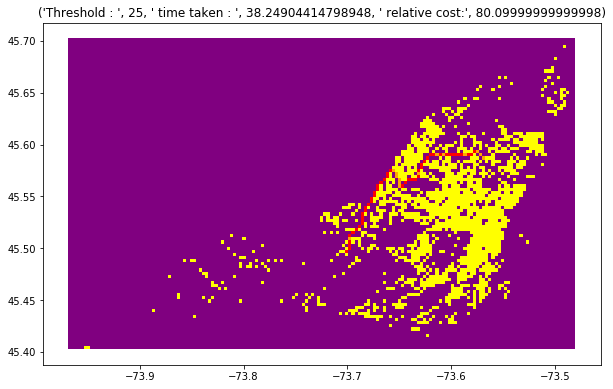

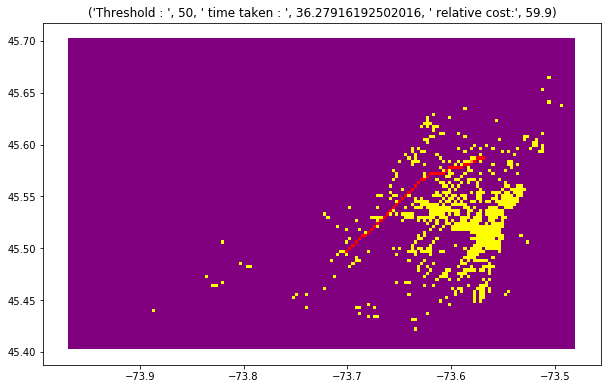

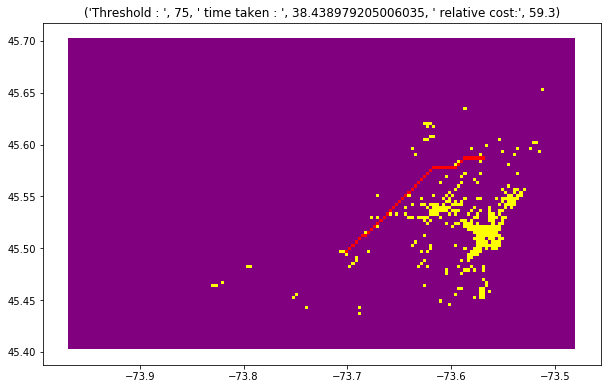

In [453]:
plotPathBonus(path1bB, path2bB, path3bB, path1bTimeB, path2bTimeB, path3bTimeB)

Comparing the two heuristics for both datasets:

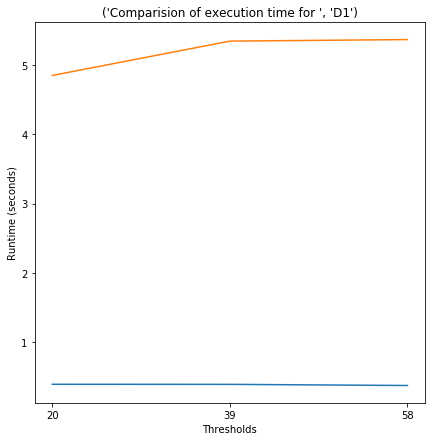

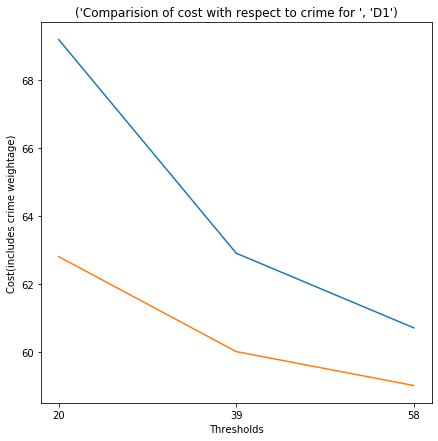

In [457]:
def compare(datasetName, thresholds, time1, cost1, time2, cost2):
    fig1,ax = plt.subplots(figsize = (7,7))
    ax.set_title(("Comparision of execution time for ",datasetName))
    plt.plot(thresholds,time1,label="A*")
    plt.plot(thresholds,time2,label="Djikstra")
    plt.xlabel("Thresholds")
    plt.ylabel("Runtime (seconds)")
    plt.xticks(thresholds)
    fig2,ax = plt.subplots(figsize = (7,7))
    ax.set_title(("Comparision of cost with respect to crime for ",datasetName))
    plt.plot(thresholds,cost1,label="A*")
    plt.plot(thresholds,cost2,label="Djikstra")
    plt.xlabel("Thresholds")
    plt.ylabel("Cost(includes crime weightage)")
    plt.xticks(thresholds)
    
compare("D1",[thresh1,thresh2,thresh3],[path1LowCrimeTime, path2Time, path3Time],[path1LowCrimeWeightage[0],path2[0],path3[0]],[path1bTime,path2bTime,path3bTime],[path1b[0],path2b[0],path3b[0]])
    

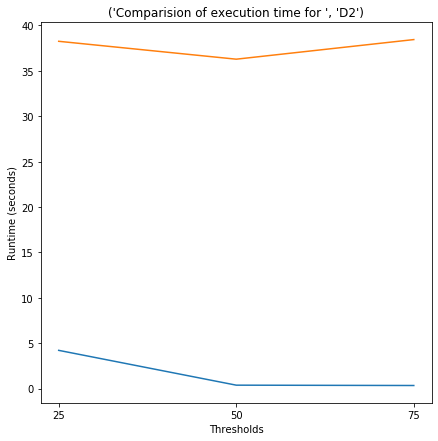

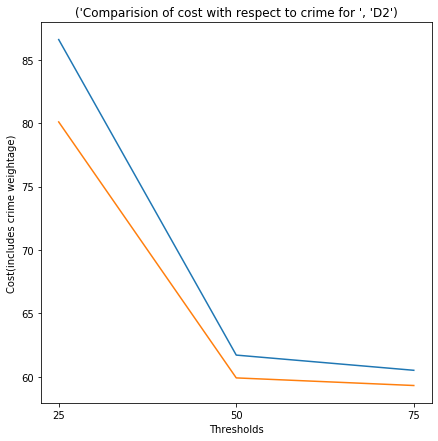

In [458]:
compare("D2",[thresh1b,thresh2b,thresh3b],[path1TimeB, path2TimeB, path3TimeB],[path1B[0],path2B[0],path3B[0]],[path1bTimeB,path2bTimeB,path3bTimeB],[path1bB[0],path2bB[0],path3bB[0]])


In [459]:
thresh1, thresh2, thresh3

(20.0, 39.0, 58.0)